In [3]:
!pip install catboost --user

Looking in indexes: https://cicd-jfrog.telkomsel.co.id/artifactory/api/pypi/tsel-python-remote/simple, https://cicd-jfrog.telkomsel.co.id/artifactory/api/pypi/tsel-python-local/simple


In [5]:
!pip install scikit-learn --user

Looking in indexes: https://cicd-jfrog.telkomsel.co.id/artifactory/api/pypi/tsel-python-remote/simple, https://cicd-jfrog.telkomsel.co.id/artifactory/api/pypi/tsel-python-local/simple


In [11]:
!pip install lightgbm --user

Looking in indexes: https://cicd-jfrog.telkomsel.co.id/artifactory/api/pypi/tsel-python-remote/simple, https://cicd-jfrog.telkomsel.co.id/artifactory/api/pypi/tsel-python-local/simple
     |████████████████████████████████| 3.1 MB 4.4 MB/s eta 0:00:01


In [34]:
!pip install seaborn

Looking in indexes: https://cicd-jfrog.telkomsel.co.id/artifactory/api/pypi/tsel-python-remote/simple, https://cicd-jfrog.telkomsel.co.id/artifactory/api/pypi/tsel-python-local/simple
     |████████████████████████████████| 292 kB 17.0 MB/s eta 0:00:01


# Data Load and Preprocessing

In [10]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder

def preprocess_ibm_telco(file_path):
    """
    Preprocess the IBM Telco Customer Churn dataset
    Source: IBM Sample Data Sets
    """
    # Load data
    data = pd.read_csv(file_path)

    # Remove customer ID
    data.drop(columns=['customerID'], inplace=True)

    # Handle TotalCharges column
    data['TotalCharges'] = pd.to_numeric(data['TotalCharges'], errors='coerce')
    data['TotalCharges'].fillna(data['TotalCharges'].median(), inplace=True)

    # Encode Churn column using LabelEncoder
    le = LabelEncoder()
    data['Churn'] = le.fit_transform(data['Churn'])

    # Get features except Churn
    features = data.drop('Churn', axis=1)

    # Encode other categorical variables
    features_encoded = pd.get_dummies(features, drop_first=True)

    # Scale numeric features
    scaler = StandardScaler()
    numeric_columns = ['SeniorCitizen', 'tenure', 'MonthlyCharges', 'TotalCharges']
    features_encoded[numeric_columns] = scaler.fit_transform(features_encoded[numeric_columns])

    # Add back the encoded Churn column
    features_encoded['Churn'] = data['Churn']

    return features_encoded

def preprocess_kaggle_telco(file_path):
    """
    Preprocess the Kaggle Telco Customer Churn dataset
    Source: Kaggle
    """
    # Load data
    data = pd.read_csv(file_path)

    # Remove unnecessary columns
    data.drop(columns=['state', 'area_code'], inplace=True)

    # Encode churn using LabelEncoder
    le = LabelEncoder()
    data['churn'] = le.fit_transform(data['churn'])

    # Encode other categorical variables
    categorical_mapping = {'yes': 1, 'no': 0}
    data['international_plan'] = data['international_plan'].map(categorical_mapping)
    data['voice_mail_plan'] = data['voice_mail_plan'].map(categorical_mapping)

    # Scale numeric features
    numeric_features = [
        'account_length', 'number_vmail_messages', 'total_day_minutes',
        'total_day_calls', 'total_day_charge', 'total_eve_minutes',
        'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
        'total_night_calls', 'total_night_charge', 'total_intl_minutes',
        'total_intl_calls', 'total_intl_charge', 'number_customer_service_calls'
    ]

    scaler = StandardScaler()
    data[numeric_features] = scaler.fit_transform(data[numeric_features])

    return data

def preprocess_cell2cell(file_path):
    # Load data
    data = pd.read_csv(file_path)

    # Get original class distribution ratio before any preprocessing
    original_ratio = data['Churn'].value_counts(normalize=True)

    # Drop kolom yang tidak diperlukan
    data.drop(columns=['CustomerID', 'ServiceArea'], inplace=True)

    # Encode target (Churn)
    data['Churn'] = LabelEncoder().fit_transform(data['Churn'])

    # Handle missing values untuk kolom numerik dengan mean
    numeric_cols = [
        'MonthlyRevenue', 'MonthlyMinutes', 'TotalRecurringCharge',
        'DirectorAssistedCalls', 'OverageMinutes', 'RoamingCalls',
        'PercChangeMinutes', 'PercChangeRevenues', 'Handsets',
        'HandsetModels', 'CurrentEquipmentDays', 'AgeHH1', 'AgeHH2'
    ]
    for col in numeric_cols:
        data[col].fillna(data[col].mean(), inplace=True)

    # Handle missing values untuk kolom kategorikal dengan mode
    categorical_cols = data.select_dtypes(include=['object']).columns.tolist()
    for col in categorical_cols:
        data[col].fillna(data[col].mode()[0], inplace=True)

    # Konversi HandsetPrice ke numerik
    data['HandsetPrice'] = pd.to_numeric(data['HandsetPrice'], errors='coerce')
    data['HandsetPrice'].fillna(data['HandsetPrice'].mean(), inplace=True)

    # Ordinal encoding untuk CreditRating
    credit_rating_mapping = {
        '2-High': 2,
        '3-Good': 3,
        '4-Medium': 4,
        '5-Low': 5,
        '6-VeryLow': 6,
        '7-Lowest': 7
    }
    data['CreditRating'] = data['CreditRating'].map(credit_rating_mapping)
    data['CreditRating'].fillna(data['CreditRating'].median(), inplace=True)

    # Pastikan tidak ada kolom kategorikal yang tersisa selain yang sudah diencode
    categorical_cols = data.select_dtypes(include=['object']).columns.tolist()

    # One-Hot Encoding
    data = pd.get_dummies(data, columns=categorical_cols, drop_first=True)

    # Scaling untuk fitur numerik
    scaler = StandardScaler()
    numeric_cols += ['HandsetPrice', 'CreditRating']
    data[numeric_cols] = scaler.fit_transform(data[numeric_cols])

    # # Stratified sampling dengan mempertahankan rasio original
    # from sklearn.model_selection import StratifiedShuffleSplit

    # sss = StratifiedShuffleSplit(n_splits=1, test_size=None, train_size=10000, random_state=42)

    # # Mendapatkan indeks untuk sampling
    # for idx, _ in sss.split(data, data['Churn']):
    #     sampled_data = data.iloc[idx]

    # # Verifikasi rasio setelah sampling
    # new_ratio = sampled_data['Churn'].value_counts(normalize=True)
    # print("Original ratio:", original_ratio)
    # print("New ratio after sampling:", new_ratio)

    return data

def main():
    # File paths
    ibm_telco_path = 'WA_Fn-UseC_-Telco-Customer-Churn 3.csv'
    kaggle_telco_path = 'train (6).csv'
    cell2cell_path = 'cell2celltrain.csv'

    # Process all datasets
    ibm_telco_df = preprocess_ibm_telco(ibm_telco_path)
    kaggle_telco_df = preprocess_kaggle_telco(kaggle_telco_path)
    cell2cell_df = preprocess_cell2cell(cell2cell_path)

    return ibm_telco_df, kaggle_telco_df, cell2cell_df

if __name__ == "__main__":
    ibm_df, kaggle_df, cell2cell_df = main()

### **Parameterized LESTARI for Experiment**

In [11]:
import numpy as np
import pandas as pd
import warnings
from itertools import combinations
import random

# Sklearn imports
from sklearn.base import BaseEstimator, ClassifierMixin, clone
from sklearn.utils.validation import check_X_y, check_array, check_is_fitted
from sklearn.utils.multiclass import unique_labels
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.model_selection import StratifiedKFold, cross_val_predict, train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, StackingClassifier, VotingClassifier
from sklearn.naive_bayes import GaussianNB

# Other ML libraries
from lightgbm import LGBMClassifier, LGBMRegressor
from catboost import CatBoostClassifier

# Suppress warnings
warnings.filterwarnings('ignore')

class LestariClassifier(BaseEstimator):
    """
    Modified Lestari Ensemble Classifier with configurable components for experimentation.
    """
    _estimator_type = "classifier"

    def __init__(self,
                 estimators,
                 final_model=None,
                 weight_model=None,
                 weight_method='original',
                 weight_meta_features='original',
                 final_meta_features='original'):

        # Initialize parameters
        self.estimators = estimators
        self.final_model = final_model
        self.weight_model = weight_model
        self.weight_method = weight_method
        self.weight_meta_features = weight_meta_features
        self.final_meta_features = final_meta_features

    def _validate_init(self):
        """Initialize and validate components after fit is called"""
        if self.final_model is None:
            self.final_model_ = LogisticRegression(max_iter=1000, random_state=42)
        else:
            self.final_model_ = clone(self.final_model)

        if self.weight_model is None:
            self.weight_model_ = LinearRegression()
        else:
            self.weight_model_ = clone(self.weight_model)

        self.weight_models_ = [clone(self.weight_model_) for _ in self.estimators]
        self.cv_ = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

        # Define weight calculation methods
        self.weight_methods_ = {
            'original': lambda error, total: (total[:, np.newaxis] - error) / total[:, np.newaxis],
            'inverse': lambda error, total: 1 / (error + 1e-10),
            'exp_decay': lambda error, total: np.exp(-error),
            'softmax': lambda error, total: np.exp(-error / 0.5)
        }

        self.weight_meta_feature_methods_ = {
            'original': lambda X, base_preds: X,
            'proba_only': lambda X, base_preds: base_preds,
            'combined': lambda X, base_preds: np.hstack([X, base_preds]),
            'with_stats': lambda X, base_preds: np.hstack([
                X, base_preds,
                np.mean(base_preds, axis=1, keepdims=True),
                np.std(base_preds, axis=1, keepdims=True)
            ]),
            'with_entropy': lambda X, base_preds: np.hstack([
                X, base_preds,
                -np.sum(base_preds * np.log(base_preds + 1e-10), axis=1, keepdims=True)
            ])
        }

        self.final_meta_feature_methods_ = {
            'original': lambda pred, weight: [pred, 0.5 + (pred - 0.5) * (2 * weight)],
            'linear': lambda pred, weight: [pred, weight, pred * weight],
            'nonlinear': lambda pred, weight: [
                pred, weight,
                np.log(pred + 1e-10) * weight,
                np.power(pred, 2) * weight
            ],
            'interactions': lambda pred, weight, all_preds: [
                pred, weight, pred * weight
            ] + [pred * other_pred * weight for other_pred in all_preds
                 if not np.array_equal(pred, other_pred)]
        }

    def _calculate_weights(self, error_train, total_error_train):
        """Calculate weights using selected method"""
        weights = self.weight_methods_[self.weight_method](error_train, total_error_train)
        weights_sum = np.sum(weights, axis=1, keepdims=True)
        weights_sum[weights_sum == 0] = 1e-10
        return weights / weights_sum

    def _create_weight_meta_features(self, X, base_preds):
        """Create meta features for weight prediction"""
        return self.weight_meta_feature_methods_[self.weight_meta_features](X, base_preds)

    def _create_final_meta_features(self, base_preds, weights):
        """Create meta features for final model"""
        meta_features = []
        for i in range(len(self.estimators)):
            pred = base_preds[:, i]
            weight = weights[:, i]

            if self.final_meta_features == 'interactions':
                features = self.final_meta_feature_methods_[self.final_meta_features](
                    pred, weight, [base_preds[:, j] for j in range(base_preds.shape[1])]
                )
            else:
                features = self.final_meta_feature_methods_[self.final_meta_features](pred, weight)

            meta_features.extend(features)

        return np.column_stack(meta_features)

    def fit(self, X, y):
        """Fit the Lestari ensemble classifier."""
        # Input validation
        X, y = check_X_y(X, y)
        self.classes_ = unique_labels(y)

        if len(self.classes_) != 2:
            raise ValueError("LestariClassifier only supports binary classification")

        # Initialize components
        self._validate_init()

        # Get cross-validated predictions
        base_preds_cv = []
        for name, model in self.estimators:
            cloned_model = clone(model)
            if hasattr(cloned_model, "predict_proba"):
                pred = cross_val_predict(cloned_model, X, y, cv=self.cv_, method='predict_proba')[:, 1]
            else:
                pred = cross_val_predict(cloned_model, X, y, cv=self.cv_, method='predict')
                pred = np.eye(len(self.classes_))[pred][:, 1]
            base_preds_cv.append(pred)
        base_preds_cv = np.column_stack(base_preds_cv)

        # Calculate errors and weights
        error_train = np.abs(y[:, np.newaxis] - base_preds_cv)
        total_error_train = np.sum(error_train, axis=1)
        total_error_train[total_error_train == 0] = 1e-10

        self.weights_train_ = self._calculate_weights(error_train, total_error_train)

        # Train weight models
        weight_meta_features = self._create_weight_meta_features(X, base_preds_cv)
        for i, weight_model in enumerate(self.weight_models_):
            weight_model.fit(weight_meta_features, self.weights_train_[:, i])

        # Fit base estimators
        self.fitted_estimators_ = []
        for name, model in self.estimators:
            fitted_model = clone(model).fit(X, y)
            self.fitted_estimators_.append((name, fitted_model))

        # Create and fit final model
        X_final = self._create_final_meta_features(base_preds_cv, self.weights_train_)
        self.final_model_.fit(X_final, y)

        self.is_fitted_ = True
        return self

    def predict_proba(self, X):
        """Predict class probabilities"""
        # Check if fit has been called
        check_is_fitted(self, 'is_fitted_')

        # Input validation
        X = check_array(X)

        # Get base predictions
        base_preds = []
        for name, model in self.fitted_estimators_:
            if hasattr(model, "predict_proba"):
                pred = model.predict_proba(X)[:, 1]
            else:
                pred = model.predict(X)
                pred = np.eye(len(self.classes_))[pred][:, 1]
            base_preds.append(pred)
        base_preds = np.column_stack(base_preds)

        # Predict weights
        weight_meta_features = self._create_weight_meta_features(X, base_preds)
        weights = []
        for weight_model in self.weight_models_:
            weight = weight_model.predict(weight_meta_features)
            weights.append(weight)
        weights = np.column_stack(weights)

        # Normalize weights
        weights_sum = np.sum(weights, axis=1, keepdims=True)
        weights_sum[weights_sum == 0] = 1e-10
        weights = weights / weights_sum

        # Create final meta features and predict
        X_final = self._create_final_meta_features(base_preds, weights)
        probas = self.final_model_.predict_proba(X_final)

        # Ensure we're returning probabilities for both classes
        if probas.shape[1] == 1:
            return np.hstack([1 - probas, probas])
        return probas

    def predict(self, X):
        """Predict classes"""
        probas = self.predict_proba(X)
        return self.classes_[np.argmax(probas, axis=1)]

### Run All Model Pairs and Parameter Combinations

In [3]:
import pandas as pd
import numpy as np
from datetime import datetime
import os
import sys
import json
import time
import warnings
import shutil
from itertools import combinations, product
from sklearn.base import clone
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import (RandomForestClassifier, VotingClassifier, StackingClassifier,
                           ExtraTreesClassifier, AdaBoostClassifier)
from lightgbm import LGBMClassifier, LGBMRegressor
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score, roc_auc_score)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import SGDClassifier, RidgeClassifier
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from tqdm import tqdm
import logging

# Suppress all output
os.environ['LIGHTGBM_VERBOSE'] = '-1'
os.environ['PYTHONWARNINGS'] = 'ignore'
warnings.filterwarnings('ignore')
logging.getLogger('lightgbm').disabled = True
logging.getLogger('lightgbm').propagate = False

def setup_logging(log_dir="logs"):
    if not os.path.exists(log_dir):
        os.makedirs(log_dir)
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    log_file = os.path.join(log_dir, f"experiment_log_{timestamp}.txt")
    return log_file

def count_lestari_combinations(lestari_params):
    total = 1
    for param_values in lestari_params.values():
        total *= len(param_values)
    return total

def log_message(log_file, message, level="INFO"):
    with open(log_file, 'a') as f:
        timestamp = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
        f.write(f"[{timestamp}] [{level}] {message}\n")

def format_time(seconds):
    hours = int(seconds // 3600)
    minutes = int((seconds % 3600) // 60)
    seconds = int(seconds % 60)
    return f"{hours:02d}:{minutes:02d}:{seconds:02d}"

if __name__ == "__main__":
    # Set up logging
    log_file = setup_logging()
    start_time_total = time.time()

    # Define base models with optimized parameters
    models = {
        'LR': LogisticRegression(max_iter=100, random_state=42),
        'DT': DecisionTreeClassifier(max_depth=3, random_state=42),
        'NB': GaussianNB(),
        'LDA': LinearDiscriminantAnalysis(),
        'LGBM': LGBMClassifier(
            n_estimators=50, max_depth=3, random_state=42,
            verbose=-1, silent=True, force_row_wise=True, deterministic=True
        ),
        'RF': RandomForestClassifier(n_estimators=50, max_depth=3, random_state=42),
        'SGD': SGDClassifier(penalty='l2', alpha=0.0001, max_iter=100, random_state=42),
        'LinearSVC': LinearSVC(
            penalty='l2', loss='squared_hinge', dual=False,
            random_state=42, max_iter=100
        ),
        'Ridge': RidgeClassifier(random_state=42),
        'ET': ExtraTreesClassifier(n_estimators=50, max_depth=3, random_state=42),
        'AdaBoost': AdaBoostClassifier(n_estimators=50, random_state=42)
    }

    # Define Lestari parameter combinations
    lestari_params = {
        'weight_method': ['original', 'inverse', 'exp_decay', 'softmax'],
        'weight_meta_features': ['original', 'proba_only', 'combined', 'with_stats', 'with_entropy'],
        'final_meta_features': ['original', 'linear', 'nonlinear', 'interactions'],
        'weight_model': [LinearRegression(), LGBMRegressor()],
        'final_model': [LogisticRegression(), GaussianNB()]
    }

    # Calculate total combinations
    total_param_combinations = count_lestari_combinations(lestari_params)
    model_pairs = list(combinations(models.keys(), 2))
    estimator_pairs = {f'{m1}_{m2}': (models[m1], models[m2]) for m1, m2 in model_pairs}

    # Setup datasets
    datasets = [
        {
            'name': 'Kaggle Telco',
            'data': kaggle_df,
            'target_column': 'churn',
            'drop_columns': ['churn']
        }
    ]

    # Log experiment setup
    log_message(log_file, "Experiment Configuration:")
    log_message(log_file, f"Total base models: {len(models)}")
    log_message(log_file, f"Total model pairs: {len(model_pairs)}")
    log_message(log_file, f"Lestari combinations per pair: {total_param_combinations}")
    log_message(log_file, f"Standard ensembles per pair: 3 (Voting, Stacking-LR, Stacking-GNB)")
    log_message(log_file, "Starting experiment...\n")

    # Store results
    all_results = {}

    # Main experiment loop
    for dataset in datasets:
        try:
            log_message(log_file, f"\nProcessing dataset: {dataset['name']}")
            dataset_start_time = time.time()

            # Data preparation
            X = dataset['data'].drop(columns=dataset['drop_columns'])
            y = dataset['data'][dataset['target_column']]

            if y.dtype == 'object':
                le = LabelEncoder()
                y = le.fit_transform(y)

            X_train, X_test, y_train, y_test = train_test_split(
                X, y, test_size=0.25, random_state=41, stratify=y
            )

            results = []

            # Base models
            log_message(log_file, "\nTraining base models...")
            with tqdm(total=len(models), desc="Base Models") as base_pbar:
                for model_name, model in models.items():
                    model_start = time.time()
                    log_message(log_file, f"Training {model_name}")
                    
                    cloned_model = clone(model)
                    cloned_model.fit(X_train, y_train)
                    train_time = time.time() - model_start

                    y_pred = cloned_model.predict(X_test)
                    y_proba = cloned_model.predict_proba(X_test)[:, 1] if hasattr(cloned_model, "predict_proba") else None

                    metrics = {
                        'model': model_name,
                        'model_type': 'base',
                        'accuracy': accuracy_score(y_test, y_pred),
                        'precision': precision_score(y_test, y_pred, pos_label=1),
                        'recall': recall_score(y_test, y_pred, pos_label=1),
                        'f1_score': f1_score(y_test, y_pred),
                        'auc': roc_auc_score(y_test, y_proba) if y_proba is not None else np.nan,
                        'training_time': train_time,
                        'weight_method': 'NA',
                        'weight_meta_features': 'NA',
                        'final_meta_features': 'NA',
                        'weight_model': 'NA',
                        'final_model': 'NA'
                    }
                    results.append(metrics)
                    log_message(log_file, f"Completed {model_name} - Time: {train_time:.2f}s")
                    base_pbar.update(1)

            # Model pairs and ensembles
            log_message(log_file, "\nTraining ensemble models...")
            total_pair_iterations = len(model_pairs) * (total_param_combinations + 3)  # Lestari + Voting + 2 Stacking
            
            with tqdm(total=total_pair_iterations, desc="Ensemble Models") as pair_pbar:
                for pair_name, (model1, model2) in estimator_pairs.items():
                    pair_start = time.time()
                    model1_name = type(model1).__name__
                    model2_name = type(model2).__name__
                    has_predict_proba = all(hasattr(model, "predict_proba") for model in [model1, model2])

                    log_message(log_file, f"\nProcessing pair: {pair_name}")
                    
                    # Lestari configurations
                    log_message(log_file, "Training Lestari configurations...")
                    param_combinations = list(product(*lestari_params.values()))
                    
                    for idx, params in enumerate(param_combinations, 1):
                        weight_method, weight_meta_features, final_meta_features, weight_model, final_model = params
                        config_start = time.time()
                        
                        config_desc = (
                            f"Config {idx}/{total_param_combinations}: "
                            f"method={weight_method}, "
                            f"meta={weight_meta_features}, "
                            f"final={final_meta_features}, "
                            f"weight={type(weight_model).__name__}, "
                            f"final={type(final_model).__name__}"
                        )
                        log_message(log_file, f"Training {config_desc}")

                        try:
                            lestari = LestariClassifier(
                                estimators=[(model1_name, model1), (model2_name, model2)],
                                final_model=clone(final_model),
                                weight_model=clone(weight_model),
                                weight_method=weight_method,
                                weight_meta_features=weight_meta_features,
                                final_meta_features=final_meta_features
                            )

                            lestari.fit(X_train, y_train)
                            train_time = time.time() - config_start

                            y_pred = lestari.predict(X_test)
                            y_proba = lestari.predict_proba(X_test)[:, 1] if has_predict_proba else None

                            metrics = {
                                'model': f'Lestari ({pair_name})',
                                'model_type': 'lestari',
                                'accuracy': accuracy_score(y_test, y_pred),
                                'precision': precision_score(y_test, y_pred, pos_label=1),
                                'recall': recall_score(y_test, y_pred, pos_label=1),
                                'f1_score': f1_score(y_test, y_pred),
                                'auc': roc_auc_score(y_test, y_proba) if y_proba is not None else np.nan,
                                'training_time': train_time,
                                'weight_method': weight_method,
                                'weight_meta_features': weight_meta_features,
                                'final_meta_features': final_meta_features,
                                'weight_model': type(weight_model).__name__,
                                'final_model': type(final_model).__name__
                            }
                            results.append(metrics)
                            log_message(log_file, f"Completed config in {train_time:.2f}s")

                        except Exception as e:
                            log_message(log_file, f"Error in config: {str(e)}", level="ERROR")
                        
                        pair_pbar.update(1)

                    # Standard ensembles
                    log_message(log_file, "Training standard ensembles...")
                    try:
                        # Voting
                        ensemble_start = time.time()
                        voting = VotingClassifier(
                            estimators=[(model1_name, clone(model1)), (model2_name, clone(model2))],
                            voting='soft' if has_predict_proba else 'hard'
                        )
                        voting.fit(X_train, y_train)
                        train_time = time.time() - ensemble_start

                        y_pred = voting.predict(X_test)
                        y_proba = voting.predict_proba(X_test)[:, 1] if has_predict_proba else None

                        metrics = {
                            'model': f'Voting ({pair_name})',
                            'model_type': 'voting',
                            'accuracy': accuracy_score(y_test, y_pred),
                            'precision': precision_score(y_test, y_pred, pos_label=1),
                            'recall': recall_score(y_test, y_pred, pos_label=1),
                            'f1_score': f1_score(y_test, y_pred),
                            'auc': roc_auc_score(y_test, y_proba) if y_proba is not None else np.nan,
                            'training_time': train_time,
                            'weight_method': 'NA',
                            'weight_meta_features': 'NA',
                            'final_meta_features': 'NA',
                            'weight_model': 'NA',
                            'final_model': 'NA'
                        }
                        results.append(metrics)
                        log_message(log_file, f"Completed Voting in {train_time:.2f}s")
                        pair_pbar.update(1)

                        # Stacking with LR
                        ensemble_start = time.time()
                        stacking = StackingClassifier(
                            estimators=[(model1_name, clone(model1)), (model2_name, clone(model2))],
                            final_estimator=LogisticRegression(),
                            cv=5
                        )
                        stacking.fit(X_train, y_train)
                        train_time = time.time() - ensemble_start

                        y_pred = stacking.predict(X_test)
                        y_proba = stacking.predict_proba(X_test)[:, 1] if has_predict_proba else None

                        metrics = {
                            'model': f'Stacking-LR ({pair_name})',
                            'model_type': 'stacking',
                            'accuracy': accuracy_score(y_test, y_pred),
                            'precision': precision_score(y_test, y_pred, pos_label=1),
                            'recall': recall_score(y_test, y_pred, pos_label=1),
                            'f1_score': f1_score(y_test, y_pred),
                            'auc': roc_auc_score(y_test, y_proba) if y_proba is not None else np.nan,
                            'training_time': train_time,
                            'weight_method': 'NA',
                            'weight_meta_features': 'NA',
                            'final_meta_features': 'NA',
                            'weight_model': 'NA',
                            'final_model': 'NA'
                        }
                        results.append(metrics)
                        log_message(log_file, f"Completed Stacking-LR in {train_time:.2f}s")
                        pair_pbar.update(1)

                        # Stacking with GNB
                        ensemble_start = time.time()
                        stacking_gnb = StackingClassifier(
                            estimators=[(model1_name, clone(model1)), (model2_name, clone(model2))],
                            final_estimator=GaussianNB(),
                            cv=5
                        )
                        stacking_gnb.fit(X_train, y_train)
                        train_time = time.time() - ensemble_start

                        y_pred = stacking_gnb.predict(X_test)
                        y_proba = stacking_gnb.predict_proba(X_test)[:, 1] if has_predict_proba else None

                        metrics = {
                            'model': f'Stacking-GNB ({pair_name})',
                            'model_type': 'stacking',
                            'accuracy': accuracy_score(y_test, y_pred),
                            'precision': precision_score(y_test, y_pred, pos_label=1),
                            'recall': recall_score(y_test, y_pred, pos_label=1),
                            'f1_score': f1_score(y_test, y_pred),
                            'auc': roc_auc_score(y_test, y_proba) if y_proba is not None else np.nan,
                            'training_time': train_time,
                            'weight_method': 'NA',
                            'weight_meta_features': 'NA',
                            'final_meta_features': 'NA',
                            'weight_model': 'NA',
                            'final_model': 'NA'
                        }
                        results.append(metrics)
                        log_message(log_file, f"Completed Stacking-GNB in {train_time:.2f}s")
                        pair_pbar.update(1)

                    except Exception as e:
                        log_message(log_file, f"Error in standard ensembles: {str(e)}", level="ERROR")

                    pair_time = time.time() - pair_start
                    log_message(log_file, f"Completed pair {pair_name} in {pair_time:.2f}s")

            # Save results
            results_df = pd.DataFrame(results)
            all_results[dataset['name']] = results_df

            # Create output directory
            output_dir = "results_new"
            if not os.path.exists(output_dir):
                os.makedirs(output_dir)

            # Save results
            timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
            output_file = os.path.join(output_dir, f"results_{dataset['name']}_{timestamp}.csv")
            results_df.to_csv(output_file, index=False)

            # Save analysis
            analysis_file = os.path.join(output_dir, f"analysis_{dataset['name']}_{timestamp}.txt")
            with open(analysis_file, 'w') as f:
                f.write(f"Analysis for {dataset['name']} Dataset\n")
                f.write(f"Timestamp: {timestamp}\n")
                f.write("-" * 50 + "\n\n")

                # Dataset statistics
                f.write("Dataset Statistics:\n")
                f.write(f"Total samples: {len(X)}\n")
                f.write(f"Features: {X.shape[1]}\n")
                f.write(f"Class distribution:\n{pd.Series(y).value_counts().to_string()}\n\n")

                # Model performance summary
                metrics = ['accuracy', 'precision', 'recall', 'f1_score', 'auc']
                f.write("Model Performance Summary:\n")
                summary_stats = results_df.groupby('model_type')[metrics].agg(['mean', 'std', 'min', 'max'])
                f.write(summary_stats.to_string())
                f.write("\n\n")

                # Best configurations
                f.write("Best Configurations:\n")
                for metric in metrics:
                    f.write(f"\nBest {metric}:\n")
                    best_idx = results_df[metric].idxmax()
                    best_row = results_df.loc[best_idx]
                    f.write(f"Model: {best_row['model']}\n")
                    f.write(f"Value: {best_row[metric]:.4f}\n")
                    if best_row['model_type'] == 'lestari':
                        f.write("Configuration:\n")
                        f.write(f"- Weight Method: {best_row['weight_method']}\n")
                        f.write(f"- Weight Meta Features: {best_row['weight_meta_features']}\n")
                        f.write(f"- Final Meta Features: {best_row['final_meta_features']}\n")
                        f.write(f"- Weight Model: {best_row['weight_model']}\n")
                        f.write(f"- Final Model: {best_row['final_model']}\n")

            dataset_time = time.time() - dataset_start_time
            log_message(log_file, f"\nCompleted dataset {dataset['name']} in {format_time(dataset_time)}")
            log_message(log_file, f"Results saved to: {output_file}")
            log_message(log_file, f"Analysis saved to: {analysis_file}")

        except Exception as e:
            log_message(log_file, f"Error processing {dataset['name']}: {str(e)}", level="ERROR")
            continue

    total_time = time.time() - start_time_total
    log_message(log_file, f"\nExperiment completed in {format_time(total_time)}")

Base Models:   0%|          | 0/11 [00:00<?, ?it/s]  File "/home/cdsw/.local/lib/python3.6/site-packages/joblib/externals/loky/backend/context.py", line 222, in _count_physical_cores
    "lscpu --parse=core".split(" "), capture_output=True)
  File "/usr/local/lib/python3.6/subprocess.py", line 423, in run
    with Popen(*popenargs, **kwargs) as process:
Ensemble Models:   0%|          | 2/17765 [00:00<47:04,  6.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 3/17765 [00:01<4:06:10,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001171 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 6/17765 [00:03<2:34:42,  1.91it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001163 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 7/17765 [00:04<3:39:24,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001146 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 10/17765 [00:06<2:34:41,  1.91it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 11/17765 [00:07<3:51:13,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 14/17765 [00:09<2:46:43,  1.77it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001097 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 15/17765 [00:12<5:37:46,  1.14s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.223628 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001048 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 18/17765 [00:14<3:41:10,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 19/17765 [00:16<5:41:04,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.097706 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 22/17765 [00:19<4:10:09,  1.18it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018394 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.101652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 23/17765 [00:20<5:09:47,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 26/17765 [00:21<2:48:18,  1.76it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 27/17765 [00:22<3:36:02,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 30/17765 [00:24<2:15:58,  2.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 31/17765 [00:25<3:01:41,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 34/17765 [00:26<2:33:38,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 35/17765 [00:28<3:55:15,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 38/17765 [00:30<2:41:03,  1.83it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001128 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 39/17765 [00:31<4:16:13,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 42/17765 [00:33<2:50:05,  1.74it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 43/17765 [00:34<3:39:35,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 46/17765 [00:35<2:32:23,  1.94it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 47/17765 [00:37<3:32:24,  1.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 50/17765 [00:38<2:37:40,  1.87it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001582 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 51/17765 [00:40<3:43:43,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 54/17765 [00:41<2:31:35,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 55/17765 [00:42<3:39:38,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 58/17765 [00:44<2:30:38,  1.96it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 59/17765 [00:45<3:35:38,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 62/17765 [00:47<2:35:27,  1.90it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.151515 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 63/17765 [00:49<4:55:47,  1.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 66/17765 [00:51<3:05:30,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 67/17765 [00:52<3:52:05,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 70/17765 [00:53<2:35:04,  1.90it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 71/17765 [00:54<3:30:57,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001716 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 74/17765 [00:56<2:34:28,  1.91it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 75/17765 [00:58<4:34:07,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 78/17765 [01:00<2:52:18,  1.71it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.253560 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 79/17765 [01:01<4:45:17,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 82/17765 [01:03<2:55:22,  1.68it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001102 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 83/17765 [01:04<3:50:55,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 86/17765 [01:06<2:35:38,  1.89it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001060 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   0%|          | 87/17765 [01:07<3:54:34,  1.26it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259583 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001059 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 90/17765 [01:14<6:07:08,  1.25s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 91/17765 [01:15<6:14:13,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001157 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 94/17765 [01:17<3:40:52,  1.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 95/17765 [01:18<4:41:23,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.260676 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 98/17765 [01:20<3:18:12,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 99/17765 [01:21<3:51:10,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 102/17765 [01:23<2:26:12,  2.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 103/17765 [01:24<2:58:03,  1.65it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 106/17765 [01:25<2:08:32,  2.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 107/17765 [01:26<3:00:10,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 110/17765 [01:28<2:23:19,  2.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 111/17765 [01:28<2:58:58,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 114/17765 [01:30<2:09:59,  2.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001138 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 115/17765 [01:31<3:37:56,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 118/17765 [01:33<2:43:02,  1.80it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 119/17765 [01:34<3:37:41,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 122/17765 [01:36<2:34:03,  1.91it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 123/17765 [01:37<3:49:28,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 126/17765 [01:39<2:37:51,  1.86it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001117 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 127/17765 [01:40<3:35:44,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 130/17765 [01:41<2:28:28,  1.98it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 131/17765 [01:43<3:47:23,  1.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 134/17765 [01:44<2:32:43,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 135/17765 [01:46<3:59:56,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001551 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 138/17765 [01:48<3:14:12,  1.51it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.130120 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 139/17765 [01:51<7:01:17,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 142/17765 [01:53<3:43:27,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 143/17765 [01:54<4:25:24,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 146/17765 [01:56<2:46:31,  1.76it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 147/17765 [01:57<4:02:02,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 150/17765 [01:59<2:49:15,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 151/17765 [02:00<3:45:03,  1.30it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.256561 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 154/17765 [02:03<3:22:39,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 155/17765 [02:04<4:18:00,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 158/17765 [02:06<2:45:21,  1.77it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 159/17765 [02:07<3:48:27,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.456403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.543597


Ensemble Models:   1%|          | 162/17765 [02:09<2:39:22,  1.84it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 163/17765 [02:10<3:35:05,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 166/17765 [02:11<2:29:52,  1.96it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 167/17765 [02:13<3:53:39,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 170/17765 [02:14<2:34:42,  1.90it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 171/17765 [02:16<3:52:15,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 174/17765 [02:18<2:47:33,  1.75it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001151 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 175/17765 [02:19<3:41:47,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001129 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001011 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 178/17765 [02:20<2:32:37,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 179/17765 [02:21<2:56:53,  1.66it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 182/17765 [02:22<2:00:31,  2.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 183/17765 [02:24<3:23:02,  1.44it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.055027 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 186/17765 [02:25<2:21:16,  2.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000707 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 187/17765 [02:26<2:56:59,  1.66it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 190/17765 [02:27<2:02:16,  2.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 191/17765 [02:28<3:06:33,  1.57it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 194/17765 [02:29<2:02:11,  2.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002793 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 195/17765 [02:31<3:10:07,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 198/17765 [02:33<2:50:18,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002719 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 199/17765 [02:34<3:43:20,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 202/17765 [02:35<2:26:27,  2.00it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.261573 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 203/17765 [02:38<6:22:44,  1.31s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.248320 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001530 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 206/17765 [02:41<4:19:13,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001700 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 207/17765 [02:43<4:54:25,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 210/17765 [02:44<2:50:06,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 211/17765 [02:45<3:32:29,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002097 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.160786 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 214/17765 [02:47<2:46:33,  1.76it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 215/17765 [02:48<3:39:09,  1.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 218/17765 [02:49<2:27:16,  1.99it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027650 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 219/17765 [02:51<3:35:11,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001631 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|          | 222/17765 [02:52<2:23:20,  2.04it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.248620 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|▏         | 223/17765 [02:54<4:07:42,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001521 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|▏         | 226/17765 [02:55<2:38:51,  1.84it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002530 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|▏         | 227/17765 [02:56<3:29:45,  1.39it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.241687 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|▏         | 230/17765 [02:59<3:06:42,  1.57it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001993 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001673 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|▏         | 231/17765 [03:00<3:49:16,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001738 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001988 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|▏         | 234/17765 [03:02<2:37:19,  1.86it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002610 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|▏         | 235/17765 [03:03<3:27:17,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|▏         | 238/17765 [03:05<2:42:09,  1.80it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001609 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|▏         | 239/17765 [03:06<3:32:18,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488179
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001706 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511821


Ensemble Models:   1%|▏         | 242/17765 [03:07<2:25:02,  2.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   1%|▏         | 243/17765 [03:08<3:19:53,  1.46it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002623 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   1%|▏         | 246/17765 [03:10<2:17:26,  2.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   1%|▏         | 247/17765 [03:11<3:12:45,  1.51it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   1%|▏         | 250/17765 [03:12<2:17:41,  2.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   1%|▏         | 251/17765 [03:13<3:12:54,  1.51it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001147 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   1%|▏         | 254/17765 [03:15<2:14:59,  2.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001588 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   1%|▏         | 255/17765 [03:16<3:22:44,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   1%|▏         | 258/17765 [03:17<2:20:03,  2.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.101657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005115 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   1%|▏         | 259/17765 [03:18<3:09:36,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   1%|▏         | 262/17765 [03:19<2:02:36,  2.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   1%|▏         | 263/17765 [03:21<3:04:41,  1.58it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   1%|▏         | 266/17765 [03:22<2:01:24,  2.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000197 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 267/17765 [03:23<2:45:54,  1.76it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 270/17765 [03:24<2:16:30,  2.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001115 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 271/17765 [03:25<2:56:33,  1.65it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 274/17765 [03:26<2:02:59,  2.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 275/17765 [03:28<3:15:31,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001687 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 278/17765 [03:29<2:26:49,  1.99it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 279/17765 [03:30<3:20:42,  1.45it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.239567 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 282/17765 [03:33<3:01:45,  1.60it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 283/17765 [03:34<3:39:32,  1.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 286/17765 [03:35<2:23:09,  2.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001739 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 287/17765 [03:36<3:22:35,  1.44it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.246557 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 290/17765 [03:44<7:00:09,  1.44s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 291/17765 [03:46<6:44:29,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 294/17765 [03:48<3:57:43,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 295/17765 [03:49<4:19:06,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001704 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 298/17765 [03:50<2:42:34,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 299/17765 [03:51<3:30:26,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 302/17765 [03:53<2:25:54,  1.99it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 303/17765 [03:54<3:11:46,  1.52it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 306/17765 [03:55<2:15:30,  2.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001819 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 307/17765 [03:56<3:24:06,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 310/17765 [03:58<2:30:18,  1.94it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 311/17765 [03:59<3:27:01,  1.41it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.250502 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 314/17765 [04:02<3:15:46,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 315/17765 [04:03<3:51:39,  1.26it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.247551 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 318/17765 [04:05<2:50:15,  1.71it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 319/17765 [04:06<3:45:21,  1.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.477662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.522338


Ensemble Models:   2%|▏         | 325/17765 [04:08<1:30:43,  3.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 326/17765 [04:09<2:36:54,  1.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 329/17765 [04:11<2:04:26,  2.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 330/17765 [04:12<3:03:04,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 333/17765 [04:13<2:13:37,  2.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001035 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 334/17765 [04:14<3:04:43,  1.57it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001127 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 337/17765 [04:16<2:06:30,  2.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001163 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 338/17765 [04:18<4:40:59,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 341/17765 [04:20<3:19:13,  1.46it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.106701 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 342/17765 [04:24<8:24:15,  1.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 345/17765 [04:29<6:15:04,  1.29s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000599 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 346/17765 [04:30<5:43:15,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 349/17765 [04:31<2:59:38,  1.62it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 350/17765 [04:32<3:28:47,  1.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 353/17765 [04:33<2:06:23,  2.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 354/17765 [04:34<3:08:33,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 357/17765 [04:35<2:01:26,  2.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 358/17765 [04:37<3:19:07,  1.46it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 361/17765 [04:39<2:36:11,  1.86it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 362/17765 [04:40<3:34:25,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 365/17765 [04:41<2:21:25,  2.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 366/17765 [04:43<3:55:27,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 369/17765 [04:44<2:25:34,  1.99it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001530 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 370/17765 [04:45<3:28:54,  1.39it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.245551 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 373/17765 [04:48<3:22:56,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 374/17765 [04:49<4:00:43,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 377/17765 [04:51<2:26:49,  1.97it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001819 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 378/17765 [04:52<3:54:38,  1.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 381/17765 [04:54<2:25:57,  1.99it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 382/17765 [04:55<3:23:41,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 385/17765 [04:56<2:19:30,  2.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 386/17765 [04:58<3:35:47,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 389/17765 [05:00<2:41:28,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 390/17765 [05:01<3:39:46,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001685 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 393/17765 [05:02<2:37:31,  1.84it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001677 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 394/17765 [05:04<3:30:41,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001576 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 397/17765 [05:05<2:24:11,  2.01it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.209308 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 398/17765 [05:07<4:22:38,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 401/17765 [05:09<2:41:22,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 402/17765 [05:10<3:57:21,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 405/17765 [05:11<2:30:27,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001160 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 406/17765 [05:13<3:36:55,  1.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 409/17765 [05:14<2:23:04,  2.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 410/17765 [05:15<3:22:50,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001197 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 413/17765 [05:17<2:27:40,  1.96it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249533 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 414/17765 [05:19<4:19:17,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 417/17765 [05:21<2:59:13,  1.61it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 418/17765 [05:22<3:48:54,  1.26it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001061 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 421/17765 [05:23<2:21:58,  2.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.096487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 422/17765 [05:25<3:45:30,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 425/17765 [05:26<2:12:18,  2.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.100669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.101715 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 426/17765 [05:27<3:31:34,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 429/17765 [05:28<2:11:24,  2.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 430/17765 [05:31<6:03:26,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 433/17765 [05:33<3:10:35,  1.52it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103670 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 434/17765 [05:34<4:11:20,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 437/17765 [05:36<2:47:35,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 438/17765 [05:37<3:44:27,  1.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 441/17765 [05:39<2:28:52,  1.94it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249484 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   2%|▏         | 442/17765 [05:41<4:36:36,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   3%|▎         | 445/17765 [05:42<2:43:36,  1.76it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   3%|▎         | 446/17765 [05:43<3:40:55,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   3%|▎         | 449/17765 [05:45<2:23:02,  2.02it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.256574 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   3%|▎         | 450/17765 [05:47<4:18:23,  1.12it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.037206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   3%|▎         | 453/17765 [05:48<2:46:11,  1.74it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001594 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   3%|▎         | 454/17765 [05:49<3:34:08,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   3%|▎         | 457/17765 [05:51<2:27:28,  1.96it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001555 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   3%|▎         | 458/17765 [05:52<3:31:36,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   3%|▎         | 461/17765 [05:54<2:19:17,  2.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   3%|▎         | 462/17765 [05:55<3:17:32,  1.46it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001485 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   3%|▎         | 465/17765 [05:56<2:21:36,  2.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   3%|▎         | 466/17765 [05:58<3:34:23,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   3%|▎         | 469/17765 [05:59<2:25:12,  1.99it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   3%|▎         | 470/17765 [06:00<3:36:48,  1.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   3%|▎         | 473/17765 [06:02<2:41:40,  1.78it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   3%|▎         | 474/17765 [06:04<3:34:38,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   3%|▎         | 477/17765 [06:05<2:25:21,  1.98it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   3%|▎         | 478/17765 [06:06<3:43:59,  1.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   3%|▎         | 481/17765 [06:08<2:33:27,  1.88it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006397 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001648 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   3%|▎         | 482/17765 [06:09<3:26:04,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.350940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.649060


Ensemble Models:   3%|▎         | 485/17765 [06:13<3:58:30,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 486/17765 [06:14<4:22:30,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 489/17765 [06:16<2:36:21,  1.84it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 490/17765 [06:17<3:28:51,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 493/17765 [06:19<2:54:37,  1.65it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 494/17765 [06:20<3:42:30,  1.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 497/17765 [06:22<2:27:23,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001606 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 498/17765 [06:23<3:18:50,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001723 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 501/17765 [06:24<2:06:27,  2.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 502/17765 [06:25<2:37:32,  1.83it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 505/17765 [06:26<1:51:40,  2.58it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 506/17765 [06:27<2:32:14,  1.89it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 509/17765 [06:28<1:56:17,  2.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.091627 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 510/17765 [06:29<2:54:59,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 513/17765 [06:30<1:54:23,  2.51it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 514/17765 [06:31<2:54:33,  1.65it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 517/17765 [06:33<2:02:09,  2.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 518/17765 [06:34<2:58:18,  1.61it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 521/17765 [06:35<2:04:23,  2.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 522/17765 [06:36<3:10:45,  1.51it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 525/17765 [06:38<2:20:42,  2.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 526/17765 [06:39<3:14:19,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 529/17765 [06:40<2:13:10,  2.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 530/17765 [06:42<3:14:25,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 533/17765 [06:43<2:18:44,  2.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 534/17765 [06:44<3:06:13,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002080 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 537/17765 [06:45<2:04:23,  2.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 538/17765 [06:46<3:00:48,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 541/17765 [06:48<2:14:38,  2.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 542/17765 [06:49<3:18:33,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.242520 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 545/17765 [06:51<2:38:52,  1.81it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 546/17765 [06:52<3:43:57,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 549/17765 [06:54<2:17:31,  2.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 550/17765 [06:55<3:05:59,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 553/17765 [06:56<2:09:26,  2.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 554/17765 [06:57<3:15:43,  1.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 557/17765 [06:59<2:22:59,  2.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001706 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 558/17765 [07:00<3:20:20,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 561/17765 [07:02<2:18:23,  2.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001802 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 562/17765 [07:03<3:47:21,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001699 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493542
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.506458


Ensemble Models:   3%|▎         | 565/17765 [07:04<2:18:50,  2.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 566/17765 [07:06<3:18:48,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001608 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 569/17765 [07:07<2:17:12,  2.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 570/17765 [07:08<3:16:10,  1.46it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 573/17765 [07:09<2:07:41,  2.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 574/17765 [07:11<3:06:22,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 577/17765 [07:12<2:04:27,  2.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 578/17765 [07:13<3:13:15,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 581/17765 [07:14<2:04:18,  2.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 582/17765 [07:15<2:37:02,  1.82it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 585/17765 [07:16<1:53:06,  2.53it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 586/17765 [07:18<2:56:03,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 589/17765 [07:19<1:55:13,  2.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 590/17765 [07:19<2:26:28,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 593/17765 [07:21<1:50:11,  2.60it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027734 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 594/17765 [07:22<3:26:38,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.093655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 597/17765 [07:25<2:58:35,  1.60it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 598/17765 [07:26<3:58:41,  1.20it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.235474 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001126 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 601/17765 [07:30<4:07:52,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002045 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 602/17765 [07:31<5:11:47,  1.09s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.254501 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001103 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 605/17765 [07:35<4:29:33,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 606/17765 [07:36<5:10:50,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 609/17765 [07:41<4:51:48,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 610/17765 [07:43<6:16:06,  1.32s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.192122 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001110 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 613/17765 [07:45<3:48:21,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.233907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 614/17765 [07:47<5:41:22,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019065 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 617/17765 [07:49<3:19:43,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 618/17765 [07:50<3:55:35,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   3%|▎         | 621/17765 [07:51<2:26:18,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   4%|▎         | 622/17765 [07:54<5:17:06,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   4%|▎         | 625/17765 [07:56<3:29:37,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   4%|▎         | 626/17765 [07:57<4:10:20,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   4%|▎         | 629/17765 [08:00<3:47:04,  1.26it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.246165 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.037958 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   4%|▎         | 630/17765 [08:03<6:12:57,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   4%|▎         | 633/17765 [08:04<3:09:51,  1.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   4%|▎         | 634/17765 [08:05<3:50:03,  1.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.036184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   4%|▎         | 637/17765 [08:07<2:32:12,  1.88it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   4%|▎         | 638/17765 [08:10<6:36:26,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   4%|▎         | 641/17765 [08:11<3:17:16,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   4%|▎         | 642/17765 [08:13<3:55:04,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512979


Ensemble Models:   4%|▎         | 648/17765 [08:14<1:28:59,  3.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▎         | 649/17765 [08:16<3:14:33,  1.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.068041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▎         | 652/17765 [08:20<3:40:04,  1.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▎         | 653/17765 [08:21<4:08:26,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▎         | 656/17765 [08:23<2:54:32,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001102 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▎         | 657/17765 [08:24<3:34:17,  1.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001581 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▎         | 660/17765 [08:25<2:29:03,  1.91it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001137 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▎         | 661/17765 [08:26<3:28:54,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▎         | 664/17765 [08:28<2:39:11,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.089627 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▎         | 665/17765 [08:30<4:30:39,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.097724 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 668/17765 [08:33<3:31:52,  1.34it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 669/17765 [08:34<3:58:21,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 672/17765 [08:35<2:21:43,  2.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.102493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017233 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 673/17765 [08:37<4:11:04,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.096630 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 676/17765 [08:39<2:53:56,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 677/17765 [08:40<3:46:41,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 680/17765 [08:42<2:44:08,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 681/17765 [08:45<6:47:25,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.037546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001691 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 684/17765 [08:47<3:52:36,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001734 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 685/17765 [08:49<5:06:53,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001751 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 688/17765 [08:52<3:46:10,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 689/17765 [08:53<5:04:41,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 692/17765 [08:56<3:26:07,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001834 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 693/17765 [08:57<4:50:11,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 696/17765 [08:59<3:20:52,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 697/17765 [09:03<6:51:33,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 700/17765 [09:05<4:10:36,  1.13it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.251863 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 701/17765 [09:07<5:28:22,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 704/17765 [09:09<3:31:40,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 705/17765 [09:10<4:29:46,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.127643 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 708/17765 [09:15<4:41:59,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 709/17765 [09:17<6:35:23,  1.39s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.255323 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002778 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 712/17765 [09:19<3:57:53,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 713/17765 [09:21<5:00:38,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 716/17765 [09:24<3:46:16,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 717/17765 [09:25<4:45:43,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 720/17765 [09:27<3:05:36,  1.53it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 721/17765 [09:30<5:49:52,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 724/17765 [09:32<3:35:55,  1.32it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.255538 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 725/17765 [09:35<6:56:40,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.117981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001699 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 728/17765 [09:37<4:14:56,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 729/17765 [09:39<5:17:21,  1.12s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.234589 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 732/17765 [09:41<3:48:37,  1.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 733/17765 [09:43<5:00:26,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 736/17765 [09:45<3:04:39,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 737/17765 [09:47<4:30:00,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 740/17765 [09:48<2:58:18,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002631 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004686 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 741/17765 [09:50<4:38:27,  1.02it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.238395 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 744/17765 [09:54<4:13:47,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.100634 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103656 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 745/17765 [09:57<7:34:45,  1.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 748/17765 [09:59<3:59:43,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 749/17765 [10:00<4:14:27,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.093449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 752/17765 [10:04<4:49:30,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 753/17765 [10:06<5:04:06,  1.07s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 756/17765 [10:07<2:54:22,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 757/17765 [10:08<3:36:01,  1.31it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 760/17765 [10:09<2:14:07,  2.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 761/17765 [10:11<3:18:05,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001722 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 764/17765 [10:12<2:20:10,  2.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 765/17765 [10:13<3:26:10,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 768/17765 [10:15<2:18:56,  2.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 769/17765 [10:16<3:27:55,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 772/17765 [10:18<2:32:58,  1.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 773/17765 [10:19<3:25:08,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001720 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 776/17765 [10:22<3:03:32,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 777/17765 [10:23<4:01:57,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 780/17765 [10:24<2:34:04,  1.84it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001671 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 781/17765 [10:26<3:40:37,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 784/17765 [10:27<2:30:06,  1.89it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 785/17765 [10:29<3:33:31,  1.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001791 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002046 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 788/17765 [10:30<2:33:21,  1.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 789/17765 [10:32<3:32:36,  1.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 792/17765 [10:33<2:32:56,  1.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 793/17765 [10:34<3:28:55,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001822 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001593 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 796/17765 [10:37<2:49:58,  1.66it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   4%|▍         | 797/17765 [10:38<3:57:34,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   5%|▍         | 800/17765 [10:39<2:31:11,  1.87it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008705 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   5%|▍         | 801/17765 [10:41<3:25:32,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001773 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001628 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   5%|▍         | 804/17765 [10:42<2:18:15,  2.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002952 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   5%|▍         | 805/17765 [10:44<3:48:40,  1.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.057580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.463745
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.536255


Ensemble Models:   5%|▍         | 808/17765 [10:45<2:43:40,  1.73it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.242099 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001070 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 809/17765 [10:48<5:00:34,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 812/17765 [10:49<2:50:24,  1.66it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 813/17765 [10:50<3:45:28,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001190 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 816/17765 [10:52<2:24:49,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 817/17765 [10:53<3:19:29,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 820/17765 [10:55<2:26:27,  1.93it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001132 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 821/17765 [10:56<3:30:10,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 824/17765 [10:57<2:18:56,  2.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 825/17765 [10:58<3:00:04,  1.57it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000602 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 828/17765 [10:59<2:04:40,  2.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000488 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 829/17765 [11:00<2:43:05,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 832/17765 [11:02<1:55:56,  2.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 833/17765 [11:03<2:41:35,  1.75it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 836/17765 [11:04<1:50:12,  2.56it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 837/17765 [11:05<2:44:32,  1.71it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 840/17765 [11:06<1:57:29,  2.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 841/17765 [11:07<2:52:39,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 844/17765 [11:08<2:08:25,  2.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 845/17765 [11:10<3:05:39,  1.52it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 848/17765 [11:11<2:10:55,  2.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 849/17765 [11:12<3:03:56,  1.53it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001163 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 852/17765 [11:13<2:07:31,  2.21it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.201553 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 853/17765 [11:15<3:53:53,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001629 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 856/17765 [11:17<2:33:52,  1.83it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 857/17765 [11:18<3:48:17,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 860/17765 [11:20<2:27:04,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.041908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 861/17765 [11:21<3:57:26,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 864/17765 [11:23<2:30:42,  1.87it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 865/17765 [11:24<3:13:45,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 868/17765 [11:25<2:16:05,  2.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002689 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 869/17765 [11:27<3:31:15,  1.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 872/17765 [11:28<2:24:55,  1.94it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 873/17765 [11:30<4:11:59,  1.12it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.252632 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 876/17765 [11:35<5:06:35,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 877/17765 [11:37<5:57:15,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 880/17765 [11:38<3:15:40,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 881/17765 [11:39<3:48:21,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 884/17765 [11:41<2:28:18,  1.90it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 885/17765 [11:42<3:18:59,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.498579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.501421


Ensemble Models:   5%|▍         | 888/17765 [11:44<2:26:07,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 889/17765 [11:45<3:09:40,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 892/17765 [11:46<2:16:14,  2.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 893/17765 [11:47<3:09:58,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 896/17765 [11:49<2:17:59,  2.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001152 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 897/17765 [11:50<3:16:34,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001071 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 900/17765 [11:51<2:13:44,  2.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003039 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001132 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 901/17765 [11:53<3:13:35,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 904/17765 [11:54<2:11:14,  2.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 905/17765 [11:55<2:38:41,  1.77it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 908/17765 [11:56<1:52:32,  2.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 909/17765 [11:57<2:43:04,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 912/17765 [11:58<1:58:42,  2.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 913/17765 [11:59<2:35:59,  1.80it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 916/17765 [12:00<1:51:45,  2.51it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 917/17765 [12:01<2:43:27,  1.72it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.045734 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 920/17765 [12:03<2:07:33,  2.20it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.285528 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 921/17765 [12:04<3:36:12,  1.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 924/17765 [12:06<2:20:05,  2.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 925/17765 [12:07<3:13:08,  1.45it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012102 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 928/17765 [12:09<2:41:50,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 929/17765 [12:10<3:27:58,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 932/17765 [12:11<2:16:58,  2.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 933/17765 [12:13<3:13:54,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 936/17765 [12:14<2:11:06,  2.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 937/17765 [12:15<2:56:15,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002773 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 940/17765 [12:16<2:12:02,  2.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 941/17765 [12:18<3:44:11,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 944/17765 [12:19<2:27:06,  1.91it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 945/17765 [12:21<3:19:45,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 948/17765 [12:22<2:17:51,  2.03it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.241415 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 949/17765 [12:26<7:23:42,  1.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 952/17765 [12:28<3:48:33,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001559 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 953/17765 [12:29<4:13:41,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 956/17765 [12:31<2:47:41,  1.67it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.252382 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002073 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 957/17765 [12:33<4:41:49,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 960/17765 [12:34<2:45:17,  1.69it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 961/17765 [12:35<3:32:36,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 964/17765 [12:37<2:32:31,  1.84it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 965/17765 [12:38<3:41:48,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.502855


Ensemble Models:   5%|▌         | 971/17765 [12:41<2:09:07,  2.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001078 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   5%|▌         | 972/17765 [12:43<4:39:25,  1.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   5%|▌         | 975/17765 [12:47<5:00:49,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001063 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   5%|▌         | 976/17765 [12:49<6:19:31,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 979/17765 [12:52<4:59:13,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 980/17765 [12:55<7:03:12,  1.51s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 983/17765 [12:59<5:42:52,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 984/17765 [13:02<8:01:38,  1.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 987/17765 [13:07<6:27:09,  1.38s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 988/17765 [13:08<6:46:31,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.097801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 991/17765 [13:12<5:17:22,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003026 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 992/17765 [13:13<5:35:20,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 995/17765 [13:15<3:52:10,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 996/17765 [13:17<4:44:14,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 999/17765 [13:20<4:34:41,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1000/17765 [13:22<5:31:10,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1003/17765 [13:24<3:46:47,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1004/17765 [13:25<4:52:52,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1007/17765 [13:28<4:05:51,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1008/17765 [13:30<5:13:26,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1011/17765 [13:34<5:10:03,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1012/17765 [13:35<6:00:06,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1015/17765 [13:38<4:44:23,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001046 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1016/17765 [13:40<5:27:08,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1019/17765 [13:43<4:23:55,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1020/17765 [13:45<5:27:46,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1023/17765 [13:47<4:24:30,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1024/17765 [13:49<5:15:15,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001594 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1027/17765 [13:53<5:07:19,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001585 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1028/17765 [13:55<5:38:13,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001660 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001616 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1031/17765 [13:59<6:06:24,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1032/17765 [14:02<8:25:53,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.035324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001497 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1035/17765 [14:05<5:21:29,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1036/17765 [14:07<6:14:25,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029856 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1039/17765 [14:09<4:16:46,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1040/17765 [14:10<4:58:40,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1043/17765 [14:13<3:54:48,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1044/17765 [14:14<4:39:24,  1.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003012 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1047/17765 [14:18<5:03:43,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1048/17765 [14:20<5:45:34,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1051/17765 [14:29<10:32:36,  2.27s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013050 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001165 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1052/17765 [14:31<10:09:30,  2.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1055/17765 [14:34<6:07:59,  1.32s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1056/17765 [14:37<7:49:18,  1.69s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1059/17765 [14:41<6:17:37,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1060/17765 [14:42<6:42:49,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1063/17765 [14:45<4:38:02,  1.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001157 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1064/17765 [14:47<5:34:50,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004608 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1067/17765 [14:54<7:09:16,  1.54s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1068/17765 [14:55<6:54:39,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1071/17765 [14:57<4:33:43,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1072/17765 [14:59<5:32:10,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1075/17765 [15:03<5:08:23,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1076/17765 [15:07<9:56:22,  2.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1079/17765 [15:09<5:21:34,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1080/17765 [15:11<5:30:02,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1083/17765 [15:13<4:25:23,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001594 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1084/17765 [15:15<5:25:38,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1087/17765 [15:18<4:48:36,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005528 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1088/17765 [15:20<5:39:20,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1091/17765 [15:22<4:09:41,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001026 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1092/17765 [15:24<4:53:18,  1.06s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004894 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1095/17765 [15:27<4:09:59,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1096/17765 [15:29<5:43:48,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1099/17765 [15:32<4:26:38,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1100/17765 [15:34<5:45:30,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1103/17765 [15:39<6:52:17,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1104/17765 [15:40<6:58:07,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1107/17765 [15:43<4:38:00,  1.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▌         | 1108/17765 [15:44<5:15:36,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▋         | 1111/17765 [15:47<4:27:16,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016711 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.204911 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▋         | 1112/17765 [15:49<5:56:57,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001706 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▋         | 1115/17765 [15:52<4:39:49,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▋         | 1116/17765 [15:54<5:26:54,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▋         | 1119/17765 [15:57<4:16:30,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▋         | 1120/17765 [15:59<6:02:59,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▋         | 1123/17765 [16:01<4:16:22,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▋         | 1124/17765 [16:03<5:29:31,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▋         | 1127/17765 [16:06<4:19:56,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▋         | 1128/17765 [16:08<5:44:43,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.405489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.594511


Ensemble Models:   6%|▋         | 1131/17765 [16:11<4:46:21,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   6%|▋         | 1132/17765 [16:13<5:16:49,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001116 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   6%|▋         | 1135/17765 [16:15<3:45:24,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   6%|▋         | 1136/17765 [16:17<5:56:22,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   6%|▋         | 1139/17765 [16:20<4:26:58,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001111 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001165 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   6%|▋         | 1140/17765 [16:21<5:03:55,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001117 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   6%|▋         | 1143/17765 [16:24<3:50:49,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001106 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   6%|▋         | 1144/17765 [16:27<6:42:09,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001148 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   6%|▋         | 1147/17765 [16:30<5:09:22,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   6%|▋         | 1148/17765 [16:32<6:20:04,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   6%|▋         | 1151/17765 [16:34<4:03:15,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   6%|▋         | 1152/17765 [16:36<4:39:19,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1155/17765 [16:38<3:58:44,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1156/17765 [16:39<4:18:51,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1159/17765 [16:42<3:30:08,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1160/17765 [16:43<4:22:01,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1163/17765 [16:45<3:24:19,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001693 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1164/17765 [16:47<4:46:51,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001673 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1167/17765 [16:49<3:51:06,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1168/17765 [16:51<4:55:29,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1171/17765 [16:54<3:50:09,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1172/17765 [16:55<4:41:48,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002821 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1175/17765 [16:58<4:17:03,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1176/17765 [17:01<7:18:04,  1.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1179/17765 [17:04<4:49:00,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1180/17765 [17:06<6:07:47,  1.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1183/17765 [17:09<4:23:41,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1184/17765 [17:10<5:19:27,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1187/17765 [17:13<4:02:56,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1188/17765 [17:14<4:47:18,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1191/17765 [17:17<3:56:42,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1192/17765 [17:19<5:22:43,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.242614 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1195/17765 [17:22<4:52:23,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1196/17765 [17:24<5:14:51,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1199/17765 [17:26<4:13:43,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002072 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1200/17765 [17:28<5:11:53,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1203/17765 [17:31<4:15:09,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1204/17765 [17:33<5:30:51,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1207/17765 [17:36<5:15:41,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008128 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.256511 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1208/17765 [17:40<9:04:20,  1.97s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.480450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.519550


Ensemble Models:   7%|▋         | 1211/17765 [17:44<6:08:42,  1.34s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001035 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1212/17765 [17:45<6:27:24,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001037 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.241651 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1215/17765 [17:49<4:59:03,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1216/17765 [17:51<7:01:48,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1219/17765 [17:54<4:37:00,  1.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1220/17765 [17:56<5:57:23,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001079 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1223/17765 [17:58<4:17:58,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1224/17765 [18:00<5:06:00,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1227/17765 [18:03<4:12:00,  1.09it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000391 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1228/17765 [18:04<4:32:50,  1.01it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014588 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1231/17765 [18:07<3:57:07,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1232/17765 [18:08<4:41:14,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1235/17765 [18:11<3:58:43,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1236/17765 [18:13<5:51:03,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1239/17765 [18:15<3:47:01,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1240/17765 [18:16<4:15:16,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1243/17765 [18:19<3:45:45,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001638 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001819 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1244/17765 [18:20<4:36:57,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001187 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1247/17765 [18:23<3:57:37,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001628 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1248/17765 [18:24<4:58:47,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001160 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1251/17765 [18:28<4:45:38,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1252/17765 [18:30<5:23:03,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.095001 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1255/17765 [18:33<4:46:12,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1256/17765 [18:34<5:20:54,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1259/17765 [18:38<4:36:43,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001690 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1260/17765 [18:39<5:08:37,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1263/17765 [18:42<4:21:51,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1264/17765 [18:44<5:35:32,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1267/17765 [18:47<4:24:59,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1268/17765 [18:48<5:13:37,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001660 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1271/17765 [18:53<5:47:02,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1272/17765 [18:54<5:54:35,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001588 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1275/17765 [18:58<5:48:33,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1276/17765 [19:00<6:03:59,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1279/17765 [19:04<5:37:32,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001501 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1280/17765 [19:09<11:28:28,  2.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001667 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1283/17765 [19:12<6:15:18,  1.37s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1284/17765 [19:14<6:37:52,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1287/17765 [19:16<4:38:03,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1288/17765 [19:18<5:32:16,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001486 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.462403
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.537597


Ensemble Models:   7%|▋         | 1294/17765 [19:26<5:13:34,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   7%|▋         | 1295/17765 [19:28<6:43:06,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002083 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   7%|▋         | 1298/17765 [19:32<5:48:32,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   7%|▋         | 1299/17765 [19:34<6:46:47,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001123 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   7%|▋         | 1302/17765 [19:38<6:00:33,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001050 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   7%|▋         | 1303/17765 [19:40<6:50:57,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   7%|▋         | 1306/17765 [19:44<5:53:32,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   7%|▋         | 1307/17765 [19:46<6:49:30,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001004 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   7%|▋         | 1310/17765 [19:50<5:53:26,  1.29s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012193 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   7%|▋         | 1311/17765 [19:52<6:40:17,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   7%|▋         | 1314/17765 [19:55<5:33:31,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   7%|▋         | 1315/17765 [19:57<6:04:34,  1.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   7%|▋         | 1318/17765 [20:00<5:24:02,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103671 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   7%|▋         | 1319/17765 [20:03<7:04:46,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   7%|▋         | 1322/17765 [20:06<5:39:34,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   7%|▋         | 1323/17765 [20:08<6:26:37,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   7%|▋         | 1326/17765 [20:11<5:24:29,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   7%|▋         | 1327/17765 [20:13<6:32:29,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   7%|▋         | 1330/17765 [20:17<5:52:45,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001616 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001778 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   7%|▋         | 1331/17765 [20:20<7:18:44,  1.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001622 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1334/17765 [20:24<5:56:48,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003065 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1335/17765 [20:26<7:07:28,  1.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001501 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1338/17765 [20:30<6:09:27,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001632 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1339/17765 [20:32<7:05:27,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1342/17765 [20:36<5:52:44,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001588 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1343/17765 [20:38<7:06:38,  1.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001703 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1346/17765 [20:42<5:52:14,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001613 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1347/17765 [20:44<6:47:52,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001576 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1350/17765 [20:48<5:53:15,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1351/17765 [20:49<6:48:26,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001646 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1354/17765 [20:53<5:47:58,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1355/17765 [20:55<6:46:09,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1358/17765 [20:59<5:44:34,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001577 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1359/17765 [21:01<6:39:07,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1362/17765 [21:05<5:47:24,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1363/17765 [21:07<6:56:24,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1366/17765 [21:11<5:50:28,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1367/17765 [21:13<6:50:16,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1370/17765 [21:17<5:46:15,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001521 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1371/17765 [21:19<7:04:19,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1374/17765 [21:22<5:50:19,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1375/17765 [21:26<8:25:51,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1378/17765 [21:30<6:36:30,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1379/17765 [21:32<7:27:04,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001160 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1382/17765 [21:36<6:00:06,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001486 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1383/17765 [21:38<7:06:01,  1.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001677 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1386/17765 [21:42<5:50:06,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1387/17765 [21:44<6:53:04,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1390/17765 [21:48<5:53:30,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1391/17765 [21:49<6:17:14,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1394/17765 [21:53<5:22:14,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1395/17765 [21:54<6:05:15,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1398/17765 [21:58<5:25:10,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1399/17765 [22:00<5:58:02,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1402/17765 [22:03<5:16:10,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1403/17765 [22:05<5:53:49,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1406/17765 [22:08<5:14:19,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1407/17765 [22:10<6:29:09,  1.43s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.239480 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001165 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1410/17765 [22:14<5:55:37,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1411/17765 [22:16<6:57:02,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1414/17765 [22:21<6:16:03,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1415/17765 [22:23<7:07:35,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1418/17765 [22:27<6:01:20,  1.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1419/17765 [22:29<6:55:54,  1.53s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.255570 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1422/17765 [22:34<6:54:27,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001651 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1423/17765 [22:36<7:54:25,  1.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1426/17765 [22:40<6:12:01,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1427/17765 [22:42<6:50:06,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001574 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1430/17765 [22:46<5:51:57,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001591 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003006 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1431/17765 [22:48<6:52:01,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001576 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001595 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1434/17765 [22:52<5:50:19,  1.29s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029186 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1435/17765 [22:54<6:40:11,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001687 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1438/17765 [22:58<5:48:01,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1439/17765 [23:00<6:58:52,  1.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1442/17765 [23:04<6:08:03,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001659 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1443/17765 [23:07<7:32:08,  1.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001593 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1446/17765 [23:13<7:36:31,  1.68s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1447/17765 [23:15<8:03:09,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1450/17765 [23:19<6:12:44,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001595 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1451/17765 [23:21<7:14:06,  1.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001610 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565137
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434863


Ensemble Models:   8%|▊         | 1454/17765 [23:25<5:55:10,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001720 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1455/17765 [23:27<6:49:42,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001009 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1458/17765 [23:30<5:48:52,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001046 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1459/17765 [23:32<6:49:15,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001004 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1462/17765 [23:36<5:43:25,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001079 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1463/17765 [23:38<6:48:26,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001180 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000988 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1466/17765 [23:42<5:42:40,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001071 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1467/17765 [23:45<8:20:01,  1.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1470/17765 [23:49<6:12:42,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1471/17765 [23:50<6:31:06,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1474/17765 [23:54<5:22:48,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1475/17765 [23:56<6:34:24,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1478/17765 [23:59<5:28:34,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1479/17765 [24:01<6:03:21,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.096804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1482/17765 [24:05<5:26:48,  1.20s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010689 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1483/17765 [24:07<6:18:45,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1486/17765 [24:10<5:26:36,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1487/17765 [24:14<8:27:25,  1.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1490/17765 [24:17<6:14:49,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1491/17765 [24:20<8:25:09,  1.86s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.254503 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1494/17765 [24:30<10:07:10,  2.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.101408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1495/17765 [24:32<10:13:15,  2.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1498/17765 [24:36<6:51:52,  1.52s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002737 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1499/17765 [24:38<7:48:17,  1.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001559 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1502/17765 [24:42<6:13:09,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001692 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1503/17765 [24:44<7:02:41,  1.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1506/17765 [24:48<6:09:52,  1.36s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.255414 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1507/17765 [24:51<8:21:49,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   8%|▊         | 1510/17765 [24:55<6:26:16,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   9%|▊         | 1511/17765 [24:57<7:14:55,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   9%|▊         | 1514/17765 [25:01<5:57:24,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002195 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   9%|▊         | 1515/17765 [25:03<7:24:00,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001528 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   9%|▊         | 1518/17765 [25:07<6:02:34,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   9%|▊         | 1519/17765 [25:09<6:52:58,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   9%|▊         | 1522/17765 [25:13<5:45:36,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   9%|▊         | 1523/17765 [25:15<6:39:11,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   9%|▊         | 1526/17765 [25:19<5:44:51,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   9%|▊         | 1527/17765 [25:21<6:40:08,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   9%|▊         | 1530/17765 [25:26<6:23:08,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   9%|▊         | 1531/17765 [25:28<7:13:39,  1.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.498531
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.501469


Ensemble Models:   9%|▊         | 1534/17765 [25:31<5:49:53,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▊         | 1535/17765 [25:33<6:47:04,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▊         | 1538/17765 [25:37<5:48:18,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001059 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▊         | 1539/17765 [25:39<6:42:45,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001177 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▊         | 1542/17765 [25:43<5:41:34,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001138 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▊         | 1543/17765 [25:45<6:45:12,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001197 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▊         | 1546/17765 [25:49<5:43:34,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▊         | 1547/17765 [25:51<6:33:08,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▊         | 1550/17765 [25:55<5:37:21,  1.25s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026099 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▊         | 1551/17765 [25:56<6:24:42,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▊         | 1554/17765 [26:00<5:29:15,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1555/17765 [26:02<6:05:08,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1558/17765 [26:05<5:15:19,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1559/17765 [26:07<5:56:21,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1562/17765 [26:10<5:14:59,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1563/17765 [26:12<6:08:54,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1566/17765 [26:16<5:18:01,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1567/17765 [26:18<6:26:25,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1570/17765 [26:21<5:38:12,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1571/17765 [26:23<6:39:09,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1574/17765 [26:27<5:40:23,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1575/17765 [26:29<6:35:09,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1578/17765 [26:33<5:51:48,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1579/17765 [26:35<6:47:13,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1582/17765 [26:39<5:48:45,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002019 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1583/17765 [26:41<6:41:25,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1586/17765 [26:45<5:45:16,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1587/17765 [26:47<6:37:49,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1590/17765 [26:51<5:38:22,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1591/17765 [26:53<6:32:36,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1594/17765 [26:56<5:35:43,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1595/17765 [26:58<6:44:14,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1598/17765 [27:02<5:39:33,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1599/17765 [27:04<6:32:55,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1602/17765 [27:08<5:49:34,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1603/17765 [27:10<6:39:24,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1606/17765 [27:14<5:40:40,  1.26s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.261397 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001975 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1607/17765 [27:17<8:14:11,  1.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001528 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1610/17765 [27:21<6:28:02,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1611/17765 [27:23<7:11:54,  1.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497240
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.502760


Ensemble Models:   9%|▉         | 1617/17765 [27:28<2:51:24,  1.57it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1618/17765 [27:29<3:34:27,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1621/17765 [27:30<2:22:00,  1.89it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1622/17765 [27:31<3:14:55,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1625/17765 [27:33<2:29:03,  1.80it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001020 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001053 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1626/17765 [27:34<3:16:52,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001610 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1629/17765 [27:36<2:20:35,  1.91it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005153 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1630/17765 [27:37<3:33:31,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1633/17765 [27:39<2:23:08,  1.88it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1634/17765 [27:40<2:53:13,  1.55it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1637/17765 [27:41<2:06:31,  2.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.116649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1638/17765 [27:45<7:10:55,  1.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1641/17765 [27:47<3:34:18,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000679 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1642/17765 [27:48<3:53:47,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1645/17765 [27:49<2:20:13,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1646/17765 [27:50<2:50:28,  1.58it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1649/17765 [27:51<1:55:43,  2.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1650/17765 [27:52<2:47:09,  1.61it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1653/17765 [27:54<2:07:31,  2.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1654/17765 [27:55<3:03:54,  1.46it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001617 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001684 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1657/17765 [27:57<2:34:35,  1.74it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1658/17765 [27:58<3:39:02,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1661/17765 [28:00<2:26:45,  1.83it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1662/17765 [28:01<3:18:26,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1665/17765 [28:03<2:19:23,  1.93it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1666/17765 [28:04<3:05:59,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1669/17765 [28:05<2:12:59,  2.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001622 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1670/17765 [28:06<3:02:19,  1.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001816 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1673/17765 [28:08<2:22:48,  1.88it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1674/17765 [28:09<3:15:17,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1677/17765 [28:11<2:17:05,  1.96it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1678/17765 [28:12<3:04:05,  1.46it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001734 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1681/17765 [28:14<2:26:30,  1.83it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1682/17765 [28:16<4:21:17,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1685/17765 [28:18<3:08:46,  1.42it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.282676 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:   9%|▉         | 1686/17765 [28:21<6:17:36,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1689/17765 [28:22<3:18:40,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1690/17765 [28:24<3:47:46,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1693/17765 [28:25<2:32:31,  1.76it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1694/17765 [28:27<3:43:14,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001497 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1697/17765 [28:28<2:31:42,  1.77it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1698/17765 [28:29<3:18:39,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001151 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1701/17765 [28:31<2:19:18,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1702/17765 [28:32<3:42:12,  1.20it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.250558 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1705/17765 [28:35<3:02:02,  1.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1706/17765 [28:36<3:58:52,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1709/17765 [28:38<2:39:01,  1.68it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1710/17765 [28:39<3:19:43,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001115 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1713/17765 [28:41<2:16:46,  1.96it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1714/17765 [28:41<2:44:36,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1717/17765 [28:43<1:53:09,  2.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1718/17765 [28:43<2:31:13,  1.77it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1721/17765 [28:45<1:55:59,  2.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1722/17765 [28:46<2:39:59,  1.67it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1725/17765 [28:47<1:54:03,  2.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1726/17765 [28:48<2:43:12,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1729/17765 [28:49<1:54:19,  2.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1730/17765 [28:50<2:53:06,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1733/17765 [28:52<2:06:41,  2.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1734/17765 [28:53<2:59:46,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1737/17765 [28:55<2:11:13,  2.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1738/17765 [28:56<3:08:12,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1741/17765 [28:57<2:13:58,  1.99it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1742/17765 [28:59<3:22:41,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1745/17765 [29:00<2:21:34,  1.89it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1746/17765 [29:01<3:09:21,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1749/17765 [29:03<2:24:01,  1.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1750/17765 [29:04<3:10:16,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001585 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1753/17765 [29:06<2:17:31,  1.94it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1754/17765 [29:07<3:08:36,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1757/17765 [29:09<2:22:01,  1.88it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1758/17765 [29:10<3:13:00,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1761/17765 [29:11<2:15:45,  1.96it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.282552 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002123 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1762/17765 [29:13<3:47:32,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1765/17765 [29:14<2:26:26,  1.82it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1766/17765 [29:16<3:19:40,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1769/17765 [29:17<2:16:23,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001661 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1770/17765 [29:18<3:14:34,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1773/17765 [29:20<2:28:55,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001701 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|▉         | 1774/17765 [29:21<3:23:21,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002701 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908159


Ensemble Models:  10%|█         | 1777/17765 [29:23<2:20:50,  1.89it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1778/17765 [29:24<3:27:41,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002043 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1781/17765 [29:26<2:22:17,  1.87it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.243608 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1782/17765 [29:28<5:18:37,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1785/17765 [29:30<3:09:53,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001501 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1786/17765 [29:31<3:46:13,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1789/17765 [29:33<2:47:09,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1790/17765 [29:35<3:28:01,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1793/17765 [29:36<2:33:40,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1794/17765 [29:37<2:57:00,  1.50it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027060 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1797/17765 [29:40<2:49:13,  1.57it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1798/17765 [29:41<3:10:13,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1801/17765 [29:42<2:05:32,  2.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1802/17765 [29:43<2:46:38,  1.60it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.131619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1805/17765 [29:45<2:15:09,  1.97it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1806/17765 [29:46<2:48:46,  1.58it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1809/17765 [29:47<1:59:32,  2.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001497 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1810/17765 [29:48<3:06:49,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1813/17765 [29:50<2:13:20,  1.99it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1814/17765 [29:51<3:04:50,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1817/17765 [29:53<2:20:43,  1.89it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1818/17765 [29:54<3:08:28,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1821/17765 [29:55<2:14:17,  1.98it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1822/17765 [29:56<3:10:17,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1825/17765 [29:58<2:19:56,  1.90it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001706 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1826/17765 [29:59<3:23:40,  1.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1829/17765 [30:01<2:32:02,  1.75it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1830/17765 [30:02<3:24:06,  1.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.077595 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1833/17765 [30:04<2:35:05,  1.71it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1834/17765 [30:06<3:48:55,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.085836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1837/17765 [30:08<2:57:55,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1838/17765 [30:09<3:31:57,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1841/17765 [30:11<2:40:25,  1.65it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.277565 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001685 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1842/17765 [30:13<4:29:41,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1845/17765 [30:15<2:42:12,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1846/17765 [30:16<3:32:26,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1849/17765 [30:17<2:23:45,  1.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1850/17765 [30:19<3:12:18,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012490 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1853/17765 [30:20<2:21:47,  1.87it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001528 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1854/17765 [30:22<3:20:48,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511461


Ensemble Models:  10%|█         | 1857/17765 [30:23<2:21:36,  1.87it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  10%|█         | 1858/17765 [30:24<3:18:05,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  10%|█         | 1861/17765 [30:26<2:17:01,  1.93it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  10%|█         | 1862/17765 [30:27<3:29:02,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  10%|█         | 1865/17765 [30:29<2:22:57,  1.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001111 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1866/17765 [30:30<3:30:33,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1869/17765 [30:32<2:29:47,  1.77it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1870/17765 [30:34<3:44:52,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1873/17765 [30:35<2:31:26,  1.75it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.118575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1874/17765 [30:37<4:23:02,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1877/17765 [30:39<2:35:45,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1878/17765 [30:39<2:54:53,  1.51it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1881/17765 [30:41<1:58:55,  2.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1882/17765 [30:42<2:34:51,  1.71it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1885/17765 [30:43<1:50:00,  2.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1886/17765 [30:44<2:36:05,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1889/17765 [30:45<2:01:50,  2.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1890/17765 [30:46<3:03:15,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1893/17765 [30:48<2:19:44,  1.89it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1894/17765 [30:49<3:05:59,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1897/17765 [30:51<2:13:55,  1.97it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1898/17765 [30:52<3:21:50,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001497 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1901/17765 [30:54<2:20:00,  1.89it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1902/17765 [30:55<3:04:49,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1905/17765 [30:56<2:15:54,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1906/17765 [30:58<3:28:29,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001667 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1909/17765 [31:00<2:29:07,  1.77it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1910/17765 [31:01<3:10:50,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001630 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1913/17765 [31:02<2:14:06,  1.97it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1914/17765 [31:03<3:11:08,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001651 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1917/17765 [31:05<2:15:46,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1918/17765 [31:06<3:13:03,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001700 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1921/17765 [31:08<2:15:21,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1922/17765 [31:09<3:06:17,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1925/17765 [31:10<2:12:49,  1.99it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1926/17765 [31:11<3:04:51,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1929/17765 [31:13<2:21:36,  1.86it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001686 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1930/17765 [31:14<3:24:22,  1.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1933/17765 [31:16<2:19:41,  1.89it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1934/17765 [31:17<3:07:43,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.476514
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.523486


Ensemble Models:  11%|█         | 1940/17765 [31:19<1:20:48,  3.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001152 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1941/17765 [31:21<2:37:28,  1.67it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1944/17765 [31:22<1:56:52,  2.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1945/17765 [31:24<3:47:39,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1948/17765 [31:25<2:23:37,  1.84it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1949/17765 [31:27<3:33:55,  1.23it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.258740 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001021 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1952/17765 [31:29<2:35:56,  1.69it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1953/17765 [31:30<3:30:00,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1956/17765 [31:31<2:12:50,  1.98it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1957/17765 [31:32<2:46:18,  1.58it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1960/17765 [31:34<2:04:38,  2.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1961/17765 [31:35<2:35:46,  1.69it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1964/17765 [31:37<2:43:04,  1.61it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1965/17765 [31:38<3:15:27,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000402 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1968/17765 [31:39<1:58:53,  2.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1969/17765 [31:40<2:29:18,  1.76it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1972/17765 [31:41<1:42:55,  2.56it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1973/17765 [31:42<2:37:58,  1.67it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.175932 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1976/17765 [31:45<2:40:32,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1977/17765 [31:46<3:48:14,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1980/17765 [31:48<2:25:03,  1.81it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1981/17765 [31:49<3:07:50,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1984/17765 [31:50<2:07:40,  2.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001530 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1985/17765 [31:52<2:57:18,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1988/17765 [31:53<2:04:12,  2.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002006 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1989/17765 [31:54<3:01:36,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001177 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1992/17765 [31:56<2:06:47,  2.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1993/17765 [31:57<3:16:01,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1996/17765 [31:59<2:15:59,  1.93it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001608 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█         | 1997/17765 [32:00<3:02:31,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█▏        | 2000/17765 [32:01<2:04:16,  2.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.035868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█▏        | 2001/17765 [32:03<3:39:35,  1.20it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.179000 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█▏        | 2004/17765 [32:05<2:45:11,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█▏        | 2005/17765 [32:06<3:27:22,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█▏        | 2008/17765 [32:08<2:15:52,  1.93it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█▏        | 2009/17765 [32:09<3:04:53,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█▏        | 2012/17765 [32:10<2:06:15,  2.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█▏        | 2013/17765 [32:11<2:59:13,  1.46it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█▏        | 2016/17765 [32:13<2:03:24,  2.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█▏        | 2017/17765 [32:14<2:50:35,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█▏        | 2020/17765 [32:15<2:10:58,  2.00it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.258554 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001171 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█▏        | 2021/17765 [32:17<3:43:09,  1.18it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.257632 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█▏        | 2024/17765 [32:20<3:07:00,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█▏        | 2025/17765 [32:21<3:36:35,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█▏        | 2028/17765 [32:22<2:16:07,  1.93it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█▏        | 2029/17765 [32:23<3:09:18,  1.39it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002120 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█▏        | 2032/17765 [32:25<2:09:12,  2.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█▏        | 2033/17765 [32:26<3:29:33,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█▏        | 2036/17765 [32:28<2:23:54,  1.82it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█▏        | 2037/17765 [32:29<2:47:22,  1.57it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█▏        | 2040/17765 [32:30<1:50:25,  2.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  11%|█▏        | 2041/17765 [32:31<2:34:55,  1.69it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2044/17765 [32:32<1:44:19,  2.51it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2045/17765 [32:33<2:31:22,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2048/17765 [32:34<1:44:18,  2.51it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2049/17765 [32:35<2:28:51,  1.76it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.107609 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2052/17765 [32:37<1:54:50,  2.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2053/17765 [32:39<3:44:07,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2056/17765 [32:40<2:17:04,  1.91it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2057/17765 [32:41<3:01:21,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2060/17765 [32:42<2:04:30,  2.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2061/17765 [32:44<2:59:07,  1.46it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2064/17765 [32:45<2:14:09,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001137 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2065/17765 [32:47<3:08:04,  1.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2068/17765 [32:48<2:13:48,  1.96it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2069/17765 [32:49<3:16:59,  1.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2072/17765 [32:51<2:08:31,  2.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001710 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2073/17765 [32:52<2:54:47,  1.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2076/17765 [32:54<2:20:57,  1.85it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.252060 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2077/17765 [32:56<3:57:12,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2080/17765 [32:57<2:34:50,  1.69it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.264579 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2081/17765 [32:59<4:08:32,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001658 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2084/17765 [33:00<2:27:23,  1.77it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2085/17765 [33:02<3:15:57,  1.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2088/17765 [33:04<2:30:21,  1.74it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.185509 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2089/17765 [33:05<3:42:46,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2092/17765 [33:07<2:22:10,  1.84it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001709 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2093/17765 [33:08<3:25:21,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2096/17765 [33:09<2:17:33,  1.90it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2097/17765 [33:11<3:07:03,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077562
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922438


Ensemble Models:  12%|█▏        | 2100/17765 [33:12<2:03:28,  2.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2101/17765 [33:13<3:13:30,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2104/17765 [33:15<2:06:49,  2.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2105/17765 [33:16<3:01:59,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2108/17765 [33:18<2:12:17,  1.97it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.204451 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2109/17765 [33:19<3:29:12,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2112/17765 [33:21<2:25:32,  1.79it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.232588 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2113/17765 [33:24<5:25:00,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2116/17765 [33:25<2:55:30,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.126617 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2117/17765 [33:26<3:30:22,  1.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2120/17765 [33:28<2:25:30,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2121/17765 [33:29<2:47:38,  1.56it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2124/17765 [33:30<1:50:55,  2.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2125/17765 [33:31<2:26:13,  1.78it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2128/17765 [33:32<1:39:43,  2.61it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2129/17765 [33:33<2:53:02,  1.51it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.129641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2132/17765 [33:36<2:53:29,  1.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001528 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2133/17765 [33:37<3:32:53,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001582 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2136/17765 [33:39<2:19:58,  1.86it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2137/17765 [33:40<3:01:45,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2140/17765 [33:41<2:02:59,  2.12it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.270717 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2141/17765 [33:44<4:37:32,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2144/17765 [33:45<2:37:44,  1.65it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2145/17765 [33:46<3:32:42,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001083 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2148/17765 [33:48<2:14:27,  1.94it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.280551 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2149/17765 [33:49<3:35:03,  1.21it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.266564 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2152/17765 [33:54<4:29:11,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2153/17765 [33:55<4:33:20,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2156/17765 [33:57<2:41:27,  1.61it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001702 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2157/17765 [33:58<4:02:50,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2160/17765 [34:00<2:24:55,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001692 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2161/17765 [34:01<3:25:51,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2164/17765 [34:03<2:15:11,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2165/17765 [34:04<2:57:04,  1.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2168/17765 [34:05<2:01:27,  2.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2169/17765 [34:06<3:08:33,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2172/17765 [34:08<2:14:59,  1.93it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2173/17765 [34:09<3:01:38,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2176/17765 [34:11<2:05:25,  2.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2177/17765 [34:12<2:53:33,  1.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514584


Ensemble Models:  12%|█▏        | 2180/17765 [34:13<2:01:33,  2.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  12%|█▏        | 2181/17765 [34:14<2:50:18,  1.53it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  12%|█▏        | 2184/17765 [34:16<2:05:00,  2.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  12%|█▏        | 2185/17765 [34:17<2:55:42,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  12%|█▏        | 2188/17765 [34:19<2:11:16,  1.98it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  12%|█▏        | 2189/17765 [34:20<3:26:20,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001551 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  12%|█▏        | 2192/17765 [34:22<2:20:38,  1.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001585 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  12%|█▏        | 2193/17765 [34:26<6:58:52,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  12%|█▏        | 2196/17765 [34:31<5:45:59,  1.33s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  12%|█▏        | 2197/17765 [34:32<5:09:48,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  12%|█▏        | 2200/17765 [34:33<2:47:45,  1.55it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  12%|█▏        | 2201/17765 [34:34<3:01:27,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  12%|█▏        | 2204/17765 [34:35<1:52:46,  2.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.129602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  12%|█▏        | 2205/17765 [34:37<4:22:47,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.129696 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000654 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  12%|█▏        | 2208/17765 [34:41<3:38:38,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  12%|█▏        | 2209/17765 [34:41<3:37:01,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.112650 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  12%|█▏        | 2212/17765 [34:43<2:23:58,  1.80it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  12%|█▏        | 2213/17765 [34:44<3:04:25,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  12%|█▏        | 2216/17765 [34:47<2:47:36,  1.55it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  12%|█▏        | 2217/17765 [34:48<3:32:45,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  12%|█▏        | 2220/17765 [34:49<2:11:38,  1.97it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001501 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  13%|█▎        | 2221/17765 [34:51<3:29:06,  1.24it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.279577 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  13%|█▎        | 2224/17765 [34:53<2:55:28,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001101 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  13%|█▎        | 2225/17765 [34:54<3:25:18,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001129 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  13%|█▎        | 2228/17765 [34:56<2:10:01,  1.99it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  13%|█▎        | 2229/17765 [34:57<2:54:30,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  13%|█▎        | 2232/17765 [34:59<2:19:46,  1.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  13%|█▎        | 2233/17765 [35:00<3:18:53,  1.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  13%|█▎        | 2236/17765 [35:01<2:14:57,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  13%|█▎        | 2237/17765 [35:03<3:11:52,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  13%|█▎        | 2240/17765 [35:04<2:13:31,  1.94it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  13%|█▎        | 2241/17765 [35:05<2:59:44,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  13%|█▎        | 2244/17765 [35:07<2:27:55,  1.75it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.267498 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  13%|█▎        | 2245/17765 [35:11<6:04:02,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  13%|█▎        | 2248/17765 [35:12<3:02:02,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  13%|█▎        | 2249/17765 [35:13<3:40:02,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009418 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  13%|█▎        | 2252/17765 [35:15<2:21:28,  1.83it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  13%|█▎        | 2253/17765 [35:16<3:09:26,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  13%|█▎        | 2256/17765 [35:17<2:08:31,  2.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  13%|█▎        | 2257/17765 [35:19<2:54:39,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.471054
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.528946


Ensemble Models:  13%|█▎        | 2263/17765 [35:21<1:16:57,  3.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001171 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2264/17765 [35:22<2:23:35,  1.80it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2267/17765 [35:23<1:47:40,  2.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2268/17765 [35:24<2:48:37,  1.53it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001063 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2271/17765 [35:26<1:56:17,  2.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001189 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2272/17765 [35:27<2:47:18,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2275/17765 [35:29<2:25:31,  1.77it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001138 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2276/17765 [35:30<3:12:55,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001835 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2279/17765 [35:32<2:00:36,  2.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2280/17765 [35:32<2:37:10,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.118634 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2283/17765 [35:34<2:08:39,  2.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2284/17765 [35:35<2:46:24,  1.55it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.129627 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2287/17765 [35:37<1:53:55,  2.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2288/17765 [35:37<2:22:49,  1.81it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2291/17765 [35:38<1:36:35,  2.67it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028132 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2292/17765 [35:40<2:45:54,  1.55it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.129621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2295/17765 [35:41<2:07:05,  2.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2296/17765 [35:43<3:48:20,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001153 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2299/17765 [35:44<2:13:49,  1.93it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.279690 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2300/17765 [35:46<4:00:29,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2303/17765 [35:48<2:19:27,  1.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2304/17765 [35:49<3:06:57,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2307/17765 [35:50<2:01:53,  2.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2308/17765 [35:51<2:46:00,  1.55it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2311/17765 [35:53<1:57:19,  2.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2312/17765 [35:54<2:39:21,  1.62it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2315/17765 [35:55<1:48:46,  2.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2316/17765 [35:56<2:52:14,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002562 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2319/17765 [35:58<1:59:21,  2.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2320/17765 [36:00<4:01:25,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2323/17765 [36:01<2:20:01,  1.84it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2324/17765 [36:02<2:59:33,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2327/17765 [36:04<2:14:54,  1.91it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2328/17765 [36:05<2:56:48,  1.46it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.078268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2331/17765 [36:07<2:10:33,  1.97it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2332/17765 [36:08<3:04:04,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2335/17765 [36:09<2:02:13,  2.10it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.268537 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2336/17765 [36:16<10:44:41,  2.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2339/17765 [36:18<4:48:50,  1.12s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2340/17765 [36:19<4:41:33,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2343/17765 [36:21<2:41:48,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002433 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2344/17765 [36:22<3:12:19,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001153 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001058 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2347/17765 [36:23<2:04:02,  2.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2348/17765 [36:24<3:05:02,  1.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2351/17765 [36:26<2:00:44,  2.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2352/17765 [36:27<2:57:47,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002129 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2355/17765 [36:28<2:05:27,  2.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2356/17765 [36:29<2:53:56,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001062 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2359/17765 [36:31<1:57:23,  2.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2360/17765 [36:32<2:22:38,  1.80it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2363/17765 [36:33<1:36:52,  2.65it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2364/17765 [36:34<2:29:48,  1.71it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2367/17765 [36:35<1:41:53,  2.52it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2368/17765 [36:36<2:41:30,  1.59it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2371/17765 [36:37<1:48:51,  2.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2372/17765 [36:40<4:48:30,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2375/17765 [36:41<2:30:26,  1.71it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.264574 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2376/17765 [36:45<6:05:10,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2379/17765 [36:46<3:03:28,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2380/17765 [36:47<3:28:19,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2383/17765 [36:49<2:13:34,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2384/17765 [36:50<3:10:35,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001148 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2387/17765 [36:51<2:00:59,  2.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2388/17765 [36:52<2:42:18,  1.58it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2391/17765 [36:53<1:52:39,  2.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2392/17765 [36:55<2:48:43,  1.52it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2395/17765 [36:56<1:56:42,  2.20it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.268546 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  13%|█▎        | 2396/17765 [36:58<4:10:28,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  14%|█▎        | 2399/17765 [37:00<2:29:54,  1.71it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005126 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  14%|█▎        | 2400/17765 [37:01<3:11:45,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001646 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001588 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  14%|█▎        | 2403/17765 [37:02<2:01:43,  2.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  14%|█▎        | 2404/17765 [37:03<3:03:06,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  14%|█▎        | 2407/17765 [37:05<2:02:00,  2.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  14%|█▎        | 2408/17765 [37:06<2:56:12,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  14%|█▎        | 2411/17765 [37:07<2:00:14,  2.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  14%|█▎        | 2412/17765 [37:09<2:53:12,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  14%|█▎        | 2415/17765 [37:10<1:57:12,  2.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  14%|█▎        | 2416/17765 [37:11<2:50:52,  1.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001671 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  14%|█▎        | 2419/17765 [37:12<1:52:19,  2.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  14%|█▎        | 2420/17765 [37:14<2:56:18,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078552
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921448


Ensemble Models:  14%|█▎        | 2423/17765 [37:15<1:58:16,  2.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▎        | 2424/17765 [37:17<3:46:52,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▎        | 2427/17765 [37:20<3:08:19,  1.36it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.230556 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▎        | 2428/17765 [37:22<5:19:00,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▎        | 2431/17765 [37:24<2:52:08,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▎        | 2432/17765 [37:25<3:33:32,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▎        | 2435/17765 [37:29<3:42:23,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▎        | 2436/17765 [37:30<4:24:13,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001046 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▎        | 2439/17765 [37:31<2:24:32,  1.77it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▎        | 2440/17765 [37:32<2:40:40,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2443/17765 [37:33<1:52:58,  2.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2444/17765 [37:34<2:20:14,  1.82it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2447/17765 [37:35<1:35:30,  2.67it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2448/17765 [37:36<2:19:44,  1.83it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000611 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2451/17765 [37:37<1:41:12,  2.52it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2452/17765 [37:38<2:25:22,  1.76it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2455/17765 [37:39<1:34:08,  2.71it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2456/17765 [37:41<2:29:46,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001151 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2459/17765 [37:42<1:46:41,  2.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2460/17765 [37:43<2:41:44,  1.58it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2463/17765 [37:44<1:53:44,  2.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2464/17765 [37:46<3:01:02,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2467/17765 [37:52<4:55:56,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2468/17765 [37:53<4:55:25,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2471/17765 [37:54<2:35:20,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2472/17765 [37:55<3:17:19,  1.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2475/17765 [37:57<2:32:18,  1.67it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001828 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2476/17765 [37:59<3:28:01,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2479/17765 [38:00<2:12:37,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2480/17765 [38:03<5:04:24,  1.19s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.273600 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001673 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2483/17765 [38:07<4:21:45,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2484/17765 [38:08<4:40:18,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2487/17765 [38:10<2:59:38,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2488/17765 [38:12<3:52:31,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2491/17765 [38:13<2:32:44,  1.67it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2492/17765 [38:16<4:52:21,  1.15s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.285399 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2495/17765 [38:22<5:34:14,  1.31s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2496/17765 [38:23<5:20:14,  1.26s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.279578 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001486 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2499/17765 [38:27<4:22:11,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2500/17765 [38:30<7:09:40,  1.69s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485567
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514433


Ensemble Models:  14%|█▍        | 2503/17765 [38:31<3:23:00,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2504/17765 [38:33<3:57:14,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2507/17765 [38:35<2:38:59,  1.60it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002594 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2508/17765 [38:37<5:17:23,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2511/17765 [38:42<4:34:12,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001055 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2512/17765 [38:43<4:40:51,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2515/17765 [38:48<4:59:23,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2516/17765 [38:49<5:01:18,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2519/17765 [38:51<2:56:07,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2520/17765 [38:52<3:11:47,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2523/17765 [38:53<1:55:05,  2.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.124638 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2524/17765 [38:57<5:51:38,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2527/17765 [38:58<2:51:42,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2528/17765 [38:59<3:08:52,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2531/17765 [39:00<1:55:14,  2.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2532/17765 [39:01<3:09:20,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2535/17765 [39:02<1:49:48,  2.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001610 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2536/17765 [39:04<3:05:10,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2539/17765 [39:05<2:05:03,  2.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2540/17765 [39:06<2:55:12,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2543/17765 [39:08<1:58:50,  2.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001574 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2544/17765 [39:10<3:38:00,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2547/17765 [39:12<2:48:30,  1.51it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001631 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2548/17765 [39:13<3:24:42,  1.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2551/17765 [39:14<2:05:47,  2.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2552/17765 [39:15<2:51:03,  1.48it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.279507 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2555/17765 [39:17<2:13:03,  1.91it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001638 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2556/17765 [39:19<3:14:58,  1.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2559/17765 [39:20<2:07:56,  1.98it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2560/17765 [39:22<3:25:03,  1.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2563/17765 [39:23<2:02:27,  2.07it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.257456 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2564/17765 [39:25<4:27:09,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007090 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2567/17765 [39:27<2:30:34,  1.68it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001576 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2568/17765 [39:28<3:22:40,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001629 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2571/17765 [39:29<2:03:59,  2.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2572/17765 [39:30<3:11:32,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  14%|█▍        | 2575/17765 [39:32<2:13:17,  1.90it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  15%|█▍        | 2576/17765 [39:35<5:23:44,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.080599 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  15%|█▍        | 2579/17765 [39:37<2:57:25,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  15%|█▍        | 2580/17765 [39:39<4:24:17,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.471326
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.528674


Ensemble Models:  15%|█▍        | 2586/17765 [39:41<2:16:57,  1.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2587/17765 [39:43<3:34:01,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2590/17765 [39:45<3:19:39,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2591/17765 [39:47<4:17:49,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2594/17765 [39:51<4:13:07,  1.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2595/17765 [39:52<4:55:03,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2598/17765 [39:55<3:45:56,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001673 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2599/17765 [39:57<5:52:24,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2602/17765 [40:00<4:08:56,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2603/17765 [40:01<4:41:13,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2606/17765 [40:04<3:49:28,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2607/17765 [40:06<4:22:59,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2610/17765 [40:08<3:30:26,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2611/17765 [40:09<4:08:00,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2614/17765 [40:12<3:28:32,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2615/17765 [40:13<4:05:08,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2618/17765 [40:16<3:24:18,  1.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2619/17765 [40:17<4:25:47,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2622/17765 [40:20<3:40:41,  1.14it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002782 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2623/17765 [40:22<4:56:17,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001146 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2626/17765 [40:24<3:53:27,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.161074 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2627/17765 [40:26<5:09:27,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001151 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2630/17765 [40:29<4:04:16,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001137 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2631/17765 [40:31<4:52:11,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001120 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2634/17765 [40:34<3:46:38,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2635/17765 [40:35<4:43:22,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002015 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001574 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2638/17765 [40:38<3:45:32,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2639/17765 [40:39<4:37:05,  1.10s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.262533 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2642/17765 [40:43<4:19:59,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.067560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2643/17765 [40:45<5:19:12,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.036921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2646/17765 [40:49<5:08:14,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2647/17765 [40:51<5:53:11,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2650/17765 [40:54<4:12:44,  1.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2651/17765 [40:56<5:04:11,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2654/17765 [40:58<3:55:50,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2655/17765 [41:00<4:47:12,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2658/17765 [41:03<3:54:34,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001497 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2659/17765 [41:05<5:00:42,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2662/17765 [41:08<3:59:10,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▍        | 2663/17765 [41:09<4:47:47,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2666/17765 [41:12<3:47:42,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2667/17765 [41:14<4:45:49,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2670/17765 [41:16<3:46:01,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001588 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2671/17765 [41:18<4:47:08,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001606 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2674/17765 [41:20<3:41:19,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001718 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2675/17765 [41:22<4:25:54,  1.06s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259457 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2678/17765 [41:25<4:11:09,  1.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001521 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2679/17765 [41:27<4:51:49,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2682/17765 [41:30<3:52:51,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2683/17765 [41:31<4:21:12,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.101640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2686/17765 [41:35<4:29:43,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2687/17765 [41:36<4:43:29,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2690/17765 [41:39<3:33:49,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2691/17765 [41:40<4:09:15,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2694/17765 [41:42<3:22:15,  1.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2695/17765 [41:44<3:59:58,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2698/17765 [41:46<3:18:57,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001115 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2699/17765 [41:48<4:30:05,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001072 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2702/17765 [41:50<3:37:51,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2703/17765 [41:52<4:25:39,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2706/17765 [41:55<3:43:16,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001701 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2707/17765 [41:56<4:44:29,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001739 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001577 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2710/17765 [41:59<3:58:22,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003627 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2711/17765 [42:01<4:39:44,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2714/17765 [42:04<3:41:10,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.092872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2715/17765 [42:05<4:51:10,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2718/17765 [42:08<3:42:57,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001485 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.111963 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2719/17765 [42:10<4:49:03,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2722/17765 [42:12<3:51:17,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2723/17765 [42:14<4:49:57,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2726/17765 [42:17<3:49:47,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2727/17765 [42:19<4:54:15,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002613 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2730/17765 [42:21<3:45:42,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001717 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2731/17765 [42:23<4:36:18,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2734/17765 [42:26<3:48:56,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2735/17765 [42:27<4:38:47,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2738/17765 [42:30<3:40:07,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2739/17765 [42:31<4:31:03,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2742/17765 [42:34<3:44:01,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2743/17765 [42:36<4:49:09,  1.15s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.248587 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.609035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.390965


Ensemble Models:  15%|█▌        | 2746/17765 [42:42<5:46:28,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  15%|█▌        | 2747/17765 [42:46<8:41:07,  2.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001130 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001180 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  15%|█▌        | 2750/17765 [42:48<5:05:48,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  15%|█▌        | 2751/17765 [42:51<7:00:11,  1.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2754/17765 [42:54<4:29:24,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2755/17765 [42:55<5:24:13,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001009 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2758/17765 [42:58<3:58:20,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2759/17765 [42:59<4:35:08,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2762/17765 [43:06<6:09:40,  1.48s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2763/17765 [43:07<5:51:32,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2766/17765 [43:10<3:52:59,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2767/17765 [43:11<4:29:18,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2770/17765 [43:13<3:28:31,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2771/17765 [43:15<3:59:08,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000684 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2774/17765 [43:17<3:34:02,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2775/17765 [43:19<4:01:14,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2778/17765 [43:22<3:36:04,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2779/17765 [43:23<4:26:10,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2782/17765 [43:26<3:37:01,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2783/17765 [43:27<4:27:06,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2786/17765 [43:30<3:34:38,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2787/17765 [43:31<4:30:16,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001686 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2790/17765 [43:34<3:44:01,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2791/17765 [43:37<6:04:46,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.046472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2794/17765 [43:40<4:22:36,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2795/17765 [43:41<5:00:55,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2798/17765 [43:44<3:55:40,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001833 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.156925 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2799/17765 [43:46<5:11:38,  1.25s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001719 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2802/17765 [43:49<4:03:17,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2803/17765 [43:51<4:42:01,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001631 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2806/17765 [43:53<3:40:41,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2807/17765 [43:55<4:23:53,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001667 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2810/17765 [43:57<3:43:59,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2811/17765 [43:59<4:58:44,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2814/17765 [44:02<3:43:30,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2815/17765 [44:04<4:56:50,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2818/17765 [44:06<3:50:14,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.051273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2819/17765 [44:08<4:55:01,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2822/17765 [44:11<3:42:18,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2823/17765 [44:12<4:23:04,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001538 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505662
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494338


Ensemble Models:  16%|█▌        | 2826/17765 [44:15<3:35:09,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001121 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2827/17765 [44:17<4:52:42,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2830/17765 [44:19<3:53:01,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001036 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2831/17765 [44:22<5:42:13,  1.37s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.251562 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2834/17765 [44:30<7:26:50,  1.80s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2835/17765 [44:32<7:28:13,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2838/17765 [44:35<4:45:46,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2839/17765 [44:37<5:55:28,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001061 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2842/17765 [44:43<6:21:00,  1.53s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2843/17765 [44:44<5:53:01,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2846/17765 [44:47<4:20:15,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2847/17765 [44:49<4:37:11,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2850/17765 [44:51<3:29:37,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.085647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2851/17765 [44:55<7:03:43,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2854/17765 [44:57<4:26:14,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2855/17765 [44:59<5:00:31,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.073544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2858/17765 [45:01<3:51:17,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001594 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2859/17765 [45:03<5:10:30,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2862/17765 [45:06<3:53:24,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001588 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2863/17765 [45:08<4:33:22,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2866/17765 [45:10<3:45:18,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001704 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001705 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2867/17765 [45:12<4:28:34,  1.08s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.256587 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2870/17765 [45:16<4:41:07,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001676 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2871/17765 [45:18<5:21:34,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2874/17765 [45:20<3:55:09,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2875/17765 [45:22<4:37:03,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001528 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2878/17765 [45:25<3:40:53,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001702 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2879/17765 [45:26<4:34:30,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001833 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2882/17765 [45:29<3:47:39,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002082 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2883/17765 [45:31<4:34:43,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▌        | 2886/17765 [45:33<3:48:32,  1.09it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.241544 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▋        | 2887/17765 [45:37<7:02:19,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▋        | 2890/17765 [45:40<4:36:37,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▋        | 2891/17765 [45:41<5:04:05,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▋        | 2894/17765 [45:44<3:59:51,  1.03it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.242568 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▋        | 2895/17765 [45:46<5:25:16,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▋        | 2898/17765 [45:49<3:57:32,  1.04it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.250541 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▋        | 2899/17765 [45:54<9:05:09,  2.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▋        | 2902/17765 [45:57<5:11:18,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▋        | 2903/17765 [45:58<5:40:08,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511301
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488699


Ensemble Models:  16%|█▋        | 2909/17765 [46:04<4:45:56,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  16%|█▋        | 2910/17765 [46:07<7:01:32,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  16%|█▋        | 2913/17765 [46:12<7:04:32,  1.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001629 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  16%|█▋        | 2914/17765 [46:15<8:00:27,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.102117 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  16%|█▋        | 2917/17765 [46:21<7:43:36,  1.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  16%|█▋        | 2918/17765 [46:24<8:36:03,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001157 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  16%|█▋        | 2921/17765 [46:29<7:44:05,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  16%|█▋        | 2922/17765 [46:32<8:25:28,  2.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  16%|█▋        | 2925/17765 [46:38<7:53:39,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  16%|█▋        | 2926/17765 [46:40<8:09:16,  1.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  16%|█▋        | 2929/17765 [46:45<7:16:49,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  16%|█▋        | 2930/17765 [46:47<7:48:11,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2933/17765 [46:52<7:09:04,  1.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2934/17765 [46:55<7:46:33,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.100610 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2937/17765 [47:02<8:20:26,  2.02s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2938/17765 [47:04<8:39:57,  2.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2941/17765 [47:09<7:29:43,  1.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002654 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2942/17765 [47:12<8:28:09,  2.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2945/17765 [47:17<7:38:23,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001577 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2946/17765 [47:20<8:25:20,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2949/17765 [47:26<7:41:01,  1.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2950/17765 [47:29<9:02:27,  2.20s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259487 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2953/17765 [47:37<9:43:06,  2.36s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2954/17765 [47:40<9:47:50,  2.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001595 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2957/17765 [47:45<8:00:30,  1.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2958/17765 [47:48<8:40:52,  2.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2961/17765 [47:53<7:46:49,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001501 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2962/17765 [47:56<8:42:19,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2965/17765 [48:02<7:50:28,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2966/17765 [48:04<8:41:31,  2.11s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.258444 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2969/17765 [48:10<7:56:12,  1.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001802 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2970/17765 [48:13<8:34:03,  2.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2973/17765 [48:18<7:38:09,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001630 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2974/17765 [48:21<8:41:38,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001708 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2977/17765 [48:27<7:45:36,  1.89s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.250527 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001679 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2978/17765 [48:30<9:02:26,  2.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001714 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003065 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2981/17765 [48:35<7:48:34,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001630 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2982/17765 [48:38<8:53:11,  2.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001690 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2985/17765 [48:44<7:45:24,  1.89s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.253453 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.255331 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2986/17765 [48:49<11:41:41,  2.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001631 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2989/17765 [48:54<8:42:18,  2.12s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.080224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2990/17765 [48:59<12:10:57,  2.97s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2993/17765 [49:05<8:50:45,  2.16s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2994/17765 [49:08<9:36:27,  2.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2997/17765 [49:13<7:58:43,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 2998/17765 [49:16<8:57:18,  2.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3001/17765 [49:22<7:54:49,  1.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3002/17765 [49:24<8:34:46,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3005/17765 [49:30<7:39:16,  1.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3006/17765 [49:32<8:03:13,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3009/17765 [49:37<7:23:50,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3010/17765 [49:40<7:52:34,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3013/17765 [49:45<7:10:04,  1.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3014/17765 [49:47<7:43:59,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3017/17765 [49:52<7:08:32,  1.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3018/17765 [49:54<7:41:46,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.081505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3021/17765 [50:00<7:13:10,  1.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3022/17765 [50:02<8:12:52,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001613 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3025/17765 [50:08<7:28:52,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3026/17765 [50:11<8:26:16,  2.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001747 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001555 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3029/17765 [50:16<7:35:11,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001710 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3030/17765 [50:19<8:40:35,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3033/17765 [50:25<7:47:00,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3034/17765 [50:27<8:46:04,  2.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3037/17765 [50:33<7:39:38,  1.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002703 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3038/17765 [50:36<8:33:19,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3041/17765 [50:41<7:46:08,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3042/17765 [50:44<8:41:36,  2.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002302 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3045/17765 [50:50<7:56:01,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001616 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3046/17765 [50:52<8:37:11,  2.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3049/17765 [50:58<7:38:35,  1.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.039563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3050/17765 [51:03<11:02:52,  2.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002062 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3053/17765 [51:08<8:24:44,  2.06s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3054/17765 [51:11<9:07:04,  2.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001830 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3057/17765 [51:16<7:48:20,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001798 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3058/17765 [51:19<8:39:48,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3061/17765 [51:25<7:46:50,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3062/17765 [51:27<8:31:33,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001710 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3065/17765 [51:33<7:48:57,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3066/17765 [51:37<9:29:39,  2.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001822 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.781634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001699 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.218366


Ensemble Models:  17%|█▋        | 3069/17765 [51:42<7:57:39,  1.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  17%|█▋        | 3070/17765 [51:45<8:47:17,  2.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  17%|█▋        | 3073/17765 [51:50<7:40:44,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001627 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  17%|█▋        | 3074/17765 [51:53<8:26:35,  2.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  17%|█▋        | 3077/17765 [51:58<7:36:00,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  17%|█▋        | 3078/17765 [52:01<8:24:14,  2.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  17%|█▋        | 3081/17765 [52:07<7:40:47,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001696 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  17%|█▋        | 3082/17765 [52:09<8:39:34,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  17%|█▋        | 3085/17765 [52:15<7:38:54,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  17%|█▋        | 3086/17765 [52:17<8:07:00,  1.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  17%|█▋        | 3089/17765 [52:23<7:20:32,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  17%|█▋        | 3090/17765 [52:25<7:59:00,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  17%|█▋        | 3093/17765 [52:30<7:22:12,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  17%|█▋        | 3094/17765 [52:33<7:58:54,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  17%|█▋        | 3097/17765 [52:38<7:11:51,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  17%|█▋        | 3098/17765 [52:40<7:42:33,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  17%|█▋        | 3101/17765 [52:45<7:04:14,  1.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  17%|█▋        | 3102/17765 [52:48<8:16:50,  2.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  17%|█▋        | 3105/17765 [52:54<7:33:41,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001717 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.257579 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  17%|█▋        | 3106/17765 [52:57<9:20:31,  2.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001551 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  18%|█▊        | 3109/17765 [53:03<8:03:47,  1.98s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.079109 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  18%|█▊        | 3110/17765 [53:07<10:39:02,  2.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001816 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  18%|█▊        | 3113/17765 [53:13<8:20:45,  2.05s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  18%|█▊        | 3114/17765 [53:15<8:55:27,  2.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001773 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001616 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  18%|█▊        | 3117/17765 [53:21<7:43:18,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002072 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.113355 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  18%|█▊        | 3118/17765 [53:24<8:59:48,  2.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  18%|█▊        | 3121/17765 [53:30<8:09:32,  2.01s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  18%|█▊        | 3122/17765 [53:33<8:50:37,  2.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.042200 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  18%|█▊        | 3125/17765 [53:38<7:42:58,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  18%|█▊        | 3126/17765 [53:41<8:45:21,  2.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  18%|█▊        | 3129/17765 [53:47<7:53:37,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  18%|█▊        | 3130/17765 [53:49<8:42:18,  2.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001675 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  18%|█▊        | 3133/17765 [53:55<7:36:21,  1.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  18%|█▊        | 3134/17765 [53:58<8:32:33,  2.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  18%|█▊        | 3137/17765 [54:03<7:34:46,  1.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  18%|█▊        | 3138/17765 [54:06<8:28:18,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  18%|█▊        | 3141/17765 [54:12<7:43:59,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002347 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  18%|█▊        | 3142/17765 [54:14<8:24:58,  2.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002014 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  18%|█▊        | 3145/17765 [54:20<7:34:01,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  18%|█▊        | 3146/17765 [54:29<16:20:41,  4.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.571271
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.428729


Ensemble Models:  18%|█▊        | 3149/17765 [54:35<10:23:56,  2.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3150/17765 [54:37<10:28:05,  2.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3153/17765 [54:43<8:17:06,  2.04s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3154/17765 [54:45<8:48:20,  2.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002165 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3157/17765 [54:51<7:48:01,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3158/17765 [54:54<8:55:35,  2.20s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047442 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3161/17765 [55:00<7:56:33,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3162/17765 [55:04<9:57:12,  2.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3165/17765 [55:09<8:12:44,  2.02s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3166/17765 [55:12<8:27:39,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3169/17765 [55:17<7:20:31,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3170/17765 [55:19<7:50:06,  1.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3173/17765 [55:25<7:19:15,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3174/17765 [55:27<7:51:36,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3177/17765 [55:32<7:06:17,  1.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3178/17765 [55:35<8:36:45,  2.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3181/17765 [55:40<7:24:13,  1.83s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259610 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001152 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3182/17765 [55:44<9:22:14,  2.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3185/17765 [55:50<8:26:19,  2.08s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3186/17765 [55:53<8:52:56,  2.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002661 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3189/17765 [55:58<7:34:39,  1.87s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.264541 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3190/17765 [56:01<8:45:54,  2.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3193/17765 [56:07<7:49:02,  1.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3194/17765 [56:09<8:43:46,  2.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3197/17765 [56:15<7:34:38,  1.87s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.252508 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3198/17765 [56:19<10:13:38,  2.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.096727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001501 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3201/17765 [56:25<8:20:58,  2.06s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001708 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3202/17765 [56:28<9:03:46,  2.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002003 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3205/17765 [56:33<7:46:21,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3206/17765 [56:36<8:51:02,  2.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001699 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3209/17765 [56:42<7:52:33,  1.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001709 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3210/17765 [56:45<8:51:50,  2.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002001 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3213/17765 [56:50<7:41:47,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3214/17765 [57:00<17:05:22,  4.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3217/17765 [57:06<10:45:57,  2.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3218/17765 [57:09<10:54:33,  2.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001813 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001701 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3221/17765 [57:15<8:57:00,  2.22s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001705 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3222/17765 [57:18<9:30:49,  2.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001656 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3225/17765 [57:25<8:29:01,  2.10s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001791 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3226/17765 [57:28<9:56:24,  2.46s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.243669 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.636820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.229476 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.363180


Ensemble Models:  18%|█▊        | 3231/17765 [57:37<5:41:56,  1.41s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3233/17765 [57:38<4:35:39,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3235/17765 [57:39<3:27:48,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.138971 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3237/17765 [57:41<3:25:59,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3239/17765 [57:42<2:51:53,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3241/17765 [57:44<2:56:21,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3243/17765 [57:45<2:37:23,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3245/17765 [57:47<3:02:41,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3248/17765 [57:49<2:20:24,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3249/17765 [57:49<2:32:07,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3251/17765 [57:50<2:10:32,  1.85it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019674 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3253/17765 [57:52<2:22:10,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3255/17765 [57:53<2:07:44,  1.89it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3257/17765 [57:57<5:15:19,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3259/17765 [57:59<3:50:42,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3261/17765 [58:00<3:04:36,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3263/17765 [58:00<2:27:50,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001710 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3265/17765 [58:02<2:25:27,  1.66it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3267/17765 [58:03<2:26:24,  1.65it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.247665 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3269/17765 [58:07<4:25:49,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001663 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3271/17765 [58:08<3:33:59,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001688 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3273/17765 [58:09<3:04:44,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3275/17765 [58:11<2:42:40,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3277/17765 [58:12<2:37:04,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3279/17765 [58:13<2:28:50,  1.62it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3281/17765 [58:14<2:26:33,  1.65it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3283/17765 [58:16<2:19:37,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  18%|█▊        | 3285/17765 [58:17<2:30:23,  1.60it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001591 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▊        | 3287/17765 [58:18<2:26:43,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▊        | 3289/17765 [58:20<2:40:02,  1.51it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027859 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▊        | 3291/17765 [58:21<2:35:50,  1.55it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▊        | 3293/17765 [58:23<2:47:17,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.114268 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▊        | 3296/17765 [58:24<2:09:54,  1.86it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▊        | 3297/17765 [58:26<3:04:29,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▊        | 3299/17765 [58:27<2:49:16,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001721 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▊        | 3301/17765 [58:29<2:57:05,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.064664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▊        | 3303/17765 [58:31<2:58:37,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▊        | 3305/17765 [58:32<2:46:08,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▊        | 3307/17765 [58:33<2:35:46,  1.55it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.252639 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▊        | 3309/17765 [58:35<3:23:25,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.082925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▊        | 3312/17765 [58:37<2:41:04,  1.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▊        | 3313/17765 [58:40<4:11:32,  1.04s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.252683 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001153 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▊        | 3315/17765 [58:47<7:56:05,  1.98s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▊        | 3317/17765 [58:49<5:41:23,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▊        | 3319/17765 [58:51<4:33:11,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▊        | 3321/17765 [58:52<3:37:29,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▊        | 3323/17765 [58:53<2:57:37,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▊        | 3325/17765 [58:54<2:38:47,  1.52it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▊        | 3328/17765 [58:55<1:54:58,  2.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103675 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▊        | 3329/17765 [58:56<2:40:57,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3332/17765 [58:57<1:49:57,  2.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3333/17765 [58:58<2:19:19,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3335/17765 [58:59<2:03:02,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3337/17765 [59:00<1:59:32,  2.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3339/17765 [59:01<1:49:47,  2.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3341/17765 [59:02<1:48:20,  2.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3344/17765 [59:04<1:51:23,  2.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3345/17765 [59:05<2:28:12,  1.62it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.254591 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3347/17765 [59:07<3:02:44,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.041670 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001610 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3349/17765 [59:09<3:04:42,  1.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001395 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3351/17765 [59:10<2:39:31,  1.51it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.237644 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3353/17765 [59:15<5:28:24,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3355/17765 [59:16<4:06:55,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001691 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3357/17765 [59:17<3:25:16,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001622 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3359/17765 [59:19<3:01:11,  1.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3361/17765 [59:21<3:09:24,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3363/17765 [59:22<2:42:17,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3365/17765 [59:23<2:39:59,  1.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001673 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3367/17765 [59:24<2:28:06,  1.62it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3369/17765 [59:26<2:25:53,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.042119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001691 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3371/17765 [59:27<2:25:14,  1.65it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.254573 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3373/17765 [59:32<5:17:37,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001594 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3375/17765 [59:33<3:59:10,  1.00it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.248560 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3377/17765 [59:39<7:37:20,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3379/17765 [59:41<5:27:58,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001559 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001581 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3381/17765 [59:42<4:09:13,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3383/17765 [59:44<3:46:27,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3385/17765 [59:45<3:07:47,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3387/17765 [59:47<2:58:16,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3389/17765 [59:48<2:55:29,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422539
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.093696 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577461


Ensemble Models:  19%|█▉        | 3391/17765 [59:49<2:44:34,  1.46it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3393/17765 [59:51<2:31:16,  1.58it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3395/17765 [59:52<2:15:55,  1.76it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3397/17765 [59:53<2:18:25,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3399/17765 [59:54<2:09:05,  1.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3401/17765 [59:55<2:14:01,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3403/17765 [59:56<2:11:58,  1.81it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3405/17765 [59:58<2:18:55,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.043362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3408/17765 [59:59<2:04:54,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3409/17765 [1:00:00<2:18:54,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3411/17765 [1:00:01<2:01:32,  1.97it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3413/17765 [1:00:02<1:52:41,  2.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3415/17765 [1:00:03<1:43:19,  2.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3417/17765 [1:00:04<1:52:17,  2.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3419/17765 [1:00:05<1:50:34,  2.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3421/17765 [1:00:06<2:01:10,  1.97it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3423/17765 [1:00:07<1:51:21,  2.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3425/17765 [1:00:09<2:32:19,  1.57it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3427/17765 [1:00:10<2:25:54,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.134920 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3429/17765 [1:00:12<2:36:00,  1.53it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3431/17765 [1:00:13<2:19:15,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001656 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3433/17765 [1:00:14<2:35:14,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3435/17765 [1:00:15<2:17:32,  1.74it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001599 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3437/17765 [1:00:17<2:23:14,  1.67it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002593 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3439/17765 [1:00:18<2:17:54,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002080 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.124210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3441/17765 [1:00:20<2:52:30,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3443/17765 [1:00:21<2:48:54,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3445/17765 [1:00:23<2:36:44,  1.52it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3447/17765 [1:00:24<2:27:11,  1.62it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3449/17765 [1:00:25<2:26:08,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3451/17765 [1:00:26<2:18:22,  1.72it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249559 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008067 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3453/17765 [1:00:29<3:21:13,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002616 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3455/17765 [1:00:30<2:48:38,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3457/17765 [1:00:31<2:52:17,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001485 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3459/17765 [1:00:33<2:29:04,  1.60it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3461/17765 [1:00:34<2:50:39,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002869 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  19%|█▉        | 3463/17765 [1:00:36<2:46:44,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001700 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  20%|█▉        | 3465/17765 [1:00:37<2:41:44,  1.47it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002372 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  20%|█▉        | 3467/17765 [1:00:39<2:35:07,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001743 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  20%|█▉        | 3469/17765 [1:00:40<2:32:24,  1.56it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505482
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494518


Ensemble Models:  20%|█▉        | 3472/17765 [1:00:41<1:57:59,  2.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3473/17765 [1:00:42<2:29:44,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3475/17765 [1:00:44<2:21:45,  1.68it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3477/17765 [1:00:45<2:21:50,  1.68it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3479/17765 [1:00:46<2:18:14,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001555 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3481/17765 [1:00:47<2:18:38,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001747 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3483/17765 [1:00:49<2:20:00,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3485/17765 [1:00:50<2:20:35,  1.69it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001525 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3487/17765 [1:00:51<2:12:43,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3489/17765 [1:00:52<1:56:51,  2.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3491/17765 [1:00:53<1:43:23,  2.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3493/17765 [1:00:54<1:42:22,  2.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3495/17765 [1:00:54<1:35:51,  2.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3497/17765 [1:00:55<1:39:11,  2.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.104717 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3499/17765 [1:00:57<1:51:41,  2.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3501/17765 [1:00:57<1:47:50,  2.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3504/17765 [1:00:58<1:29:34,  2.65it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3505/17765 [1:01:00<2:13:45,  1.78it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001651 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3507/17765 [1:01:01<2:08:13,  1.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3509/17765 [1:01:02<2:19:41,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3511/17765 [1:01:04<2:16:38,  1.74it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3513/17765 [1:01:05<2:28:41,  1.60it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3515/17765 [1:01:07<2:38:17,  1.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001581 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3517/17765 [1:01:08<2:38:49,  1.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3519/17765 [1:01:09<2:21:25,  1.68it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.083555 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3521/17765 [1:01:11<2:38:54,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002138 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001700 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3523/17765 [1:01:12<2:41:46,  1.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.128496 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3525/17765 [1:01:14<2:49:00,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001724 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3527/17765 [1:01:15<2:27:59,  1.60it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249619 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3529/17765 [1:01:19<4:33:13,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001687 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.124160 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3531/17765 [1:01:21<4:10:22,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002006 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3533/17765 [1:01:22<3:28:11,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008529 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3535/17765 [1:01:23<2:51:30,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3537/17765 [1:01:25<2:40:14,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001679 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3539/17765 [1:01:26<2:48:53,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3541/17765 [1:01:28<2:41:54,  1.46it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001670 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001582 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3543/17765 [1:01:29<2:24:49,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001686 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3545/17765 [1:01:30<2:22:25,  1.66it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001747 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3547/17765 [1:01:32<2:45:51,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.029755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|█▉        | 3549/17765 [1:01:33<2:44:40,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510163
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489837


Ensemble Models:  20%|██        | 3555/17765 [1:01:36<1:16:12,  3.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3556/17765 [1:01:37<2:15:19,  1.75it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3559/17765 [1:01:38<1:50:30,  2.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3560/17765 [1:01:40<2:39:16,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3563/17765 [1:01:41<1:51:01,  2.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3564/17765 [1:01:42<2:50:01,  1.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003701 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3567/17765 [1:01:44<1:56:37,  2.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3568/17765 [1:01:45<2:40:01,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3571/17765 [1:01:48<2:31:43,  1.56it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3572/17765 [1:01:49<2:53:38,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3575/17765 [1:01:50<1:44:11,  2.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3576/17765 [1:01:51<3:00:01,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3579/17765 [1:01:52<1:43:59,  2.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3580/17765 [1:01:53<2:28:34,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3583/17765 [1:01:54<1:32:26,  2.56it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3584/17765 [1:01:55<2:00:54,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3587/17765 [1:01:57<1:37:22,  2.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003025 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3588/17765 [1:01:58<2:33:33,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001659 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3591/17765 [1:01:59<1:48:39,  2.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3592/17765 [1:02:00<2:43:57,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001616 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3595/17765 [1:02:02<1:50:15,  2.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3596/17765 [1:02:03<2:43:27,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3599/17765 [1:02:04<1:53:54,  2.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001684 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3600/17765 [1:02:06<2:40:50,  1.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3603/17765 [1:02:08<2:07:25,  1.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002027 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003127 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3604/17765 [1:02:09<2:56:19,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3607/17765 [1:02:10<1:57:16,  2.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3608/17765 [1:02:11<2:40:14,  1.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.128126 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3611/17765 [1:02:13<1:53:43,  2.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3612/17765 [1:02:14<3:11:36,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3615/17765 [1:02:16<2:00:16,  1.96it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001617 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3616/17765 [1:02:17<2:44:21,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004033 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001701 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3619/17765 [1:02:19<2:01:40,  1.94it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3620/17765 [1:02:20<2:51:30,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.228089 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3623/17765 [1:02:22<2:15:54,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001705 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.237685 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3624/17765 [1:02:24<3:51:49,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001656 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3627/17765 [1:02:26<2:48:35,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3628/17765 [1:02:28<3:31:54,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3631/17765 [1:02:29<2:09:14,  1.82it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001731 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3632/17765 [1:02:30<2:50:26,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3635/17765 [1:02:32<2:09:23,  1.82it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001551 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3636/17765 [1:02:33<3:07:22,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001501 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3639/17765 [1:02:36<2:27:45,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  20%|██        | 3640/17765 [1:02:37<3:18:27,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3643/17765 [1:02:39<2:15:36,  1.74it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3644/17765 [1:02:40<3:04:32,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3647/17765 [1:02:41<1:58:47,  1.98it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3648/17765 [1:02:43<2:44:46,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3651/17765 [1:02:44<2:04:52,  1.88it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3652/17765 [1:02:45<2:26:37,  1.60it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3655/17765 [1:02:47<1:55:18,  2.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3656/17765 [1:02:48<2:40:03,  1.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3659/17765 [1:02:49<1:37:38,  2.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3660/17765 [1:02:50<2:09:28,  1.82it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3663/17765 [1:02:51<1:25:45,  2.74it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3664/17765 [1:02:52<1:55:41,  2.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3667/17765 [1:02:53<1:20:26,  2.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3668/17765 [1:02:54<2:21:17,  1.66it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3671/17765 [1:02:56<1:50:26,  2.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3672/17765 [1:02:57<2:42:58,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3675/17765 [1:02:59<2:19:24,  1.68it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.257566 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3676/17765 [1:03:01<3:32:28,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3679/17765 [1:03:02<2:08:39,  1.82it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3680/17765 [1:03:03<2:51:31,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3683/17765 [1:03:05<2:18:20,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3684/17765 [1:03:07<3:00:22,  1.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3687/17765 [1:03:08<2:07:45,  1.84it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009103 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3688/17765 [1:03:10<2:55:25,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.131394 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3691/17765 [1:03:11<2:01:02,  1.94it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001687 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3692/17765 [1:03:12<2:42:17,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002710 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001687 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3695/17765 [1:03:14<1:53:52,  2.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001634 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3696/17765 [1:03:15<2:32:01,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003025 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3699/17765 [1:03:17<2:11:19,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3700/17765 [1:03:21<6:48:13,  1.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001702 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3703/17765 [1:03:23<3:13:10,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001691 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3704/17765 [1:03:24<3:32:19,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3707/17765 [1:03:25<2:05:59,  1.86it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.176603 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3708/17765 [1:03:27<3:13:43,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3711/17765 [1:03:29<2:13:59,  1.75it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002447 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3712/17765 [1:03:30<2:51:11,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001704 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513039
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486961


Ensemble Models:  21%|██        | 3715/17765 [1:03:31<1:51:42,  2.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3716/17765 [1:03:32<2:31:01,  1.55it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3719/17765 [1:03:34<1:49:48,  2.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002110 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3720/17765 [1:03:35<3:18:48,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3723/17765 [1:03:37<2:20:45,  1.66it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3724/17765 [1:03:39<3:26:37,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3727/17765 [1:03:40<2:02:49,  1.90it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3728/17765 [1:03:41<2:45:57,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3731/17765 [1:03:43<1:48:35,  2.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3732/17765 [1:03:44<3:11:23,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3735/17765 [1:03:45<1:46:15,  2.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.088680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3736/17765 [1:03:47<2:40:55,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3739/17765 [1:03:48<1:49:29,  2.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3740/17765 [1:03:49<2:19:06,  1.68it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3743/17765 [1:03:50<1:30:52,  2.57it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3744/17765 [1:03:51<2:05:03,  1.87it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3747/17765 [1:03:52<1:24:36,  2.76it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3748/17765 [1:03:53<2:26:26,  1.60it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3751/17765 [1:03:54<1:42:05,  2.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3752/17765 [1:03:56<2:39:24,  1.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249697 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3755/17765 [1:03:58<2:05:44,  1.86it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3756/17765 [1:03:59<2:57:55,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3759/17765 [1:04:00<1:53:46,  2.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3760/17765 [1:04:01<2:44:14,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3763/17765 [1:04:03<1:48:48,  2.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3764/17765 [1:04:04<2:41:02,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.130156 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3767/17765 [1:04:06<2:03:18,  1.89it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3768/17765 [1:04:07<3:05:42,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3771/17765 [1:04:09<2:16:14,  1.71it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3772/17765 [1:04:10<2:57:01,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.049825 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██        | 3775/17765 [1:04:12<1:56:23,  2.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002123 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██▏       | 3776/17765 [1:04:13<2:54:47,  1.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██▏       | 3779/17765 [1:04:14<1:51:11,  2.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██▏       | 3780/17765 [1:04:15<2:33:42,  1.52it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██▏       | 3783/17765 [1:04:17<1:50:07,  2.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██▏       | 3784/17765 [1:04:19<3:11:20,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██▏       | 3787/17765 [1:04:20<1:57:27,  1.98it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██▏       | 3788/17765 [1:04:25<7:15:03,  1.87s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259508 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██▏       | 3791/17765 [1:04:29<5:02:35,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001714 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.214410 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██▏       | 3792/17765 [1:04:31<5:15:31,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489625


Ensemble Models:  21%|██▏       | 3795/17765 [1:04:33<2:54:19,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  21%|██▏       | 3796/17765 [1:04:34<3:53:28,  1.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.093210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  21%|██▏       | 3799/17765 [1:04:36<2:32:14,  1.53it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  21%|██▏       | 3800/17765 [1:04:37<3:15:19,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  21%|██▏       | 3803/17765 [1:04:39<2:27:10,  1.58it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  21%|██▏       | 3804/17765 [1:04:41<3:06:31,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  21%|██▏       | 3807/17765 [1:04:42<1:54:45,  2.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  21%|██▏       | 3808/17765 [1:04:43<2:53:05,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  21%|██▏       | 3811/17765 [1:04:45<1:48:26,  2.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  21%|██▏       | 3812/17765 [1:04:45<2:13:26,  1.74it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  21%|██▏       | 3815/17765 [1:04:47<1:45:23,  2.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000714 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  21%|██▏       | 3816/17765 [1:04:48<2:17:54,  1.69it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  21%|██▏       | 3819/17765 [1:04:49<1:34:29,  2.46it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3820/17765 [1:04:50<2:05:48,  1.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3823/17765 [1:04:51<1:25:17,  2.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3824/17765 [1:04:52<1:53:54,  2.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3827/17765 [1:04:53<1:19:37,  2.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3828/17765 [1:04:54<2:12:29,  1.75it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3831/17765 [1:04:55<1:38:41,  2.35it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.257642 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3832/17765 [1:04:58<3:59:46,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001701 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3835/17765 [1:05:00<2:32:21,  1.52it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3836/17765 [1:05:01<3:02:27,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3839/17765 [1:05:02<1:53:16,  2.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.175517 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3840/17765 [1:05:03<3:03:54,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001623 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3843/17765 [1:05:05<2:14:20,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023557 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3844/17765 [1:05:07<3:01:13,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3847/17765 [1:05:08<1:55:31,  2.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001747 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047091 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3848/17765 [1:05:09<2:48:03,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3851/17765 [1:05:11<1:56:28,  1.99it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3852/17765 [1:05:12<2:39:10,  1.46it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3855/17765 [1:05:13<1:47:49,  2.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3856/17765 [1:05:14<2:30:41,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3859/17765 [1:05:16<1:49:03,  2.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001720 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3860/17765 [1:05:17<2:36:32,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012652 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3863/17765 [1:05:19<1:55:33,  2.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3864/17765 [1:05:20<3:00:39,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001660 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3867/17765 [1:05:24<3:36:00,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3868/17765 [1:05:27<4:57:19,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001486 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3871/17765 [1:05:28<2:35:44,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3872/17765 [1:05:29<3:08:01,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001710 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.519325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.480675


Ensemble Models:  22%|██▏       | 3878/17765 [1:05:32<1:47:54,  2.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3879/17765 [1:05:33<2:51:00,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3882/17765 [1:05:37<3:36:35,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3883/17765 [1:05:39<4:39:06,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3886/17765 [1:05:42<3:24:57,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3887/17765 [1:05:43<4:15:25,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3890/17765 [1:05:47<4:56:45,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001130 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3891/17765 [1:05:49<5:49:06,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3894/17765 [1:05:52<3:46:14,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3895/17765 [1:05:53<3:58:16,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3898/17765 [1:05:55<2:56:14,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3899/17765 [1:05:57<3:55:41,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3902/17765 [1:05:59<3:12:47,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3903/17765 [1:06:00<3:35:16,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3906/17765 [1:06:04<3:36:11,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000521 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3907/17765 [1:06:06<5:30:23,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3910/17765 [1:06:08<3:33:19,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3911/17765 [1:06:10<4:17:08,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3914/17765 [1:06:16<5:52:03,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001130 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3915/17765 [1:06:18<5:50:20,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001648 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3918/17765 [1:06:20<3:56:59,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001154 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3919/17765 [1:06:25<7:40:27,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3922/17765 [1:06:28<5:41:08,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001077 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3923/17765 [1:06:30<5:43:46,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001609 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3926/17765 [1:06:33<4:09:39,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3927/17765 [1:06:34<4:55:08,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039399 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3930/17765 [1:06:43<7:05:42,  1.85s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.113114 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3931/17765 [1:06:45<6:53:46,  1.79s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.125110 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.034828 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3934/17765 [1:06:48<4:41:46,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.126107 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3935/17765 [1:06:50<5:51:38,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3938/17765 [1:06:53<4:11:44,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3939/17765 [1:06:55<4:30:17,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3942/17765 [1:07:03<7:52:42,  2.05s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3943/17765 [1:07:05<8:12:14,  2.14s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3946/17765 [1:07:08<5:03:06,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3947/17765 [1:07:10<5:19:04,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3950/17765 [1:07:14<4:38:19,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3951/17765 [1:07:16<5:38:16,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3954/17765 [1:07:19<4:06:06,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3955/17765 [1:07:22<5:56:21,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3958/17765 [1:07:30<8:37:12,  2.25s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001157 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3959/17765 [1:07:32<7:42:03,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001691 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3962/17765 [1:07:34<4:30:35,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3963/17765 [1:07:37<6:41:42,  1.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3966/17765 [1:07:40<4:03:05,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3967/17765 [1:07:42<4:53:44,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3970/17765 [1:07:44<3:19:45,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3971/17765 [1:07:45<4:08:24,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000997 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3974/17765 [1:07:48<3:31:26,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3975/17765 [1:07:49<3:43:26,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3978/17765 [1:07:52<2:57:10,  1.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3979/17765 [1:07:53<3:50:53,  1.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3982/17765 [1:07:56<3:37:55,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3983/17765 [1:07:57<4:03:42,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3986/17765 [1:08:07<9:07:27,  2.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3987/17765 [1:08:09<8:27:30,  2.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3990/17765 [1:08:11<4:36:12,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3991/17765 [1:08:13<4:42:32,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3994/17765 [1:08:15<3:12:49,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  22%|██▏       | 3995/17765 [1:08:17<4:46:42,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  23%|██▎       | 3998/17765 [1:08:20<3:26:43,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  23%|██▎       | 3999/17765 [1:08:21<3:58:07,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  23%|██▎       | 4002/17765 [1:08:23<3:03:32,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  23%|██▎       | 4003/17765 [1:08:28<7:12:51,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  23%|██▎       | 4006/17765 [1:08:34<7:59:08,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.131104 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  23%|██▎       | 4007/17765 [1:08:39<11:23:24,  2.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003018 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  23%|██▎       | 4010/17765 [1:08:42<6:07:23,  1.60s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  23%|██▎       | 4011/17765 [1:08:45<7:38:41,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.119209 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  23%|██▎       | 4014/17765 [1:08:48<5:10:30,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039063 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  23%|██▎       | 4015/17765 [1:08:50<5:16:25,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  23%|██▎       | 4018/17765 [1:08:52<3:27:55,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  23%|██▎       | 4019/17765 [1:08:54<4:01:44,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002628 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  23%|██▎       | 4022/17765 [1:08:56<3:44:06,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  23%|██▎       | 4023/17765 [1:08:58<4:31:52,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011760 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  23%|██▎       | 4026/17765 [1:09:00<3:10:47,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  23%|██▎       | 4027/17765 [1:09:02<4:14:30,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  23%|██▎       | 4030/17765 [1:09:06<4:03:36,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  23%|██▎       | 4031/17765 [1:09:08<5:18:08,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  23%|██▎       | 4034/17765 [1:09:14<6:43:43,  1.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  23%|██▎       | 4035/17765 [1:09:16<6:20:14,  1.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.445529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.554471


Ensemble Models:  23%|██▎       | 4038/17765 [1:09:19<4:19:51,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4039/17765 [1:09:21<5:24:53,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4042/17765 [1:09:27<7:49:41,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4043/17765 [1:09:32<11:37:20,  3.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4046/17765 [1:09:35<6:28:30,  1.70s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4047/17765 [1:09:37<6:33:35,  1.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4050/17765 [1:09:40<4:05:39,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4051/17765 [1:09:42<5:02:33,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001154 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4054/17765 [1:09:44<3:25:16,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4055/17765 [1:09:45<3:36:01,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4058/17765 [1:09:50<5:40:04,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4059/17765 [1:09:51<5:20:30,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4062/17765 [1:09:53<3:22:51,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4063/17765 [1:09:54<3:35:17,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4066/17765 [1:09:57<2:50:55,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4067/17765 [1:09:58<3:25:57,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4070/17765 [1:10:00<3:03:31,  1.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4071/17765 [1:10:02<3:41:37,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4074/17765 [1:10:04<3:07:01,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4075/17765 [1:10:06<4:24:52,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4078/17765 [1:10:09<3:19:24,  1.14it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003169 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4079/17765 [1:10:11<4:48:15,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005834 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4082/17765 [1:10:13<3:20:38,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4083/17765 [1:10:15<3:57:10,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4086/17765 [1:10:18<3:36:43,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011609 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4087/17765 [1:10:19<4:14:06,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4090/17765 [1:10:23<3:47:06,  1.00it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002913 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4091/17765 [1:10:24<4:19:41,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001559 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4094/17765 [1:10:28<4:16:59,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4095/17765 [1:10:29<4:38:08,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4098/17765 [1:10:32<3:25:05,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.127312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4099/17765 [1:10:34<4:44:16,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017638 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.124265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4102/17765 [1:10:37<3:51:37,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001606 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4103/17765 [1:10:39<4:36:19,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4106/17765 [1:10:42<3:48:21,  1.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4107/17765 [1:10:43<4:17:16,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4110/17765 [1:10:46<3:08:29,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4111/17765 [1:11:02<20:24:37,  5.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.087195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4114/17765 [1:11:04<8:57:30,  2.36s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001593 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4115/17765 [1:11:08<10:17:37,  2.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507649


Ensemble Models:  23%|██▎       | 4118/17765 [1:11:12<6:04:28,  1.60s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001120 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4119/17765 [1:11:13<5:43:07,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4122/17765 [1:11:15<3:39:52,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001146 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4123/17765 [1:11:17<4:33:46,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001129 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.242706 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4126/17765 [1:11:25<6:21:24,  1.68s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4127/17765 [1:11:27<6:19:52,  1.67s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001110 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001171 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4130/17765 [1:11:29<4:07:06,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001123 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001128 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4131/17765 [1:11:31<4:29:02,  1.18s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.239577 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001144 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4134/17765 [1:11:37<5:36:17,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4135/17765 [1:11:39<5:21:36,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4138/17765 [1:11:41<3:41:46,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4139/17765 [1:11:42<4:13:24,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000704 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4142/17765 [1:11:45<3:13:14,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4143/17765 [1:11:46<3:51:19,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4146/17765 [1:11:49<3:06:07,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4147/17765 [1:11:50<3:35:27,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4150/17765 [1:11:54<3:40:46,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4151/17765 [1:11:55<4:07:39,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4154/17765 [1:11:58<3:17:02,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4155/17765 [1:12:00<4:19:17,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4158/17765 [1:12:07<6:18:14,  1.67s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4159/17765 [1:12:09<6:17:17,  1.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.066820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4162/17765 [1:12:12<4:16:06,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4163/17765 [1:12:13<4:51:28,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4166/17765 [1:12:16<3:39:40,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001606 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012734 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4167/17765 [1:12:18<4:25:16,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002095 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009065 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4170/17765 [1:12:20<3:16:09,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001650 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4171/17765 [1:12:22<4:09:31,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022949 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  23%|██▎       | 4174/17765 [1:12:27<4:40:03,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001661 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  24%|██▎       | 4175/17765 [1:12:29<5:05:06,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  24%|██▎       | 4178/17765 [1:12:31<3:30:45,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  24%|██▎       | 4179/17765 [1:12:32<4:04:59,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001604 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  24%|██▎       | 4182/17765 [1:12:38<4:52:34,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  24%|██▎       | 4183/17765 [1:12:40<5:51:52,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  24%|██▎       | 4186/17765 [1:12:44<5:09:52,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  24%|██▎       | 4187/17765 [1:12:45<5:17:15,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  24%|██▎       | 4190/17765 [1:12:48<3:57:52,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  24%|██▎       | 4191/17765 [1:12:50<4:27:32,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  24%|██▎       | 4194/17765 [1:12:52<3:07:15,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  24%|██▎       | 4195/17765 [1:12:54<3:52:13,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485264
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514736


Ensemble Models:  24%|██▎       | 4201/17765 [1:12:59<3:13:20,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▎       | 4202/17765 [1:13:02<5:19:20,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▎       | 4205/17765 [1:13:05<4:38:46,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001146 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▎       | 4206/17765 [1:13:07<5:26:18,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▎       | 4209/17765 [1:13:11<4:41:54,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001688 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▎       | 4210/17765 [1:13:13<5:25:07,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▎       | 4213/17765 [1:13:17<4:36:00,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▎       | 4214/17765 [1:13:19<5:36:33,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001190 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▎       | 4217/17765 [1:13:22<4:40:25,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▎       | 4218/17765 [1:13:24<5:07:22,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4221/17765 [1:13:28<4:44:05,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4222/17765 [1:13:30<5:05:14,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4225/17765 [1:13:33<4:20:13,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103627 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4226/17765 [1:13:35<5:18:10,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4229/17765 [1:13:41<5:47:00,  1.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103608 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4230/17765 [1:13:44<7:21:42,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4233/17765 [1:13:47<5:10:34,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4234/17765 [1:13:49<5:49:01,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4237/17765 [1:13:53<4:44:39,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4238/17765 [1:13:55<5:19:22,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4241/17765 [1:13:59<4:47:21,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4242/17765 [1:14:01<5:22:50,  1.43s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.251621 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4245/17765 [1:14:06<5:25:18,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4246/17765 [1:14:08<5:50:14,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002053 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2702
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4249/17765 [1:14:11<4:44:46,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001638 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4250/17765 [1:14:13<5:32:01,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.035277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4253/17765 [1:14:17<4:36:28,  1.23s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259528 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004008 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4254/17765 [1:14:19<6:08:46,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.131162 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4255/17765 [1:14:29<14:48:48,  3.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4258/17765 [1:14:32<8:27:09,  2.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.074769 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4261/17765 [1:14:36<5:43:12,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4262/17765 [1:14:38<6:20:19,  1.69s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003146 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3212
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4265/17765 [1:14:42<4:58:01,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001734 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4266/17765 [1:14:44<5:50:34,  1.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001660 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002027 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4269/17765 [1:14:48<4:50:48,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4270/17765 [1:14:50<5:47:28,  1.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001658 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4273/17765 [1:14:54<4:44:50,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4274/17765 [1:14:56<5:29:19,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4277/17765 [1:15:00<4:55:37,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4278/17765 [1:15:02<5:47:47,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2957
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4281/17765 [1:15:06<4:45:05,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4282/17765 [1:15:08<5:36:00,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001617 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.619115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.380885


Ensemble Models:  24%|██▍       | 4283/17765 [1:15:10<6:02:17,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002893 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▊      | 6842/17765 [2:06:37<5:05:50,  1.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001648 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▊      | 6845/17765 [2:06:41<3:54:36,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▊      | 6846/17765 [2:06:43<4:31:39,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001808 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▊      | 6849/17765 [2:06:47<3:47:58,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001815 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▊      | 6850/17765 [2:06:48<4:26:45,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001734 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▊      | 6853/17765 [2:06:52<3:44:33,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▊      | 6854/17765 [2:06:54<4:19:23,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▊      | 6857/17765 [2:06:58<3:54:32,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▊      | 6858/17765 [2:07:00<4:33:25,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001582 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▊      | 6861/17765 [2:07:04<3:44:25,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001811 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▊      | 6862/17765 [2:07:06<4:27:13,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001593 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▊      | 6865/17765 [2:07:10<3:48:34,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001686 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▊      | 6866/17765 [2:07:12<4:21:27,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▊      | 6869/17765 [2:07:15<3:38:39,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001632 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▊      | 6870/17765 [2:07:17<4:32:17,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▊      | 6873/17765 [2:07:21<3:43:59,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001706 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▊      | 6874/17765 [2:07:23<4:17:52,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▊      | 6877/17765 [2:07:27<3:48:41,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▊      | 6878/17765 [2:07:29<4:36:07,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▊      | 6881/17765 [2:07:33<3:43:02,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▊      | 6882/17765 [2:07:34<3:59:56,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6885/17765 [2:07:38<3:30:39,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6886/17765 [2:07:40<4:36:39,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6889/17765 [2:07:43<3:36:01,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6890/17765 [2:07:45<4:03:22,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6893/17765 [2:07:48<3:23:35,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6894/17765 [2:07:50<3:53:38,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6897/17765 [2:07:53<3:21:32,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6898/17765 [2:07:55<4:17:18,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6901/17765 [2:07:59<3:38:10,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6902/17765 [2:08:01<4:27:41,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001816 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6905/17765 [2:08:05<3:41:18,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6906/17765 [2:08:07<4:17:16,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6909/17765 [2:08:11<3:48:54,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6910/17765 [2:08:12<4:19:17,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6913/17765 [2:08:16<3:43:30,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001819 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001559 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6914/17765 [2:08:18<4:23:46,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.253609 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6917/17765 [2:08:23<4:15:32,  1.41s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.256545 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.248630 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6918/17765 [2:08:27<6:04:55,  2.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001698 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6921/17765 [2:08:31<4:26:22,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6922/17765 [2:08:32<4:46:15,  1.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001743 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003098 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6925/17765 [2:08:36<3:46:29,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012070 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6926/17765 [2:08:40<6:00:41,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6929/17765 [2:08:43<4:13:24,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6930/17765 [2:08:45<4:49:31,  1.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001691 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6933/17765 [2:08:49<3:46:54,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6934/17765 [2:08:52<5:11:22,  1.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001485 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6937/17765 [2:08:55<3:54:19,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001701 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6938/17765 [2:08:57<4:23:45,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6941/17765 [2:09:01<3:42:04,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6942/17765 [2:09:03<4:14:24,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.672524
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.327476


Ensemble Models:  39%|███▉      | 6945/17765 [2:09:06<3:40:57,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6946/17765 [2:09:09<4:28:13,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6949/17765 [2:09:12<3:42:24,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6950/17765 [2:09:14<4:22:23,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001190 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001528 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6953/17765 [2:09:18<3:50:49,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6954/17765 [2:09:21<5:04:07,  1.69s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6957/17765 [2:09:24<3:49:51,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6958/17765 [2:09:26<4:24:22,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011871 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6961/17765 [2:09:30<3:40:48,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6962/17765 [2:09:32<4:04:17,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6965/17765 [2:09:35<3:22:44,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6966/17765 [2:09:37<3:53:29,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6969/17765 [2:09:40<3:35:17,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047904 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6970/17765 [2:09:42<4:05:38,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6973/17765 [2:09:45<3:23:23,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6974/17765 [2:09:47<3:47:15,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6977/17765 [2:09:50<3:18:33,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6978/17765 [2:09:52<4:02:03,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6981/17765 [2:09:56<3:28:45,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6982/17765 [2:09:57<4:07:54,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001157 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6985/17765 [2:10:01<3:36:52,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6986/17765 [2:10:03<4:25:06,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6989/17765 [2:10:07<3:42:30,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6990/17765 [2:10:09<4:12:06,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6993/17765 [2:10:13<3:40:36,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6994/17765 [2:10:15<4:17:54,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6997/17765 [2:10:18<3:38:18,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 6998/17765 [2:10:20<4:21:19,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 7001/17765 [2:10:24<3:37:57,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 7002/17765 [2:10:26<4:15:27,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 7005/17765 [2:10:30<3:41:28,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 7006/17765 [2:10:32<4:22:52,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 7009/17765 [2:10:35<3:34:32,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 7010/17765 [2:10:37<4:05:01,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 7013/17765 [2:10:41<3:41:17,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 7014/17765 [2:10:43<4:12:25,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  39%|███▉      | 7017/17765 [2:10:46<3:36:28,  1.21s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.188340 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001485 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  40%|███▉      | 7018/17765 [2:10:48<4:33:07,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  40%|███▉      | 7021/17765 [2:10:53<3:57:35,  1.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  40%|███▉      | 7022/17765 [2:10:55<4:28:52,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001690 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494880


Ensemble Models:  40%|███▉      | 7025/17765 [2:10:58<3:44:35,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7026/17765 [2:11:00<4:23:39,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7029/17765 [2:11:04<3:42:56,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.260634 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7030/17765 [2:11:07<4:51:10,  1.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7033/17765 [2:11:11<4:08:55,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001671 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7034/17765 [2:11:13<4:46:01,  1.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7037/17765 [2:11:25<7:24:14,  2.48s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7038/17765 [2:11:27<6:51:53,  2.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7041/17765 [2:11:31<4:33:01,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.078523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7042/17765 [2:11:32<4:42:04,  1.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7045/17765 [2:11:36<3:35:30,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7046/17765 [2:11:37<3:55:28,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7049/17765 [2:11:40<3:19:14,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7050/17765 [2:11:42<3:40:07,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000648 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7053/17765 [2:11:45<3:17:43,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020819 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7054/17765 [2:11:47<3:43:42,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7057/17765 [2:11:50<3:16:51,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7058/17765 [2:11:52<3:53:17,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7061/17765 [2:11:56<3:30:54,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7062/17765 [2:11:57<4:03:37,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7065/17765 [2:12:01<3:33:11,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001574 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7066/17765 [2:12:03<4:12:24,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001717 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7069/17765 [2:12:07<3:44:52,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7070/17765 [2:12:09<4:19:16,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001706 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001656 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7073/17765 [2:12:13<3:37:31,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7074/17765 [2:12:15<4:20:51,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7077/17765 [2:12:18<3:37:03,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7078/17765 [2:12:21<4:33:33,  1.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7081/17765 [2:12:24<3:39:30,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.250205 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7082/17765 [2:12:26<4:36:53,  1.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7085/17765 [2:12:30<3:43:35,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7086/17765 [2:12:32<4:12:50,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7089/17765 [2:12:35<3:32:57,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7090/17765 [2:12:37<4:08:50,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7093/17765 [2:12:41<3:32:33,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7094/17765 [2:12:43<4:17:27,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7097/17765 [2:12:47<3:41:52,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7098/17765 [2:12:49<4:29:55,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.063004 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7101/17765 [2:12:54<4:18:41,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.173822 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|███▉      | 7102/17765 [2:12:56<5:03:33,  1.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511060
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488940


Ensemble Models:  40%|████      | 7108/17765 [2:13:00<1:44:31,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259599 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7109/17765 [2:13:02<2:36:18,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7112/17765 [2:13:03<1:40:56,  1.76it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001052 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7113/17765 [2:13:05<2:17:20,  1.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.251697 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7116/17765 [2:13:07<1:49:45,  1.62it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.261762 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7117/17765 [2:13:09<3:08:43,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7120/17765 [2:13:11<1:48:17,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001714 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7121/17765 [2:13:12<2:17:11,  1.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7124/17765 [2:13:13<1:25:08,  2.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7125/17765 [2:13:14<1:42:42,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7128/17765 [2:13:15<1:10:02,  2.53it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.127675 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7129/17765 [2:13:17<2:12:03,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7132/17765 [2:13:18<1:17:19,  2.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7133/17765 [2:13:19<1:42:51,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7136/17765 [2:13:20<1:09:31,  2.55it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7137/17765 [2:13:20<1:32:24,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.113697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7140/17765 [2:13:24<2:04:35,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001715 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7141/17765 [2:13:25<2:40:56,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.085229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001717 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7144/17765 [2:13:27<1:50:58,  1.60it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7145/17765 [2:13:30<4:07:21,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7148/17765 [2:13:32<2:04:49,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.050135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7149/17765 [2:13:34<3:00:15,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001190 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7152/17765 [2:13:35<1:50:22,  1.60it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7153/17765 [2:13:38<3:57:22,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7156/17765 [2:13:40<2:03:49,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001724 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7157/17765 [2:13:41<2:30:49,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7160/17765 [2:13:42<1:30:40,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7161/17765 [2:13:45<3:19:56,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7164/17765 [2:13:47<2:00:18,  1.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7165/17765 [2:13:48<2:39:52,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7168/17765 [2:13:49<1:33:32,  1.89it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7169/17765 [2:13:50<2:06:38,  1.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001638 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7172/17765 [2:13:52<1:24:06,  2.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7173/17765 [2:13:53<1:53:32,  1.55it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7176/17765 [2:13:54<1:16:09,  2.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7177/17765 [2:13:55<1:52:42,  1.57it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7180/17765 [2:13:57<1:21:33,  2.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7181/17765 [2:13:58<2:10:20,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7184/17765 [2:14:00<1:30:52,  1.94it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7185/17765 [2:14:01<2:02:47,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.101885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.898115


Ensemble Models:  40%|████      | 7188/17765 [2:14:02<1:19:26,  2.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001149 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  40%|████      | 7189/17765 [2:14:03<1:55:31,  1.53it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001138 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  40%|████      | 7192/17765 [2:14:05<1:19:44,  2.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  40%|████      | 7193/17765 [2:14:06<2:15:21,  1.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7196/17765 [2:14:08<1:29:44,  1.96it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7197/17765 [2:14:10<3:12:22,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001137 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7200/17765 [2:14:11<1:44:59,  1.68it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7201/17765 [2:14:13<2:09:45,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7204/17765 [2:14:14<1:21:58,  2.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7205/17765 [2:14:15<1:43:47,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7208/17765 [2:14:16<1:08:14,  2.58it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7209/17765 [2:14:17<1:29:07,  1.97it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7212/17765 [2:14:18<1:02:11,  2.83it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7213/17765 [2:14:18<1:28:54,  1.98it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7216/17765 [2:14:22<2:02:28,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.105725 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7217/17765 [2:14:31<9:43:02,  3.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7220/17765 [2:14:32<3:49:37,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002691 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7221/17765 [2:14:33<3:42:20,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7224/17765 [2:14:35<1:58:23,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001702 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001700 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7225/17765 [2:14:37<3:19:02,  1.13s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.232088 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7228/17765 [2:14:40<2:19:32,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.272530 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7229/17765 [2:14:43<4:48:51,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.145620 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7232/17765 [2:14:45<2:33:24,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001701 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7233/17765 [2:14:47<3:15:15,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.058818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7236/17765 [2:14:49<1:55:42,  1.52it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7237/17765 [2:14:50<2:26:10,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7240/17765 [2:14:52<1:41:15,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002045 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.270570 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7241/17765 [2:14:56<5:14:46,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7244/17765 [2:14:58<2:28:50,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002027 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7245/17765 [2:14:59<2:59:40,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002082 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7248/17765 [2:15:01<1:43:39,  1.69it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.042775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7249/17765 [2:15:02<2:30:30,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7252/17765 [2:15:03<1:29:42,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002468 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7253/17765 [2:15:05<2:06:58,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7256/17765 [2:15:06<1:35:56,  1.83it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001632 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7257/17765 [2:15:07<2:03:26,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012834 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7260/17765 [2:15:10<1:52:36,  1.55it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7261/17765 [2:15:11<2:33:09,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7264/17765 [2:15:13<1:31:33,  1.91it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7265/17765 [2:15:14<2:27:55,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.101886
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.898114


Ensemble Models:  41%|████      | 7268/17765 [2:15:16<1:39:35,  1.76it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7269/17765 [2:15:17<2:05:36,  1.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001551 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7272/17765 [2:15:19<1:31:32,  1.91it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001616 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.229937 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7273/17765 [2:15:21<2:37:10,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7276/17765 [2:15:23<1:50:25,  1.58it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001036 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7277/17765 [2:15:24<2:11:49,  1.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001140 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001171 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7280/17765 [2:15:25<1:26:25,  2.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001048 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7281/17765 [2:15:27<2:28:29,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001126 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001060 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7284/17765 [2:15:28<1:31:32,  1.91it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7285/17765 [2:15:29<1:56:05,  1.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.110629 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7288/17765 [2:15:34<2:36:29,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7289/17765 [2:15:35<2:38:33,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7292/17765 [2:15:36<1:26:11,  2.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7293/17765 [2:15:36<1:43:15,  1.69it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7296/17765 [2:15:38<1:07:31,  2.58it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7297/17765 [2:15:38<1:34:15,  1.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7300/17765 [2:15:40<1:29:13,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001138 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7301/17765 [2:15:41<1:54:27,  1.52it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002023 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001144 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7304/17765 [2:15:43<1:19:05,  2.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001163 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7305/17765 [2:15:44<1:49:27,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7308/17765 [2:15:45<1:17:29,  2.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7309/17765 [2:15:46<1:58:39,  1.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7312/17765 [2:15:48<1:17:52,  2.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7313/17765 [2:15:49<1:56:30,  1.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7316/17765 [2:15:51<1:39:24,  1.75it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7317/17765 [2:15:52<2:03:35,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7320/17765 [2:15:54<1:24:25,  2.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7321/17765 [2:15:55<1:58:53,  1.46it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7324/17765 [2:15:56<1:21:39,  2.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7325/17765 [2:15:57<1:52:47,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████      | 7328/17765 [2:15:59<1:17:43,  2.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████▏     | 7329/17765 [2:16:01<2:49:32,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.202437 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████▏     | 7332/17765 [2:16:03<2:02:54,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████▏     | 7333/17765 [2:16:04<2:36:40,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████▏     | 7336/17765 [2:16:06<1:41:28,  1.71it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████▏     | 7337/17765 [2:16:07<2:04:14,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████▏     | 7340/17765 [2:16:09<1:26:37,  2.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████▏     | 7341/17765 [2:16:10<2:26:40,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001577 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████▏     | 7344/17765 [2:16:12<1:26:04,  2.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████▏     | 7345/17765 [2:16:13<1:51:53,  1.55it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505099


Ensemble Models:  41%|████▏     | 7348/17765 [2:16:14<1:17:15,  2.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  41%|████▏     | 7349/17765 [2:16:15<1:56:19,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.072131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  41%|████▏     | 7352/17765 [2:16:17<1:24:20,  2.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001128 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  41%|████▏     | 7353/17765 [2:16:18<2:01:06,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  41%|████▏     | 7356/17765 [2:16:19<1:19:03,  2.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.167487 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  41%|████▏     | 7357/17765 [2:16:21<2:07:32,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  41%|████▏     | 7360/17765 [2:16:22<1:22:09,  2.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001177 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  41%|████▏     | 7361/17765 [2:16:23<1:50:27,  1.57it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  41%|████▏     | 7364/17765 [2:16:25<1:32:11,  1.88it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.121693 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  41%|████▏     | 7365/17765 [2:16:26<2:20:44,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  41%|████▏     | 7368/17765 [2:16:27<1:18:35,  2.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  41%|████▏     | 7369/17765 [2:16:28<1:46:49,  1.62it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  41%|████▏     | 7372/17765 [2:16:29<1:05:52,  2.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7373/17765 [2:16:30<1:31:03,  1.90it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7376/17765 [2:16:31<1:03:10,  2.74it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7377/17765 [2:16:32<1:23:48,  2.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7380/17765 [2:16:33<58:03,  2.98it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001606 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7381/17765 [2:16:35<1:59:35,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7384/17765 [2:16:36<1:20:49,  2.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7385/17765 [2:16:37<1:49:25,  1.58it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7388/17765 [2:16:39<1:32:31,  1.87it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7389/17765 [2:16:40<2:17:28,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7392/17765 [2:16:42<1:23:57,  2.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7393/17765 [2:16:43<2:24:51,  1.19it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.274599 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7396/17765 [2:16:46<1:58:45,  1.46it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7397/17765 [2:16:47<2:17:29,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7400/17765 [2:16:48<1:26:10,  2.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001702 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7401/17765 [2:16:49<2:00:31,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7404/17765 [2:16:51<1:19:22,  2.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7405/17765 [2:16:52<2:03:07,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7408/17765 [2:16:53<1:16:43,  2.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7409/17765 [2:16:54<1:45:59,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7412/17765 [2:16:56<1:18:11,  2.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7413/17765 [2:16:57<1:46:24,  1.62it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.275692 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7416/17765 [2:17:01<2:35:37,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7417/17765 [2:17:02<2:41:03,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011159 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7420/17765 [2:17:04<1:39:58,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7421/17765 [2:17:05<2:17:35,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7424/17765 [2:17:07<1:45:46,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7425/17765 [2:17:09<2:22:36,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.488840
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.511160


Ensemble Models:  42%|████▏     | 7431/17765 [2:17:10<53:18,  3.23it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001171 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7432/17765 [2:17:11<1:21:40,  2.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.256695 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7435/17765 [2:17:13<1:16:21,  2.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7436/17765 [2:17:15<1:57:01,  1.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7439/17765 [2:17:16<1:39:07,  1.74it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001120 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7440/17765 [2:17:17<1:54:20,  1.51it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001077 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7443/17765 [2:17:19<1:23:38,  2.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7444/17765 [2:17:20<2:08:02,  1.34it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.243424 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7447/17765 [2:17:22<1:39:06,  1.74it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7448/17765 [2:17:23<1:45:14,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7451/17765 [2:17:23<1:09:40,  2.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7452/17765 [2:17:24<1:24:38,  2.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7455/17765 [2:17:25<1:05:41,  2.62it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.130659 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7456/17765 [2:17:27<1:39:18,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7459/17765 [2:17:27<1:08:45,  2.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7460/17765 [2:17:28<1:23:10,  2.07it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031307 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7463/17765 [2:17:29<1:05:50,  2.61it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7464/17765 [2:17:31<1:40:04,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7467/17765 [2:17:32<1:19:05,  2.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001685 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7468/17765 [2:17:33<1:40:20,  1.71it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001609 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7470/17765 [2:17:34<1:31:00,  1.89it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7472/17765 [2:17:35<1:39:32,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7475/17765 [2:17:37<1:29:08,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001629 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002098 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7476/17765 [2:17:39<2:22:32,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7479/17765 [2:17:40<1:38:41,  1.74it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001828 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7480/17765 [2:17:42<2:05:41,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001730 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7483/17765 [2:17:43<1:26:29,  1.98it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001634 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7484/17765 [2:17:44<1:44:54,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7486/17765 [2:17:45<1:44:42,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7488/17765 [2:17:47<2:06:42,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022496 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7491/17765 [2:17:48<1:30:23,  1.89it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.267514 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001719 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7492/17765 [2:17:57<6:42:59,  2.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001811 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001708 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7495/17765 [2:17:58<3:32:34,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001693 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001622 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7496/17765 [2:17:59<3:27:50,  1.21s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.275634 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001591 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7499/17765 [2:18:04<3:29:31,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001729 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001638 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7500/17765 [2:18:05<3:24:21,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001661 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7503/17765 [2:18:06<2:03:11,  1.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001816 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7504/17765 [2:18:08<2:25:21,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7507/17765 [2:18:09<1:40:07,  1.71it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001695 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7508/17765 [2:18:10<2:05:08,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7511/17765 [2:18:12<1:32:01,  1.86it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7512/17765 [2:18:13<2:00:46,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7515/17765 [2:18:14<1:22:01,  2.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7516/17765 [2:18:15<1:47:33,  1.59it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.256585 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002595 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7518/17765 [2:18:18<2:24:02,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001559 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7520/17765 [2:18:19<2:01:35,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7523/17765 [2:18:20<1:31:52,  1.86it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001486 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7524/17765 [2:18:22<2:07:38,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7527/17765 [2:18:23<1:26:06,  1.98it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7528/17765 [2:18:24<1:35:13,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7531/17765 [2:18:29<2:57:26,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7532/17765 [2:18:30<2:51:39,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7535/17765 [2:18:31<1:40:53,  1.69it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7536/17765 [2:18:32<1:48:42,  1.57it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7539/17765 [2:18:33<1:11:49,  2.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7540/17765 [2:18:33<1:25:59,  1.98it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7543/17765 [2:18:35<1:15:26,  2.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002126 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7544/17765 [2:18:37<2:05:15,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001656 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7547/17765 [2:18:39<2:02:58,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001698 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  42%|████▏     | 7548/17765 [2:18:41<2:38:10,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  43%|████▎     | 7551/17765 [2:18:42<1:41:34,  1.68it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001684 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  43%|████▎     | 7552/17765 [2:18:44<2:19:47,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  43%|████▎     | 7555/17765 [2:18:45<1:35:24,  1.78it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001693 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001651 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  43%|████▎     | 7556/17765 [2:18:47<2:17:13,  1.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  43%|████▎     | 7559/17765 [2:18:48<1:37:22,  1.75it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002117 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001684 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  43%|████▎     | 7560/17765 [2:18:49<1:54:06,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  43%|████▎     | 7563/17765 [2:18:50<1:26:28,  1.97it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  43%|████▎     | 7564/17765 [2:18:52<1:57:31,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001644 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  43%|████▎     | 7566/17765 [2:18:53<1:41:41,  1.67it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001698 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  43%|████▎     | 7568/17765 [2:18:54<1:37:02,  1.75it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  43%|████▎     | 7571/17765 [2:18:55<1:16:43,  2.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  43%|████▎     | 7572/17765 [2:18:56<1:40:52,  1.68it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  43%|████▎     | 7575/17765 [2:18:57<1:14:28,  2.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  43%|████▎     | 7576/17765 [2:18:59<1:45:02,  1.62it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001688 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.212972 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  43%|████▎     | 7579/17765 [2:19:00<1:30:55,  1.87it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  43%|████▎     | 7580/17765 [2:19:01<1:48:54,  1.56it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  43%|████▎     | 7582/17765 [2:19:03<1:41:53,  1.67it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.269537 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  43%|████▎     | 7584/17765 [2:19:07<3:30:31,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  43%|████▎     | 7586/17765 [2:19:08<2:40:26,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001834 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  43%|████▎     | 7588/17765 [2:19:10<2:20:44,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908860


Ensemble Models:  43%|████▎     | 7591/17765 [2:19:11<1:34:50,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7592/17765 [2:19:12<1:50:42,  1.53it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7595/17765 [2:19:13<1:18:48,  2.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7596/17765 [2:19:14<1:37:48,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7598/17765 [2:19:15<1:34:16,  1.80it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249361 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7600/17765 [2:19:17<1:57:53,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7603/17765 [2:19:18<1:25:57,  1.97it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001622 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7604/17765 [2:19:20<2:00:09,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7607/17765 [2:19:21<1:27:36,  1.93it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7608/17765 [2:19:22<1:38:50,  1.71it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7611/17765 [2:19:23<1:08:10,  2.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7612/17765 [2:19:23<1:19:55,  2.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7615/17765 [2:19:24<59:38,  2.84it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025836 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7616/17765 [2:19:25<1:27:35,  1.93it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.127502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7619/17765 [2:19:27<1:13:22,  2.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.122677 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.119655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7620/17765 [2:19:41<10:09:48,  3.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7623/17765 [2:19:42<4:54:16,  1.74s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002363 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7624/17765 [2:19:43<4:28:43,  1.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7627/17765 [2:19:44<2:28:51,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7628/17765 [2:19:46<2:50:55,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001588 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7630/17765 [2:19:47<2:16:48,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001630 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7632/17765 [2:19:48<2:01:49,  1.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001591 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7635/17765 [2:19:49<1:25:07,  1.98it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7636/17765 [2:19:51<2:07:36,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7639/17765 [2:19:52<1:26:18,  1.96it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001622 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7640/17765 [2:19:53<1:45:24,  1.60it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001610 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7643/17765 [2:19:54<1:18:19,  2.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7644/17765 [2:19:56<1:45:21,  1.60it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.033381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.242755 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7646/17765 [2:19:57<1:56:57,  1.44it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002393 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7648/17765 [2:19:58<1:47:17,  1.57it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7651/17765 [2:20:00<1:22:00,  2.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001670 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7652/17765 [2:20:01<1:41:05,  1.67it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7655/17765 [2:20:02<1:14:13,  2.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001486 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7656/17765 [2:20:03<1:32:51,  1.81it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7659/17765 [2:20:04<1:09:20,  2.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7660/17765 [2:20:06<1:56:51,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001718 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7662/17765 [2:20:07<1:52:52,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001819 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001622 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7664/17765 [2:20:08<1:53:12,  1.49it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.271486 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7667/17765 [2:20:11<1:51:03,  1.52it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002434 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7668/17765 [2:20:12<2:07:26,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001747 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.491797
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.508203


Ensemble Models:  43%|████▎     | 7671/17765 [2:20:13<1:25:51,  1.96it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7672/17765 [2:20:14<1:54:53,  1.46it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7675/17765 [2:20:16<1:21:40,  2.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.085891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7676/17765 [2:20:17<1:48:30,  1.55it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001144 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7678/17765 [2:20:18<1:39:12,  1.69it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7680/17765 [2:20:19<1:35:13,  1.77it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7683/17765 [2:20:21<1:42:24,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7684/17765 [2:20:23<1:59:41,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001127 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7687/17765 [2:20:24<1:25:16,  1.97it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7688/17765 [2:20:25<1:40:21,  1.67it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7691/17765 [2:20:26<1:24:29,  1.99it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7692/17765 [2:20:27<1:33:03,  1.80it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7694/17765 [2:20:28<1:23:23,  2.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7696/17765 [2:20:29<1:25:55,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7699/17765 [2:20:30<1:05:23,  2.57it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7700/17765 [2:20:31<1:38:46,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000593 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7703/17765 [2:20:32<1:06:40,  2.51it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001705 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7704/17765 [2:20:33<1:28:02,  1.90it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7707/17765 [2:20:34<1:07:56,  2.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7708/17765 [2:20:36<1:37:24,  1.72it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.272694 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7710/17765 [2:20:37<1:49:40,  1.53it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.266628 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7712/17765 [2:20:40<2:56:23,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7715/17765 [2:20:42<1:55:52,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001658 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7716/17765 [2:20:43<2:26:59,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001670 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7719/17765 [2:20:45<1:38:18,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001793 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001675 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7720/17765 [2:20:46<2:12:50,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001798 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7723/17765 [2:20:47<1:28:12,  1.90it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.285469 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7724/17765 [2:20:49<2:16:28,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001730 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  43%|████▎     | 7726/17765 [2:20:51<2:06:00,  1.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  44%|████▎     | 7728/17765 [2:20:52<2:05:07,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001691 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  44%|████▎     | 7731/17765 [2:20:53<1:26:31,  1.93it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  44%|████▎     | 7732/17765 [2:20:54<1:47:36,  1.55it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  44%|████▎     | 7735/17765 [2:20:56<1:18:32,  2.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  44%|████▎     | 7736/17765 [2:20:57<1:40:45,  1.66it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  44%|████▎     | 7739/17765 [2:20:58<1:15:49,  2.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001630 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  44%|████▎     | 7740/17765 [2:20:59<1:48:05,  1.55it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001629 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  44%|████▎     | 7742/17765 [2:21:01<1:41:30,  1.65it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.275604 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  44%|████▎     | 7744/17765 [2:21:03<2:17:49,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001711 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  44%|████▎     | 7747/17765 [2:21:04<1:31:05,  1.83it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001673 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001688 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  44%|████▎     | 7748/17765 [2:21:05<2:04:17,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.483486
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.516514


Ensemble Models:  44%|████▎     | 7754/17765 [2:21:07<48:50,  3.42it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.906478
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start traini

Ensemble Models:  44%|████▎     | 7758/17765 [2:21:13<2:23:23,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.906478
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start traini

Ensemble Models:  44%|████▎     | 7762/17765 [2:21:15<1:48:09,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▎     | 7763/17765 [2:21:17<2:18:19,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▎     | 7766/17765 [2:21:18<1:36:25,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▎     | 7767/17765 [2:21:19<1:48:54,  1.53it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▎     | 7770/17765 [2:21:21<1:24:26,  1.97it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.123702 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▎     | 7771/17765 [2:21:22<1:43:31,  1.61it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7774/17765 [2:21:23<1:10:29,  2.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.108814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7775/17765 [2:21:23<1:27:18,  1.91it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7778/17765 [2:21:24<1:04:59,  2.56it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.129721 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7779/17765 [2:21:26<1:32:56,  1.79it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.041345 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7782/17765 [2:21:27<1:06:55,  2.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7783/17765 [2:21:28<1:37:58,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7786/17765 [2:21:29<1:15:11,  2.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7787/17765 [2:21:30<1:41:16,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001684 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7790/17765 [2:21:32<1:21:46,  2.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001623 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7791/17765 [2:21:33<1:48:21,  1.53it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7794/17765 [2:21:34<1:21:52,  2.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7795/17765 [2:21:36<2:17:19,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7798/17765 [2:21:37<1:29:17,  1.86it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7799/17765 [2:21:39<2:14:10,  1.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7802/17765 [2:21:40<1:29:32,  1.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7803/17765 [2:21:42<1:54:28,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7806/17765 [2:21:43<1:19:23,  2.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7807/17765 [2:21:44<1:40:01,  1.66it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7810/17765 [2:21:46<1:38:02,  1.69it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.275511 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.254704 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7811/17765 [2:21:52<5:15:03,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7814/17765 [2:21:54<2:53:44,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001574 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7815/17765 [2:21:55<3:06:26,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7818/17765 [2:21:57<2:06:04,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7819/17765 [2:21:58<2:16:14,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.281536 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7822/17765 [2:22:01<2:10:20,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7823/17765 [2:22:02<2:17:06,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001833 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7826/17765 [2:22:03<1:34:46,  1.75it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.172439 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7827/17765 [2:22:05<2:31:45,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012429 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7830/17765 [2:22:07<1:51:05,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7831/17765 [2:22:08<2:12:31,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7834/17765 [2:22:11<2:03:06,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7835/17765 [2:22:12<2:18:46,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7838/17765 [2:22:13<1:31:05,  1.82it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7839/17765 [2:22:14<1:52:14,  1.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7842/17765 [2:22:15<1:18:47,  2.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7843/17765 [2:22:17<1:45:03,  1.57it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001180 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001138 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7846/17765 [2:22:18<1:16:48,  2.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7847/17765 [2:22:19<1:36:11,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7850/17765 [2:22:20<1:13:22,  2.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.120255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7851/17765 [2:22:21<1:30:10,  1.83it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7854/17765 [2:22:22<1:06:10,  2.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7855/17765 [2:22:23<1:18:57,  2.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7858/17765 [2:22:23<56:09,  2.94it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7859/17765 [2:22:25<1:38:34,  1.67it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7862/17765 [2:22:26<1:15:48,  2.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7863/17765 [2:22:27<1:26:42,  1.90it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7866/17765 [2:22:28<1:03:26,  2.60it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.254531 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7867/17765 [2:22:30<1:57:07,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7870/17765 [2:22:31<1:20:01,  2.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7871/17765 [2:22:32<1:37:15,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7874/17765 [2:22:33<1:09:29,  2.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001486 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7875/17765 [2:22:34<1:31:21,  1.80it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7878/17765 [2:22:36<1:23:36,  1.97it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.166181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7879/17765 [2:22:37<1:55:05,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7882/17765 [2:22:38<1:22:59,  1.98it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.264111 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7883/17765 [2:22:40<2:10:28,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7886/17765 [2:22:41<1:25:24,  1.93it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7887/17765 [2:22:42<1:43:48,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001713 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7890/17765 [2:22:45<1:56:41,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7891/17765 [2:22:46<2:16:42,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001501 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7894/17765 [2:22:48<1:31:19,  1.80it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7895/17765 [2:22:49<1:47:34,  1.53it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.267441 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7898/17765 [2:22:51<1:52:44,  1.46it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.277506 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7899/17765 [2:22:53<2:35:33,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7902/17765 [2:22:54<1:36:26,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  44%|████▍     | 7903/17765 [2:22:56<2:14:19,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  45%|████▍     | 7906/17765 [2:22:57<1:32:00,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  45%|████▍     | 7907/17765 [2:22:58<1:53:23,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  45%|████▍     | 7910/17765 [2:22:59<1:17:39,  2.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003140 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  45%|████▍     | 7911/17765 [2:23:01<1:50:08,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.093522
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002189 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.906478


Ensemble Models:  45%|████▍     | 7914/17765 [2:23:03<1:40:42,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7915/17765 [2:23:04<1:58:15,  1.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7918/17765 [2:23:06<1:40:12,  1.64it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.252606 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7919/17765 [2:23:08<2:17:03,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7922/17765 [2:23:09<1:36:22,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7923/17765 [2:23:10<2:01:57,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7926/17765 [2:23:11<1:21:07,  2.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7927/17765 [2:23:12<1:40:02,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7930/17765 [2:23:13<1:10:40,  2.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019019 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7931/17765 [2:23:15<1:35:40,  1.71it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.117629 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7934/17765 [2:23:19<2:17:30,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7935/17765 [2:23:22<3:40:24,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7938/17765 [2:23:22<1:59:00,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7939/17765 [2:23:23<1:59:11,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7942/17765 [2:23:24<1:13:00,  2.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.117508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7943/17765 [2:23:27<2:36:34,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7946/17765 [2:23:28<1:31:49,  1.78it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7947/17765 [2:23:29<2:06:43,  1.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003079 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7950/17765 [2:23:30<1:30:30,  1.81it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7951/17765 [2:23:31<1:46:38,  1.53it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.276614 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7954/17765 [2:23:34<1:43:34,  1.58it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7955/17765 [2:23:35<2:02:01,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7958/17765 [2:23:37<1:39:32,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7959/17765 [2:23:38<2:07:56,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001395 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7962/17765 [2:23:40<1:42:56,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001684 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7963/17765 [2:23:41<2:00:27,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7966/17765 [2:23:43<1:32:55,  1.76it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.285545 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7967/17765 [2:23:46<2:54:00,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7970/17765 [2:23:47<2:02:07,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001606 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7971/17765 [2:23:49<2:15:57,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7974/17765 [2:23:51<2:03:25,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001582 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7975/17765 [2:23:52<2:12:21,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7978/17765 [2:23:53<1:25:12,  1.91it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7979/17765 [2:23:54<1:42:47,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7982/17765 [2:23:55<1:15:45,  2.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7983/17765 [2:24:02<5:15:30,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7986/17765 [2:24:04<2:47:14,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001604 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7987/17765 [2:24:05<2:51:16,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003110 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7990/17765 [2:24:09<3:07:50,  1.15s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.282515 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7991/17765 [2:24:13<4:55:40,  1.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.491945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.508055


Ensemble Models:  45%|████▍     | 7994/17765 [2:24:15<2:39:00,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 7995/17765 [2:24:17<3:28:56,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 7998/17765 [2:24:20<2:57:14,  1.09s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.260571 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 7999/17765 [2:24:28<6:44:22,  2.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8002/17765 [2:24:32<4:48:45,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8003/17765 [2:24:33<4:22:31,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8006/17765 [2:24:34<2:24:40,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8007/17765 [2:24:36<2:31:40,  1.07it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249520 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8010/17765 [2:24:38<1:54:36,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.118607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8011/17765 [2:24:39<2:40:51,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.129513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8014/17765 [2:24:41<1:41:54,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8015/17765 [2:24:42<1:47:06,  1.52it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8018/17765 [2:24:42<1:11:46,  2.26it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.051506 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8019/17765 [2:24:44<1:39:11,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8022/17765 [2:24:45<1:08:48,  2.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8023/17765 [2:24:45<1:23:00,  1.96it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.129728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8026/17765 [2:24:47<1:04:06,  2.53it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8027/17765 [2:24:48<1:30:03,  1.80it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8030/17765 [2:24:49<1:09:16,  2.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8031/17765 [2:24:50<1:35:52,  1.69it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8034/17765 [2:24:51<1:11:27,  2.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8035/17765 [2:24:52<1:41:36,  1.60it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8038/17765 [2:24:54<1:16:01,  2.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8039/17765 [2:24:55<1:36:08,  1.69it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001595 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8042/17765 [2:24:57<1:25:36,  1.89it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8043/17765 [2:24:58<1:47:20,  1.51it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8046/17765 [2:24:59<1:15:15,  2.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8047/17765 [2:25:00<1:47:49,  1.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8050/17765 [2:25:01<1:16:19,  2.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8051/17765 [2:25:02<1:36:36,  1.68it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8054/17765 [2:25:03<1:08:05,  2.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8055/17765 [2:25:04<1:26:54,  1.86it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.140873 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8058/17765 [2:25:06<1:13:57,  2.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8059/17765 [2:25:07<1:48:53,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001713 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8062/17765 [2:25:08<1:14:47,  2.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001808 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8063/17765 [2:25:10<1:55:13,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001833 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001613 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8066/17765 [2:25:12<1:39:58,  1.62it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259445 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8067/17765 [2:25:13<2:08:17,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001667 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8070/17765 [2:25:14<1:21:30,  1.98it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001609 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8071/17765 [2:25:16<1:50:18,  1.46it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.282580 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.483741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.516259


Ensemble Models:  45%|████▌     | 8077/17765 [2:25:18<1:17:06,  2.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001595 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  45%|████▌     | 8078/17765 [2:25:24<4:27:06,  1.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  45%|████▌     | 8081/17765 [2:25:27<3:00:57,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  45%|████▌     | 8082/17765 [2:25:28<3:22:06,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8085/17765 [2:25:31<2:34:41,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8086/17765 [2:25:33<3:03:16,  1.14s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.256628 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8089/17765 [2:25:41<4:36:11,  1.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001187 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8090/17765 [2:25:42<4:31:44,  1.69s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8093/17765 [2:25:45<2:54:30,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8094/17765 [2:25:46<3:01:48,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8097/17765 [2:25:49<2:16:46,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8098/17765 [2:25:50<2:44:56,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8101/17765 [2:25:53<2:09:43,  1.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8102/17765 [2:25:54<2:27:54,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8105/17765 [2:25:56<2:03:14,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8106/17765 [2:25:57<2:25:41,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103693 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8109/17765 [2:26:01<2:34:09,  1.04it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.256480 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8110/17765 [2:26:05<5:04:17,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8113/17765 [2:26:11<4:24:22,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001395 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8114/17765 [2:26:12<4:13:18,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001730 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8117/17765 [2:26:15<2:45:58,  1.03s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.258477 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8118/17765 [2:26:17<3:31:42,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8121/17765 [2:26:20<2:39:20,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8122/17765 [2:26:23<4:25:17,  1.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8125/17765 [2:26:26<2:51:16,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8126/17765 [2:26:28<3:25:55,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8129/17765 [2:26:30<2:34:04,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001701 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8130/17765 [2:26:32<3:03:57,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8133/17765 [2:26:34<2:19:06,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8134/17765 [2:26:36<2:54:29,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8137/17765 [2:26:38<2:16:48,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001677 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8138/17765 [2:26:40<3:13:31,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8141/17765 [2:26:43<2:24:07,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8142/17765 [2:26:44<2:52:26,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001833 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8145/17765 [2:26:47<2:16:44,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001700 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8146/17765 [2:26:49<2:47:37,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8149/17765 [2:26:51<2:19:30,  1.15it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.239497 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8150/17765 [2:26:54<3:40:02,  1.37s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259575 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002896 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8153/17765 [2:26:58<3:13:51,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001650 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8154/17765 [2:27:00<3:27:43,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8157/17765 [2:27:02<2:26:58,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8158/17765 [2:27:03<2:50:43,  1.07s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.148351 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8161/17765 [2:27:06<2:24:37,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001595 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8162/17765 [2:27:08<3:01:13,  1.13s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.254470 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8165/17765 [2:27:15<4:07:05,  1.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8166/17765 [2:27:17<4:08:09,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.091201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8169/17765 [2:27:23<4:09:50,  1.56s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.252558 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001070 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8170/17765 [2:27:27<6:14:37,  2.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001111 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001071 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8173/17765 [2:27:30<3:25:05,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.101578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8174/17765 [2:27:34<6:04:05,  2.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8177/17765 [2:27:37<3:19:25,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8178/17765 [2:27:39<3:49:48,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8181/17765 [2:27:41<2:32:39,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8182/17765 [2:27:42<2:44:35,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8185/17765 [2:27:45<2:09:42,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8186/17765 [2:27:46<2:38:13,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8189/17765 [2:27:48<2:03:14,  1.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001613 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8190/17765 [2:27:50<2:43:41,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8193/17765 [2:27:52<2:14:37,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8194/17765 [2:27:54<3:05:13,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001833 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8197/17765 [2:27:57<2:31:27,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001660 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8198/17765 [2:27:59<3:03:59,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001705 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8201/17765 [2:28:02<2:25:10,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001702 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8202/17765 [2:28:03<2:57:20,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001671 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001686 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8205/17765 [2:28:09<3:26:52,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002003 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8206/17765 [2:28:10<3:44:31,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8209/17765 [2:28:13<2:35:16,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001808 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012648 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8210/17765 [2:28:15<3:10:05,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002061 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8213/17765 [2:28:17<2:26:01,  1.09it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.244481 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▌     | 8214/17765 [2:28:26<8:17:49,  3.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▋     | 8217/17765 [2:28:28<4:07:12,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012063 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▋     | 8218/17765 [2:28:36<9:05:35,  3.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▋     | 8221/17765 [2:28:39<4:30:10,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001687 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▋     | 8222/17765 [2:28:41<4:52:59,  1.84s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259517 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▋     | 8225/17765 [2:28:45<3:39:30,  1.38s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.187008 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▋     | 8226/17765 [2:28:47<4:02:19,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▋     | 8229/17765 [2:28:50<2:42:41,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001716 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002063 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▋     | 8230/17765 [2:28:51<3:07:58,  1.18s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.262169 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▋     | 8233/17765 [2:28:54<2:31:53,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001684 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001751 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▋     | 8234/17765 [2:28:57<3:31:31,  1.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001725 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.709003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001555 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.290997


Ensemble Models:  46%|████▋     | 8237/17765 [2:28:59<2:29:46,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  46%|████▋     | 8238/17765 [2:29:01<2:56:58,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  46%|████▋     | 8241/17765 [2:29:03<2:16:22,  1.16it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.260512 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  46%|████▋     | 8242/17765 [2:29:10<7:21:58,  2.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001082 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  46%|████▋     | 8245/17765 [2:29:13<3:47:46,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001073 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  46%|████▋     | 8246/17765 [2:29:14<3:46:02,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001121 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001067 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  46%|████▋     | 8249/17765 [2:29:17<2:37:55,  1.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  46%|████▋     | 8250/17765 [2:29:19<3:05:42,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  46%|████▋     | 8253/17765 [2:29:21<2:23:32,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  46%|████▋     | 8254/17765 [2:29:22<2:34:46,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  46%|████▋     | 8257/17765 [2:29:24<1:59:42,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000686 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  46%|████▋     | 8258/17765 [2:29:26<2:30:04,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8261/17765 [2:29:28<2:00:25,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8262/17765 [2:29:29<2:23:02,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8265/17765 [2:29:32<2:03:05,  1.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8266/17765 [2:29:33<2:26:53,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8269/17765 [2:29:35<1:57:20,  1.35it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.254520 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8270/17765 [2:29:40<5:19:23,  2.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8273/17765 [2:29:43<3:02:22,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8274/17765 [2:29:44<3:21:51,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8277/17765 [2:29:47<2:27:24,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8278/17765 [2:29:48<2:53:40,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8281/17765 [2:29:51<2:22:09,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8282/17765 [2:29:52<2:45:15,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001172 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8285/17765 [2:29:55<2:07:40,  1.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001613 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8286/17765 [2:29:56<2:41:14,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8289/17765 [2:29:59<2:12:19,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001521 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8290/17765 [2:30:05<6:19:20,  2.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8293/17765 [2:30:07<3:25:39,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011845 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8294/17765 [2:30:09<3:36:12,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8297/17765 [2:30:12<2:43:26,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8298/17765 [2:30:13<3:00:00,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001521 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8301/17765 [2:30:16<2:15:43,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8302/17765 [2:30:18<2:54:17,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8305/17765 [2:30:20<2:12:25,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8306/17765 [2:30:21<2:38:03,  1.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8309/17765 [2:30:24<2:05:34,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8310/17765 [2:30:25<2:42:00,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8313/17765 [2:30:28<2:11:25,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8314/17765 [2:30:30<3:37:22,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487898


Ensemble Models:  47%|████▋     | 8317/17765 [2:30:33<2:27:44,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8318/17765 [2:30:35<3:02:14,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8321/17765 [2:30:37<2:20:40,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001171 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002070 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8322/17765 [2:30:39<2:58:45,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001117 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8325/17765 [2:30:42<2:19:59,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8326/17765 [2:30:43<2:50:49,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8329/17765 [2:30:46<2:12:20,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8330/17765 [2:30:47<2:41:09,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8333/17765 [2:30:50<2:16:37,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8334/17765 [2:30:51<2:35:38,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8337/17765 [2:30:53<2:05:35,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8338/17765 [2:30:55<2:21:20,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8341/17765 [2:30:57<2:02:54,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8342/17765 [2:30:58<2:24:17,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8345/17765 [2:31:01<1:59:00,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8346/17765 [2:31:02<2:16:05,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8349/17765 [2:31:04<1:51:54,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8350/17765 [2:31:06<2:46:13,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8353/17765 [2:31:11<3:16:44,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8354/17765 [2:31:12<3:25:57,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8357/17765 [2:31:15<2:25:47,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001673 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001656 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8358/17765 [2:31:16<2:59:44,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001692 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8361/17765 [2:31:19<2:16:50,  1.15it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.256550 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8362/17765 [2:31:23<4:28:25,  1.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8365/17765 [2:31:26<3:00:37,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8366/17765 [2:31:27<3:12:28,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8369/17765 [2:31:30<2:20:06,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8370/17765 [2:31:31<2:51:45,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.115146 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8373/17765 [2:31:34<2:11:28,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001525 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006902 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8374/17765 [2:31:35<2:40:41,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001661 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8377/17765 [2:31:38<2:06:31,  1.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001743 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8378/17765 [2:31:39<2:56:13,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8381/17765 [2:31:42<2:13:18,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001644 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8382/17765 [2:31:43<2:49:13,  1.08s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.251534 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8385/17765 [2:31:50<3:46:58,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8386/17765 [2:31:52<3:46:55,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001709 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8389/17765 [2:31:54<2:33:31,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8390/17765 [2:31:56<3:10:03,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8393/17765 [2:31:58<2:16:43,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8394/17765 [2:32:00<3:05:56,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.524142
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.475858


Ensemble Models:  47%|████▋     | 8400/17765 [2:32:06<2:50:07,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001629 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  47%|████▋     | 8401/17765 [2:32:08<3:59:26,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001713 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  47%|████▋     | 8404/17765 [2:32:14<4:23:22,  1.69s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001696 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001538 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  47%|████▋     | 8405/17765 [2:32:17<5:05:35,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001610 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  47%|████▋     | 8408/17765 [2:32:22<4:36:21,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001623 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  47%|████▋     | 8409/17765 [2:32:24<5:10:16,  1.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  47%|████▋     | 8412/17765 [2:32:30<4:38:02,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001153 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  47%|████▋     | 8413/17765 [2:32:32<5:21:12,  2.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  47%|████▋     | 8416/17765 [2:32:38<4:37:30,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  47%|████▋     | 8417/17765 [2:32:41<5:40:32,  2.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000574 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  47%|████▋     | 8420/17765 [2:32:46<4:54:26,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  47%|████▋     | 8421/17765 [2:32:49<5:05:45,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  47%|████▋     | 8424/17765 [2:32:54<4:29:28,  1.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  47%|████▋     | 8425/17765 [2:32:56<4:52:22,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  47%|████▋     | 8428/17765 [2:33:01<4:27:49,  1.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103691 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  47%|████▋     | 8429/17765 [2:33:08<8:32:15,  3.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  47%|████▋     | 8432/17765 [2:33:13<5:44:19,  2.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.252667 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  47%|████▋     | 8433/17765 [2:33:19<8:49:54,  3.41s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.256639 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  47%|████▋     | 8436/17765 [2:33:32<8:29:15,  3.28s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  47%|████▋     | 8437/17765 [2:33:34<7:47:10,  3.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007816 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8440/17765 [2:33:40<5:46:34,  2.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001149 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8441/17765 [2:33:43<6:00:46,  2.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8444/17765 [2:33:48<4:57:54,  1.92s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.254550 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8445/17765 [2:34:01<13:40:41,  5.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8448/17765 [2:34:07<7:33:32,  2.92s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002072 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8449/17765 [2:34:09<7:23:13,  2.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001813 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8452/17765 [2:34:15<5:22:24,  2.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8453/17765 [2:34:17<5:39:38,  2.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8456/17765 [2:34:23<4:47:50,  1.86s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.251611 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8457/17765 [2:34:26<5:57:59,  2.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8460/17765 [2:34:31<4:53:01,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8461/17765 [2:34:34<5:13:17,  2.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008055 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8464/17765 [2:34:39<4:38:54,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001160 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8465/17765 [2:34:41<5:08:58,  1.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.205047 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8468/17765 [2:34:48<5:00:43,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8469/17765 [2:34:50<5:28:02,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8472/17765 [2:34:56<4:46:44,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8473/17765 [2:34:58<5:18:18,  2.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8476/17765 [2:35:04<4:37:30,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8477/17765 [2:35:07<5:36:25,  2.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001827 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8480/17765 [2:35:12<4:50:58,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004149 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8481/17765 [2:35:16<5:48:30,  2.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001063 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8484/17765 [2:35:21<4:54:03,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001102 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8485/17765 [2:35:23<5:17:31,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8488/17765 [2:35:29<4:42:49,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8489/17765 [2:35:32<5:16:23,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8492/17765 [2:35:37<4:37:45,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8493/17765 [2:35:40<5:17:15,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8496/17765 [2:35:45<4:38:34,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8497/17765 [2:35:47<4:53:01,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8500/17765 [2:35:52<4:22:14,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007717 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8501/17765 [2:35:54<4:49:41,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8504/17765 [2:36:02<5:16:19,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8505/17765 [2:36:05<6:13:52,  2.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8508/17765 [2:36:10<4:50:29,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8509/17765 [2:36:12<5:01:05,  1.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8512/17765 [2:36:17<4:26:11,  1.73s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.247536 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002320 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8513/17765 [2:36:21<5:49:38,  2.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8516/17765 [2:36:26<4:49:48,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8517/17765 [2:36:29<5:22:28,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8520/17765 [2:36:34<4:40:44,  1.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8521/17765 [2:36:37<5:23:01,  2.10s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.244621 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8524/17765 [2:36:44<5:24:00,  2.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001138 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8525/17765 [2:36:47<5:46:10,  2.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8528/17765 [2:36:52<4:46:52,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8529/17765 [2:36:54<5:10:08,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8532/17765 [2:37:00<4:34:43,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.119457 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8533/17765 [2:37:02<5:09:02,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8536/17765 [2:37:08<4:36:27,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8537/17765 [2:37:11<5:54:01,  2.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001628 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8540/17765 [2:37:16<4:51:22,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8541/17765 [2:37:19<5:13:29,  2.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8544/17765 [2:37:24<4:34:21,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8545/17765 [2:37:27<5:22:09,  2.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8548/17765 [2:37:32<4:37:03,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8549/17765 [2:37:35<5:04:56,  1.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8552/17765 [2:37:40<4:30:04,  1.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8553/17765 [2:37:42<5:07:17,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8556/17765 [2:37:48<4:34:37,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8557/17765 [2:37:50<5:08:46,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.827668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.172332


Ensemble Models:  48%|████▊     | 8560/17765 [2:37:56<4:37:09,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001585 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8561/17765 [2:38:00<6:28:46,  2.53s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.256526 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001105 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8564/17765 [2:38:07<5:46:53,  2.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8565/17765 [2:38:10<6:02:50,  2.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8568/17765 [2:38:15<4:52:15,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001116 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8569/17765 [2:38:18<5:11:51,  2.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001097 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8572/17765 [2:38:23<4:43:28,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8573/17765 [2:38:26<5:16:06,  2.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8576/17765 [2:38:31<4:36:45,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8577/17765 [2:38:33<4:51:54,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.100630 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8580/17765 [2:38:41<5:32:32,  2.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.075721 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8581/17765 [2:38:44<6:04:24,  2.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8584/17765 [2:38:49<4:46:23,  1.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8585/17765 [2:38:52<4:58:17,  1.95s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.044116 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8588/17765 [2:38:57<4:28:27,  1.76s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039966 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8589/17765 [2:38:59<4:58:53,  1.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8592/17765 [2:39:04<4:23:34,  1.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8593/17765 [2:39:07<5:01:14,  1.97s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8596/17765 [2:39:12<4:31:13,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001729 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8597/17765 [2:39:15<5:03:58,  1.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8600/17765 [2:39:20<4:29:57,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8601/17765 [2:39:22<4:57:12,  1.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8604/17765 [2:39:28<4:29:21,  1.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8605/17765 [2:39:30<5:12:32,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8608/17765 [2:39:36<4:35:11,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8609/17765 [2:39:38<5:11:26,  2.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8612/17765 [2:39:44<4:54:10,  1.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8613/17765 [2:39:47<5:12:40,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  48%|████▊     | 8616/17765 [2:39:52<4:32:55,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  49%|████▊     | 8617/17765 [2:39:54<4:59:04,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  49%|████▊     | 8620/17765 [2:40:00<4:27:44,  1.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001538 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  49%|████▊     | 8621/17765 [2:40:02<4:55:35,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.132132 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  49%|████▊     | 8624/17765 [2:40:08<4:33:10,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002448 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  49%|████▊     | 8625/17765 [2:40:10<5:10:51,  2.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  49%|████▊     | 8628/17765 [2:40:16<4:34:16,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001497 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  49%|████▊     | 8629/17765 [2:40:18<5:13:19,  2.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002059 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  49%|████▊     | 8632/17765 [2:40:24<4:46:49,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  49%|████▊     | 8633/17765 [2:40:27<5:12:21,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  49%|████▊     | 8636/17765 [2:40:32<4:32:56,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  49%|████▊     | 8637/17765 [2:40:34<4:57:50,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.577512
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.422488


Ensemble Models:  49%|████▊     | 8640/17765 [2:40:40<4:41:57,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001638 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▊     | 8641/17765 [2:40:43<5:17:11,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▊     | 8644/17765 [2:40:48<4:41:10,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▊     | 8645/17765 [2:40:51<5:15:58,  2.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001632 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▊     | 8648/17765 [2:40:56<4:38:34,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▊     | 8649/17765 [2:40:59<5:09:35,  2.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001623 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001497 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▊     | 8652/17765 [2:41:04<4:33:24,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▊     | 8653/17765 [2:41:07<5:04:04,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▊     | 8656/17765 [2:41:12<4:28:00,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▊     | 8657/17765 [2:41:14<4:42:01,  1.86s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001859 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▊     | 8660/17765 [2:41:19<4:21:07,  1.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8661/17765 [2:41:21<4:38:02,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8664/17765 [2:41:26<4:13:39,  1.67s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8665/17765 [2:41:29<4:32:34,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8668/17765 [2:41:34<4:12:17,  1.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8669/17765 [2:41:36<4:35:03,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8672/17765 [2:41:41<4:15:40,  1.69s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8673/17765 [2:41:43<4:58:48,  1.97s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8676/17765 [2:41:49<4:29:50,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8677/17765 [2:41:51<4:57:34,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001157 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8680/17765 [2:41:57<4:28:29,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8681/17765 [2:41:59<4:58:07,  1.97s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8684/17765 [2:42:04<4:26:54,  1.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8685/17765 [2:42:07<5:00:01,  1.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8688/17765 [2:42:12<4:28:05,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8689/17765 [2:42:15<4:56:18,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002627 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8692/17765 [2:42:20<4:26:32,  1.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001591 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8693/17765 [2:42:22<4:52:14,  1.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8696/17765 [2:42:28<4:27:42,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8697/17765 [2:42:30<4:59:36,  1.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.061238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8700/17765 [2:42:36<4:33:36,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8701/17765 [2:42:38<5:19:42,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8704/17765 [2:42:44<4:35:35,  1.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8705/17765 [2:42:46<5:03:53,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8708/17765 [2:42:52<4:31:55,  1.80s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.156208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8709/17765 [2:42:55<5:58:27,  2.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001808 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8712/17765 [2:43:01<4:53:54,  1.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8713/17765 [2:43:03<5:13:16,  2.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8716/17765 [2:43:09<4:47:33,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8717/17765 [2:43:12<5:09:05,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.648223
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.351777


Ensemble Models:  49%|████▉     | 8723/17765 [2:43:19<2:40:17,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8724/17765 [2:43:21<3:41:14,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8727/17765 [2:43:24<2:27:42,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8728/17765 [2:43:25<3:05:32,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8731/17765 [2:43:30<3:01:03,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8732/17765 [2:43:33<4:08:15,  1.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8735/17765 [2:43:36<2:56:59,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8736/17765 [2:43:38<3:51:43,  1.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8739/17765 [2:43:41<2:48:04,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8740/17765 [2:43:42<2:49:54,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8743/17765 [2:43:47<3:09:34,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8744/17765 [2:43:49<3:33:46,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8747/17765 [2:43:51<2:23:13,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8748/17765 [2:43:53<2:33:55,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8751/17765 [2:43:56<2:50:11,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8752/17765 [2:43:58<3:00:47,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8755/17765 [2:44:00<2:17:05,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8756/17765 [2:44:02<2:50:25,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8759/17765 [2:44:04<2:04:40,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8760/17765 [2:44:08<4:08:19,  1.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8763/17765 [2:44:11<3:04:37,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8764/17765 [2:44:13<3:25:15,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8767/17765 [2:44:16<2:56:55,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8768/17765 [2:44:21<5:17:01,  2.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001704 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8771/17765 [2:44:31<5:45:21,  2.30s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001718 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8772/17765 [2:44:33<5:25:56,  2.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001671 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8775/17765 [2:44:35<3:06:37,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001582 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001794 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8776/17765 [2:44:37<3:49:49,  1.53s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007745 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8779/17765 [2:44:41<3:06:15,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001628 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8780/17765 [2:44:43<3:22:33,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8783/17765 [2:44:46<2:51:20,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.132133 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8784/17765 [2:44:48<3:25:33,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001685 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8787/17765 [2:44:51<2:20:58,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8788/17765 [2:44:53<3:10:42,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001701 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8791/17765 [2:44:56<2:38:14,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001644 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  49%|████▉     | 8792/17765 [2:44:57<2:57:04,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002036 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8795/17765 [2:45:03<3:06:33,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8796/17765 [2:45:04<3:24:36,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8799/17765 [2:45:07<2:27:32,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001661 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8800/17765 [2:45:09<2:53:34,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8803/17765 [2:45:13<2:43:17,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8804/17765 [2:45:16<4:20:10,  1.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8807/17765 [2:45:20<3:36:22,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8808/17765 [2:45:21<3:44:11,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8811/17765 [2:45:24<2:21:21,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002645 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8812/17765 [2:45:26<2:56:58,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8815/17765 [2:45:28<2:16:53,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8816/17765 [2:45:30<3:01:00,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8819/17765 [2:45:34<3:26:19,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8820/17765 [2:45:37<4:02:57,  1.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8823/17765 [2:45:41<3:49:37,  1.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000551 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8824/17765 [2:45:42<3:32:03,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8827/17765 [2:45:45<2:39:39,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8828/17765 [2:45:46<2:54:51,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8831/17765 [2:45:49<2:03:47,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8832/17765 [2:45:50<2:33:27,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8835/17765 [2:45:56<4:06:04,  1.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8836/17765 [2:45:58<4:00:59,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8839/17765 [2:46:01<2:44:12,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8840/17765 [2:46:02<3:04:59,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001599 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8843/17765 [2:46:05<2:16:33,  1.09it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8844/17765 [2:46:08<4:07:45,  1.67s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8847/17765 [2:46:12<2:57:09,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8848/17765 [2:46:13<3:08:22,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8851/17765 [2:46:16<2:17:35,  1.08it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002330 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8852/17765 [2:46:18<3:13:07,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8855/17765 [2:46:20<2:16:19,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8856/17765 [2:46:22<2:48:04,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8859/17765 [2:46:29<5:23:55,  2.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001811 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8860/17765 [2:46:32<5:39:28,  2.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8863/17765 [2:46:34<3:10:49,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8864/17765 [2:46:37<3:51:58,  1.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8867/17765 [2:46:39<2:45:42,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8868/17765 [2:46:42<3:46:36,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8871/17765 [2:46:47<3:19:40,  1.35s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.187424 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8872/17765 [2:46:49<3:37:15,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8875/17765 [2:46:51<2:26:51,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8876/17765 [2:46:53<3:00:33,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8879/17765 [2:46:56<2:14:52,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001159 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|████▉     | 8880/17765 [2:46:57<2:51:34,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.437683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.562317


Ensemble Models:  50%|█████     | 8883/17765 [2:47:05<5:56:49,  2.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001065 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8884/17765 [2:47:07<5:37:00,  2.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001121 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8887/17765 [2:47:21<8:56:00,  3.62s/it] 

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001561 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.188284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8888/17765 [2:47:23<7:47:27,  3.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001190 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8891/17765 [2:47:25<3:52:21,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8892/17765 [2:47:28<4:56:14,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8895/17765 [2:47:32<3:14:30,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8896/17765 [2:47:34<3:44:36,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8899/17765 [2:47:38<3:09:19,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8900/17765 [2:47:41<4:01:37,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8903/17765 [2:47:43<2:19:42,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8904/17765 [2:47:44<2:36:06,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8907/17765 [2:47:47<2:08:38,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8908/17765 [2:47:48<2:25:57,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8911/17765 [2:47:52<2:35:10,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8912/17765 [2:47:53<2:45:44,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8915/17765 [2:47:55<2:05:11,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8916/17765 [2:47:57<2:47:22,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8919/17765 [2:48:00<2:08:22,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011507 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8920/17765 [2:48:01<2:35:59,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8923/17765 [2:48:04<1:57:59,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8924/17765 [2:48:06<2:52:10,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8927/17765 [2:48:08<2:14:45,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8928/17765 [2:48:11<3:17:39,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8931/17765 [2:48:13<2:12:17,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8932/17765 [2:48:14<2:35:06,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001713 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8935/17765 [2:48:18<2:23:12,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8936/17765 [2:48:19<2:43:46,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8939/17765 [2:48:23<2:22:31,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8940/17765 [2:48:24<2:47:48,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.122171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8943/17765 [2:48:28<2:35:06,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002729 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8944/17765 [2:48:29<2:52:03,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8947/17765 [2:48:43<6:45:46,  2.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8948/17765 [2:48:45<6:22:18,  2.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.250837 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8951/17765 [2:48:48<3:28:02,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8952/17765 [2:48:49<3:24:01,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002525 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8955/17765 [2:48:52<2:24:47,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001582 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8956/17765 [2:48:54<3:16:48,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8959/17765 [2:48:57<2:32:54,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001395 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8960/17765 [2:48:59<2:55:02,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.481929
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001528 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.518071


Ensemble Models:  50%|█████     | 8963/17765 [2:49:03<2:33:32,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  50%|█████     | 8964/17765 [2:49:08<5:29:05,  2.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  50%|█████     | 8967/17765 [2:49:11<3:23:42,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  50%|█████     | 8968/17765 [2:49:12<3:29:17,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  50%|█████     | 8971/17765 [2:49:14<2:13:36,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 8972/17765 [2:49:16<2:55:22,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001187 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.219694 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 8975/17765 [2:49:19<2:20:22,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 8976/17765 [2:49:21<2:47:03,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 8979/17765 [2:49:24<2:19:13,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 8980/17765 [2:49:25<2:46:09,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 8983/17765 [2:49:28<2:11:15,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.087749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 8984/17765 [2:49:30<3:02:46,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 8987/17765 [2:49:32<2:11:29,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 8988/17765 [2:49:33<2:20:22,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 8991/17765 [2:49:37<2:25:21,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 8992/17765 [2:49:38<2:56:30,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 8995/17765 [2:49:41<2:23:58,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 8996/17765 [2:49:43<2:44:25,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 8999/17765 [2:49:45<2:10:18,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 9000/17765 [2:49:47<3:02:37,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 9003/17765 [2:49:51<2:34:32,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 9004/17765 [2:49:52<2:49:08,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 9007/17765 [2:49:54<1:58:32,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 9008/17765 [2:49:56<2:38:45,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 9011/17765 [2:49:59<2:10:00,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.251693 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 9012/17765 [2:50:01<3:01:42,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 9015/17765 [2:50:06<3:58:34,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 9016/17765 [2:50:07<3:56:03,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001644 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 9019/17765 [2:50:10<2:39:06,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002770 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 9020/17765 [2:50:12<3:16:04,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 9023/17765 [2:50:14<2:11:40,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001679 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 9024/17765 [2:50:17<3:12:33,  1.32s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001852 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 9027/17765 [2:50:19<2:15:29,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 9028/17765 [2:50:22<3:20:02,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 9031/17765 [2:50:24<2:25:39,  1.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 9032/17765 [2:50:26<3:07:57,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 9035/17765 [2:50:32<4:15:55,  1.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 9036/17765 [2:50:33<4:10:15,  1.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 9039/17765 [2:50:41<6:13:37,  2.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 9040/17765 [2:50:43<5:29:14,  2.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.465656
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.534344


Ensemble Models:  51%|█████     | 9046/17765 [2:50:48<2:26:40,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9047/17765 [2:50:50<3:18:56,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9050/17765 [2:50:54<2:55:02,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9051/17765 [2:50:56<3:30:02,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001062 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9054/17765 [2:51:00<2:58:08,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9055/17765 [2:51:02<3:24:50,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001109 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9058/17765 [2:51:05<2:55:07,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9059/17765 [2:51:07<3:23:00,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9062/17765 [2:51:11<2:55:10,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9063/17765 [2:51:12<3:10:17,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9066/17765 [2:51:16<2:44:23,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9067/17765 [2:51:17<3:06:47,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9070/17765 [2:51:21<2:42:17,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9071/17765 [2:51:22<3:00:48,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9074/17765 [2:51:26<2:42:10,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9075/17765 [2:51:27<3:08:00,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9078/17765 [2:51:31<2:48:16,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003051 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.255660 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9079/17765 [2:51:33<3:43:36,  1.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9082/17765 [2:51:37<3:02:29,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9083/17765 [2:51:39<3:27:34,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001720 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9086/17765 [2:51:43<3:03:02,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9087/17765 [2:51:45<3:44:48,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9090/17765 [2:51:49<3:03:59,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9091/17765 [2:51:51<3:33:45,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9094/17765 [2:51:54<2:57:58,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001632 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9095/17765 [2:51:57<3:53:32,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001650 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9098/17765 [2:52:00<3:04:03,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9099/17765 [2:52:02<3:32:08,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9102/17765 [2:52:06<2:56:51,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████     | 9103/17765 [2:52:08<3:27:27,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████▏    | 9106/17765 [2:52:12<2:59:07,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001709 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001485 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████▏    | 9107/17765 [2:52:14<3:27:06,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001606 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.120177 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████▏    | 9110/17765 [2:52:18<3:03:46,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████▏    | 9111/17765 [2:52:20<3:38:20,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████▏    | 9114/17765 [2:52:24<3:03:54,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001734 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████▏    | 9115/17765 [2:52:26<3:39:12,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001588 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████▏    | 9118/17765 [2:52:29<3:02:18,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002717 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████▏    | 9119/17765 [2:52:32<3:40:06,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045046 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████▏    | 9122/17765 [2:52:35<3:06:48,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001585 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████▏    | 9123/17765 [2:52:37<3:32:33,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████▏    | 9126/17765 [2:52:41<2:58:24,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001530 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████▏    | 9127/17765 [2:52:48<6:56:15,  2.89s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.257577 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████▏    | 9130/17765 [2:52:52<4:22:49,  1.83s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.235552 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████▏    | 9131/17765 [2:52:57<6:14:58,  2.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████▏    | 9134/17765 [2:53:00<3:55:00,  1.63s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████▏    | 9135/17765 [2:53:04<5:12:11,  2.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████▏    | 9138/17765 [2:53:08<3:46:08,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.179489 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████▏    | 9139/17765 [2:53:11<4:38:37,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████▏    | 9142/17765 [2:53:15<3:21:11,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████▏    | 9143/17765 [2:53:16<3:33:40,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████▏    | 9146/17765 [2:53:20<2:54:16,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  51%|█████▏    | 9147/17765 [2:53:21<3:09:36,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9150/17765 [2:53:25<2:44:06,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.106646 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9151/17765 [2:53:27<3:13:54,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9154/17765 [2:53:30<2:46:07,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9155/17765 [2:53:32<3:04:03,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.104694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9158/17765 [2:53:35<2:46:07,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.177383 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9159/17765 [2:53:37<3:34:44,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9162/17765 [2:53:41<2:59:40,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9163/17765 [2:53:45<4:59:17,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9166/17765 [2:53:49<3:30:38,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001559 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9167/17765 [2:53:51<3:55:07,  1.64s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002504 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9170/17765 [2:53:55<3:03:24,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9171/17765 [2:53:57<3:30:59,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9174/17765 [2:54:00<2:58:05,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9175/17765 [2:54:02<3:25:45,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9178/17765 [2:54:06<2:55:27,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9179/17765 [2:54:08<3:30:35,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9182/17765 [2:54:12<2:57:39,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9183/17765 [2:54:13<3:25:22,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9186/17765 [2:54:17<3:01:37,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9187/17765 [2:54:19<3:29:56,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012140 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9190/17765 [2:54:27<4:25:43,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9191/17765 [2:54:29<4:29:43,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9194/17765 [2:54:33<3:20:13,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9195/17765 [2:54:35<3:48:27,  1.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9198/17765 [2:54:39<3:04:06,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9199/17765 [2:54:42<4:23:49,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.245675 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9202/17765 [2:54:47<3:44:02,  1.57s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.247649 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001703 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9203/17765 [2:54:54<7:13:08,  3.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.595066
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.404934


Ensemble Models:  52%|█████▏    | 9206/17765 [2:54:57<4:17:17,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001163 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9207/17765 [2:55:00<4:28:44,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001171 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9210/17765 [2:55:03<3:15:56,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9211/17765 [2:55:05<3:46:12,  1.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9214/17765 [2:55:09<3:04:03,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9215/17765 [2:55:11<3:46:56,  1.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9218/17765 [2:55:15<3:04:37,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001180 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9219/17765 [2:55:18<4:01:42,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9222/17765 [2:55:22<3:15:28,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9223/17765 [2:55:24<3:33:34,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9226/17765 [2:55:27<2:55:10,  1.23s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027115 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019130 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9227/17765 [2:55:29<3:28:38,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9230/17765 [2:55:33<2:48:41,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9231/17765 [2:55:34<3:04:20,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9234/17765 [2:55:38<2:46:35,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9235/17765 [2:55:39<3:08:31,  1.33s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9238/17765 [2:55:44<2:57:46,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9239/17765 [2:55:46<3:33:52,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001842 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9242/17765 [2:55:49<2:59:09,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9243/17765 [2:55:51<3:25:48,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9246/17765 [2:55:55<2:55:03,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9247/17765 [2:55:57<3:27:05,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9250/17765 [2:56:01<2:56:03,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9251/17765 [2:56:03<3:21:01,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9254/17765 [2:56:06<2:53:14,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001667 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9255/17765 [2:56:08<3:35:06,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008149 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9258/17765 [2:56:13<3:12:57,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9259/17765 [2:56:15<3:35:39,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9262/17765 [2:56:19<3:01:31,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9263/17765 [2:56:22<4:14:11,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9266/17765 [2:56:25<3:11:30,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9267/17765 [2:56:27<3:42:55,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001582 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9270/17765 [2:56:31<3:00:51,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9271/17765 [2:56:34<4:06:23,  1.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.243615 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9274/17765 [2:56:39<3:29:52,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9275/17765 [2:56:41<4:10:23,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001706 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9278/17765 [2:56:47<3:49:07,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9279/17765 [2:56:49<4:12:17,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9282/17765 [2:56:53<3:11:42,  1.36s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.228513 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9283/17765 [2:56:58<5:52:31,  2.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.499981
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500019


Ensemble Models:  52%|█████▏    | 9286/17765 [2:57:02<3:48:36,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001197 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  52%|█████▏    | 9287/17765 [2:57:03<3:55:47,  1.67s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.087728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  52%|█████▏    | 9290/17765 [2:57:07<3:11:29,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001055 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  52%|█████▏    | 9291/17765 [2:57:10<3:41:26,  1.57s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.258490 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001171 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  52%|█████▏    | 9294/17765 [2:57:15<3:38:38,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  52%|█████▏    | 9295/17765 [2:57:17<3:53:01,  1.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  52%|█████▏    | 9298/17765 [2:57:21<3:05:40,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  52%|█████▏    | 9299/17765 [2:57:23<3:25:47,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  52%|█████▏    | 9302/17765 [2:57:26<2:53:26,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  52%|█████▏    | 9303/17765 [2:57:28<3:16:02,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  52%|█████▏    | 9306/17765 [2:57:31<2:44:43,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  52%|█████▏    | 9307/17765 [2:57:33<3:15:40,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  52%|█████▏    | 9310/17765 [2:57:37<2:42:41,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  52%|█████▏    | 9311/17765 [2:57:38<3:01:57,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  52%|█████▏    | 9314/17765 [2:57:42<2:47:03,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  52%|█████▏    | 9315/17765 [2:57:44<3:01:55,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  52%|█████▏    | 9318/17765 [2:57:47<2:42:05,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.061846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  52%|█████▏    | 9319/17765 [2:57:49<3:26:24,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001154 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  52%|█████▏    | 9322/17765 [2:57:53<2:57:33,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  52%|█████▏    | 9323/17765 [2:57:55<3:34:17,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  52%|█████▏    | 9326/17765 [2:57:59<2:58:21,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  53%|█████▎    | 9327/17765 [2:58:01<3:37:30,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  53%|█████▎    | 9330/17765 [2:58:05<2:58:02,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001180 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  53%|█████▎    | 9331/17765 [2:58:07<3:23:59,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  53%|█████▎    | 9334/17765 [2:58:11<2:55:57,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001702 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  53%|█████▎    | 9335/17765 [2:58:13<3:22:58,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  53%|█████▎    | 9338/17765 [2:58:16<2:51:55,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001658 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  53%|█████▎    | 9339/17765 [2:58:18<3:21:32,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  53%|█████▎    | 9342/17765 [2:58:22<2:59:15,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002081 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  53%|█████▎    | 9343/17765 [2:58:38<13:29:17,  5.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005026 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  53%|█████▎    | 9346/17765 [2:58:43<6:44:02,  2.88s/it] 

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.256558 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.252515 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  53%|█████▎    | 9347/17765 [2:58:47<7:09:03,  3.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001486 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047926 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  53%|█████▎    | 9350/17765 [2:58:51<4:11:17,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  53%|█████▎    | 9351/17765 [2:58:53<4:24:57,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  53%|█████▎    | 9354/17765 [2:58:57<3:17:47,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001604 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  53%|█████▎    | 9355/17765 [2:59:03<6:48:39,  2.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  53%|█████▎    | 9358/17765 [2:59:07<4:04:15,  1.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  53%|█████▎    | 9359/17765 [2:59:09<4:24:46,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  53%|█████▎    | 9362/17765 [2:59:13<3:24:25,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  53%|█████▎    | 9363/17765 [2:59:15<3:41:22,  1.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500304
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.499696


Ensemble Models:  53%|█████▎    | 9369/17765 [2:59:19<1:24:27,  1.66it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9370/17765 [2:59:21<2:17:25,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001658 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9373/17765 [2:59:22<1:18:47,  1.78it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001693 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9374/17765 [2:59:24<2:01:24,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9377/17765 [2:59:25<1:15:43,  1.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9378/17765 [2:59:27<1:38:54,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013442 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9381/17765 [2:59:28<1:13:38,  1.90it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001072 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9382/17765 [2:59:29<1:38:11,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001079 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9385/17765 [2:59:31<1:08:58,  2.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9386/17765 [2:59:32<1:22:35,  1.69it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9389/17765 [2:59:33<1:01:03,  2.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9390/17765 [2:59:34<1:17:13,  1.81it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9393/17765 [2:59:35<54:07,  2.58it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9394/17765 [2:59:36<1:25:37,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.132664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9397/17765 [2:59:39<1:24:48,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9398/17765 [2:59:40<1:41:36,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9401/17765 [2:59:41<1:07:01,  2.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9402/17765 [2:59:42<1:31:27,  1.52it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9405/17765 [2:59:44<1:16:08,  1.83it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9406/17765 [2:59:46<1:55:27,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001581 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9409/17765 [2:59:47<1:15:48,  1.84it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9410/17765 [2:59:49<2:19:29,  1.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9413/17765 [2:59:51<1:30:09,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001140 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9414/17765 [2:59:52<1:53:27,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9417/17765 [2:59:54<1:15:50,  1.83it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9418/17765 [2:59:56<2:05:40,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9421/17765 [2:59:57<1:19:33,  1.75it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9422/17765 [2:59:58<1:48:55,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9425/17765 [3:00:01<1:26:05,  1.61it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001696 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9426/17765 [3:00:02<1:46:58,  1.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9429/17765 [3:00:03<1:08:53,  2.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9430/17765 [3:00:05<1:55:18,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9433/17765 [3:00:06<1:17:36,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9434/17765 [3:00:08<1:41:25,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9437/17765 [3:00:09<1:11:21,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9438/17765 [3:00:10<1:45:19,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9441/17765 [3:00:12<1:13:24,  1.89it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001187 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9442/17765 [3:00:14<1:58:07,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9445/17765 [3:00:15<1:16:37,  1.81it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002486 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9446/17765 [3:00:17<1:49:47,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002698 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9449/17765 [3:00:18<1:12:22,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9450/17765 [3:00:19<1:45:29,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001052 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9453/17765 [3:00:21<1:14:01,  1.87it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9454/17765 [3:00:22<1:37:42,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001031 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9457/17765 [3:00:24<1:06:27,  2.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001096 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9458/17765 [3:00:25<2:02:01,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001115 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9461/17765 [3:00:27<1:18:08,  1.77it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9462/17765 [3:00:29<2:34:15,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9465/17765 [3:00:31<1:29:43,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9466/17765 [3:00:32<1:37:13,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9469/17765 [3:00:33<1:07:33,  2.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9470/17765 [3:00:34<1:23:09,  1.66it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9473/17765 [3:00:35<59:59,  2.30it/s]  

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006922 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9474/17765 [3:00:37<1:26:44,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9477/17765 [3:00:38<56:04,  2.46it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9478/17765 [3:00:39<1:15:44,  1.82it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9481/17765 [3:00:41<1:20:48,  1.71it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9482/17765 [3:00:44<2:45:17,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9485/17765 [3:00:45<1:30:21,  1.53it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.085653 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9486/17765 [3:00:46<2:00:03,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9489/17765 [3:00:48<1:18:13,  1.76it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9490/17765 [3:00:49<1:42:53,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9493/17765 [3:00:51<1:23:54,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9494/17765 [3:00:52<1:42:48,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001140 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9497/17765 [3:00:54<1:07:27,  2.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9498/17765 [3:00:55<1:40:07,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001395 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9501/17765 [3:00:57<1:14:31,  1.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  53%|█████▎    | 9502/17765 [3:00:59<2:30:06,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  54%|█████▎    | 9505/17765 [3:01:01<1:40:22,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  54%|█████▎    | 9506/17765 [3:01:03<1:55:55,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  54%|█████▎    | 9509/17765 [3:01:08<2:42:41,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002014 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  54%|█████▎    | 9510/17765 [3:01:10<2:38:41,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001816 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  54%|█████▎    | 9513/17765 [3:01:11<1:35:01,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  54%|█████▎    | 9514/17765 [3:01:13<2:02:04,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  54%|█████▎    | 9517/17765 [3:01:14<1:13:43,  1.86it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  54%|█████▎    | 9518/17765 [3:01:15<1:48:07,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  54%|█████▎    | 9521/17765 [3:01:17<1:12:55,  1.88it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  54%|█████▎    | 9522/17765 [3:01:18<1:43:45,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  54%|█████▎    | 9525/17765 [3:01:20<1:08:49,  2.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  54%|█████▎    | 9526/17765 [3:01:21<1:43:01,  1.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.091399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.908601


Ensemble Models:  54%|█████▎    | 9529/17765 [3:01:22<1:06:25,  2.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▎    | 9530/17765 [3:01:23<1:31:09,  1.51it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001033 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001014 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▎    | 9533/17765 [3:01:25<1:05:25,  2.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001157 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▎    | 9534/17765 [3:01:26<1:44:48,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▎    | 9537/17765 [3:01:28<1:13:33,  1.86it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▎    | 9538/17765 [3:01:29<1:48:32,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002190 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▎    | 9541/17765 [3:01:31<1:12:52,  1.88it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▎    | 9542/17765 [3:01:32<1:39:04,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001031 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▎    | 9545/17765 [3:01:34<1:07:15,  2.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▎    | 9546/17765 [3:01:34<1:23:29,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9549/17765 [3:01:36<58:51,  2.33it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9550/17765 [3:01:37<1:16:59,  1.78it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9553/17765 [3:01:38<55:18,  2.47it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9554/17765 [3:01:39<1:15:45,  1.81it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9557/17765 [3:01:40<58:38,  2.33it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9558/17765 [3:01:41<1:24:31,  1.62it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9561/17765 [3:01:42<55:41,  2.46it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9562/17765 [3:01:43<1:24:13,  1.62it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001679 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9565/17765 [3:01:45<1:09:30,  1.97it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001731 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001521 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9566/17765 [3:01:47<1:45:13,  1.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9569/17765 [3:01:48<1:16:16,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9570/17765 [3:01:50<1:39:04,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001713 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9573/17765 [3:01:51<1:09:43,  1.96it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001729 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9574/17765 [3:01:52<1:32:01,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9577/17765 [3:01:54<1:04:22,  2.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001711 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9578/17765 [3:01:55<1:29:21,  1.53it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.163040 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9581/17765 [3:01:57<1:12:48,  1.87it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9582/17765 [3:01:58<1:41:25,  1.34it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.281504 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9585/17765 [3:02:03<2:18:51,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001798 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9586/17765 [3:02:04<2:21:44,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001719 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9589/17765 [3:02:05<1:22:24,  1.65it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9590/17765 [3:02:07<1:49:17,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9593/17765 [3:02:08<1:11:14,  1.91it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9594/17765 [3:02:09<1:38:55,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001699 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001632 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9597/17765 [3:02:11<1:13:05,  1.86it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.276593 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9598/17765 [3:02:17<4:41:59,  2.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001609 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9601/17765 [3:02:18<2:11:02,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001606 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9602/17765 [3:02:20<2:48:35,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9605/17765 [3:02:21<1:30:39,  1.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9606/17765 [3:02:23<1:48:31,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489994
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510006


Ensemble Models:  54%|█████▍    | 9609/17765 [3:02:24<1:08:49,  1.98it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001101 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001058 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9610/17765 [3:02:25<1:40:22,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001130 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9613/17765 [3:02:27<1:09:38,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001112 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9614/17765 [3:02:28<1:40:49,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9617/17765 [3:02:30<1:24:45,  1.60it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.245659 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001059 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9618/17765 [3:02:38<6:13:19,  2.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9621/17765 [3:02:40<2:43:12,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9622/17765 [3:02:41<3:09:47,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001130 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9625/17765 [3:02:43<1:37:40,  1.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9626/17765 [3:02:44<1:42:38,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9629/17765 [3:02:45<1:02:07,  2.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9630/17765 [3:02:46<1:27:09,  1.56it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9633/17765 [3:02:47<57:53,  2.34it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9634/17765 [3:02:48<1:19:23,  1.71it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9637/17765 [3:02:49<53:09,  2.55it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9638/17765 [3:02:50<1:29:26,  1.51it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9641/17765 [3:02:52<57:00,  2.38it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001793 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9642/17765 [3:02:53<1:24:00,  1.61it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001650 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9645/17765 [3:02:54<1:00:03,  2.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001822 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9646/17765 [3:02:55<1:41:26,  1.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9649/17765 [3:02:57<1:09:44,  1.94it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001638 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9650/17765 [3:02:58<1:38:27,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9653/17765 [3:03:00<1:05:34,  2.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9654/17765 [3:03:01<1:53:33,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9657/17765 [3:03:03<1:09:20,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9658/17765 [3:03:04<1:32:31,  1.46it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001530 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9661/17765 [3:03:05<1:03:28,  2.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9662/17765 [3:03:06<1:39:07,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9665/17765 [3:03:08<1:07:59,  1.99it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9666/17765 [3:03:09<1:34:10,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9669/17765 [3:03:16<2:56:55,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003047 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9670/17765 [3:03:17<2:50:53,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002157 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9673/17765 [3:03:19<1:35:59,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9674/17765 [3:03:21<2:11:14,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9677/17765 [3:03:22<1:20:27,  1.68it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9678/17765 [3:03:23<1:39:09,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  54%|█████▍    | 9681/17765 [3:03:25<1:07:48,  1.99it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  55%|█████▍    | 9682/17765 [3:03:26<1:44:39,  1.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  55%|█████▍    | 9685/17765 [3:03:28<1:12:56,  1.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  55%|█████▍    | 9686/17765 [3:03:29<1:36:48,  1.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479601
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520399


Ensemble Models:  55%|█████▍    | 9691/17765 [3:03:31<46:03,  2.92it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9693/17765 [3:03:32<1:07:17,  2.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001077 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9695/17765 [3:03:33<1:12:21,  1.86it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9697/17765 [3:03:34<1:13:35,  1.83it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9699/17765 [3:03:36<1:20:24,  1.67it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9701/17765 [3:03:37<1:19:21,  1.69it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9703/17765 [3:03:39<1:16:56,  1.75it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9705/17765 [3:03:41<1:57:47,  1.14it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.253643 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9707/17765 [3:03:43<1:52:20,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9709/17765 [3:03:44<1:33:52,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9711/17765 [3:03:45<1:18:50,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9713/17765 [3:03:46<1:12:14,  1.86it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047736 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9715/17765 [3:03:47<1:08:41,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9717/17765 [3:03:48<1:06:17,  2.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9719/17765 [3:03:49<1:00:21,  2.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9721/17765 [3:03:50<1:01:20,  2.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9723/17765 [3:03:51<1:02:24,  2.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9725/17765 [3:03:53<1:41:54,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001153 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9727/17765 [3:03:55<1:33:01,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.268652 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9729/17765 [3:03:57<1:49:57,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9731/17765 [3:03:58<1:32:48,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9733/17765 [3:03:59<1:29:28,  1.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001114 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9735/17765 [3:04:00<1:22:48,  1.62it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001190 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9737/17765 [3:04:02<1:20:22,  1.66it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9739/17765 [3:04:03<1:18:17,  1.71it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.076133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9741/17765 [3:04:04<1:26:13,  1.55it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9743/17765 [3:04:06<1:33:04,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.269657 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9745/17765 [3:04:08<1:45:44,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9747/17765 [3:04:10<1:42:01,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9749/17765 [3:04:11<1:45:36,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9751/17765 [3:04:13<1:30:14,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9753/17765 [3:04:14<1:25:55,  1.55it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9755/17765 [3:04:15<1:18:42,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9757/17765 [3:04:16<1:21:19,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9759/17765 [3:04:18<1:20:07,  1.67it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9761/17765 [3:04:19<1:18:30,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.107890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9763/17765 [3:04:20<1:23:46,  1.59it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.262595 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9765/17765 [3:04:29<4:31:49,  2.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9767/17765 [3:04:30<3:06:46,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001676 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▍    | 9769/17765 [3:04:31<2:24:31,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9771/17765 [3:04:32<1:50:55,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9773/17765 [3:04:33<1:38:59,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9775/17765 [3:04:35<1:34:04,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001190 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9777/17765 [3:04:37<1:46:57,  1.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001072 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9779/17765 [3:04:38<1:34:42,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001053 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9781/17765 [3:04:40<1:41:54,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9783/17765 [3:04:42<1:49:03,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001171 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9785/17765 [3:04:44<2:04:41,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001015 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9787/17765 [3:04:46<1:50:04,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9789/17765 [3:04:47<1:29:13,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9791/17765 [3:04:48<1:14:05,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9793/17765 [3:04:48<1:08:03,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9795/17765 [3:04:49<1:02:05,  2.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9797/17765 [3:04:50<1:05:45,  2.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9799/17765 [3:04:51<1:02:37,  2.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9801/17765 [3:04:53<1:05:10,  2.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9803/17765 [3:04:53<58:50,  2.26it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9805/17765 [3:04:55<1:19:03,  1.68it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9807/17765 [3:04:57<1:23:07,  1.60it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9809/17765 [3:04:58<1:26:32,  1.53it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9811/17765 [3:04:59<1:22:51,  1.60it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9813/17765 [3:05:01<1:22:16,  1.61it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9815/17765 [3:05:02<1:15:58,  1.74it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9817/17765 [3:05:04<1:35:30,  1.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9820/17765 [3:05:05<1:07:45,  1.95it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.265432 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001629 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9821/17765 [3:05:07<1:56:13,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9823/17765 [3:05:08<1:40:07,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9825/17765 [3:05:10<1:32:07,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.275455 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9827/17765 [3:05:13<2:19:45,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9829/17765 [3:05:14<1:53:14,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9831/17765 [3:05:16<1:48:41,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001845 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9833/17765 [3:05:22<3:33:19,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001808 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9835/17765 [3:05:29<4:50:08,  2.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003811 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9837/17765 [3:05:30<3:24:57,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001659 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9839/17765 [3:05:31<2:26:36,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001721 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9841/17765 [3:05:33<1:56:12,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001661 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9843/17765 [3:05:34<1:45:04,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9845/17765 [3:05:36<1:59:17,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001819 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001623 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9847/17765 [3:05:37<1:36:05,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9849/17765 [3:05:39<1:31:31,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077519
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922481


Ensemble Models:  55%|█████▌    | 9851/17765 [3:05:42<2:03:48,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  55%|█████▌    | 9853/17765 [3:05:43<1:46:43,  1.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  55%|█████▌    | 9855/17765 [3:05:44<1:28:42,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  55%|█████▌    | 9857/17765 [3:05:45<1:28:44,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  55%|█████▌    | 9859/17765 [3:05:47<1:24:21,  1.56it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001588 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001616 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9861/17765 [3:05:48<1:22:07,  1.60it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001551 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9863/17765 [3:05:49<1:14:15,  1.77it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001538 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9865/17765 [3:05:51<1:41:49,  1.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9867/17765 [3:05:53<1:30:30,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9869/17765 [3:05:53<1:16:03,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9871/17765 [3:05:54<1:08:34,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9873/17765 [3:05:55<1:07:41,  1.94it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024943 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9875/17765 [3:05:57<1:08:58,  1.91it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9877/17765 [3:05:58<1:06:11,  1.99it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9879/17765 [3:05:59<1:01:57,  2.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9881/17765 [3:06:00<1:00:58,  2.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9883/17765 [3:06:01<59:01,  2.23it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.032034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9885/17765 [3:06:02<1:15:34,  1.74it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001661 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9887/17765 [3:06:03<1:11:01,  1.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9889/17765 [3:06:04<1:13:14,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9891/17765 [3:06:06<1:13:21,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9893/17765 [3:06:07<1:18:54,  1.66it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001651 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9895/17765 [3:06:08<1:13:45,  1.78it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.054185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9897/17765 [3:06:10<1:23:23,  1.57it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9899/17765 [3:06:13<1:56:51,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9901/17765 [3:06:14<1:40:54,  1.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9903/17765 [3:06:15<1:25:36,  1.53it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9905/17765 [3:06:16<1:24:35,  1.55it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9907/17765 [3:06:18<1:24:24,  1.55it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9909/17765 [3:06:19<1:30:58,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9911/17765 [3:06:21<1:34:49,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9913/17765 [3:06:22<1:28:11,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001725 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9915/17765 [3:06:23<1:16:16,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9917/17765 [3:06:25<1:23:24,  1.57it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9919/17765 [3:06:27<1:30:23,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9921/17765 [3:06:28<1:31:10,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.238846 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9923/17765 [3:06:30<1:39:14,  1.32it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.282670 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9925/17765 [3:06:37<4:18:38,  1.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001144 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9927/17765 [3:06:39<2:57:49,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9929/17765 [3:06:41<2:38:19,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486858
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513142


Ensemble Models:  56%|█████▌    | 9931/17765 [3:06:43<2:19:28,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001062 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9933/17765 [3:06:44<2:00:13,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001171 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9935/17765 [3:06:45<1:41:55,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001097 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9937/17765 [3:06:47<1:33:10,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001053 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9939/17765 [3:06:48<1:26:34,  1.51it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001060 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9941/17765 [3:06:49<1:22:25,  1.58it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001099 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9943/17765 [3:06:51<1:18:33,  1.66it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001172 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9945/17765 [3:06:52<1:18:22,  1.66it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9947/17765 [3:06:54<1:26:35,  1.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9949/17765 [3:06:55<1:25:06,  1.53it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9951/17765 [3:06:56<1:14:30,  1.75it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9953/17765 [3:06:57<1:07:42,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9955/17765 [3:06:58<1:05:23,  1.99it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9957/17765 [3:06:59<1:06:35,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9959/17765 [3:07:00<1:01:08,  2.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9961/17765 [3:07:01<59:25,  2.19it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9963/17765 [3:07:02<59:10,  2.20it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9965/17765 [3:07:03<1:04:02,  2.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001151 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9967/17765 [3:07:04<1:02:48,  2.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9969/17765 [3:07:05<1:09:29,  1.87it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9971/17765 [3:07:06<1:09:10,  1.88it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9973/17765 [3:07:08<1:15:02,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9975/17765 [3:07:09<1:10:18,  1.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9977/17765 [3:07:10<1:17:15,  1.68it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9979/17765 [3:07:12<1:17:51,  1.67it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001798 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9981/17765 [3:07:13<1:15:26,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9983/17765 [3:07:14<1:10:58,  1.83it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9985/17765 [3:07:15<1:14:43,  1.74it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9987/17765 [3:07:17<1:14:10,  1.75it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9989/17765 [3:07:18<1:16:26,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▌    | 9991/17765 [3:07:19<1:14:34,  1.74it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▋    | 9993/17765 [3:07:21<1:33:25,  1.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▋    | 9995/17765 [3:07:22<1:26:06,  1.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▋    | 9997/17765 [3:07:24<1:23:21,  1.55it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▋    | 9999/17765 [3:07:25<1:17:58,  1.66it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▋    | 10001/17765 [3:07:27<1:41:15,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▋    | 10003/17765 [3:07:28<1:28:38,  1.46it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▋    | 10005/17765 [3:07:29<1:22:25,  1.57it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▋    | 10007/17765 [3:07:31<1:18:27,  1.65it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▋    | 10009/17765 [3:07:32<1:16:06,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474056
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.266676 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525944


Ensemble Models:  56%|█████▋    | 10015/17765 [3:07:34<40:51,  3.16it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  56%|█████▋    | 10016/17765 [3:07:35<1:01:39,  2.09it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.243605 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001114 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  56%|█████▋    | 10019/17765 [3:07:40<1:57:56,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001138 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  56%|█████▋    | 10020/17765 [3:07:41<2:07:35,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001189 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  56%|█████▋    | 10023/17765 [3:07:43<1:22:33,  1.56it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  56%|█████▋    | 10024/17765 [3:07:44<1:33:55,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  56%|█████▋    | 10027/17765 [3:07:45<1:12:56,  1.77it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.253658 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.241448 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  56%|█████▋    | 10028/17765 [3:07:52<4:04:14,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  56%|█████▋    | 10031/17765 [3:07:53<2:10:56,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  56%|█████▋    | 10032/17765 [3:07:54<2:06:44,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  56%|█████▋    | 10035/17765 [3:07:55<1:17:10,  1.67it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  56%|█████▋    | 10036/17765 [3:07:56<1:48:38,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10039/17765 [3:07:57<1:08:35,  1.88it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.041409 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10040/17765 [3:07:58<1:25:12,  1.51it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10043/17765 [3:08:00<59:24,  2.17it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001121 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10044/17765 [3:08:02<1:45:10,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10047/17765 [3:08:03<1:06:43,  1.93it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10048/17765 [3:08:04<1:31:02,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10051/17765 [3:08:05<1:03:42,  2.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.047185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10052/17765 [3:08:07<1:30:37,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001686 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10055/17765 [3:08:08<1:07:02,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001650 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10056/17765 [3:08:09<1:23:19,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10059/17765 [3:08:12<1:33:47,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10060/17765 [3:08:13<1:42:05,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10063/17765 [3:08:14<1:09:13,  1.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10064/17765 [3:08:15<1:27:07,  1.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10067/17765 [3:08:17<1:08:03,  1.89it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002671 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10068/17765 [3:08:18<1:25:12,  1.51it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10071/17765 [3:08:19<1:01:35,  2.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10072/17765 [3:08:22<1:54:27,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10075/17765 [3:08:23<1:15:12,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10076/17765 [3:08:24<1:29:23,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10079/17765 [3:08:25<1:05:14,  1.96it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.066431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10080/17765 [3:08:27<1:30:30,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10083/17765 [3:08:28<1:07:53,  1.89it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10084/17765 [3:08:30<2:00:03,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.270663 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10086/17765 [3:08:32<1:48:13,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10088/17765 [3:08:33<1:31:54,  1.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10091/17765 [3:08:35<1:08:53,  1.86it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.083287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10092/17765 [3:08:36<1:37:23,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10095/17765 [3:08:38<1:17:21,  1.65it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001127 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10096/17765 [3:08:40<1:58:45,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10099/17765 [3:08:42<1:25:02,  1.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001073 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10100/17765 [3:08:43<1:52:23,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.088639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10103/17765 [3:08:50<2:52:57,  1.35s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.248682 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001073 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10104/17765 [3:08:52<3:25:01,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10107/17765 [3:08:53<1:54:36,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10108/17765 [3:08:55<2:12:27,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10111/17765 [3:08:57<1:36:33,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10112/17765 [3:08:58<1:40:32,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10115/17765 [3:09:00<1:17:00,  1.66it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10116/17765 [3:09:00<1:26:17,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10119/17765 [3:09:05<2:07:35,  1.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.127653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10120/17765 [3:09:08<2:46:32,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10123/17765 [3:09:09<1:33:23,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10124/17765 [3:09:10<2:04:16,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10127/17765 [3:09:14<2:06:20,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001574 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10128/17765 [3:09:16<2:26:09,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10131/17765 [3:09:17<1:29:52,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10132/17765 [3:09:18<1:45:22,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10134/17765 [3:09:20<1:40:11,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10136/17765 [3:09:21<1:28:54,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10139/17765 [3:09:23<1:10:20,  1.81it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001395 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10140/17765 [3:09:24<1:34:47,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10143/17765 [3:09:27<1:23:18,  1.52it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10144/17765 [3:09:28<1:52:24,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10147/17765 [3:09:29<1:14:37,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001599 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10148/17765 [3:09:31<1:32:54,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10151/17765 [3:09:32<1:04:24,  1.97it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10152/17765 [3:09:33<1:33:52,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10155/17765 [3:09:35<1:04:45,  1.96it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10156/17765 [3:09:36<1:43:12,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002556 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10158/17765 [3:09:38<1:24:27,  1.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10160/17765 [3:09:39<1:17:41,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001525 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10163/17765 [3:09:41<1:13:25,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10164/17765 [3:09:42<1:35:00,  1.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10167/17765 [3:09:43<1:06:59,  1.89it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10168/17765 [3:09:44<1:22:03,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10171/17765 [3:09:46<1:14:11,  1.71it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10172/17765 [3:09:48<1:30:02,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078741
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921259


Ensemble Models:  57%|█████▋    | 10175/17765 [3:09:49<1:04:05,  1.97it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  57%|█████▋    | 10176/17765 [3:09:50<1:21:59,  1.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  57%|█████▋    | 10179/17765 [3:09:51<1:02:20,  2.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  57%|█████▋    | 10180/17765 [3:09:58<3:53:50,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001121 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  57%|█████▋    | 10182/17765 [3:09:59<2:39:34,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001110 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  57%|█████▋    | 10184/17765 [3:10:00<2:05:23,  1.01it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.256614 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001111 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  57%|█████▋    | 10187/17765 [3:10:07<2:58:58,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  57%|█████▋    | 10188/17765 [3:10:08<2:51:39,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  57%|█████▋    | 10191/17765 [3:10:10<1:44:17,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  57%|█████▋    | 10192/17765 [3:10:11<1:50:19,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  57%|█████▋    | 10195/17765 [3:10:13<1:26:30,  1.46it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  57%|█████▋    | 10196/17765 [3:10:13<1:28:59,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  57%|█████▋    | 10198/17765 [3:10:15<1:17:15,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  57%|█████▋    | 10200/17765 [3:10:16<1:13:09,  1.72it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008588 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  57%|█████▋    | 10203/17765 [3:10:17<54:25,  2.32it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  57%|█████▋    | 10204/17765 [3:10:18<1:10:54,  1.78it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  57%|█████▋    | 10207/17765 [3:10:19<51:06,  2.47it/s]  

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.274671 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  57%|█████▋    | 10208/17765 [3:10:25<3:35:22,  1.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  57%|█████▋    | 10211/17765 [3:10:26<2:04:18,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  57%|█████▋    | 10212/17765 [3:10:28<2:08:21,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.169168 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  57%|█████▋    | 10214/17765 [3:10:29<1:45:42,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  58%|█████▊    | 10216/17765 [3:10:30<1:32:16,  1.36it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.275699 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  58%|█████▊    | 10219/17765 [3:10:41<3:48:11,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  58%|█████▊    | 10220/17765 [3:10:42<3:48:12,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  58%|█████▊    | 10223/17765 [3:10:44<2:18:56,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001730 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.258349 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  58%|█████▊    | 10224/17765 [3:10:46<2:38:50,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  58%|█████▊    | 10227/17765 [3:10:48<1:35:01,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  58%|█████▊    | 10228/17765 [3:10:49<1:43:52,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  58%|█████▊    | 10230/17765 [3:10:51<1:43:30,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001630 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  58%|█████▊    | 10232/17765 [3:10:52<1:29:45,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001525 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  58%|█████▊    | 10235/17765 [3:10:53<1:12:29,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  58%|█████▊    | 10236/17765 [3:10:54<1:26:06,  1.46it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001627 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  58%|█████▊    | 10239/17765 [3:10:56<1:08:47,  1.82it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  58%|█████▊    | 10240/17765 [3:10:57<1:24:45,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  58%|█████▊    | 10243/17765 [3:10:59<1:05:09,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  58%|█████▊    | 10244/17765 [3:11:00<1:20:35,  1.56it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001497 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001670 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  58%|█████▊    | 10246/17765 [3:11:01<1:14:19,  1.69it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  58%|█████▊    | 10248/17765 [3:11:02<1:11:39,  1.75it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  58%|█████▊    | 10251/17765 [3:11:03<54:59,  2.28it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  58%|█████▊    | 10252/17765 [3:11:04<1:11:31,  1.75it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.487013
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.281436 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.512987


Ensemble Models:  58%|█████▊    | 10255/17765 [3:11:08<1:34:51,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001055 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10256/17765 [3:11:09<1:43:21,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10259/17765 [3:11:10<1:09:41,  1.80it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10260/17765 [3:11:16<3:49:49,  1.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10262/17765 [3:11:18<2:52:15,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10264/17765 [3:11:19<2:14:53,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10267/17765 [3:11:22<1:40:58,  1.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10268/17765 [3:11:23<1:49:26,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001127 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10271/17765 [3:11:24<1:10:56,  1.76it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10272/17765 [3:11:25<1:22:59,  1.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10275/17765 [3:11:28<1:28:26,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10276/17765 [3:11:28<1:31:54,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10278/17765 [3:11:30<1:26:44,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.138675 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10280/17765 [3:11:31<1:23:35,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009661 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10283/17765 [3:11:32<56:07,  2.22it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10284/17765 [3:11:33<1:04:58,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10287/17765 [3:11:34<56:14,  2.22it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10288/17765 [3:11:36<1:33:16,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001695 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10291/17765 [3:11:38<1:18:39,  1.58it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001521 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10292/17765 [3:11:42<3:02:15,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001530 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10294/17765 [3:11:44<2:17:28,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10296/17765 [3:11:48<2:54:30,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001574 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10299/17765 [3:11:53<2:58:49,  1.44s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.276621 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10300/17765 [3:11:56<3:40:46,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10303/17765 [3:11:58<2:05:06,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10304/17765 [3:12:05<5:18:13,  2.56s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.272780 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10307/17765 [3:12:09<3:22:20,  1.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001704 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10308/17765 [3:12:11<3:29:21,  1.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.285419 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10310/17765 [3:12:13<2:49:13,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10312/17765 [3:12:14<2:08:46,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10315/17765 [3:12:17<1:51:17,  1.12it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.280467 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.036272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10316/17765 [3:12:23<4:04:54,  1.97s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10319/17765 [3:12:24<2:14:25,  1.08s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.275560 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10320/17765 [3:12:33<5:54:47,  2.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.229729 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10323/17765 [3:12:35<3:06:43,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10324/17765 [3:12:36<3:17:07,  1.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10326/17765 [3:12:38<2:20:22,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001723 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002035 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10328/17765 [3:12:39<1:49:08,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10331/17765 [3:12:41<1:38:09,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10332/17765 [3:12:43<2:04:12,  1.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001684 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525647


Ensemble Models:  58%|█████▊    | 10338/17765 [3:12:46<1:04:28,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10339/17765 [3:12:47<1:36:58,  1.28it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.247427 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10342/17765 [3:12:50<1:43:33,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10343/17765 [3:12:52<2:13:50,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10346/17765 [3:12:54<1:47:04,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10347/17765 [3:12:57<2:52:29,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10350/17765 [3:13:00<2:00:24,  1.03it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259573 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10351/17765 [3:13:02<2:45:25,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10354/17765 [3:13:05<1:58:40,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10355/17765 [3:13:07<2:53:27,  1.40s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10358/17765 [3:13:09<1:58:30,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10359/17765 [3:13:11<2:14:22,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10362/17765 [3:13:13<1:42:25,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10363/17765 [3:13:15<1:58:27,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10366/17765 [3:13:17<1:39:59,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10367/17765 [3:13:18<1:58:33,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10370/17765 [3:13:21<1:36:29,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001704 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10371/17765 [3:13:22<2:01:30,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10374/17765 [3:13:25<1:41:04,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10375/17765 [3:13:26<2:18:50,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10378/17765 [3:13:29<1:48:34,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10379/17765 [3:13:31<2:21:44,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10382/17765 [3:13:34<1:49:44,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10383/17765 [3:13:35<2:17:27,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10386/17765 [3:13:38<1:49:05,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10387/17765 [3:13:39<2:14:13,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10390/17765 [3:13:42<1:52:29,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  58%|█████▊    | 10391/17765 [3:13:44<2:18:55,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001708 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▊    | 10394/17765 [3:13:47<2:01:58,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▊    | 10395/17765 [3:13:49<2:27:15,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002104 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▊    | 10398/17765 [3:13:52<1:52:58,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001608 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▊    | 10399/17765 [3:13:53<2:15:22,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▊    | 10402/17765 [3:13:56<1:46:23,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▊    | 10403/17765 [3:13:57<2:11:19,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▊    | 10406/17765 [3:14:00<1:47:52,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▊    | 10407/17765 [3:14:02<2:18:15,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▊    | 10410/17765 [3:14:04<1:48:17,  1.13it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.237599 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▊    | 10411/17765 [3:14:11<5:37:01,  2.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▊    | 10414/17765 [3:14:14<3:00:39,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▊    | 10415/17765 [3:14:17<3:35:49,  1.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001538 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▊    | 10418/17765 [3:14:19<2:16:28,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▊    | 10419/17765 [3:14:22<3:07:25,  1.53s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.255666 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▊    | 10422/17765 [3:14:30<3:45:28,  1.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▊    | 10423/17765 [3:14:31<3:32:02,  1.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▊    | 10426/17765 [3:14:35<2:23:18,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▊    | 10427/17765 [3:14:37<3:11:09,  1.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▊    | 10430/17765 [3:14:40<2:05:28,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▊    | 10431/17765 [3:14:42<2:37:35,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▊    | 10434/17765 [3:14:45<1:59:45,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▊    | 10435/17765 [3:14:46<2:19:12,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10438/17765 [3:14:48<1:43:06,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10439/17765 [3:14:50<1:59:11,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10442/17765 [3:14:52<1:39:08,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10443/17765 [3:14:53<1:53:22,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10446/17765 [3:14:56<1:32:29,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10447/17765 [3:14:57<1:48:10,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10450/17765 [3:14:59<1:33:50,  1.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001591 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10451/17765 [3:15:02<2:48:18,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001171 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10454/17765 [3:15:05<1:59:26,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.251615 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10455/17765 [3:15:07<2:48:44,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001497 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10458/17765 [3:15:10<2:12:22,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10459/17765 [3:15:12<2:53:32,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10462/17765 [3:15:15<2:01:36,  1.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10463/17765 [3:15:17<2:21:13,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10466/17765 [3:15:19<1:52:55,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10467/17765 [3:15:21<2:22:18,  1.17s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249572 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10470/17765 [3:15:25<2:03:00,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10471/17765 [3:15:26<2:30:26,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001654 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.262463 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10474/17765 [3:15:30<2:07:22,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.157493 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10475/17765 [3:15:32<2:41:47,  1.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001646 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10478/17765 [3:15:34<1:57:06,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001688 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10479/17765 [3:15:36<2:27:37,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001616 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10482/17765 [3:15:40<2:05:39,  1.04s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.245596 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10483/17765 [3:15:43<3:15:03,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10486/17765 [3:15:45<2:07:37,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001638 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10487/17765 [3:15:47<2:24:25,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001606 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001627 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10490/17765 [3:15:49<1:50:25,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10491/17765 [3:15:51<2:17:14,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10494/17765 [3:15:54<1:44:38,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10495/17765 [3:15:55<2:17:39,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.637392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.362608


Ensemble Models:  59%|█████▉    | 10498/17765 [3:15:58<1:47:43,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10499/17765 [3:16:00<2:17:55,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10502/17765 [3:16:02<1:47:03,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10503/17765 [3:16:04<2:08:42,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001160 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10506/17765 [3:16:10<2:45:56,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002059 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10507/17765 [3:16:12<3:10:04,  1.57s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249554 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10510/17765 [3:16:19<3:28:22,  1.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10511/17765 [3:16:21<3:29:01,  1.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001095 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10514/17765 [3:16:23<2:08:45,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10515/17765 [3:16:25<2:17:59,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10518/17765 [3:16:28<1:54:23,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10519/17765 [3:16:29<2:05:40,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10522/17765 [3:16:31<1:38:05,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10523/17765 [3:16:32<1:49:20,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000189 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10526/17765 [3:16:35<1:31:38,  1.32it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039870 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10527/17765 [3:16:37<2:29:26,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.100685 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10530/17765 [3:16:40<2:04:22,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.242626 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10531/17765 [3:16:47<5:47:25,  2.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10534/17765 [3:16:50<2:56:55,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001778 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10535/17765 [3:16:51<2:58:14,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001700 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10538/17765 [3:16:54<2:00:16,  1.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10539/17765 [3:16:56<2:48:34,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10542/17765 [3:17:00<2:10:27,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10543/17765 [3:17:01<2:28:05,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10546/17765 [3:17:04<1:49:11,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10547/17765 [3:17:05<2:07:01,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10550/17765 [3:17:08<1:42:57,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10551/17765 [3:17:09<2:06:56,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259721 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10554/17765 [3:17:12<1:49:21,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10555/17765 [3:17:14<2:11:20,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10558/17765 [3:17:16<1:42:55,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10559/17765 [3:17:18<2:15:13,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10562/17765 [3:17:20<1:43:30,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10563/17765 [3:17:22<2:03:48,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10566/17765 [3:17:24<1:41:09,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10567/17765 [3:17:27<2:51:48,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  59%|█████▉    | 10570/17765 [3:17:30<1:58:56,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  60%|█████▉    | 10571/17765 [3:17:31<2:17:22,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  60%|█████▉    | 10574/17765 [3:17:34<1:49:39,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001591 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  60%|█████▉    | 10575/17765 [3:17:36<2:21:58,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002037 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507088
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492912


Ensemble Models:  60%|█████▉    | 10578/17765 [3:17:38<1:47:15,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10579/17765 [3:17:42<3:06:11,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10582/17765 [3:17:44<2:02:17,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10583/17765 [3:17:46<2:27:38,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10586/17765 [3:17:48<1:48:21,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001109 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10587/17765 [3:17:50<2:08:44,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001588 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10590/17765 [3:17:53<1:48:30,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10591/17765 [3:17:54<2:10:00,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001551 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10594/17765 [3:17:58<1:57:17,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003059 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10595/17765 [3:17:59<2:10:00,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10598/17765 [3:18:01<1:39:44,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10599/17765 [3:18:02<1:50:41,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10602/17765 [3:18:05<1:33:57,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10603/17765 [3:18:06<1:51:36,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10606/17765 [3:18:08<1:28:54,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10607/17765 [3:18:10<1:46:16,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003372 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10610/17765 [3:18:12<1:34:20,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10611/17765 [3:18:14<1:58:27,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10614/17765 [3:18:16<1:39:23,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001151 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10615/17765 [3:18:18<2:03:14,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10618/17765 [3:18:26<3:16:25,  1.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10619/17765 [3:18:27<3:11:32,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001121 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10622/17765 [3:18:30<2:05:22,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10623/17765 [3:18:31<2:24:49,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001187 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10626/17765 [3:18:34<1:48:33,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10627/17765 [3:18:36<2:10:56,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002634 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10630/17765 [3:18:38<1:43:50,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10631/17765 [3:18:40<2:19:15,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10634/17765 [3:18:43<1:46:12,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10635/17765 [3:18:44<2:05:53,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10638/17765 [3:18:47<1:47:19,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10639/17765 [3:18:49<2:14:54,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10642/17765 [3:18:55<2:59:43,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10643/17765 [3:18:57<2:59:56,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10646/17765 [3:19:00<2:02:24,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10647/17765 [3:19:01<2:28:37,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10650/17765 [3:19:04<1:49:49,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10651/17765 [3:19:05<2:10:04,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10654/17765 [3:19:08<1:43:31,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|█████▉    | 10655/17765 [3:19:10<2:05:53,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514192
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015793 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485808


Ensemble Models:  60%|██████    | 10661/17765 [3:19:16<2:11:24,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10662/17765 [3:19:18<3:05:54,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001197 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10665/17765 [3:19:24<3:29:56,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001078 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10666/17765 [3:19:27<3:52:09,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001149 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10669/17765 [3:19:32<3:32:01,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10670/17765 [3:19:35<3:56:15,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001075 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10673/17765 [3:19:40<3:32:22,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001159 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10674/17765 [3:19:43<4:16:16,  2.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10677/17765 [3:19:49<3:44:45,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10678/17765 [3:19:51<3:57:56,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10681/17765 [3:19:56<3:26:13,  1.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10682/17765 [3:19:59<3:45:22,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10685/17765 [3:20:04<3:24:57,  1.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10686/17765 [3:20:06<3:45:18,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10689/17765 [3:20:15<4:20:46,  2.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103701 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10690/17765 [3:20:18<5:21:01,  2.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10693/17765 [3:20:24<3:57:59,  2.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001798 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001704 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10694/17765 [3:20:26<4:19:45,  2.20s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.256592 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10697/17765 [3:20:36<4:59:10,  2.54s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.252632 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10698/17765 [3:20:42<6:35:47,  3.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10701/17765 [3:20:47<4:27:49,  2.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10702/17765 [3:20:49<4:33:33,  2.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10705/17765 [3:20:55<3:43:46,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10706/17765 [3:20:57<4:02:29,  2.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001830 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10709/17765 [3:21:03<3:47:24,  1.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001734 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10710/17765 [3:21:06<4:13:03,  2.15s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259573 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001734 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10713/17765 [3:21:21<6:16:12,  3.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001711 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10714/17765 [3:21:23<5:48:30,  2.97s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006819 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10717/17765 [3:21:29<4:18:40,  2.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10718/17765 [3:21:32<4:31:41,  2.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10721/17765 [3:21:38<3:55:36,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.179514 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10722/17765 [3:21:41<4:29:32,  2.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10725/17765 [3:21:46<3:45:38,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10726/17765 [3:21:49<4:28:58,  2.29s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.244538 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10729/17765 [3:21:56<4:03:20,  2.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10730/17765 [3:21:59<4:21:32,  2.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10733/17765 [3:22:04<3:43:21,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.179691 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10734/17765 [3:22:07<4:17:20,  2.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10737/17765 [3:22:14<4:04:24,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10738/17765 [3:22:17<4:25:13,  2.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10741/17765 [3:22:22<3:45:16,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001501 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10742/17765 [3:22:26<4:42:01,  2.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10745/17765 [3:22:31<3:50:19,  1.97s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  60%|██████    | 10746/17765 [3:22:34<4:12:39,  2.16s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.260153 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.261452 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10749/17765 [3:22:45<5:07:23,  2.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001153 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10750/17765 [3:22:47<5:01:17,  2.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10753/17765 [3:22:53<3:53:13,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10754/17765 [3:22:55<4:10:01,  2.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10757/17765 [3:23:00<3:35:40,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10758/17765 [3:23:03<3:46:06,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000400 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10761/17765 [3:23:08<3:25:43,  1.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10762/17765 [3:23:10<3:40:29,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10765/17765 [3:23:15<3:23:03,  1.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10766/17765 [3:23:18<3:39:17,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10769/17765 [3:23:23<3:19:18,  1.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10770/17765 [3:23:25<3:39:27,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10773/17765 [3:23:30<3:19:24,  1.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10774/17765 [3:23:32<3:46:02,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001798 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001700 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10777/17765 [3:23:38<3:26:50,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001823 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10778/17765 [3:23:41<4:25:04,  2.28s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.248527 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10781/17765 [3:23:50<4:33:47,  2.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001117 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10782/17765 [3:23:52<4:38:14,  2.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10785/17765 [3:23:58<3:45:17,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.057169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10786/17765 [3:24:00<4:12:35,  2.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10789/17765 [3:24:06<3:35:35,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001706 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10790/17765 [3:24:08<4:02:10,  2.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10793/17765 [3:24:14<3:43:18,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10794/17765 [3:24:17<4:05:32,  2.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10797/17765 [3:24:23<3:34:24,  1.85s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.236541 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001599 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10798/17765 [3:24:27<5:05:05,  2.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001606 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10801/17765 [3:24:32<3:53:47,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001486 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10802/17765 [3:24:35<4:10:08,  2.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10805/17765 [3:24:40<3:37:04,  1.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10806/17765 [3:24:49<7:27:54,  3.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10809/17765 [3:24:54<4:43:37,  2.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10810/17765 [3:24:57<4:42:49,  2.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10813/17765 [3:25:02<3:46:53,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001994 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10814/17765 [3:25:05<4:06:01,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10817/17765 [3:25:10<3:34:23,  1.85s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.258444 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10818/17765 [3:25:14<4:27:38,  2.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.794863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.205137


Ensemble Models:  61%|██████    | 10821/17765 [3:25:19<3:43:48,  1.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10822/17765 [3:25:22<4:06:23,  2.13s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259491 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10825/17765 [3:25:28<3:50:34,  1.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10826/17765 [3:25:31<4:24:57,  2.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001177 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10829/17765 [3:25:37<3:42:01,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001656 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10830/17765 [3:25:39<4:06:18,  2.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001722 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10833/17765 [3:25:45<3:32:21,  1.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001617 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001559 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10834/17765 [3:25:47<3:55:16,  2.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10837/17765 [3:25:53<3:30:44,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.099650 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10838/17765 [3:25:58<5:34:53,  2.90s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028071 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10841/17765 [3:26:04<4:05:09,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10842/17765 [3:26:06<4:25:17,  2.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10845/17765 [3:26:12<3:35:15,  1.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10846/17765 [3:26:14<3:44:22,  1.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000381 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10849/17765 [3:26:19<3:26:14,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10850/17765 [3:26:22<3:45:20,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10853/17765 [3:26:27<3:20:05,  1.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10854/17765 [3:26:29<3:47:31,  1.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001177 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10857/17765 [3:26:35<3:26:01,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10858/17765 [3:26:37<3:49:17,  1.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10861/17765 [3:26:43<3:27:36,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10862/17765 [3:26:45<3:53:06,  2.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10865/17765 [3:26:51<3:28:22,  1.81s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259522 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10866/17765 [3:26:55<4:48:39,  2.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001827 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10869/17765 [3:27:00<3:47:34,  1.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002117 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10870/17765 [3:27:03<4:04:44,  2.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10873/17765 [3:27:08<3:31:21,  1.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10874/17765 [3:27:11<4:15:29,  2.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009190 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10877/17765 [3:27:16<3:34:02,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10878/17765 [3:27:19<3:54:49,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002003 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████    | 10881/17765 [3:27:25<3:32:41,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████▏   | 10882/17765 [3:27:27<3:52:43,  2.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████▏   | 10885/17765 [3:27:32<3:26:51,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002015 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████▏   | 10886/17765 [3:27:35<3:55:11,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████▏   | 10889/17765 [3:27:40<3:27:47,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████▏   | 10890/17765 [3:27:43<3:54:41,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001660 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████▏   | 10893/17765 [3:27:49<3:29:28,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████▏   | 10894/17765 [3:27:51<3:59:44,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████▏   | 10897/17765 [3:27:57<3:35:03,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████▏   | 10898/17765 [3:28:00<3:56:12,  2.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.572617
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001720 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.427383


Ensemble Models:  61%|██████▏   | 10901/17765 [3:28:05<3:29:20,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001685 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  61%|██████▏   | 10902/17765 [3:28:08<3:52:39,  2.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  61%|██████▏   | 10905/17765 [3:28:13<3:26:56,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  61%|██████▏   | 10906/17765 [3:28:15<3:45:51,  1.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  61%|██████▏   | 10909/17765 [3:28:21<3:22:52,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  61%|██████▏   | 10910/17765 [3:28:23<3:48:09,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  61%|██████▏   | 10913/17765 [3:28:28<3:25:31,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  61%|██████▏   | 10914/17765 [3:28:31<3:55:03,  2.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  61%|██████▏   | 10917/17765 [3:28:37<3:31:52,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  61%|██████▏   | 10918/17765 [3:28:39<3:44:30,  1.97s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002603 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  61%|██████▏   | 10921/17765 [3:28:45<3:26:48,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  61%|██████▏   | 10922/17765 [3:28:47<3:39:29,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  61%|██████▏   | 10925/17765 [3:28:52<3:17:13,  1.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10926/17765 [3:28:54<3:45:19,  1.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.104619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10929/17765 [3:29:05<4:57:04,  2.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10930/17765 [3:29:08<4:44:27,  2.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10933/17765 [3:29:13<3:39:04,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10934/17765 [3:29:16<4:23:48,  2.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10937/17765 [3:29:21<3:37:00,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10938/17765 [3:29:24<3:51:52,  2.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001686 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10941/17765 [3:29:30<3:47:46,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10942/17765 [3:29:33<4:06:04,  2.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.172514 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10945/17765 [3:29:39<3:48:11,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001703 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10946/17765 [3:29:42<4:03:36,  2.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001705 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10949/17765 [3:29:47<3:31:44,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10950/17765 [3:29:50<3:51:32,  2.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10953/17765 [3:29:55<3:25:13,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10954/17765 [3:29:58<3:47:34,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002661 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10957/17765 [3:30:03<3:24:01,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001822 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10958/17765 [3:30:06<3:47:34,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001622 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001501 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10961/17765 [3:30:11<3:25:23,  1.81s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.255526 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10962/17765 [3:30:14<4:18:27,  2.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001687 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10965/17765 [3:30:20<3:35:23,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10966/17765 [3:30:22<3:53:38,  2.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10969/17765 [3:30:28<3:27:14,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001808 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10970/17765 [3:30:30<3:48:41,  2.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001816 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10973/17765 [3:30:36<3:24:15,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001802 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10974/17765 [3:30:38<3:47:58,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001802 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10977/17765 [3:30:44<3:34:56,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001738 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001703 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10978/17765 [3:30:47<4:07:49,  2.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.639123
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002320 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.360877


Ensemble Models:  62%|██████▏   | 10984/17765 [3:30:55<2:37:24,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 10985/17765 [3:30:58<3:35:03,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 10988/17765 [3:31:09<5:21:04,  2.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 10989/17765 [3:31:11<5:04:21,  2.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 10992/17765 [3:31:16<3:28:29,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 10993/17765 [3:31:19<4:15:35,  2.26s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.244052 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 10996/17765 [3:31:25<3:36:05,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 10997/17765 [3:31:29<4:50:49,  2.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11000/17765 [3:31:34<3:31:23,  1.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11001/17765 [3:31:37<3:58:38,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11004/17765 [3:31:41<3:04:23,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11005/17765 [3:31:43<3:25:41,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.100378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11008/17765 [3:31:55<4:54:55,  2.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000189 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11009/17765 [3:31:57<4:38:41,  2.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.099720 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11012/17765 [3:32:02<3:28:45,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11013/17765 [3:32:04<3:32:34,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11016/17765 [3:32:09<2:55:12,  1.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001713 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11017/17765 [3:32:11<3:34:19,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.044942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11020/17765 [3:32:20<4:56:23,  2.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11021/17765 [3:32:22<4:46:43,  2.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11024/17765 [3:32:27<3:33:53,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010102 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11025/17765 [3:32:30<4:11:45,  2.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11028/17765 [3:32:39<4:50:27,  2.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11029/17765 [3:32:41<4:55:49,  2.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.073256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11032/17765 [3:32:47<3:37:59,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001828 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11033/17765 [3:32:49<3:47:25,  2.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11036/17765 [3:32:53<3:03:12,  1.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001588 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001486 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11037/17765 [3:32:57<3:58:11,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001659 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11040/17765 [3:33:02<3:13:59,  1.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11041/17765 [3:33:04<3:30:55,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11044/17765 [3:33:09<3:08:42,  1.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001628 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11045/17765 [3:33:12<3:40:31,  1.97s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11048/17765 [3:33:23<6:28:36,  3.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249484 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11049/17765 [3:33:26<6:11:20,  3.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11052/17765 [3:33:31<4:05:49,  2.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11053/17765 [3:33:34<4:19:58,  2.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001610 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11056/17765 [3:33:39<3:33:11,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001530 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11057/17765 [3:33:42<3:58:10,  2.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11060/17765 [3:33:46<3:08:21,  1.69s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11061/17765 [3:33:49<3:48:41,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11064/17765 [3:33:54<3:09:48,  1.70s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.248646 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11065/17765 [3:33:57<3:42:21,  1.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11068/17765 [3:34:02<3:03:24,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11069/17765 [3:34:04<3:20:23,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11072/17765 [3:34:09<3:03:19,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11073/17765 [3:34:12<3:36:32,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11076/17765 [3:34:16<2:58:25,  1.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11077/17765 [3:34:19<3:21:25,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11080/17765 [3:34:32<6:19:40,  3.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11081/17765 [3:34:35<5:44:10,  3.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.091647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11084/17765 [3:34:44<5:06:25,  2.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11085/17765 [3:34:46<4:43:25,  2.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000189 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11088/17765 [3:34:51<3:18:30,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11089/17765 [3:34:53<3:35:34,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11092/17765 [3:34:58<2:54:00,  1.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11093/17765 [3:34:59<3:05:38,  1.67s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11096/17765 [3:35:04<2:41:58,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11097/17765 [3:35:06<3:15:34,  1.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001525 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11100/17765 [3:35:11<2:56:20,  1.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  62%|██████▏   | 11101/17765 [3:35:13<3:21:02,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249593 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  63%|██████▎   | 11104/17765 [3:35:19<3:15:24,  1.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  63%|██████▎   | 11105/17765 [3:35:22<3:39:46,  1.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  63%|██████▎   | 11108/17765 [3:35:29<3:51:50,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001709 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  63%|██████▎   | 11109/17765 [3:35:31<3:58:36,  2.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  63%|██████▎   | 11112/17765 [3:35:42<4:48:37,  2.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001638 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  63%|██████▎   | 11113/17765 [3:35:45<4:49:45,  2.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  63%|██████▎   | 11116/17765 [3:35:49<3:22:52,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  63%|██████▎   | 11117/17765 [3:35:52<3:40:03,  1.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  63%|██████▎   | 11120/17765 [3:35:56<2:59:08,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  63%|██████▎   | 11121/17765 [3:35:59<3:36:04,  1.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  63%|██████▎   | 11124/17765 [3:36:04<3:00:08,  1.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001551 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  63%|██████▎   | 11125/17765 [3:36:07<3:46:49,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  63%|██████▎   | 11128/17765 [3:36:12<3:07:30,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  63%|██████▎   | 11129/17765 [3:36:14<3:21:09,  1.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001658 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  63%|██████▎   | 11132/17765 [3:36:20<3:18:50,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.128254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  63%|██████▎   | 11133/17765 [3:36:22<3:46:11,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  63%|██████▎   | 11136/17765 [3:36:27<3:06:08,  1.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  63%|██████▎   | 11137/17765 [3:36:29<3:23:38,  1.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  63%|██████▎   | 11140/17765 [3:36:34<2:55:10,  1.59s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.255549 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  63%|██████▎   | 11141/17765 [3:36:38<3:55:47,  2.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326768


Ensemble Models:  63%|██████▎   | 11144/17765 [3:36:42<3:02:49,  1.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11145/17765 [3:36:44<3:19:24,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11148/17765 [3:36:49<2:57:23,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11149/17765 [3:36:51<3:18:26,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11152/17765 [3:36:56<2:50:12,  1.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001104 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11153/17765 [3:36:58<3:12:02,  1.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001146 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11156/17765 [3:37:03<2:45:53,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001099 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11157/17765 [3:37:05<3:08:51,  1.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11160/17765 [3:37:09<2:46:48,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11161/17765 [3:37:11<3:02:15,  1.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11164/17765 [3:37:16<2:53:53,  1.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11165/17765 [3:37:18<3:09:49,  1.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.098761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11168/17765 [3:37:24<3:01:12,  1.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11169/17765 [3:37:26<3:14:50,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11172/17765 [3:37:30<2:52:33,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11173/17765 [3:37:32<3:06:56,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11176/17765 [3:37:37<2:53:31,  1.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11177/17765 [3:37:39<3:12:03,  1.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001701 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11180/17765 [3:37:50<4:30:22,  2.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11181/17765 [3:37:52<4:20:49,  2.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.147473 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11184/17765 [3:37:57<3:15:22,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11185/17765 [3:37:59<3:29:17,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11188/17765 [3:38:05<3:04:51,  1.69s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11189/17765 [3:38:10<4:49:05,  2.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11192/17765 [3:38:14<3:24:25,  1.87s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.253620 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11193/17765 [3:38:17<3:53:39,  2.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11196/17765 [3:38:22<3:08:14,  1.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022140 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11197/17765 [3:38:25<3:32:01,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11200/17765 [3:38:32<3:39:08,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11201/17765 [3:38:34<3:43:51,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11204/17765 [3:38:39<3:13:43,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11205/17765 [3:38:41<3:30:49,  1.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11208/17765 [3:38:49<3:49:08,  2.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11209/17765 [3:38:52<4:07:33,  2.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11212/17765 [3:38:57<3:21:05,  1.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001521 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11213/17765 [3:39:00<3:47:27,  2.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11216/17765 [3:39:08<4:03:44,  2.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11217/17765 [3:39:11<4:15:27,  2.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11220/17765 [3:39:16<3:28:06,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11221/17765 [3:39:18<3:41:48,  2.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.518202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.481798


Ensemble Models:  63%|██████▎   | 11224/17765 [3:39:24<3:14:47,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001591 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11225/17765 [3:39:27<3:51:40,  2.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11228/17765 [3:39:32<3:11:53,  1.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001118 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11229/17765 [3:39:34<3:22:00,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11232/17765 [3:39:40<3:07:58,  1.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11233/17765 [3:39:42<3:29:26,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11236/17765 [3:39:47<2:58:27,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11237/17765 [3:39:55<6:18:04,  3.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001098 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11240/17765 [3:39:59<3:50:23,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11241/17765 [3:40:01<3:44:39,  2.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.097746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11244/17765 [3:40:06<2:57:03,  1.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11245/17765 [3:40:08<3:17:38,  1.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11248/17765 [3:40:12<2:45:49,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11249/17765 [3:40:14<3:02:55,  1.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.104612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11252/17765 [3:40:20<3:04:56,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11253/17765 [3:40:22<3:15:25,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11256/17765 [3:40:27<2:55:36,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11257/17765 [3:40:29<3:16:56,  1.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259608 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11260/17765 [3:40:35<3:08:19,  1.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001102 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11261/17765 [3:40:37<3:27:45,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11264/17765 [3:40:42<2:57:25,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11265/17765 [3:40:45<3:58:51,  2.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11268/17765 [3:40:50<3:04:20,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11269/17765 [3:40:53<3:49:21,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11272/17765 [3:40:58<3:01:20,  1.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001631 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.257657 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11273/17765 [3:41:00<3:40:08,  2.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11276/17765 [3:41:05<3:01:40,  1.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001609 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11277/17765 [3:41:08<3:32:49,  1.97s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  63%|██████▎   | 11280/17765 [3:41:13<3:05:29,  1.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  64%|██████▎   | 11281/17765 [3:41:15<3:25:17,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  64%|██████▎   | 11284/17765 [3:41:21<3:12:03,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  64%|██████▎   | 11285/17765 [3:41:24<4:00:01,  2.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  64%|██████▎   | 11288/17765 [3:41:29<3:13:52,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002046 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  64%|██████▎   | 11289/17765 [3:41:32<3:28:49,  1.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  64%|██████▎   | 11292/17765 [3:41:36<2:52:31,  1.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  64%|██████▎   | 11293/17765 [3:41:39<3:19:10,  1.85s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249544 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  64%|██████▎   | 11296/17765 [3:41:47<4:04:07,  2.26s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.252451 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.136985 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  64%|██████▎   | 11297/17765 [3:41:54<6:48:33,  3.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  64%|██████▎   | 11300/17765 [3:42:05<5:33:16,  3.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001599 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  64%|██████▎   | 11301/17765 [3:42:07<5:02:57,  2.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.535665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.464335


Ensemble Models:  64%|██████▎   | 11307/17765 [3:42:14<2:04:46,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▎   | 11308/17765 [3:42:16<2:14:08,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001075 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▎   | 11311/17765 [3:42:18<1:37:50,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▎   | 11312/17765 [3:42:20<2:02:23,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▎   | 11315/17765 [3:42:22<1:35:17,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▎   | 11316/17765 [3:42:24<2:03:42,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▎   | 11319/17765 [3:42:27<1:38:19,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▎   | 11320/17765 [3:42:29<2:00:13,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001106 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001063 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▎   | 11323/17765 [3:42:35<3:23:59,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▎   | 11324/17765 [3:42:36<3:07:56,  1.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11327/17765 [3:42:39<1:57:09,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11328/17765 [3:42:40<2:00:01,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11331/17765 [3:42:44<2:11:50,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11332/17765 [3:42:46<2:32:29,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11335/17765 [3:42:48<1:45:11,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11336/17765 [3:42:50<1:53:13,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11339/17765 [3:42:52<1:24:15,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11340/17765 [3:42:53<1:43:57,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11343/17765 [3:42:56<1:45:07,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11344/17765 [3:42:58<2:17:08,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11347/17765 [3:43:14<6:32:43,  3.67s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11348/17765 [3:43:17<6:09:06,  3.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11351/17765 [3:43:19<2:57:21,  1.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11352/17765 [3:43:23<4:03:59,  2.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.127933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11355/17765 [3:43:27<2:33:39,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11356/17765 [3:43:28<2:39:45,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001627 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001651 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11359/17765 [3:43:31<1:51:37,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11360/17765 [3:43:32<2:04:27,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001559 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11363/17765 [3:43:35<1:34:03,  1.13it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.277593 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11364/17765 [3:43:37<2:13:30,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11367/17765 [3:43:40<1:40:04,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002027 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11368/17765 [3:43:41<2:01:33,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11371/17765 [3:43:45<1:52:12,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11372/17765 [3:43:51<4:13:16,  2.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11375/17765 [3:43:53<2:15:07,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11376/17765 [3:43:55<2:22:28,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11379/17765 [3:43:57<1:47:28,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11380/17765 [3:43:59<2:03:21,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11383/17765 [3:44:01<1:33:24,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11384/17765 [3:44:09<5:02:05,  2.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11387/17765 [3:44:11<2:33:08,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11388/17765 [3:44:13<2:30:44,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11391/17765 [3:44:16<1:57:11,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11392/17765 [3:44:18<2:11:26,  1.24s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.243598 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11395/17765 [3:44:31<4:30:35,  2.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11396/17765 [3:44:32<3:58:50,  2.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11399/17765 [3:44:35<2:12:03,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11400/17765 [3:44:37<2:42:29,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11403/17765 [3:44:40<1:52:17,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11404/17765 [3:44:42<2:14:43,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11407/17765 [3:44:45<1:53:12,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11408/17765 [3:44:47<2:30:28,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000460 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11411/17765 [3:44:50<1:38:16,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11412/17765 [3:44:51<1:49:22,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11415/17765 [3:44:53<1:20:29,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11416/17765 [3:44:54<1:33:33,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11419/17765 [3:44:57<1:33:42,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11420/17765 [3:44:59<2:06:31,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11423/17765 [3:45:02<1:34:01,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11424/17765 [3:45:03<1:50:33,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11427/17765 [3:45:06<1:35:46,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11428/17765 [3:45:07<1:56:11,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11431/17765 [3:45:10<1:33:17,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11432/17765 [3:45:12<2:03:13,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11435/17765 [3:45:15<1:37:43,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11436/17765 [3:45:17<2:12:33,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11439/17765 [3:45:19<1:39:39,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11440/17765 [3:45:21<2:03:11,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11443/17765 [3:45:24<1:36:29,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11444/17765 [3:45:27<2:40:36,  1.52s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.277596 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11447/17765 [3:45:30<1:57:58,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11448/17765 [3:45:32<2:27:57,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11451/17765 [3:45:35<1:43:43,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11452/17765 [3:45:37<2:28:39,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11455/17765 [3:45:40<1:40:17,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001654 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  64%|██████▍   | 11456/17765 [3:45:42<2:17:33,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  65%|██████▍   | 11459/17765 [3:45:45<1:48:18,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  65%|██████▍   | 11460/17765 [3:45:47<2:18:45,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  65%|██████▍   | 11463/17765 [3:45:49<1:41:11,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001616 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  65%|██████▍   | 11464/17765 [3:45:51<2:03:15,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.112024
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.887976


Ensemble Models:  65%|██████▍   | 11467/17765 [3:45:53<1:27:42,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11468/17765 [3:45:55<1:42:53,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002143 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11471/17765 [3:45:57<1:27:09,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11472/17765 [3:45:59<1:48:30,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11475/17765 [3:46:01<1:29:31,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001132 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11476/17765 [3:46:03<1:43:13,  1.02it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002096 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11479/17765 [3:46:05<1:20:19,  1.30it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259615 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11480/17765 [3:46:18<7:38:41,  4.38s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.234592 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11483/17765 [3:46:23<4:09:49,  2.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11484/17765 [3:46:24<3:31:35,  2.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11487/17765 [3:46:26<2:06:13,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11488/17765 [3:46:28<2:15:44,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11491/17765 [3:46:30<1:27:48,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11492/17765 [3:46:31<1:39:36,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11495/17765 [3:46:33<1:17:23,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11496/17765 [3:46:35<1:33:15,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11499/17765 [3:46:42<3:05:25,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11500/17765 [3:46:45<3:44:40,  2.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11503/17765 [3:46:48<2:20:14,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11504/17765 [3:46:50<2:29:06,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11507/17765 [3:46:52<1:41:13,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11508/17765 [3:46:54<1:57:12,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11511/17765 [3:46:57<1:59:33,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11512/17765 [3:46:59<2:11:02,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11515/17765 [3:47:01<1:34:12,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11516/17765 [3:47:03<1:58:36,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11519/17765 [3:47:08<2:19:05,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001650 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002597 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11520/17765 [3:47:09<2:19:29,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11523/17765 [3:47:14<2:34:01,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001677 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11524/17765 [3:47:16<2:51:11,  1.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001525 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11527/17765 [3:47:19<1:45:30,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001702 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11528/17765 [3:47:20<1:56:57,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11531/17765 [3:47:22<1:26:28,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11532/17765 [3:47:24<1:45:28,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11535/17765 [3:47:27<1:35:13,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002003 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11536/17765 [3:47:28<1:52:56,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11539/17765 [3:47:31<1:25:38,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11540/17765 [3:47:32<1:45:20,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11543/17765 [3:47:35<1:28:11,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11544/17765 [3:47:37<2:10:54,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507487
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492513


Ensemble Models:  65%|██████▍   | 11547/17765 [3:47:39<1:34:18,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001114 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11548/17765 [3:47:42<2:21:02,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11551/17765 [3:47:45<1:51:15,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11552/17765 [3:47:47<2:09:31,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001577 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11555/17765 [3:47:49<1:37:38,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11556/17765 [3:47:51<1:52:29,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11559/17765 [3:47:53<1:23:09,  1.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11560/17765 [3:47:54<1:39:25,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11563/17765 [3:47:57<1:29:03,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11564/17765 [3:47:59<1:42:00,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11567/17765 [3:48:01<1:22:00,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11568/17765 [3:48:02<1:31:01,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11571/17765 [3:48:04<1:16:01,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11572/17765 [3:48:06<1:33:43,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11575/17765 [3:48:09<1:42:27,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11576/17765 [3:48:10<1:55:52,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11579/17765 [3:48:13<1:25:10,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11580/17765 [3:48:15<2:07:52,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11583/17765 [3:48:18<1:39:56,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11584/17765 [3:48:21<2:37:58,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11587/17765 [3:48:23<1:40:03,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11588/17765 [3:48:25<2:01:48,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11591/17765 [3:48:35<3:36:56,  2.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.092895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11592/17765 [3:48:37<3:40:09,  2.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11595/17765 [3:48:40<2:02:54,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11596/17765 [3:48:42<2:36:10,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001702 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11599/17765 [3:48:46<2:07:50,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001717 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11600/17765 [3:48:48<2:28:51,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001695 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11603/17765 [3:48:50<1:40:52,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11604/17765 [3:48:52<1:58:16,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11607/17765 [3:48:54<1:26:57,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11608/17765 [3:48:56<2:00:30,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11611/17765 [3:48:59<1:35:44,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11612/17765 [3:49:01<1:52:43,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11615/17765 [3:49:03<1:27:04,  1.18it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.274537 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11616/17765 [3:49:09<3:45:23,  2.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003101 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11619/17765 [3:49:12<2:19:44,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001177 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11620/17765 [3:49:14<2:29:21,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11623/17765 [3:49:17<1:54:49,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11624/17765 [3:49:19<2:24:40,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510234
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489766


Ensemble Models:  65%|██████▌   | 11630/17765 [3:49:23<59:32,  1.72it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  65%|██████▌   | 11631/17765 [3:49:24<1:22:06,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001043 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  65%|██████▌   | 11634/17765 [3:49:27<1:20:02,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  65%|██████▌   | 11635/17765 [3:49:28<1:52:01,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001018 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001148 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11638/17765 [3:49:31<1:21:36,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000992 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11639/17765 [3:49:32<1:42:32,  1.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11642/17765 [3:49:35<1:40:36,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001146 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11643/17765 [3:49:37<2:04:58,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11646/17765 [3:49:40<1:33:50,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11647/17765 [3:49:41<1:42:58,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017177 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11650/17765 [3:49:43<1:18:32,  1.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.120893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11651/17765 [3:49:45<1:48:55,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11654/17765 [3:49:47<1:25:00,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11655/17765 [3:49:49<1:39:29,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11658/17765 [3:49:51<1:15:16,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000190 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11659/17765 [3:49:52<1:30:43,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11662/17765 [3:49:54<1:08:24,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11663/17765 [3:49:55<1:30:14,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001644 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11666/17765 [3:49:59<1:39:31,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11667/17765 [3:50:02<2:24:22,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11670/17765 [3:50:04<1:30:19,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11671/17765 [3:50:05<1:53:35,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11674/17765 [3:50:08<1:35:18,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11675/17765 [3:50:10<2:05:07,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11678/17765 [3:50:14<1:54:20,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.050446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001703 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11679/17765 [3:50:17<3:01:36,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.265247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11682/17765 [3:53:49<79:14:12, 46.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.117033 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11683/17765 [3:53:53<57:30:14, 34.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11686/17765 [3:53:57<20:50:16, 12.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11687/17765 [3:53:59<16:00:39,  9.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11690/17765 [3:54:02<6:16:02,  3.71s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11691/17765 [3:54:03<5:04:51,  3.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11694/17765 [3:54:11<5:20:32,  3.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001739 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11695/17765 [3:54:13<4:33:40,  2.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11698/17765 [3:54:17<2:52:53,  1.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.096530 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11699/17765 [3:54:19<3:02:21,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003096 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11702/17765 [3:54:29<4:37:39,  2.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11703/17765 [3:54:33<5:02:50,  3.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11706/17765 [3:54:35<2:42:34,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11707/17765 [3:54:43<6:01:17,  3.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11710/17765 [3:54:53<4:41:09,  2.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11711/17765 [3:54:55<4:17:46,  2.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001080 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11714/17765 [3:54:58<2:29:31,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001043 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11715/17765 [3:55:00<2:37:46,  1.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001147 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.247707 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11718/17765 [3:55:04<2:04:25,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003687 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11719/17765 [3:55:05<2:10:15,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001104 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11722/17765 [3:55:08<1:46:52,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11723/17765 [3:55:10<2:05:50,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11726/17765 [3:55:13<1:29:51,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.122499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11727/17765 [3:55:15<2:10:00,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11730/17765 [3:55:26<5:34:47,  3.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11731/17765 [3:55:29<5:24:50,  3.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.114532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11734/17765 [3:55:34<3:20:51,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11735/17765 [3:55:35<2:53:43,  1.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11738/17765 [3:55:39<2:30:28,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.129763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11739/17765 [3:55:42<2:58:03,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11742/17765 [3:55:44<1:46:17,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11743/17765 [3:55:46<2:25:26,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11746/17765 [3:55:49<1:34:01,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11747/17765 [3:55:50<1:48:41,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11750/17765 [3:55:53<1:21:51,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11751/17765 [3:55:54<1:37:52,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11754/17765 [3:55:57<1:23:53,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11755/17765 [3:55:58<1:44:38,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11758/17765 [3:56:01<1:32:23,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11759/17765 [3:56:03<1:46:55,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.091385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11762/17765 [3:56:05<1:27:14,  1.15it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259629 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11763/17765 [3:56:07<2:03:01,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001701 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11766/17765 [3:56:10<1:27:59,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▌   | 11767/17765 [3:56:12<1:55:10,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001538 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▋   | 11770/17765 [3:56:14<1:27:44,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001658 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▋   | 11771/17765 [3:56:16<1:57:18,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▋   | 11774/17765 [3:56:18<1:25:58,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▋   | 11775/17765 [3:56:21<2:15:01,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▋   | 11778/17765 [3:56:24<1:35:07,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▋   | 11779/17765 [3:56:25<1:56:31,  1.17s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.144968 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▋   | 11782/17765 [3:56:28<1:31:35,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▋   | 11783/17765 [3:56:30<1:48:26,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▋   | 11786/17765 [3:56:33<1:31:48,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▋   | 11787/17765 [3:56:34<1:44:54,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098644
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901356


Ensemble Models:  66%|██████▋   | 11790/17765 [3:56:37<1:40:43,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001130 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  66%|██████▋   | 11791/17765 [3:56:39<1:53:58,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001070 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  66%|██████▋   | 11794/17765 [3:56:45<2:29:17,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  66%|██████▋   | 11795/17765 [3:56:47<2:45:03,  1.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001081 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001110 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  66%|██████▋   | 11798/17765 [3:56:50<1:56:42,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.239471 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  66%|██████▋   | 11799/17765 [3:56:53<2:46:25,  1.67s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  66%|██████▋   | 11802/17765 [3:56:55<1:38:19,  1.01it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.158252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  66%|██████▋   | 11803/17765 [3:56:57<2:18:23,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001144 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  66%|██████▋   | 11806/17765 [3:57:10<4:05:17,  2.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  66%|██████▋   | 11807/17765 [3:57:12<3:38:41,  2.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  66%|██████▋   | 11810/17765 [3:57:15<2:22:39,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.125706 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  66%|██████▋   | 11811/17765 [3:57:17<2:28:58,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027814 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11814/17765 [3:57:19<1:32:12,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11815/17765 [3:57:20<1:38:08,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.125865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11818/17765 [3:57:23<1:33:23,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11819/17765 [3:57:29<3:49:30,  2.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.031862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.124659 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11822/17765 [3:57:38<3:54:17,  2.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11823/17765 [3:57:40<3:37:49,  2.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11826/17765 [3:57:43<2:11:01,  1.32s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.250560 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11827/17765 [3:57:47<3:32:04,  2.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11830/17765 [3:57:50<1:58:34,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11831/17765 [3:57:51<2:06:52,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11834/17765 [3:57:53<1:22:46,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001521 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11835/17765 [3:57:55<1:35:40,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008058 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11838/17765 [3:57:58<1:31:32,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11839/17765 [3:57:59<1:48:06,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001582 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002111 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11842/17765 [3:58:02<1:20:53,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11843/17765 [3:58:08<3:50:46,  2.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012062 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11846/17765 [3:58:12<2:39:22,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11847/17765 [3:58:13<2:30:17,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11850/17765 [3:58:17<2:02:10,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11851/17765 [3:58:18<2:08:43,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11854/17765 [3:58:23<1:56:41,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11855/17765 [3:58:24<2:02:22,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11858/17765 [3:58:34<5:06:58,  3.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001104 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11859/17765 [3:58:35<4:15:09,  2.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001087 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11862/17765 [3:58:40<2:50:29,  1.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11863/17765 [3:58:42<2:48:18,  1.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11866/17765 [3:58:49<3:10:30,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11867/17765 [3:58:50<2:53:10,  1.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.504436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495564


Ensemble Models:  67%|██████▋   | 11870/17765 [3:58:53<1:50:46,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11871/17765 [3:58:54<1:57:17,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001675 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11874/17765 [3:58:57<1:29:24,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11875/17765 [3:58:59<1:52:59,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11878/17765 [3:59:01<1:23:16,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11879/17765 [3:59:02<1:40:53,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11882/17765 [3:59:05<1:18:26,  1.25it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249589 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11883/17765 [3:59:07<1:53:46,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11886/17765 [3:59:13<2:42:33,  1.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11887/17765 [3:59:16<3:19:14,  2.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11890/17765 [3:59:22<2:47:42,  1.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11891/17765 [3:59:23<2:27:12,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11894/17765 [3:59:25<1:31:48,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11895/17765 [3:59:26<1:41:31,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11898/17765 [3:59:31<1:47:51,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11899/17765 [3:59:32<1:49:17,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11902/17765 [3:59:34<1:13:39,  1.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11903/17765 [3:59:35<1:28:14,  1.11it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.266607 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11906/17765 [3:59:49<4:30:16,  2.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11907/17765 [3:59:50<3:54:06,  2.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001103 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001157 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11910/17765 [3:59:54<2:37:35,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001148 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11911/17765 [3:59:56<2:31:36,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001172 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11914/17765 [3:59:59<1:42:58,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11915/17765 [4:00:01<2:34:24,  1.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001189 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11918/17765 [4:00:04<1:36:36,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.054415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11919/17765 [4:00:05<1:56:13,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.041346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11922/17765 [4:00:08<1:24:05,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11923/17765 [4:00:09<1:36:28,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11926/17765 [4:00:12<1:22:14,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11927/17765 [4:00:14<2:06:57,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11930/17765 [4:00:18<1:45:40,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001555 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11931/17765 [4:00:19<1:51:38,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11934/17765 [4:00:22<1:32:23,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002160 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11935/17765 [4:00:24<1:45:20,  1.08s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.227077 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11938/17765 [4:00:31<3:02:58,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001604 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002028 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11939/17765 [4:00:33<2:44:49,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11942/17765 [4:00:35<1:37:56,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11943/17765 [4:00:38<2:45:38,  1.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11946/17765 [4:00:40<1:37:04,  1.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008026 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11947/17765 [4:00:42<1:47:57,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002485 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494806


Ensemble Models:  67%|██████▋   | 11953/17765 [4:00:50<1:17:58,  1.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  67%|██████▋   | 11954/17765 [4:00:51<1:35:58,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  67%|██████▋   | 11957/17765 [4:00:53<1:09:33,  1.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001144 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001149 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  67%|██████▋   | 11958/17765 [4:00:55<1:25:15,  1.14it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.243826 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  67%|██████▋   | 11961/17765 [4:01:00<1:59:07,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  67%|██████▋   | 11962/17765 [4:01:02<2:06:15,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001087 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  67%|██████▋   | 11965/17765 [4:01:05<1:38:00,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001067 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  67%|██████▋   | 11966/17765 [4:01:07<2:14:31,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001148 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  67%|██████▋   | 11969/17765 [4:01:12<2:29:33,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  67%|██████▋   | 11970/17765 [4:01:13<2:14:06,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  67%|██████▋   | 11973/17765 [4:01:16<1:40:13,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  67%|██████▋   | 11974/17765 [4:01:18<1:58:34,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  67%|██████▋   | 11977/17765 [4:01:20<1:16:17,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  67%|██████▋   | 11978/17765 [4:01:21<1:26:52,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  67%|██████▋   | 11981/17765 [4:01:23<1:05:26,  1.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  67%|██████▋   | 11982/17765 [4:01:24<1:15:06,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  67%|██████▋   | 11985/17765 [4:01:26<1:11:15,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  67%|██████▋   | 11986/17765 [4:01:28<1:34:56,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  67%|██████▋   | 11989/17765 [4:01:33<2:07:56,  1.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  67%|██████▋   | 11990/17765 [4:01:34<2:06:32,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 11993/17765 [4:01:38<1:54:58,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 11994/17765 [4:01:40<1:58:38,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 11997/17765 [4:01:43<1:45:55,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 11998/17765 [4:01:52<5:26:19,  3.40s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.273663 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12001/17765 [4:01:59<3:51:36,  2.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12002/17765 [4:02:00<3:22:41,  2.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12005/17765 [4:02:02<1:49:37,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.086342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12006/17765 [4:02:06<2:58:15,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12009/17765 [4:02:08<1:44:08,  1.09s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.256652 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12010/17765 [4:02:10<2:18:51,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12013/17765 [4:02:13<1:31:35,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001395 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12014/17765 [4:02:14<1:43:22,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001698 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12017/17765 [4:02:18<1:37:27,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12018/17765 [4:02:19<1:50:14,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12021/17765 [4:02:21<1:21:28,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12022/17765 [4:02:23<1:34:39,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12025/17765 [4:02:27<1:44:53,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12026/17765 [4:02:28<1:58:45,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001154 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12029/17765 [4:02:30<1:20:39,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001104 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12030/17765 [4:02:32<1:36:24,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001130 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12033/17765 [4:02:34<1:08:06,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001070 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12034/17765 [4:02:35<1:28:21,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12037/17765 [4:02:40<1:52:20,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12038/17765 [4:02:42<1:58:00,  1.24s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.251544 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12041/17765 [4:02:53<3:31:39,  2.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001019 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12042/17765 [4:02:55<3:27:48,  2.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008007 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12045/17765 [4:02:58<2:03:39,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001065 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001127 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12046/17765 [4:02:59<2:11:48,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12049/17765 [4:03:02<1:35:03,  1.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12050/17765 [4:03:04<1:39:08,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12053/17765 [4:03:10<3:11:35,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12054/17765 [4:03:11<2:57:48,  1.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.129770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12057/17765 [4:03:14<1:45:35,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.121261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12058/17765 [4:03:16<2:12:30,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.119712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12061/17765 [4:03:18<1:31:26,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12062/17765 [4:03:19<1:32:57,  1.02it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002101 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12065/17765 [4:03:24<1:46:33,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12066/17765 [4:03:25<1:55:03,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12069/17765 [4:03:28<1:31:59,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12070/17765 [4:03:30<2:02:34,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.275693 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12073/17765 [4:03:33<1:35:23,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12074/17765 [4:03:35<1:43:43,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12077/17765 [4:03:38<1:30:25,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001123 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12078/17765 [4:03:40<1:47:40,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001050 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001105 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12081/17765 [4:03:42<1:26:05,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12082/17765 [4:03:45<2:05:40,  1.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.078654 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12085/17765 [4:03:48<1:37:53,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12086/17765 [4:03:49<1:48:45,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.182799 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12089/17765 [4:03:53<1:40:20,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12090/17765 [4:04:00<4:32:07,  2.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001180 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12093/17765 [4:04:02<2:17:14,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12094/17765 [4:04:03<2:13:11,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001172 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12097/17765 [4:04:07<2:07:58,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12098/17765 [4:04:09<2:22:28,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12101/17765 [4:04:12<1:33:32,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12102/17765 [4:04:13<1:48:39,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12105/17765 [4:04:19<2:00:30,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12106/17765 [4:04:28<5:53:40,  3.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12109/17765 [4:04:30<2:40:04,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12110/17765 [4:04:32<2:34:21,  1.64s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002143 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.099208
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.900792


Ensemble Models:  68%|██████▊   | 12113/17765 [4:04:35<1:39:21,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001054 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12114/17765 [4:04:37<2:23:41,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12117/17765 [4:04:39<1:28:36,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001098 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001102 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12118/17765 [4:04:41<1:50:00,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12121/17765 [4:04:44<1:26:43,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12122/17765 [4:04:46<1:56:52,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001054 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001058 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12125/17765 [4:04:49<1:24:32,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12126/17765 [4:04:50<1:37:36,  1.04s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.250720 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001059 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12129/17765 [4:04:55<1:56:25,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12130/17765 [4:04:58<2:49:42,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12133/17765 [4:05:00<1:33:37,  1.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.129672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12134/17765 [4:05:02<1:55:22,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12137/17765 [4:05:05<1:23:14,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12138/17765 [4:05:07<1:51:11,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12141/17765 [4:05:08<1:11:54,  1.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12142/17765 [4:05:10<1:20:36,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12145/17765 [4:05:11<1:03:30,  1.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12146/17765 [4:05:13<1:19:16,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12149/17765 [4:05:17<1:40:48,  1.08s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002146 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12150/17765 [4:05:19<2:01:33,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12153/17765 [4:05:23<1:46:23,  1.14s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.267623 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12154/17765 [4:05:27<3:20:57,  2.15s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.277479 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12157/17765 [4:05:32<2:37:33,  1.69s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12158/17765 [4:05:33<2:31:07,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12161/17765 [4:05:37<1:58:18,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12162/17765 [4:05:39<2:23:28,  1.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.078907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12165/17765 [4:05:41<1:30:07,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.272262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12166/17765 [4:05:43<2:01:55,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  68%|██████▊   | 12169/17765 [4:05:47<1:45:04,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001585 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  69%|██████▊   | 12170/17765 [4:05:49<2:01:40,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  69%|██████▊   | 12173/17765 [4:05:52<1:33:34,  1.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001617 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  69%|██████▊   | 12174/17765 [4:05:53<1:45:41,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001097 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  69%|██████▊   | 12177/17765 [4:05:56<1:34:08,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  69%|██████▊   | 12178/17765 [4:05:58<1:50:49,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  69%|██████▊   | 12181/17765 [4:06:00<1:21:13,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001585 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  69%|██████▊   | 12182/17765 [4:06:08<4:30:58,  2.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  69%|██████▊   | 12185/17765 [4:06:10<2:14:57,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  69%|██████▊   | 12186/17765 [4:06:12<2:16:52,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  69%|██████▊   | 12189/17765 [4:06:15<1:45:33,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001648 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  69%|██████▊   | 12190/17765 [4:06:17<2:06:24,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.504585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495415


Ensemble Models:  69%|██████▊   | 12193/17765 [4:06:19<1:26:22,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▊   | 12194/17765 [4:06:21<1:48:42,  1.17s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.250527 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▊   | 12197/17765 [4:06:25<1:40:45,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▊   | 12198/17765 [4:06:27<2:16:12,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▊   | 12201/17765 [4:06:30<1:26:14,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▊   | 12202/17765 [4:06:31<1:39:33,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▊   | 12205/17765 [4:06:33<1:11:07,  1.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▊   | 12206/17765 [4:06:34<1:25:27,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▊   | 12209/17765 [4:06:38<1:23:44,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▊   | 12210/17765 [4:06:39<1:29:29,  1.03it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▊   | 12213/17765 [4:06:41<1:10:16,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12214/17765 [4:06:43<1:42:40,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12217/17765 [4:06:46<1:42:10,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12218/17765 [4:06:49<2:14:04,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12221/17765 [4:06:51<1:21:43,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000574 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001163 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12222/17765 [4:06:52<1:37:13,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12225/17765 [4:06:54<1:09:48,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12226/17765 [4:06:56<1:43:09,  1.12s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.276591 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002308 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12229/17765 [4:07:00<1:32:03,  1.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001591 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12230/17765 [4:07:01<1:51:21,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12233/17765 [4:07:04<1:17:24,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001497 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12234/17765 [4:07:05<1:30:13,  1.02it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.250888 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12237/17765 [4:07:08<1:27:33,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12238/17765 [4:07:10<1:36:50,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12241/17765 [4:07:12<1:23:45,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12242/17765 [4:07:14<1:44:37,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001648 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12245/17765 [4:07:17<1:27:59,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12246/17765 [4:07:20<2:05:24,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12249/17765 [4:07:22<1:28:26,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001559 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12250/17765 [4:07:24<1:38:26,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001718 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001650 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12253/17765 [4:07:27<1:25:18,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12254/17765 [4:07:28<1:49:57,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.265524 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12257/17765 [4:07:31<1:28:21,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12258/17765 [4:07:33<1:37:32,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12261/17765 [4:07:35<1:09:14,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12262/17765 [4:07:36<1:30:02,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12265/17765 [4:07:39<1:16:02,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12266/17765 [4:07:40<1:32:21,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12269/17765 [4:07:43<1:16:43,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12270/17765 [4:07:45<1:34:03,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.505457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002604 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494543


Ensemble Models:  69%|██████▉   | 12276/17765 [4:07:49<1:13:19,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12277/17765 [4:07:51<1:40:16,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001042 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12280/17765 [4:08:03<3:25:27,  2.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12281/17765 [4:08:04<3:12:49,  2.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000997 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12284/17765 [4:08:08<2:15:05,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12285/17765 [4:08:10<2:29:46,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001103 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001027 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12288/17765 [4:08:20<4:43:36,  3.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001060 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12289/17765 [4:08:22<4:12:02,  2.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001866 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12292/17765 [4:08:25<2:25:29,  1.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12293/17765 [4:08:27<2:28:08,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12296/17765 [4:08:30<1:52:26,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12297/17765 [4:08:32<2:01:33,  1.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12300/17765 [4:08:36<1:53:40,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12301/17765 [4:08:37<2:04:31,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12304/17765 [4:08:42<1:57:43,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12305/17765 [4:08:44<2:35:16,  1.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12308/17765 [4:09:02<5:13:06,  3.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12309/17765 [4:09:04<4:29:21,  2.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12312/17765 [4:09:09<2:45:10,  1.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12313/17765 [4:09:18<5:58:35,  3.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001121 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12316/17765 [4:09:21<3:12:04,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12317/17765 [4:09:23<3:04:30,  2.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12320/17765 [4:09:27<2:06:07,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12321/17765 [4:09:29<2:24:46,  1.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249595 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12324/17765 [4:09:33<2:04:29,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12325/17765 [4:09:35<2:15:33,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12328/17765 [4:09:39<1:55:32,  1.28s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002424 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12329/17765 [4:09:41<2:09:56,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001530 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12332/17765 [4:09:45<1:54:08,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12333/17765 [4:09:47<2:13:20,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001702 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001628 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12336/17765 [4:09:51<1:55:17,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001646 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12337/17765 [4:09:53<2:12:59,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12340/17765 [4:09:56<1:59:39,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003051 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12341/17765 [4:09:58<2:16:46,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001623 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12344/17765 [4:10:02<1:51:25,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003144 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  69%|██████▉   | 12345/17765 [4:10:04<2:12:49,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12348/17765 [4:10:08<1:58:15,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12349/17765 [4:10:10<2:11:27,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002452 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12352/17765 [4:10:14<1:50:44,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.140589 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12353/17765 [4:10:16<2:19:50,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12356/17765 [4:10:20<1:53:59,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12357/17765 [4:10:26<3:58:08,  2.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12360/17765 [4:10:37<4:03:07,  2.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12361/17765 [4:10:39<3:43:13,  2.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001042 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12364/17765 [4:10:43<2:25:46,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12365/17765 [4:10:44<2:33:24,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001187 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12368/17765 [4:10:48<1:58:29,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12369/17765 [4:10:50<2:11:06,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12372/17765 [4:10:54<1:58:11,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12373/17765 [4:10:56<2:21:03,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12376/17765 [4:11:04<3:10:17,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12377/17765 [4:11:06<3:00:02,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12380/17765 [4:11:11<3:04:03,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000197 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12381/17765 [4:11:13<2:54:02,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12384/17765 [4:11:17<2:06:07,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12385/17765 [4:11:18<2:11:10,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12388/17765 [4:11:22<1:47:20,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12389/17765 [4:11:23<2:02:11,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12392/17765 [4:11:27<1:49:13,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12393/17765 [4:11:29<2:04:04,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12396/17765 [4:11:35<2:52:49,  1.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001663 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12397/17765 [4:11:43<5:29:13,  3.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12400/17765 [4:11:48<3:20:41,  2.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001555 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12401/17765 [4:11:49<3:06:40,  2.09s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.252355 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12404/17765 [4:11:54<2:20:27,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12405/17765 [4:11:56<2:39:52,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12408/17765 [4:12:00<1:59:07,  1.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12409/17765 [4:12:02<2:15:28,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12412/17765 [4:12:05<1:47:05,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.252460 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12413/17765 [4:12:08<2:35:40,  1.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12416/17765 [4:12:12<2:00:58,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12417/17765 [4:12:14<2:14:24,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12420/17765 [4:12:19<2:05:06,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12421/17765 [4:12:22<2:41:03,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001613 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12424/17765 [4:12:26<2:08:52,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12425/17765 [4:12:28<2:20:45,  1.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12428/17765 [4:12:32<1:55:53,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12429/17765 [4:12:34<2:08:30,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12432/17765 [4:12:37<1:50:27,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|██████▉   | 12433/17765 [4:12:39<2:12:43,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.711291
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.288709


Ensemble Models:  70%|███████   | 12436/17765 [4:12:49<3:49:05,  2.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12437/17765 [4:12:51<3:35:20,  2.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12440/17765 [4:12:55<2:13:16,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12441/17765 [4:12:57<2:37:21,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12444/17765 [4:13:30<8:13:04,  5.56s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12445/17765 [4:13:32<6:36:54,  4.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12448/17765 [4:13:35<3:16:55,  2.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12449/17765 [4:13:37<3:11:10,  2.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12452/17765 [4:13:41<2:08:13,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12453/17765 [4:13:46<3:42:21,  2.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12456/17765 [4:13:53<3:05:39,  2.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12457/17765 [4:13:54<2:48:16,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12460/17765 [4:13:58<1:56:44,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.102661 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12461/17765 [4:14:00<2:18:15,  1.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12464/17765 [4:14:03<1:43:28,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12465/17765 [4:14:04<1:51:28,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12468/17765 [4:14:08<1:36:31,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12469/17765 [4:14:09<1:52:24,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12472/17765 [4:14:13<1:41:49,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12473/17765 [4:14:15<1:57:41,  1.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12476/17765 [4:14:19<1:54:43,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12477/17765 [4:14:25<4:07:22,  2.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12480/17765 [4:14:32<3:11:47,  2.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001157 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12481/17765 [4:14:34<2:59:41,  2.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.265560 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12484/17765 [4:14:39<2:19:34,  1.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.255632 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12485/17765 [4:14:41<2:41:05,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.057089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12488/17765 [4:14:46<2:12:47,  1.51s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004184 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12489/17765 [4:14:48<2:41:14,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12492/17765 [4:15:00<3:42:44,  2.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12493/17765 [4:15:02<3:24:01,  2.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12496/17765 [4:15:05<2:07:22,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001747 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12497/17765 [4:15:07<2:19:53,  1.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12500/17765 [4:15:11<2:00:56,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001485 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12501/17765 [4:15:13<2:16:38,  1.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12504/17765 [4:15:24<3:24:34,  2.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12505/17765 [4:15:27<3:40:41,  2.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001661 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12508/17765 [4:15:30<2:22:06,  1.62s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.255542 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12509/17765 [4:15:34<3:08:57,  2.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001559 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12512/17765 [4:15:38<2:19:09,  1.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12513/17765 [4:15:40<2:24:53,  1.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.525216
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001622 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.474784


Ensemble Models:  70%|███████   | 12516/17765 [4:15:44<1:57:26,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  70%|███████   | 12517/17765 [4:15:47<2:35:54,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002644 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001137 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  70%|███████   | 12520/17765 [4:15:50<1:52:36,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  70%|███████   | 12521/17765 [4:15:52<2:18:26,  1.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001020 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  70%|███████   | 12524/17765 [4:15:56<1:55:42,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002636 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12525/17765 [4:15:58<2:08:50,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12528/17765 [4:16:02<1:43:31,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12529/17765 [4:16:03<1:56:45,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12532/17765 [4:16:07<1:38:59,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12533/17765 [4:16:08<1:50:25,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12536/17765 [4:16:11<1:33:26,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12537/17765 [4:16:13<1:45:14,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000197 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12540/17765 [4:16:17<1:42:46,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12541/17765 [4:16:18<1:53:54,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12544/17765 [4:16:22<1:42:24,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12545/17765 [4:16:23<1:53:22,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12548/17765 [4:16:29<2:03:09,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12549/17765 [4:16:31<2:15:28,  1.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12552/17765 [4:16:34<1:47:23,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011719 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12553/17765 [4:16:37<2:30:41,  1.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12556/17765 [4:16:40<1:50:00,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12557/17765 [4:16:43<2:14:51,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12560/17765 [4:16:46<1:48:31,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001574 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12561/17765 [4:16:48<2:07:42,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001395 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12564/17765 [4:16:52<1:44:13,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12565/17765 [4:16:54<2:03:34,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12568/17765 [4:16:57<1:42:11,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001819 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12569/17765 [4:17:06<4:52:36,  3.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12572/17765 [4:17:09<2:40:22,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12573/17765 [4:17:11<2:37:34,  1.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12576/17765 [4:17:14<1:50:37,  1.28s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.156127 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12577/17765 [4:17:17<2:28:43,  1.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12580/17765 [4:17:23<2:32:09,  1.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12581/17765 [4:17:25<2:35:00,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.054173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001585 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12584/17765 [4:17:29<2:00:45,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12585/17765 [4:17:31<2:16:41,  1.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001485 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12588/17765 [4:17:34<1:49:16,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001631 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.051514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12589/17765 [4:17:38<2:40:52,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12592/17765 [4:17:42<2:01:55,  1.41s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12593/17765 [4:17:44<2:35:34,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.548908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.451092


Ensemble Models:  71%|███████   | 12599/17765 [4:17:53<2:08:15,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12600/17765 [4:17:55<2:41:57,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12603/17765 [4:18:02<2:57:26,  2.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12604/17765 [4:18:06<3:25:59,  2.39s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.252597 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007840 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12607/17765 [4:18:20<5:24:57,  3.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001060 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12608/17765 [4:18:23<5:06:45,  3.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001160 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12611/17765 [4:18:30<3:39:08,  2.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12612/17765 [4:18:33<3:47:51,  2.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12615/17765 [4:18:44<4:51:22,  3.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12616/17765 [4:18:47<4:34:48,  3.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12619/17765 [4:18:53<3:26:02,  2.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12620/17765 [4:18:56<3:33:08,  2.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12623/17765 [4:19:02<3:05:36,  2.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12624/17765 [4:19:05<3:13:24,  2.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12627/17765 [4:19:17<4:20:21,  3.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.102681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12628/17765 [4:19:23<5:13:14,  3.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12631/17765 [4:19:29<3:39:24,  2.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001716 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12632/17765 [4:19:32<4:01:39,  2.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12635/17765 [4:19:39<3:19:25,  2.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001644 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12636/17765 [4:19:42<3:43:08,  2.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12639/17765 [4:19:49<3:24:56,  2.40s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.254552 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12640/17765 [4:19:53<4:03:24,  2.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12643/17765 [4:20:01<3:35:25,  2.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12644/17765 [4:20:03<3:40:33,  2.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12647/17765 [4:20:10<3:11:00,  2.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12648/17765 [4:20:13<3:27:17,  2.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001644 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12651/17765 [4:20:19<3:08:46,  2.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12652/17765 [4:20:22<3:25:17,  2.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001599 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12655/17765 [4:20:29<3:07:19,  2.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████   | 12656/17765 [4:20:32<3:24:21,  2.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001994 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████▏  | 12659/17765 [4:20:38<3:04:49,  2.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001692 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████▏  | 12660/17765 [4:20:41<3:20:26,  2.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████▏  | 12663/17765 [4:20:48<3:13:43,  2.28s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.254598 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████▏  | 12664/17765 [4:20:53<4:33:20,  3.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████▏  | 12667/17765 [4:21:00<3:34:14,  2.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████▏  | 12668/17765 [4:21:03<3:39:59,  2.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████▏  | 12671/17765 [4:21:09<3:07:57,  2.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001613 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████▏  | 12672/17765 [4:21:12<3:24:37,  2.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████▏  | 12675/17765 [4:21:25<4:55:36,  3.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████▏  | 12676/17765 [4:21:28<4:45:23,  3.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████▏  | 12679/17765 [4:21:34<3:30:42,  2.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████▏  | 12680/17765 [4:21:40<4:43:02,  3.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████▏  | 12683/17765 [4:21:46<3:29:28,  2.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████▏  | 12684/17765 [4:21:49<3:36:50,  2.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001159 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████▏  | 12687/17765 [4:21:55<3:04:54,  2.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████▏  | 12688/17765 [4:21:58<3:22:49,  2.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████▏  | 12691/17765 [4:22:05<3:02:13,  2.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████▏  | 12692/17765 [4:22:08<3:24:50,  2.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001159 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████▏  | 12695/17765 [4:22:14<3:00:49,  2.14s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007221 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████▏  | 12696/17765 [4:22:17<3:16:10,  2.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.101771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████▏  | 12699/17765 [4:22:27<3:54:28,  2.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  71%|███████▏  | 12700/17765 [4:22:30<4:01:58,  2.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12703/17765 [4:22:36<3:12:48,  2.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12704/17765 [4:22:39<3:21:38,  2.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12707/17765 [4:22:47<3:19:13,  2.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.099628 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12708/17765 [4:22:53<4:47:45,  3.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12711/17765 [4:22:59<3:30:32,  2.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12712/17765 [4:23:02<3:58:30,  2.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001632 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12715/17765 [4:23:09<3:16:05,  2.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002058 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12716/17765 [4:23:12<3:27:17,  2.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12719/17765 [4:23:18<3:07:53,  2.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001791 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12720/17765 [4:23:21<3:26:10,  2.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12723/17765 [4:23:36<4:50:14,  3.45s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249567 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12724/17765 [4:23:39<4:51:07,  3.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12727/17765 [4:23:48<4:14:42,  3.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.206917 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12728/17765 [4:23:52<4:19:44,  3.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12731/17765 [4:23:58<3:26:27,  2.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12732/17765 [4:24:01<3:35:29,  2.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12735/17765 [4:24:08<3:13:27,  2.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12736/17765 [4:24:11<3:36:52,  2.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12739/17765 [4:24:18<3:13:39,  2.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12740/17765 [4:24:29<6:39:51,  4.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12743/17765 [4:24:36<4:25:39,  3.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12744/17765 [4:24:39<4:19:21,  3.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12747/17765 [4:24:46<3:29:47,  2.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12748/17765 [4:24:49<3:37:54,  2.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001574 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12751/17765 [4:24:55<3:04:45,  2.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12752/17765 [4:24:58<3:24:31,  2.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12755/17765 [4:25:07<3:55:51,  2.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12756/17765 [4:25:10<4:00:29,  2.88s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.239624 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.853877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.146123


Ensemble Models:  72%|███████▏  | 12759/17765 [4:25:17<3:23:13,  2.44s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249598 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12760/17765 [4:25:22<4:18:46,  3.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12763/17765 [4:25:29<3:23:16,  2.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12764/17765 [4:25:32<3:33:05,  2.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12767/17765 [4:25:45<4:25:04,  3.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12768/17765 [4:25:48<4:31:27,  3.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12771/17765 [4:25:55<3:24:23,  2.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001148 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12772/17765 [4:25:58<3:45:31,  2.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001197 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12775/17765 [4:26:04<3:07:21,  2.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12776/17765 [4:26:07<3:14:39,  2.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12779/17765 [4:26:13<2:54:05,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12780/17765 [4:26:16<3:08:53,  2.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12783/17765 [4:26:22<3:01:03,  2.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12784/17765 [4:26:25<3:13:13,  2.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103710 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12787/17765 [4:26:33<3:22:40,  2.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12788/17765 [4:26:36<3:37:24,  2.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12791/17765 [4:26:43<3:06:39,  2.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001656 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12792/17765 [4:26:46<3:33:58,  2.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12795/17765 [4:26:53<3:11:18,  2.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001699 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12796/17765 [4:26:56<3:24:46,  2.47s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.241638 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12799/17765 [4:27:06<3:45:43,  2.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12800/17765 [4:27:11<4:29:10,  3.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12803/17765 [4:27:17<3:31:24,  2.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12804/17765 [4:27:21<3:54:24,  2.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12807/17765 [4:27:28<3:17:30,  2.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12808/17765 [4:27:30<3:31:03,  2.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12811/17765 [4:27:37<2:59:54,  2.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12812/17765 [4:27:40<3:27:41,  2.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12815/17765 [4:27:47<3:12:23,  2.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12816/17765 [4:27:56<6:07:01,  4.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12819/17765 [4:28:03<4:02:00,  2.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12820/17765 [4:28:06<4:01:11,  2.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12823/17765 [4:28:13<3:14:02,  2.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12824/17765 [4:28:17<3:56:49,  2.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12827/17765 [4:28:23<3:11:40,  2.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002052 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12828/17765 [4:28:26<3:34:26,  2.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12831/17765 [4:28:33<3:08:52,  2.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001711 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12832/17765 [4:28:36<3:22:59,  2.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12835/17765 [4:28:43<3:10:06,  2.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.238485 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12836/17765 [4:28:47<3:46:52,  2.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001685 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.590752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001525 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.409248


Ensemble Models:  72%|███████▏  | 12839/17765 [4:28:54<3:10:52,  2.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  72%|███████▏  | 12840/17765 [4:28:57<3:21:59,  2.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  72%|███████▏  | 12843/17765 [4:29:04<3:15:25,  2.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  72%|███████▏  | 12844/17765 [4:29:07<3:27:01,  2.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  72%|███████▏  | 12847/17765 [4:29:15<3:18:30,  2.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  72%|███████▏  | 12848/17765 [4:29:18<3:35:46,  2.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001648 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  72%|███████▏  | 12851/17765 [4:29:27<4:03:32,  2.97s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  72%|███████▏  | 12852/17765 [4:29:30<4:11:31,  3.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  72%|███████▏  | 12855/17765 [4:29:38<3:39:13,  2.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  72%|███████▏  | 12856/17765 [4:29:41<3:51:32,  2.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  72%|███████▏  | 12859/17765 [4:29:49<3:54:06,  2.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  72%|███████▏  | 12860/17765 [4:29:52<3:44:04,  2.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  72%|███████▏  | 12863/17765 [4:29:58<3:02:16,  2.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  72%|███████▏  | 12864/17765 [4:30:00<3:08:36,  2.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  72%|███████▏  | 12867/17765 [4:30:20<7:23:40,  5.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  72%|███████▏  | 12868/17765 [4:30:23<6:18:56,  4.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000190 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  72%|███████▏  | 12871/17765 [4:30:29<3:55:17,  2.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.078443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  72%|███████▏  | 12872/17765 [4:30:33<4:01:42,  2.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.170434 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  72%|███████▏  | 12875/17765 [4:30:40<3:23:56,  2.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  72%|███████▏  | 12876/17765 [4:30:43<3:33:43,  2.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  72%|███████▏  | 12879/17765 [4:30:50<3:07:44,  2.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  73%|███████▎  | 12880/17765 [4:30:53<3:32:56,  2.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  73%|███████▎  | 12883/17765 [4:31:03<4:08:48,  3.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.241410 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  73%|███████▎  | 12884/17765 [4:31:07<4:19:10,  3.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  73%|███████▎  | 12887/17765 [4:31:13<3:15:25,  2.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  73%|███████▎  | 12888/17765 [4:31:16<3:31:02,  2.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  73%|███████▎  | 12891/17765 [4:31:23<3:23:02,  2.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.261544 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  73%|███████▎  | 12892/17765 [4:31:27<3:48:22,  2.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  73%|███████▎  | 12895/17765 [4:31:33<3:09:04,  2.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  73%|███████▎  | 12896/17765 [4:31:37<3:41:06,  2.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  73%|███████▎  | 12899/17765 [4:31:43<3:03:55,  2.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  73%|███████▎  | 12900/17765 [4:31:48<3:55:54,  2.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  73%|███████▎  | 12903/17765 [4:31:54<3:07:34,  2.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  73%|███████▎  | 12904/17765 [4:31:57<3:25:02,  2.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  73%|███████▎  | 12907/17765 [4:32:04<3:03:16,  2.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  73%|███████▎  | 12908/17765 [4:32:07<3:14:54,  2.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  73%|███████▎  | 12911/17765 [4:32:20<5:35:45,  4.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  73%|███████▎  | 12912/17765 [4:32:23<5:08:33,  3.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  73%|███████▎  | 12915/17765 [4:32:30<3:42:16,  2.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  73%|███████▎  | 12916/17765 [4:32:33<3:44:18,  2.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.673816
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.326184


Ensemble Models:  73%|███████▎  | 12922/17765 [4:32:42<1:54:40,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12923/17765 [4:32:44<2:03:42,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12926/17765 [4:32:47<1:41:17,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12927/17765 [4:32:50<2:21:01,  1.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12930/17765 [4:32:54<1:48:47,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12931/17765 [4:32:56<2:05:14,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001686 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12934/17765 [4:33:00<1:43:40,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12935/17765 [4:33:02<1:56:29,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12938/17765 [4:33:05<1:39:19,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12939/17765 [4:33:07<1:51:47,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12942/17765 [4:33:10<1:34:45,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12943/17765 [4:33:12<1:47:58,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12946/17765 [4:33:16<1:32:56,  1.16s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024363 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12947/17765 [4:33:17<1:51:02,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12950/17765 [4:33:21<1:38:42,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12951/17765 [4:33:23<1:47:09,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12954/17765 [4:33:26<1:33:33,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12955/17765 [4:33:28<1:54:19,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001588 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12958/17765 [4:33:32<1:37:55,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001591 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12959/17765 [4:33:34<1:51:31,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12962/17765 [4:33:37<1:37:20,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12963/17765 [4:33:40<2:01:23,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12966/17765 [4:33:43<1:41:03,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12967/17765 [4:33:45<1:54:55,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12970/17765 [4:33:49<1:40:08,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.073500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12971/17765 [4:33:51<2:02:42,  1.54s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002663 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12974/17765 [4:33:55<1:41:02,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001685 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002071 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12975/17765 [4:33:57<1:56:46,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001687 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12978/17765 [4:34:01<1:39:09,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001617 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12979/17765 [4:34:03<1:57:38,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12982/17765 [4:34:06<1:38:45,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001661 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12983/17765 [4:34:08<1:55:38,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12986/17765 [4:34:12<1:38:48,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001716 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12987/17765 [4:34:14<1:52:40,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001703 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12990/17765 [4:34:18<1:41:02,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12991/17765 [4:34:20<1:54:11,  1.44s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.285542 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12994/17765 [4:34:34<3:40:09,  2.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001667 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12995/17765 [4:34:36<3:19:33,  2.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12998/17765 [4:34:39<2:09:42,  1.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 12999/17765 [4:34:41<2:19:06,  1.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13002/17765 [4:34:45<1:49:08,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13003/17765 [4:34:47<2:04:34,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13006/17765 [4:34:51<1:42:02,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13007/17765 [4:34:53<1:56:02,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13010/17765 [4:34:57<1:38:16,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13011/17765 [4:34:59<1:57:56,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13014/17765 [4:35:03<1:42:45,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13015/17765 [4:35:05<1:57:52,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13018/17765 [4:35:09<1:41:34,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13019/17765 [4:35:10<1:50:13,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13022/17765 [4:35:14<1:36:00,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13023/17765 [4:35:16<1:47:19,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13026/17765 [4:35:19<1:33:16,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000521 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13027/17765 [4:35:21<1:43:48,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13030/17765 [4:35:24<1:33:37,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13031/17765 [4:35:26<1:48:22,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13034/17765 [4:35:30<1:36:17,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13035/17765 [4:35:32<1:52:42,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13038/17765 [4:35:36<1:36:20,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001677 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13039/17765 [4:35:38<1:56:29,  1.48s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.270669 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13042/17765 [4:35:42<1:45:34,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13043/17765 [4:35:44<1:57:33,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13046/17765 [4:35:49<1:53:34,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13047/17765 [4:35:51<2:07:45,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13050/17765 [4:35:55<1:44:23,  1.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13051/17765 [4:35:57<1:58:14,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001706 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13054/17765 [4:36:01<1:40:49,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001663 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001593 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  73%|███████▎  | 13055/17765 [4:36:02<1:55:26,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001709 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  74%|███████▎  | 13058/17765 [4:36:06<1:37:22,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  74%|███████▎  | 13059/17765 [4:36:08<1:58:35,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  74%|███████▎  | 13062/17765 [4:36:12<1:38:00,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001713 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  74%|███████▎  | 13063/17765 [4:36:14<1:54:48,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001708 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  74%|███████▎  | 13066/17765 [4:36:18<1:38:36,  1.26s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.284477 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  74%|███████▎  | 13067/17765 [4:36:22<3:00:20,  2.30s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.217454 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  74%|███████▎  | 13070/17765 [4:36:27<2:10:26,  1.67s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001654 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001574 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  74%|███████▎  | 13071/17765 [4:36:31<3:15:41,  2.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  74%|███████▎  | 13074/17765 [4:36:35<2:06:45,  1.62s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.274569 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  74%|███████▎  | 13075/17765 [4:36:41<3:39:02,  2.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001616 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  74%|███████▎  | 13078/17765 [4:36:45<2:17:20,  1.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001585 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  74%|███████▎  | 13079/17765 [4:36:48<2:41:40,  2.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.097418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.902582


Ensemble Models:  74%|███████▎  | 13082/17765 [4:36:51<1:52:57,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001157 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▎  | 13083/17765 [4:36:53<2:00:46,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▎  | 13086/17765 [4:36:57<1:40:10,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▎  | 13087/17765 [4:36:59<1:55:39,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▎  | 13090/17765 [4:37:03<1:39:38,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001151 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▎  | 13091/17765 [4:37:05<1:58:01,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▎  | 13094/17765 [4:37:09<1:38:01,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▎  | 13095/17765 [4:37:10<1:53:36,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▎  | 13098/17765 [4:37:14<1:37:25,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▎  | 13099/17765 [4:37:16<1:59:48,  1.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13102/17765 [4:37:20<1:35:52,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13103/17765 [4:37:22<1:44:38,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.028599 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13106/17765 [4:37:25<1:30:25,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13107/17765 [4:37:27<1:42:11,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000501 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13110/17765 [4:37:30<1:30:29,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13111/17765 [4:37:32<1:39:51,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.129611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13114/17765 [4:37:40<2:25:22,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13115/17765 [4:37:42<2:24:13,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13118/17765 [4:37:46<1:46:35,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13119/17765 [4:37:48<2:00:18,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13122/17765 [4:37:51<1:39:37,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13123/17765 [4:37:53<1:51:42,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13126/17765 [4:37:57<1:35:41,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13127/17765 [4:38:00<2:11:00,  1.69s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.275627 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13130/17765 [4:38:04<1:52:17,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13131/17765 [4:38:06<2:09:38,  1.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001595 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13134/17765 [4:38:10<1:44:04,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13135/17765 [4:38:12<2:00:56,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001608 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13138/17765 [4:38:16<1:38:39,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001704 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13139/17765 [4:38:18<1:56:33,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001658 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13142/17765 [4:38:22<1:37:48,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001698 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13143/17765 [4:38:24<1:52:36,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001654 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13146/17765 [4:38:28<1:37:07,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001644 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13147/17765 [4:38:29<1:49:27,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13150/17765 [4:38:33<1:34:22,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.261425 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13151/17765 [4:38:39<3:22:09,  2.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13154/17765 [4:38:43<2:06:20,  1.64s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.282517 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13155/17765 [4:38:49<3:51:43,  3.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13158/17765 [4:38:53<2:16:41,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001528 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13159/17765 [4:38:54<2:17:18,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.489865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.510135


Ensemble Models:  74%|███████▍  | 13162/17765 [4:38:58<1:46:07,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13163/17765 [4:39:00<2:02:46,  1.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13166/17765 [4:39:04<1:39:54,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001599 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.039617 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13167/17765 [4:39:07<2:03:27,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13170/17765 [4:39:10<1:40:53,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001648 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13171/17765 [4:39:12<1:56:36,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001608 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13174/17765 [4:39:18<1:51:33,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13175/17765 [4:39:19<2:00:04,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13178/17765 [4:39:23<1:37:40,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13179/17765 [4:39:25<1:47:21,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.129619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023011 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13182/17765 [4:39:35<2:48:08,  2.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.134668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13183/17765 [4:40:00<11:38:22,  9.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.127664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.125120 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13186/17765 [4:42:43<34:34:31, 27.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.127535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13187/17765 [4:43:08<33:42:48, 26.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13190/17765 [4:43:11<12:26:21,  9.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13191/17765 [4:43:13<9:21:34,  7.37s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13194/17765 [4:43:16<4:04:51,  3.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13195/17765 [4:43:18<3:44:51,  2.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001687 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13198/17765 [4:43:22<2:15:11,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13199/17765 [4:43:24<2:17:12,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13202/17765 [4:43:28<1:44:11,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13203/17765 [4:43:30<1:55:01,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001710 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13206/17765 [4:43:33<1:35:11,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001644 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13207/17765 [4:43:35<1:48:58,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001710 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13210/17765 [4:43:39<1:34:03,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001692 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13211/17765 [4:43:41<1:49:16,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001604 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13214/17765 [4:43:45<1:38:24,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13215/17765 [4:43:47<2:04:18,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.046218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13218/17765 [4:43:51<1:40:01,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13219/17765 [4:43:53<1:55:39,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001696 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13222/17765 [4:43:57<1:35:16,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13223/17765 [4:43:59<1:58:49,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13226/17765 [4:44:03<1:37:35,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001827 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001703 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13227/17765 [4:44:05<1:50:19,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13230/17765 [4:44:11<1:56:38,  1.54s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.274564 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13231/17765 [4:44:15<2:57:03,  2.34s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.285583 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.266616 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  74%|███████▍  | 13234/17765 [4:44:20<2:14:55,  1.79s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.281644 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  75%|███████▍  | 13235/17765 [4:44:28<4:42:07,  3.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  75%|███████▍  | 13238/17765 [4:44:32<2:37:23,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  75%|███████▍  | 13239/17765 [4:44:34<2:32:06,  2.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.478293
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.521707


Ensemble Models:  75%|███████▍  | 13245/17765 [4:44:41<1:21:05,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13246/17765 [4:44:44<2:02:19,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13249/17765 [4:44:48<1:37:53,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001081 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13250/17765 [4:44:50<1:56:18,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001120 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13253/17765 [4:44:53<1:32:58,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13254/17765 [4:44:55<1:46:28,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001068 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13257/17765 [4:44:59<1:31:28,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001081 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13258/17765 [4:45:01<1:45:06,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13261/17765 [4:45:05<1:31:17,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13262/17765 [4:45:06<1:39:35,  1.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13265/17765 [4:45:10<1:27:00,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.126665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13266/17765 [4:45:16<3:28:10,  2.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13269/17765 [4:45:20<2:04:20,  1.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13270/17765 [4:45:21<2:01:44,  1.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13273/17765 [4:45:25<1:31:48,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.128750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13274/17765 [4:45:27<1:50:36,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13277/17765 [4:45:30<1:31:45,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13278/17765 [4:45:32<1:44:44,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13281/17765 [4:45:36<1:28:17,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13282/17765 [4:45:37<1:46:12,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13285/17765 [4:45:41<1:30:57,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13286/17765 [4:45:43<1:45:00,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13289/17765 [4:45:47<1:28:48,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13290/17765 [4:45:48<1:45:09,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13293/17765 [4:45:52<1:29:41,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13294/17765 [4:45:54<1:41:45,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13297/17765 [4:45:57<1:28:08,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001577 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13298/17765 [4:45:59<1:44:06,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001588 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13301/17765 [4:46:03<1:31:09,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13302/17765 [4:46:05<1:44:38,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13305/17765 [4:46:09<1:28:57,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13306/17765 [4:46:10<1:43:11,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001721 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13309/17765 [4:46:14<1:29:28,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13310/17765 [4:46:16<1:54:52,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13313/17765 [4:46:20<1:34:30,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001845 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001685 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13314/17765 [4:46:22<1:50:49,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13317/17765 [4:46:26<1:30:21,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13318/17765 [4:46:28<1:50:08,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13321/17765 [4:46:31<1:30:20,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▍  | 13322/17765 [4:46:33<1:45:34,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13325/17765 [4:46:37<1:27:59,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13326/17765 [4:46:39<1:41:39,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001121 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13329/17765 [4:46:42<1:29:14,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13330/17765 [4:46:44<1:47:43,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13333/17765 [4:46:48<1:31:34,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001137 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13334/17765 [4:46:50<1:44:17,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13337/17765 [4:46:54<1:30:47,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13338/17765 [4:46:56<1:45:45,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13341/17765 [4:46:59<1:29:33,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13342/17765 [4:47:01<1:38:25,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13345/17765 [4:47:05<1:28:57,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13346/17765 [4:47:06<1:38:07,  1.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13349/17765 [4:47:10<1:24:15,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13350/17765 [4:47:11<1:34:30,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13353/17765 [4:47:15<1:21:53,  1.11s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028044 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13354/17765 [4:47:16<1:37:55,  1.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13357/17765 [4:47:20<1:25:28,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13358/17765 [4:47:22<1:39:04,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13361/17765 [4:47:25<1:27:15,  1.19s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.185745 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.272444 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13362/17765 [4:47:38<5:35:13,  4.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13365/17765 [4:47:42<2:51:03,  2.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001152 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13366/17765 [4:47:44<2:39:21,  2.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13369/17765 [4:47:48<1:53:12,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13370/17765 [4:47:50<1:58:32,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13373/17765 [4:47:53<1:32:27,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13374/17765 [4:47:55<1:44:01,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13377/17765 [4:47:58<1:27:11,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13378/17765 [4:48:00<1:44:21,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13381/17765 [4:48:04<1:31:02,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13382/17765 [4:48:06<1:52:08,  1.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13385/17765 [4:48:10<1:31:15,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13386/17765 [4:48:12<1:42:07,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13389/17765 [4:48:15<1:27:34,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13390/17765 [4:48:18<1:47:54,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13393/17765 [4:48:21<1:28:35,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13394/17765 [4:48:23<1:43:55,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13397/17765 [4:48:27<1:27:57,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13398/17765 [4:48:29<1:43:58,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.246263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13401/17765 [4:48:33<1:31:40,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13402/17765 [4:48:35<1:50:08,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916713


Ensemble Models:  75%|███████▌  | 13405/17765 [4:48:39<1:32:13,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001132 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  75%|███████▌  | 13406/17765 [4:48:41<1:49:20,  1.51s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002225 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001067 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  75%|███████▌  | 13409/17765 [4:48:44<1:29:33,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  75%|███████▌  | 13410/17765 [4:48:47<1:59:21,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001617 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13413/17765 [4:48:50<1:32:39,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.026264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13414/17765 [4:48:53<1:56:40,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13417/17765 [4:48:58<1:51:09,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13418/17765 [4:49:00<1:57:26,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13421/17765 [4:49:04<1:33:56,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.131662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.129654 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13422/17765 [4:49:07<2:06:47,  1.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13425/17765 [4:49:10<1:32:59,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13426/17765 [4:49:11<1:37:56,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13429/17765 [4:49:15<1:22:02,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13430/17765 [4:49:21<3:03:47,  2.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13433/17765 [4:49:24<1:51:50,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13434/17765 [4:49:26<2:05:27,  1.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13437/17765 [4:49:30<1:33:20,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13438/17765 [4:49:31<1:48:13,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001696 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001695 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13441/17765 [4:49:39<2:12:58,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001654 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13442/17765 [4:49:41<2:18:03,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13445/17765 [4:49:45<1:38:10,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13446/17765 [4:49:47<1:52:42,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001673 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13449/17765 [4:49:51<1:31:44,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001688 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13450/17765 [4:49:53<1:46:40,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001734 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13453/17765 [4:49:56<1:26:44,  1.21s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.286571 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13454/17765 [4:50:03<3:22:35,  2.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001698 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13457/17765 [4:50:06<2:02:17,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001833 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13458/17765 [4:50:08<2:08:54,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13461/17765 [4:50:12<1:35:00,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13462/17765 [4:50:14<1:45:36,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13465/17765 [4:50:18<1:39:32,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001718 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13466/17765 [4:50:20<1:51:40,  1.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13469/17765 [4:50:24<1:30:12,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13470/17765 [4:50:27<1:57:07,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001594 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13473/17765 [4:50:30<1:31:46,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001813 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13474/17765 [4:50:32<1:42:18,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13477/17765 [4:50:35<1:25:17,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13478/17765 [4:50:38<1:46:21,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13481/17765 [4:50:41<1:26:55,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001685 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13482/17765 [4:50:43<1:41:22,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486768
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513232


Ensemble Models:  76%|███████▌  | 13485/17765 [4:50:47<1:26:59,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001650 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13486/17765 [4:50:49<1:39:21,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13489/17765 [4:50:52<1:25:42,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001525 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13490/17765 [4:50:54<1:37:42,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13493/17765 [4:50:58<1:25:11,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001559 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13494/17765 [4:51:00<1:41:17,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13497/17765 [4:51:03<1:27:10,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13498/17765 [4:51:05<1:41:00,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13501/17765 [4:51:09<1:25:34,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13502/17765 [4:51:10<1:32:17,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13505/17765 [4:51:14<1:18:43,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13506/17765 [4:51:15<1:27:28,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13509/17765 [4:51:18<1:18:11,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13510/17765 [4:51:20<1:28:59,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13513/17765 [4:51:23<1:17:35,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13514/17765 [4:51:25<1:27:29,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13517/17765 [4:51:28<1:17:45,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13518/17765 [4:51:30<1:31:58,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001724 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13521/17765 [4:51:33<1:21:06,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001724 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001646 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13522/17765 [4:51:35<1:35:42,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001743 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001691 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13525/17765 [4:51:39<1:22:39,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13526/17765 [4:51:41<1:37:22,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001729 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001622 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13529/17765 [4:51:44<1:24:32,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001707 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001613 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13530/17765 [4:51:47<1:50:05,  1.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001751 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13533/17765 [4:51:51<1:30:46,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13534/17765 [4:51:53<1:48:31,  1.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13537/17765 [4:51:56<1:27:08,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13538/17765 [4:51:58<1:45:36,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13541/17765 [4:52:02<1:31:28,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.275526 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13542/17765 [4:52:13<4:41:51,  4.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▌  | 13545/17765 [4:52:16<2:25:52,  2.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001816 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▋  | 13546/17765 [4:52:18<2:26:56,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▋  | 13549/17765 [4:52:23<1:56:06,  1.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▋  | 13550/17765 [4:52:25<1:58:20,  1.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▋  | 13553/17765 [4:52:29<1:36:06,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▋  | 13554/17765 [4:52:31<1:51:28,  1.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001695 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001577 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▋  | 13557/17765 [4:52:35<1:27:38,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▋  | 13558/17765 [4:52:37<1:41:26,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001725 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▋  | 13561/17765 [4:52:40<1:24:19,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001823 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▋  | 13562/17765 [4:52:42<1:35:53,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001486 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.472995
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.527005


Ensemble Models:  76%|███████▋  | 13568/17765 [4:52:47<1:04:03,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  76%|███████▋  | 13569/17765 [4:52:49<1:22:37,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001501 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  76%|███████▋  | 13572/17765 [4:52:53<1:16:29,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  76%|███████▋  | 13573/17765 [4:52:54<1:30:05,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  76%|███████▋  | 13576/17765 [4:52:58<1:23:17,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  76%|███████▋  | 13577/17765 [4:53:00<1:37:46,  1.40s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.255344 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001149 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  76%|███████▋  | 13580/17765 [4:53:04<1:30:31,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001593 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001599 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  76%|███████▋  | 13581/17765 [4:53:07<2:01:59,  1.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  76%|███████▋  | 13584/17765 [4:53:11<1:31:18,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.129439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  76%|███████▋  | 13585/17765 [4:53:13<1:44:27,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  76%|███████▋  | 13588/17765 [4:53:16<1:22:54,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  76%|███████▋  | 13589/17765 [4:53:18<1:37:05,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13592/17765 [4:53:21<1:19:07,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13593/17765 [4:53:23<1:29:12,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13596/17765 [4:53:26<1:17:11,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13597/17765 [4:53:28<1:30:15,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13600/17765 [4:53:31<1:16:11,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010623 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001660 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13601/17765 [4:53:33<1:34:44,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001679 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13604/17765 [4:53:37<1:21:48,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001738 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13605/17765 [4:53:39<1:40:37,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13608/17765 [4:53:42<1:24:19,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13609/17765 [4:53:45<2:00:27,  1.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13612/17765 [4:53:49<1:31:53,  1.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13613/17765 [4:53:51<1:44:44,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001722 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13616/17765 [4:53:55<1:25:05,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002070 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13617/17765 [4:53:57<1:48:04,  1.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001696 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13620/17765 [4:54:00<1:25:35,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001695 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13621/17765 [4:54:02<1:41:26,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13624/17765 [4:54:06<1:22:50,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13625/17765 [4:54:08<1:38:25,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13628/17765 [4:54:11<1:21:00,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13629/17765 [4:54:13<1:41:30,  1.47s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.279560 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13632/17765 [4:54:31<3:40:35,  3.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13633/17765 [4:54:33<3:17:57,  2.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13636/17765 [4:54:36<1:55:24,  1.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13637/17765 [4:54:38<2:02:29,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001701 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13640/17765 [4:54:42<1:30:59,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13641/17765 [4:54:44<1:42:14,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001720 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13644/17765 [4:54:47<1:25:08,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13645/17765 [4:54:49<1:39:01,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13648/17765 [4:54:53<1:22:20,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13649/17765 [4:54:55<1:36:06,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13652/17765 [4:54:58<1:20:26,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13653/17765 [4:55:00<1:42:43,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13656/17765 [4:55:04<1:27:20,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13657/17765 [4:55:07<1:54:58,  1.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13660/17765 [4:55:11<1:27:53,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001686 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13661/17765 [4:55:12<1:41:03,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13664/17765 [4:55:16<1:22:25,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13665/17765 [4:55:18<1:43:45,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13668/17765 [4:55:21<1:21:00,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13669/17765 [4:55:23<1:31:38,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13672/17765 [4:55:27<1:17:47,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13673/17765 [4:55:28<1:27:50,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13676/17765 [4:55:31<1:15:00,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13677/17765 [4:55:33<1:24:21,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13680/17765 [4:55:36<1:13:40,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13681/17765 [4:55:38<1:33:17,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13684/17765 [4:55:42<1:19:28,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13685/17765 [4:55:44<1:44:02,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.087577 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13688/17765 [4:55:48<1:28:59,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13689/17765 [4:55:50<1:41:43,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13692/17765 [4:55:54<1:23:59,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13693/17765 [4:55:56<1:35:25,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13696/17765 [4:55:59<1:21:07,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13697/17765 [4:56:01<1:39:46,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13700/17765 [4:56:05<1:22:16,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13701/17765 [4:56:07<1:37:23,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13704/17765 [4:56:10<1:20:58,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13705/17765 [4:56:12<1:32:34,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13708/17765 [4:56:16<1:21:26,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.281445 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13709/17765 [4:56:19<1:54:38,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13712/17765 [4:56:22<1:28:54,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13713/17765 [4:56:33<4:29:50,  4.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002700 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13716/17765 [4:56:36<2:19:52,  2.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002012 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13717/17765 [4:56:39<2:24:10,  2.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13720/17765 [4:56:43<1:45:22,  1.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13721/17765 [4:56:45<2:00:47,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13724/17765 [4:56:49<1:31:23,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13725/17765 [4:56:51<1:40:28,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.083021
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.916979


Ensemble Models:  77%|███████▋  | 13728/17765 [4:56:54<1:22:17,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  77%|███████▋  | 13729/17765 [4:56:57<1:38:56,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001051 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  77%|███████▋  | 13732/17765 [4:57:00<1:21:34,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001059 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  77%|███████▋  | 13733/17765 [4:57:02<1:34:32,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  77%|███████▋  | 13736/17765 [4:57:05<1:18:56,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  77%|███████▋  | 13737/17765 [4:57:07<1:36:48,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  77%|███████▋  | 13740/17765 [4:57:11<1:19:48,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001581 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  77%|███████▋  | 13741/17765 [4:57:13<1:33:31,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001581 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  77%|███████▋  | 13744/17765 [4:57:16<1:17:45,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.118617 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  77%|███████▋  | 13745/17765 [4:57:18<1:38:59,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  77%|███████▋  | 13748/17765 [4:57:22<1:21:48,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  77%|███████▋  | 13749/17765 [4:57:24<1:26:18,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  77%|███████▋  | 13752/17765 [4:57:27<1:13:42,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  77%|███████▋  | 13753/17765 [4:57:28<1:23:34,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  77%|███████▋  | 13756/17765 [4:57:32<1:12:01,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  77%|███████▋  | 13757/17765 [4:57:33<1:20:13,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  77%|███████▋  | 13760/17765 [4:57:36<1:11:07,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  77%|███████▋  | 13761/17765 [4:57:39<1:37:53,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  77%|███████▋  | 13764/17765 [4:57:42<1:20:33,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  77%|███████▋  | 13765/17765 [4:57:44<1:31:59,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  78%|███████▊  | 13768/17765 [4:57:48<1:19:10,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001171 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  78%|███████▊  | 13769/17765 [4:57:49<1:30:59,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  78%|███████▊  | 13772/17765 [4:57:53<1:17:20,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  78%|███████▊  | 13773/17765 [4:57:55<1:28:49,  1.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.043466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  78%|███████▊  | 13776/17765 [4:57:58<1:19:47,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  78%|███████▊  | 13777/17765 [4:58:00<1:36:27,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  78%|███████▊  | 13780/17765 [4:58:04<1:19:38,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  78%|███████▊  | 13781/17765 [4:58:07<1:57:32,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  78%|███████▊  | 13784/17765 [4:58:11<1:27:27,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  78%|███████▊  | 13785/17765 [4:58:13<1:39:52,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  78%|███████▊  | 13788/17765 [4:58:16<1:19:51,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  78%|███████▊  | 13789/17765 [4:58:19<2:05:00,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  78%|███████▊  | 13792/17765 [4:58:24<1:35:43,  1.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  78%|███████▊  | 13793/17765 [4:58:25<1:41:17,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001189 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  78%|███████▊  | 13796/17765 [4:58:29<1:21:01,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001648 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  78%|███████▊  | 13797/17765 [4:58:31<1:32:15,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  78%|███████▊  | 13800/17765 [4:58:34<1:19:30,  1.20s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.284560 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  78%|███████▊  | 13801/17765 [4:58:42<3:21:19,  3.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  78%|███████▊  | 13804/17765 [4:58:45<1:54:29,  1.73s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.186554 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  78%|███████▊  | 13805/17765 [4:58:52<3:29:14,  3.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.486930
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.513070


Ensemble Models:  78%|███████▊  | 13808/17765 [4:58:55<1:57:31,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001110 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13809/17765 [4:58:57<1:57:47,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13812/17765 [4:59:01<1:31:56,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001095 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13813/17765 [4:59:03<1:40:56,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13816/17765 [4:59:06<1:20:29,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13817/17765 [4:59:09<1:41:06,  1.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13820/17765 [4:59:12<1:20:35,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001153 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13821/17765 [4:59:14<1:30:42,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13824/17765 [4:59:17<1:16:55,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13825/17765 [4:59:19<1:25:15,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13828/17765 [4:59:22<1:12:15,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13829/17765 [4:59:24<1:19:58,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13832/17765 [4:59:27<1:10:19,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13833/17765 [4:59:28<1:19:24,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13836/17765 [4:59:32<1:10:40,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13837/17765 [4:59:33<1:18:23,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13840/17765 [4:59:36<1:10:11,  1.07s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.272699 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001189 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13841/17765 [4:59:41<2:27:57,  2.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13844/17765 [4:59:45<1:35:41,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001116 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13845/17765 [4:59:47<1:42:11,  1.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13848/17765 [4:59:50<1:22:07,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001159 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13849/17765 [4:59:52<1:32:21,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13852/17765 [4:59:56<1:16:39,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13853/17765 [4:59:57<1:31:04,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13856/17765 [5:00:01<1:16:54,  1.18s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.284738 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13857/17765 [5:00:03<1:41:59,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13860/17765 [5:00:07<1:20:09,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001703 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13861/17765 [5:00:09<1:32:45,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13864/17765 [5:00:12<1:18:30,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13865/17765 [5:00:14<1:30:37,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13868/17765 [5:00:18<1:20:36,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13869/17765 [5:00:20<1:32:56,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13872/17765 [5:00:24<1:16:51,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13873/17765 [5:00:25<1:27:48,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13876/17765 [5:00:29<1:14:40,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13877/17765 [5:00:31<1:27:27,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13880/17765 [5:00:34<1:15:59,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13881/17765 [5:00:36<1:30:32,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001747 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13884/17765 [5:00:40<1:18:19,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.279466 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13885/17765 [5:00:49<4:03:43,  3.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.473335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.526665


Ensemble Models:  78%|███████▊  | 13891/17765 [5:00:56<1:30:51,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13892/17765 [5:00:58<1:51:27,  1.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001115 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13895/17765 [5:01:03<1:41:04,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13896/17765 [5:01:05<1:55:13,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001064 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13899/17765 [5:01:10<1:43:30,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001129 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13900/17765 [5:01:13<1:59:43,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001111 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13903/17765 [5:01:17<1:43:31,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13904/17765 [5:01:20<1:55:15,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13907/17765 [5:01:24<1:41:35,  1.58s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.041626 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13908/17765 [5:01:27<1:58:39,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13911/17765 [5:01:31<1:40:35,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13912/17765 [5:01:33<1:47:36,  1.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13915/17765 [5:01:38<1:36:27,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008177 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13916/17765 [5:01:40<1:45:38,  1.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13919/17765 [5:01:44<1:36:17,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13920/17765 [5:01:47<1:54:24,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13923/17765 [5:01:51<1:40:21,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001152 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13924/17765 [5:01:54<1:56:56,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001151 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13927/17765 [5:01:59<1:43:38,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001140 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13928/17765 [5:02:01<1:54:36,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13931/17765 [5:02:06<1:45:42,  1.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13932/17765 [5:02:08<2:00:32,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13935/17765 [5:02:13<1:43:33,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13936/17765 [5:02:15<1:55:15,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13939/17765 [5:02:21<1:48:57,  1.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004474 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13940/17765 [5:02:23<2:00:26,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13943/17765 [5:02:28<1:44:30,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  78%|███████▊  | 13944/17765 [5:02:30<1:56:43,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▊  | 13947/17765 [5:02:35<1:43:15,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▊  | 13948/17765 [5:02:38<2:00:43,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▊  | 13951/17765 [5:02:43<1:43:21,  1.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▊  | 13952/17765 [5:02:45<1:58:52,  1.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▊  | 13955/17765 [5:02:50<1:43:22,  1.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▊  | 13956/17765 [5:03:00<4:19:53,  4.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▊  | 13959/17765 [5:03:05<2:31:34,  2.39s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019714 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▊  | 13960/17765 [5:03:08<2:48:59,  2.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▊  | 13963/17765 [5:03:13<1:59:38,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▊  | 13964/17765 [5:03:15<2:12:12,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▊  | 13967/17765 [5:03:20<1:49:17,  1.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▊  | 13968/17765 [5:03:23<1:59:59,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▊  | 13971/17765 [5:03:27<1:43:26,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▊  | 13972/17765 [5:03:30<1:53:40,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001130 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▊  | 13975/17765 [5:03:34<1:39:49,  1.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▊  | 13976/17765 [5:03:37<1:59:22,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001895 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▊  | 13979/17765 [5:03:42<1:42:03,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▊  | 13980/17765 [5:03:44<1:53:52,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001180 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001157 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▊  | 13983/17765 [5:03:49<1:43:37,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001165 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▊  | 13984/17765 [5:03:51<1:55:18,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001197 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▊  | 13987/17765 [5:03:56<1:40:16,  1.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▊  | 13988/17765 [5:03:58<1:50:17,  1.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 13991/17765 [5:04:03<1:36:32,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 13992/17765 [5:04:05<1:44:43,  1.67s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 13995/17765 [5:04:09<1:37:10,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 13996/17765 [5:04:11<1:45:42,  1.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 13999/17765 [5:04:16<1:34:57,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14000/17765 [5:04:19<2:00:36,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14003/17765 [5:04:26<2:02:01,  1.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14004/17765 [5:04:29<2:25:57,  2.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14007/17765 [5:04:34<1:50:43,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14008/17765 [5:04:36<2:01:53,  1.95s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.244286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14011/17765 [5:04:44<2:16:07,  2.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14012/17765 [5:04:47<2:27:50,  2.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001711 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001656 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14015/17765 [5:04:52<1:53:21,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14016/17765 [5:04:54<2:00:51,  1.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.198352 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14019/17765 [5:05:00<1:46:41,  1.71s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.250601 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.257596 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14020/17765 [5:05:11<4:54:09,  4.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001703 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14023/17765 [5:05:16<2:42:35,  2.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14024/17765 [5:05:19<2:53:28,  2.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14027/17765 [5:05:24<1:59:37,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14028/17765 [5:05:26<2:06:13,  2.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14031/17765 [5:05:31<1:46:02,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14032/17765 [5:05:33<1:55:15,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14035/17765 [5:05:38<1:41:05,  1.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.246656 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14036/17765 [5:05:42<2:13:59,  2.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14039/17765 [5:05:46<1:45:50,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14040/17765 [5:05:49<1:59:13,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14043/17765 [5:05:54<1:41:35,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001177 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14044/17765 [5:05:56<1:54:26,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14047/17765 [5:06:01<1:41:18,  1.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14048/17765 [5:06:03<1:55:19,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.549414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.450586


Ensemble Models:  79%|███████▉  | 14051/17765 [5:06:08<1:39:34,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14052/17765 [5:06:11<1:57:37,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14055/17765 [5:06:16<1:41:51,  1.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001103 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14056/17765 [5:06:18<1:58:59,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.068590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14059/17765 [5:06:23<1:44:46,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14060/17765 [5:06:26<2:06:41,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14063/17765 [5:06:31<1:44:19,  1.69s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14064/17765 [5:06:34<2:03:20,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14067/17765 [5:06:39<1:43:24,  1.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14068/17765 [5:06:41<1:54:05,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14071/17765 [5:06:46<1:37:59,  1.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14072/17765 [5:06:48<1:53:22,  1.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14075/17765 [5:06:53<1:36:36,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14076/17765 [5:06:55<1:43:22,  1.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14079/17765 [5:06:59<1:32:54,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14080/17765 [5:07:01<1:40:12,  1.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14083/17765 [5:07:06<1:32:33,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14084/17765 [5:07:08<1:49:24,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14087/17765 [5:07:21<2:52:12,  2.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14088/17765 [5:07:23<2:42:03,  2.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001163 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14091/17765 [5:07:28<1:55:58,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001187 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14092/17765 [5:07:30<2:01:54,  1.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.258557 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14095/17765 [5:07:36<1:48:18,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14096/17765 [5:07:38<2:00:57,  1.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14099/17765 [5:07:44<1:45:20,  1.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14100/17765 [5:07:46<1:56:38,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14103/17765 [5:07:52<1:46:50,  1.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14104/17765 [5:07:54<1:55:01,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14107/17765 [5:07:59<1:40:01,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14108/17765 [5:08:05<3:05:30,  3.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14111/17765 [5:08:10<2:04:40,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14112/17765 [5:08:12<2:08:08,  2.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14115/17765 [5:08:17<1:42:32,  1.69s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14116/17765 [5:08:19<1:54:21,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14119/17765 [5:08:25<1:43:45,  1.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14120/17765 [5:08:27<1:53:27,  1.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  79%|███████▉  | 14123/17765 [5:08:32<1:38:46,  1.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  80%|███████▉  | 14124/17765 [5:08:34<1:51:10,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.247651 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  80%|███████▉  | 14127/17765 [5:08:39<1:41:38,  1.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  80%|███████▉  | 14128/17765 [5:08:42<1:51:20,  1.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.073412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.507150
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.492850


Ensemble Models:  80%|███████▉  | 14131/17765 [5:08:47<1:41:23,  1.67s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001087 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14132/17765 [5:08:49<1:54:32,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14135/17765 [5:08:54<1:38:12,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001154 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002485 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14136/17765 [5:08:57<1:57:14,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14139/17765 [5:09:01<1:39:18,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14140/17765 [5:09:04<1:50:00,  1.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001154 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001075 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14143/17765 [5:09:09<1:37:04,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14144/17765 [5:09:11<1:50:08,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14147/17765 [5:09:16<1:36:54,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14148/17765 [5:09:21<2:44:21,  2.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14151/17765 [5:09:26<1:57:39,  1.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103707 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14152/17765 [5:09:30<2:29:54,  2.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14155/17765 [5:09:34<1:47:06,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14156/17765 [5:09:36<1:52:05,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14159/17765 [5:09:41<1:34:22,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14160/17765 [5:09:45<2:23:11,  2.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14163/17765 [5:09:50<1:45:21,  1.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001154 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14164/17765 [5:09:52<1:52:55,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14167/17765 [5:09:57<1:37:16,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14168/17765 [5:09:59<1:48:17,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14171/17765 [5:10:04<1:35:17,  1.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14172/17765 [5:10:06<1:58:43,  1.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14175/17765 [5:10:11<1:39:09,  1.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14176/17765 [5:10:14<1:50:33,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001163 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14179/17765 [5:10:18<1:36:26,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14180/17765 [5:10:21<1:50:08,  1.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14183/17765 [5:10:26<1:35:57,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14184/17765 [5:10:28<1:59:20,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001815 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.251599 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14187/17765 [5:10:34<1:42:46,  1.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14188/17765 [5:10:37<2:07:32,  2.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001582 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14191/17765 [5:10:41<1:41:20,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14192/17765 [5:10:44<1:50:51,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14195/17765 [5:10:49<1:37:49,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14196/17765 [5:10:51<1:49:07,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14199/17765 [5:10:56<1:36:01,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14200/17765 [5:10:58<1:53:10,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.203927 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14203/17765 [5:11:03<1:39:28,  1.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001189 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14204/17765 [5:11:06<1:56:38,  1.97s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14207/17765 [5:11:11<1:39:39,  1.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|███████▉  | 14208/17765 [5:11:13<1:50:53,  1.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.514202
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.485798


Ensemble Models:  80%|████████  | 14214/17765 [5:11:23<1:47:22,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001048 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14215/17765 [5:11:26<2:14:45,  2.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14218/17765 [5:11:34<2:23:24,  2.43s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.255460 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14219/17765 [5:11:39<3:13:52,  3.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14222/17765 [5:11:47<2:42:32,  2.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001058 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14223/17765 [5:11:51<2:51:17,  2.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14226/17765 [5:11:58<2:34:58,  2.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14227/17765 [5:12:02<2:46:27,  2.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14230/17765 [5:12:09<2:33:23,  2.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14231/17765 [5:12:12<2:40:08,  2.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14234/17765 [5:12:20<2:28:17,  2.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14235/17765 [5:12:23<2:39:09,  2.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14238/17765 [5:12:31<2:28:49,  2.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14239/17765 [5:12:34<2:36:31,  2.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14242/17765 [5:12:42<2:31:38,  2.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14243/17765 [5:12:45<2:37:39,  2.69s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14246/17765 [5:12:52<2:26:41,  2.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14247/17765 [5:12:55<2:42:24,  2.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14250/17765 [5:13:04<2:37:29,  2.69s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.267551 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14251/17765 [5:13:36<11:12:44, 11.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14254/17765 [5:13:44<5:26:04,  5.57s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14255/17765 [5:13:47<4:48:09,  4.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14258/17765 [5:13:55<3:16:11,  3.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14259/17765 [5:13:59<3:17:38,  3.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001146 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14262/17765 [5:14:06<2:42:02,  2.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14263/17765 [5:14:10<2:51:08,  2.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14266/17765 [5:14:18<2:33:56,  2.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.169230 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14267/17765 [5:14:22<3:00:59,  3.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14270/17765 [5:14:33<3:07:45,  3.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14271/17765 [5:14:37<3:21:44,  3.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14274/17765 [5:14:45<2:44:45,  2.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14275/17765 [5:14:48<2:56:10,  3.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14278/17765 [5:14:57<2:37:32,  2.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14279/17765 [5:15:00<2:47:06,  2.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14282/17765 [5:15:08<2:32:40,  2.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14283/17765 [5:15:11<2:46:23,  2.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14286/17765 [5:15:19<2:31:02,  2.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14287/17765 [5:15:22<2:42:51,  2.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14290/17765 [5:15:30<2:31:35,  2.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14291/17765 [5:15:34<2:48:09,  2.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14294/17765 [5:15:42<2:33:54,  2.66s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.256559 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14295/17765 [5:15:46<2:59:56,  3.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14298/17765 [5:15:54<2:37:32,  2.73s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.260580 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  80%|████████  | 14299/17765 [5:16:02<4:05:45,  4.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14302/17765 [5:16:09<2:57:32,  3.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001132 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14303/17765 [5:16:13<3:05:47,  3.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001072 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14306/17765 [5:16:21<2:38:00,  2.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14307/17765 [5:16:24<2:50:25,  2.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001060 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14310/17765 [5:16:32<2:32:16,  2.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.092693 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14311/17765 [5:16:36<3:03:45,  3.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14314/17765 [5:16:44<2:33:19,  2.67s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14315/17765 [5:16:47<2:40:12,  2.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14318/17765 [5:16:54<2:26:11,  2.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14319/17765 [5:16:58<2:35:56,  2.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14322/17765 [5:17:05<2:23:52,  2.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14323/17765 [5:17:08<2:34:49,  2.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14326/17765 [5:17:16<2:24:05,  2.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14327/17765 [5:17:20<2:50:13,  2.97s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001163 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14330/17765 [5:17:28<2:32:40,  2.67s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14331/17765 [5:17:31<2:47:15,  2.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14334/17765 [5:17:39<2:32:36,  2.67s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14335/17765 [5:17:42<2:43:18,  2.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14338/17765 [5:17:51<2:33:16,  2.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14339/17765 [5:17:54<2:44:16,  2.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259755 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14342/17765 [5:18:04<2:45:43,  2.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14343/17765 [5:18:07<2:57:07,  3.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14346/17765 [5:18:15<2:36:22,  2.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002651 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14347/17765 [5:18:20<3:02:58,  3.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14350/17765 [5:18:28<2:36:00,  2.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.243634 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14351/17765 [5:18:32<2:59:05,  3.15s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.250533 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14354/17765 [5:18:45<3:24:04,  3.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14355/17765 [5:18:49<3:25:15,  3.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14358/17765 [5:18:57<2:42:48,  2.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14359/17765 [5:19:00<2:49:29,  2.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14362/17765 [5:19:08<2:31:22,  2.67s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14363/17765 [5:19:11<2:42:26,  2.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002699 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14366/17765 [5:19:19<2:28:37,  2.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14367/17765 [5:19:22<2:39:36,  2.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14370/17765 [5:19:30<2:25:52,  2.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14371/17765 [5:19:33<2:40:23,  2.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.769489
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.230511


Ensemble Models:  81%|████████  | 14374/17765 [5:19:42<2:34:42,  2.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.222637 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14375/17765 [5:19:51<4:12:42,  4.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001050 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14378/17765 [5:19:58<2:58:08,  3.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14379/17765 [5:20:02<3:02:36,  3.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002046 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14382/17765 [5:20:10<2:34:40,  2.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14383/17765 [5:20:13<2:43:06,  2.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001679 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249474 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14386/17765 [5:20:22<2:34:05,  2.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14387/17765 [5:20:25<2:45:40,  2.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001079 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14390/17765 [5:20:33<2:31:45,  2.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.097649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14391/17765 [5:20:37<2:48:17,  2.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14394/17765 [5:20:44<2:26:40,  2.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14395/17765 [5:20:48<2:49:04,  3.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14398/17765 [5:20:56<2:27:11,  2.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14399/17765 [5:20:59<2:33:49,  2.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14402/17765 [5:21:06<2:20:51,  2.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.101349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14403/17765 [5:21:10<2:37:59,  2.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14406/17765 [5:21:17<2:22:23,  2.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14407/17765 [5:21:21<2:43:06,  2.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14410/17765 [5:21:29<2:27:34,  2.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14411/17765 [5:21:32<2:37:30,  2.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001130 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14414/17765 [5:21:40<2:25:43,  2.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14415/17765 [5:21:43<2:37:52,  2.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14418/17765 [5:21:51<2:26:38,  2.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14419/17765 [5:21:54<2:37:42,  2.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14422/17765 [5:22:02<2:25:51,  2.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001730 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14423/17765 [5:22:06<2:35:20,  2.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14426/17765 [5:22:13<2:24:54,  2.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14427/17765 [5:22:17<2:41:19,  2.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005045 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14430/17765 [5:22:25<2:26:48,  2.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001486 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14431/17765 [5:22:29<2:43:30,  2.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████  | 14434/17765 [5:22:36<2:25:51,  2.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001725 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████▏ | 14435/17765 [5:22:40<2:36:03,  2.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████▏ | 14438/17765 [5:22:47<2:23:24,  2.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████▏ | 14439/17765 [5:22:51<2:37:40,  2.84s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259525 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001551 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████▏ | 14442/17765 [5:23:04<3:07:54,  3.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████▏ | 14443/17765 [5:23:07<3:05:37,  3.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████▏ | 14446/17765 [5:23:15<2:35:15,  2.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████▏ | 14447/17765 [5:23:19<2:54:24,  3.15s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259508 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████▏ | 14450/17765 [5:23:31<3:01:57,  3.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████▏ | 14451/17765 [5:23:35<3:12:34,  3.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.572863
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001684 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.427137


Ensemble Models:  81%|████████▏ | 14454/17765 [5:23:43<2:37:43,  2.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  81%|████████▏ | 14455/17765 [5:23:46<2:45:31,  3.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  81%|████████▏ | 14458/17765 [5:23:55<2:32:56,  2.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  81%|████████▏ | 14459/17765 [5:23:58<2:39:16,  2.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  81%|████████▏ | 14462/17765 [5:24:06<2:24:33,  2.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001147 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  81%|████████▏ | 14463/17765 [5:24:09<2:39:25,  2.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  81%|████████▏ | 14466/17765 [5:24:17<2:25:16,  2.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001708 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001623 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  81%|████████▏ | 14467/17765 [5:24:27<4:30:44,  4.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  81%|████████▏ | 14470/17765 [5:24:35<3:01:33,  3.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  81%|████████▏ | 14471/17765 [5:24:38<3:00:13,  3.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  81%|████████▏ | 14474/17765 [5:24:47<2:36:41,  2.86s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019456 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  81%|████████▏ | 14475/17765 [5:24:50<2:43:15,  2.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  81%|████████▏ | 14478/17765 [5:24:58<2:26:29,  2.67s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14479/17765 [5:25:08<4:23:00,  4.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14482/17765 [5:25:15<2:56:23,  3.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14483/17765 [5:25:18<2:55:17,  3.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000190 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14486/17765 [5:25:26<2:26:43,  2.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14487/17765 [5:25:29<2:37:23,  2.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14490/17765 [5:25:37<2:22:19,  2.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14491/17765 [5:25:40<2:37:04,  2.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14494/17765 [5:25:48<2:24:04,  2.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14495/17765 [5:25:52<2:34:03,  2.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14498/17765 [5:25:59<2:21:09,  2.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14499/17765 [5:26:03<2:31:32,  2.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14502/17765 [5:26:10<2:21:19,  2.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001627 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14503/17765 [5:26:15<2:56:14,  3.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14506/17765 [5:26:23<2:30:31,  2.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14507/17765 [5:26:27<2:47:49,  3.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14510/17765 [5:26:35<2:25:41,  2.69s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249450 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14511/17765 [5:26:39<2:54:23,  3.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14514/17765 [5:26:47<2:27:45,  2.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14515/17765 [5:26:50<2:37:16,  2.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14518/17765 [5:26:58<2:22:19,  2.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14519/17765 [5:27:01<2:32:56,  2.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.070472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14522/17765 [5:27:09<2:23:06,  2.65s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.053394 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.244644 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14523/17765 [5:27:17<3:42:47,  4.12s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.140528 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14526/17765 [5:27:29<3:16:07,  3.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14527/17765 [5:27:32<3:09:52,  3.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14530/17765 [5:27:40<2:33:26,  2.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14531/17765 [5:27:43<2:42:13,  3.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.640462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.359538


Ensemble Models:  82%|████████▏ | 14537/17765 [5:27:52<1:04:33,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001151 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506589


Ensemble Models:  82%|████████▏ | 14538/17765 [5:27:53<1:05:42,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506589


Ensemble Models:  82%|████████▏ | 14541/17765 [5:27:55<35:37,  1.51it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506589


Ensemble Models:  82%|████████▏ | 14542/17765 [5:27:56<49:06,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001070 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506589


Ensemble Models:  82%|████████▏ | 14545/17765 [5:27:58<33:36,  1.60it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506589


Ensemble Models:  82%|████████▏ | 14546/17765 [5:27:59<42:51,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506589


Ensemble Models:  82%|████████▏ | 14549/17765 [5:28:01<28:48,  1.86it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001058 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506589


Ensemble Models:  82%|████████▏ | 14550/17765 [5:28:02<38:31,  1.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001067 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001114 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506589


Ensemble Models:  82%|████████▏ | 14553/17765 [5:28:04<29:43,  1.80it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  82%|████████▏ | 14554/17765 [5:28:04<28:07,  1.90it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Ensemble Models:  82%|████████▏ | 14555/17765 [5:28:05<24:53,  2.15it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  82%|████████▏ | 14557/17765 [5:28:05<16:04,  3.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.084065 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

Ensemble Models:  82%|████████▏ | 14558/17765 [5:28:06<23:14,  2.30it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Ensemble Models:  82%|████████▏ | 14561/17765 [5:28:06<14:34,  3.67it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  82%|████████▏ | 14562/17765 [5:28:07<16:02,  3.33it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  82%|████████▏ | 14565/17765 [5:28:07<12:09,  4.39it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  82%|████████▏ | 14566/17765 [5:28:08<19:21,  2.76it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Ensemble Models:  82%|████████▏ | 14567/17765 [5:28:08<18:54,  2.82it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Ensemble Models:  82%|████████▏ | 14569/17765 [5:28:09<13:01,  4.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001675 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14570/17765 [5:28:10<25:08,  2.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001485 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14573/17765 [5:28:11<20:12,  2.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14574/17765 [5:28:12<29:03,  1.83it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14577/17765 [5:28:13<22:49,  2.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14578/17765 [5:28:14<33:00,  1.61it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14581/17765 [5:28:16<23:43,  2.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14582/17765 [5:28:17<32:48,  1.62it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14585/17765 [5:28:18<24:13,  2.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002046 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14586/17765 [5:28:19<34:08,  1.55it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14589/17765 [5:28:21<28:29,  1.86it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.361633 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

Ensemble Models:  82%|████████▏ | 14590/17765 [5:28:27<1:49:19,  2.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14593/17765 [5:28:30<1:05:11,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14594/17765 [5:28:31<1:01:20,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14597/17765 [5:28:34<41:00,  1.29it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001646 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14598/17765 [5:28:35<45:34,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001693 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14601/17765 [5:28:38<38:36,  1.37it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001577 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14602/17765 [5:28:39<45:19,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14605/17765 [5:28:40<27:12,  1.94it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001576 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14606/17765 [5:28:42<47:02,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14609/17765 [5:28:44<36:25,  1.44it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14610/17765 [5:28:46<59:48,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14613/17765 [5:28:48<32:16,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14614/17765 [5:28:49<51:29,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14617/17765 [5:28:51<29:23,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001006 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506589


Ensemble Models:  82%|████████▏ | 14618/17765 [5:28:52<37:52,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001031 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506589


Ensemble Models:  82%|████████▏ | 14621/17765 [5:28:53<26:37,  1.97it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.059113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506589


Ensemble Models:  82%|████████▏ | 14622/17765 [5:28:55<41:36,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506589


Ensemble Models:  82%|████████▏ | 14625/17765 [5:28:57<31:10,  1.68it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001123 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001045 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506589


Ensemble Models:  82%|████████▏ | 14626/17765 [5:28:58<43:15,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001149 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506589


Ensemble Models:  82%|████████▏ | 14629/17765 [5:29:00<29:09,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506589


Ensemble Models:  82%|████████▏ | 14630/17765 [5:29:01<39:03,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001148 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506589


Ensemble Models:  82%|████████▏ | 14633/17765 [5:29:03<25:39,  2.03it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  82%|████████▏ | 14634/17765 [5:29:03<22:54,  2.28it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001579 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  82%|████████▏ | 14637/17765 [5:29:03<14:14,  3.66it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  82%|████████▏ | 14638/17765 [5:29:04<15:00,  3.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

Ensemble Models:  82%|████████▏ | 14641/17765 [5:29:04<11:46,  4.42it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  82%|████████▏ | 14642/17765 [5:29:05<13:47,  3.77it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  82%|████████▏ | 14645/17765 [5:29:05<11:01,  4.72it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  82%|████████▏ | 14646/17765 [5:29:06<13:09,  3.95it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  82%|████████▏ | 14649/17765 [5:29:06<10:41,  4.86it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14650/17765 [5:29:08<29:38,  1.75it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14653/17765 [5:29:09<22:15,  2.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  82%|████████▏ | 14654/17765 [5:29:12<56:05,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14657/17765 [5:29:13<31:46,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001137 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14658/17765 [5:29:14<40:59,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14661/17765 [5:29:16<29:57,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14662/17765 [5:29:17<38:07,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14665/17765 [5:29:27<1:29:31,  1.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14666/17765 [5:29:29<1:22:02,  1.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14669/17765 [5:29:30<39:45,  1.30it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14670/17765 [5:29:31<45:58,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14673/17765 [5:29:32<26:49,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14674/17765 [5:29:33<36:19,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14677/17765 [5:29:35<23:39,  2.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14678/17765 [5:29:37<54:49,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001845 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14681/17765 [5:29:39<33:29,  1.53it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002729 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14682/17765 [5:29:40<38:36,  1.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14685/17765 [5:29:42<31:20,  1.64it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.322620 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

Ensemble Models:  83%|████████▎ | 14686/17765 [5:29:47<1:40:42,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001828 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14689/17765 [5:29:54<1:26:35,  1.69s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14690/17765 [5:29:55<1:16:07,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001700 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14693/17765 [5:29:58<48:55,  1.05it/s]  

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.256355 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

Ensemble Models:  83%|████████▎ | 14694/17765 [5:30:05<2:20:23,  2.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001651 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14697/17765 [5:30:07<1:06:26,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.152604 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.503045


Ensemble Models:  83%|████████▎ | 14698/17765 [5:30:08<1:09:04,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001126 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.503045


Ensemble Models:  83%|████████▎ | 14701/17765 [5:30:10<34:53,  1.46it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.503045


Ensemble Models:  83%|████████▎ | 14702/17765 [5:30:11<45:15,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.503045


Ensemble Models:  83%|████████▎ | 14705/17765 [5:30:13<29:36,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.503045


Ensemble Models:  83%|████████▎ | 14706/17765 [5:30:14<38:02,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.503045


Ensemble Models:  83%|████████▎ | 14709/17765 [5:30:15<25:06,  2.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.038327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.503045


Ensemble Models:  83%|████████▎ | 14710/17765 [5:30:17<42:41,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.503045


Ensemble Models:  83%|████████▎ | 14713/17765 [5:30:19<28:39,  1.78it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.176528 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  83%|████████▎ | 14714/17765 [5:30:19<30:30,  1.67it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  83%|████████▎ | 14717/17765 [5:30:20<16:49,  3.02it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  83%|████████▎ | 14718/17765 [5:30:20<16:55,  3.00it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  83%|████████▎ | 14721/17765 [5:30:21<12:13,  4.15it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  83%|████████▎ | 14723/17765 [5:30:22<14:29,  3.50it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001476 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  83%|████████▎ | 14725/17765 [5:30:22<10:49,  4.68it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  83%|████████▎ | 14727/17765 [5:30:22<13:35,  3.72it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  83%|████████▎ | 14729/17765 [5:30:23<10:20,  4.89it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14730/17765 [5:30:24<23:17,  2.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14733/17765 [5:30:25<20:25,  2.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14734/17765 [5:30:26<30:32,  1.65it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14737/17765 [5:30:28<23:29,  2.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.033469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14738/17765 [5:30:30<50:49,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14741/17765 [5:30:32<28:53,  1.74it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14742/17765 [5:30:33<42:23,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14745/17765 [5:30:34<25:42,  1.96it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14746/17765 [5:30:35<33:48,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14749/17765 [5:30:37<25:49,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14750/17765 [5:30:38<36:08,  1.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14753/17765 [5:30:40<23:29,  2.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14754/17765 [5:30:41<36:00,  1.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14757/17765 [5:30:42<23:15,  2.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14758/17765 [5:30:43<34:43,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14761/17765 [5:30:45<24:40,  2.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001718 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14762/17765 [5:30:47<47:01,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14765/17765 [5:30:48<29:36,  1.69it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002004 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14766/17765 [5:30:50<49:52,  1.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14769/17765 [5:30:52<28:24,  1.76it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14770/17765 [5:30:53<38:39,  1.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14773/17765 [5:30:54<24:24,  2.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001778 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14774/17765 [5:30:56<42:09,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.496955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14777/17765 [5:30:57<25:50,  1.93it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505018


Ensemble Models:  83%|████████▎ | 14778/17765 [5:30:59<39:17,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001165 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505018


Ensemble Models:  83%|████████▎ | 14781/17765 [5:31:00<25:27,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.247681 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505018


Ensemble Models:  83%|████████▎ | 14782/17765 [5:31:04<1:08:22,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505018


Ensemble Models:  83%|████████▎ | 14785/17765 [5:31:05<35:50,  1.39it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505018


Ensemble Models:  83%|████████▎ | 14786/17765 [5:31:06<44:00,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505018


Ensemble Models:  83%|████████▎ | 14789/17765 [5:31:08<28:48,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001163 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505018


Ensemble Models:  83%|████████▎ | 14790/17765 [5:31:09<37:17,  1.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.505018


Ensemble Models:  83%|████████▎ | 14793/17765 [5:31:11<24:52,  1.99it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  83%|████████▎ | 14794/17765 [5:31:11<22:23,  2.21it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.104912 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  83%|████████▎ | 14797/17765 [5:31:12<15:20,  3.22it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  83%|████████▎ | 14799/17765 [5:31:12<15:33,  3.18it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  83%|████████▎ | 14801/17765 [5:31:13<11:15,  4.39it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  83%|████████▎ | 14802/17765 [5:31:13<13:49,  3.57it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  83%|████████▎ | 14805/17765 [5:31:14<10:33,  4.67it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  83%|████████▎ | 14807/17765 [5:31:14<13:18,  3.71it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  83%|████████▎ | 14809/17765 [5:31:15<10:03,  4.90it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14810/17765 [5:31:16<30:06,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14813/17765 [5:31:18<21:54,  2.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14814/17765 [5:31:19<32:23,  1.52it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14817/17765 [5:31:21<28:22,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14818/17765 [5:31:22<34:42,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14821/17765 [5:31:23<23:47,  2.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14822/17765 [5:31:25<33:46,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14825/17765 [5:31:26<23:48,  2.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14826/17765 [5:31:27<31:59,  1.53it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14829/17765 [5:31:29<23:23,  2.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14830/17765 [5:31:30<32:04,  1.53it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  83%|████████▎ | 14833/17765 [5:31:31<23:22,  2.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001644 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▎ | 14834/17765 [5:31:32<30:26,  1.61it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001525 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▎ | 14837/17765 [5:31:34<21:54,  2.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▎ | 14838/17765 [5:31:35<29:46,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001628 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▎ | 14841/17765 [5:31:36<21:04,  2.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▎ | 14842/17765 [5:31:37<28:53,  1.69it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▎ | 14845/17765 [5:31:38<21:54,  2.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▎ | 14846/17765 [5:31:39<30:33,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▎ | 14849/17765 [5:31:41<23:43,  2.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▎ | 14850/17765 [5:31:42<31:30,  1.54it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001999 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

Ensemble Models:  84%|████████▎ | 14853/17765 [5:31:43<22:12,  2.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▎ | 14854/17765 [5:31:45<36:11,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.494982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▎ | 14860/17765 [5:31:48<17:03,  2.84it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506275


Ensemble Models:  84%|████████▎ | 14861/17765 [5:31:50<44:34,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506275


Ensemble Models:  84%|████████▎ | 14864/17765 [5:31:51<26:39,  1.81it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506275


Ensemble Models:  84%|████████▎ | 14865/17765 [5:31:53<42:30,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001140 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506275


Ensemble Models:  84%|████████▎ | 14868/17765 [5:31:55<26:29,  1.82it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506275


Ensemble Models:  84%|████████▎ | 14869/17765 [5:31:56<36:51,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506275


Ensemble Models:  84%|████████▎ | 14872/17765 [5:31:57<24:41,  1.95it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249592 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506275


Ensemble Models:  84%|████████▎ | 14873/17765 [5:31:59<45:21,  1.06it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.257480 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249641 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506275


Ensemble Models:  84%|████████▎ | 14876/17765 [5:32:03<39:56,  1.21it/s]  

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000384 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  84%|████████▎ | 14878/17765 [5:32:03<27:24,  1.76it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  84%|████████▍ | 14880/17765 [5:32:03<16:23,  2.93it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  84%|████████▍ | 14882/17765 [5:32:04<15:36,  3.08it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  84%|████████▍ | 14884/17765 [5:32:04<10:51,  4.42it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.104666 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  84%|████████▍ | 14885/17765 [5:32:05<16:36,  2.89it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.103858 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  84%|████████▍ | 14886/17765 [5:32:06<21:04,  2.28it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Ensemble Models:  84%|████████▍ | 14888/17765 [5:32:06<13:19,  3.60it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  84%|████████▍ | 14890/17765 [5:32:06<13:46,  3.48it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  84%|████████▍ | 14892/17765 [5:32:07<09:44,  4.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 14893/17765 [5:32:08<24:49,  1.93it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001395 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 14896/17765 [5:32:09<18:35,  2.57it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 14897/17765 [5:32:10<27:43,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001309 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 14900/17765 [5:32:12<20:16,  2.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001302 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 14901/17765 [5:32:13<28:07,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 14904/17765 [5:32:14<19:44,  2.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 14905/17765 [5:32:15<30:14,  1.58it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001381 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 14908/17765 [5:32:16<21:40,  2.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▍ | 14909/17765 [5:32:17<29:09,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▍ | 14912/17765 [5:32:21<34:45,  1.37it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▍ | 14913/17765 [5:32:22<37:39,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▍ | 14916/17765 [5:32:23<22:52,  2.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▍ | 14917/17765 [5:32:24<30:27,  1.56it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002079 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▍ | 14920/17765 [5:32:25<20:45,  2.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▍ | 14921/17765 [5:32:27<39:52,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▍ | 14924/17765 [5:32:29<28:43,  1.65it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001709 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 14925/17765 [5:32:30<34:21,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001700 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 14928/17765 [5:32:39<1:18:26,  1.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001530 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 14929/17765 [5:32:41<1:11:54,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001591 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007510 seconds.
You can set `force_row_wise=tr

Ensemble Models:  84%|████████▍ | 14932/17765 [5:32:42<35:04,  1.35it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001475 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 14933/17765 [5:32:43<41:13,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001448 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 14936/17765 [5:32:45<25:11,  1.87it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001477 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 14937/17765 [5:32:46<35:23,  1.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001507 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 14940/17765 [5:32:48<25:31,  1.84it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506275


Ensemble Models:  84%|████████▍ | 14941/17765 [5:32:49<35:31,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001123 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506275


Ensemble Models:  84%|████████▍ | 14944/17765 [5:32:51<25:49,  1.82it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506275


Ensemble Models:  84%|████████▍ | 14945/17765 [5:32:52<33:30,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001110 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001018 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506275


Ensemble Models:  84%|████████▍ | 14948/17765 [5:32:53<22:46,  2.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001123 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506275


Ensemble Models:  84%|████████▍ | 14949/17765 [5:32:54<33:28,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506275


Ensemble Models:  84%|████████▍ | 14952/17765 [5:32:56<22:29,  2.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506275


Ensemble Models:  84%|████████▍ | 14953/17765 [5:32:57<33:37,  1.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.506275


Ensemble Models:  84%|████████▍ | 14957/17765 [5:32:59<20:47,  2.25it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  84%|████████▍ | 14958/17765 [5:32:59<18:44,  2.50it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  84%|████████▍ | 14960/17765 [5:33:00<12:07,  3.86it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  84%|████████▍ | 14962/17765 [5:33:00<13:10,  3.55it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  84%|████████▍ | 14964/17765 [5:33:00<09:24,  4.96it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  84%|████████▍ | 14966/17765 [5:33:01<12:06,  3.85it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  84%|████████▍ | 14969/17765 [5:33:02<10:29,  4.44it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  84%|████████▍ | 14972/17765 [5:33:02<08:34,  5.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 14973/17765 [5:33:03<22:46,  2.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 14976/17765 [5:33:05<17:39,  2.63it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.316587 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead

Ensemble Models:  84%|████████▍ | 14977/17765 [5:33:15<2:32:17,  3.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002054 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001290 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 14980/17765 [5:33:16<1:05:24,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001394 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 14981/17765 [5:33:18<1:06:34,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002466 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 14984/17765 [5:33:19<33:49,  1.37it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001741 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 14985/17765 [5:33:20<38:35,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002302 seconds.
You can set `force_row_wise=tr

Ensemble Models:  84%|████████▍ | 14988/17765 [5:33:22<23:04,  2.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001830 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▍ | 14989/17765 [5:33:23<28:51,  1.60it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▍ | 14992/17765 [5:33:24<19:14,  2.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▍ | 14993/17765 [5:33:25<28:31,  1.62it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▍ | 14996/17765 [5:33:26<20:01,  2.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▍ | 14997/17765 [5:33:27<29:01,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▍ | 15000/17765 [5:33:30<27:28,  1.68it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001751 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▍ | 15001/17765 [5:33:31<33:23,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001718 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  84%|████████▍ | 15004/17765 [5:33:32<20:29,  2.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001681 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 15005/17765 [5:33:33<29:03,  1.58it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001999 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 15008/17765 [5:33:35<22:09,  2.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001605 seconds.
You can set `force_col_wise=tr

Ensemble Models:  84%|████████▍ | 15009/17765 [5:33:37<44:30,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001503 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▍ | 15012/17765 [5:33:39<32:09,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▍ | 15013/17765 [5:33:40<38:29,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001412 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▍ | 15016/17765 [5:33:42<24:03,  1.90it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▍ | 15017/17765 [5:33:44<44:28,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.493725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001461 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▍ | 15020/17765 [5:33:45<25:48,  1.77it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502900


Ensemble Models:  85%|████████▍ | 15021/17765 [5:33:46<34:19,  1.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502900


Ensemble Models:  85%|████████▍ | 15024/17765 [5:33:48<23:06,  1.98it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502900


Ensemble Models:  85%|████████▍ | 15025/17765 [5:33:49<31:42,  1.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502900


Ensemble Models:  85%|████████▍ | 15028/17765 [5:33:51<24:06,  1.89it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001190 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502900


Ensemble Models:  85%|████████▍ | 15029/17765 [5:33:52<31:30,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502900


Ensemble Models:  85%|████████▍ | 15032/17765 [5:33:53<20:28,  2.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502900


Ensemble Models:  85%|████████▍ | 15033/17765 [5:33:54<27:59,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.502900


Ensemble Models:  85%|████████▍ | 15037/17765 [5:33:56<20:05,  2.26it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.091788 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  85%|████████▍ | 15040/17765 [5:33:56<11:49,  3.84it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000636 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  85%|████████▍ | 15042/17765 [5:33:57<12:54,  3.51it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  85%|████████▍ | 15044/17765 [5:33:57<09:09,  4.95it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  85%|████████▍ | 15045/17765 [5:33:57<11:18,  4.01it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  85%|████████▍ | 15046/17765 [5:33:58<16:33,  2.74it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Ensemble Models:  85%|████████▍ | 15048/17765 [5:33:58<10:56,  4.14it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  85%|████████▍ | 15050/17765 [5:33:59<12:31,  3.61it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  85%|████████▍ | 15052/17765 [5:33:59<08:54,  5.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001071 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▍ | 15053/17765 [5:34:00<21:09,  2.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001081 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001207 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▍ | 15056/17765 [5:34:02<17:06,  2.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001113 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▍ | 15057/17765 [5:34:03<27:11,  1.66it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001058 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▍ | 15060/17765 [5:34:04<19:47,  2.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001072 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▍ | 15061/17765 [5:34:05<28:04,  1.61it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▍ | 15064/17765 [5:34:07<20:39,  2.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001275 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▍ | 15065/17765 [5:34:08<35:20,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001528 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▍ | 15068/17765 [5:34:09<21:32,  2.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019046 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  85%|████████▍ | 15069/17765 [5:34:11<33:17,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001676 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  85%|████████▍ | 15072/17765 [5:34:12<20:44,  2.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  85%|████████▍ | 15073/17765 [5:34:14<34:06,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  85%|████████▍ | 15076/17765 [5:34:15<21:15,  2.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  85%|████████▍ | 15077/17765 [5:34:16<31:16,  1.43it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  85%|████████▍ | 15080/17765 [5:34:17<21:40,  2.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001648 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  85%|████████▍ | 15081/17765 [5:34:19<33:54,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001627 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  85%|████████▍ | 15084/17765 [5:34:27<1:07:12,  1.50s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.321550 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead

Ensemble Models:  85%|████████▍ | 15085/17765 [5:34:30<1:30:02,  2.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001516 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▍ | 15088/17765 [5:34:32<41:00,  1.09it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001840 seconds.
You can set `force_row_wise=tr

Ensemble Models:  85%|████████▍ | 15089/17765 [5:34:33<52:04,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002415 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▍ | 15092/17765 [5:34:35<27:20,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001702 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001539 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▍ | 15093/17765 [5:34:37<47:04,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001498 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▍ | 15096/17765 [5:34:38<27:25,  1.62it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001539 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▍ | 15097/17765 [5:34:40<36:18,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.497100
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▍ | 15100/17765 [5:34:42<28:18,  1.57it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001068 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504779


Ensemble Models:  85%|████████▌ | 15101/17765 [5:34:43<38:30,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001109 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504779


Ensemble Models:  85%|████████▌ | 15104/17765 [5:34:45<24:04,  1.84it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504779


Ensemble Models:  85%|████████▌ | 15105/17765 [5:34:47<42:59,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.205722 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504779


Ensemble Models:  85%|████████▌ | 15108/17765 [5:34:49<27:59,  1.58it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504779


Ensemble Models:  85%|████████▌ | 15109/17765 [5:34:51<47:40,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504779


Ensemble Models:  85%|████████▌ | 15112/17765 [5:34:53<29:16,  1.51it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001051 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504779


Ensemble Models:  85%|████████▌ | 15113/17765 [5:34:54<35:16,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007679 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.504779


Ensemble Models:  85%|████████▌ | 15116/17765 [5:34:55<22:52,  1.93it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001508 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  85%|████████▌ | 15118/17765 [5:34:56<18:11,  2.43it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  85%|████████▌ | 15120/17765 [5:34:56<11:37,  3.79it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000292 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  85%|████████▌ | 15122/17765 [5:34:57<12:39,  3.48it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  85%|████████▌ | 15124/17765 [5:34:57<08:58,  4.90it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  85%|████████▌ | 15125/17765 [5:34:57<10:25,  4.22it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  85%|████████▌ | 15128/17765 [5:34:58<09:48,  4.48it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  85%|████████▌ | 15129/17765 [5:34:58<11:17,  3.89it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  85%|████████▌ | 15132/17765 [5:34:59<08:35,  5.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003002 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▌ | 15133/17765 [5:35:00<19:27,  2.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▌ | 15136/17765 [5:35:01<16:08,  2.71it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001243 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▌ | 15137/17765 [5:35:02<24:13,  1.81it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001263 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▌ | 15140/17765 [5:35:04<17:56,  2.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001298 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▌ | 15141/17765 [5:35:05<25:29,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001214 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▌ | 15144/17765 [5:35:07<23:28,  1.86it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001691 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▌ | 15145/17765 [5:35:08<32:33,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▌ | 15148/17765 [5:35:09<21:29,  2.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001686 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  85%|████████▌ | 15149/17765 [5:35:11<37:48,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  85%|████████▌ | 15152/17765 [5:35:12<22:59,  1.89it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001677 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  85%|████████▌ | 15153/17765 [5:35:13<29:31,  1.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001822 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  85%|████████▌ | 15156/17765 [5:35:15<18:48,  2.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  85%|████████▌ | 15157/17765 [5:35:16<35:17,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  85%|████████▌ | 15160/17765 [5:35:18<21:09,  2.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  85%|████████▌ | 15161/17765 [5:35:19<27:54,  1.56it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  85%|████████▌ | 15164/17765 [5:35:21<23:57,  1.81it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001529 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▌ | 15165/17765 [5:35:22<29:00,  1.49it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.303592 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead

Ensemble Models:  85%|████████▌ | 15168/17765 [5:35:25<31:42,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001660 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001929 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▌ | 15169/17765 [5:35:26<42:09,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001549 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▌ | 15172/17765 [5:35:28<23:32,  1.84it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001830 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001617 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▌ | 15173/17765 [5:35:29<29:51,  1.45it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001566 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▌ | 15176/17765 [5:35:30<21:24,  2.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001599 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▌ | 15177/17765 [5:35:32<36:02,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001634 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.495221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001584 seconds.
You can set `force_col_wise=tr

Ensemble Models:  85%|████████▌ | 15183/17765 [5:35:35<21:42,  1.98it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  85%|████████▌ | 15184/17765 [5:35:37<41:16,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  85%|████████▌ | 15187/17765 [5:35:40<37:40,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003626 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  85%|████████▌ | 15188/17765 [5:35:41<48:56,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001160 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15191/17765 [5:35:44<38:30,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001060 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15192/17765 [5:35:46<58:01,  1.35s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.244426 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15195/17765 [5:35:50<46:30,  1.09s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001114 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15196/17765 [5:35:51<51:50,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001042 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15199/17765 [5:35:54<39:19,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15200/17765 [5:35:55<44:03,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15203/17765 [5:35:58<35:00,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15204/17765 [5:35:59<43:29,  1.02s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023100 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15207/17765 [5:36:02<36:24,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15208/17765 [5:36:03<43:25,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15211/17765 [5:36:05<34:56,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15212/17765 [5:36:07<40:37,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15215/17765 [5:36:09<35:22,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15216/17765 [5:36:11<45:52,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15219/17765 [5:36:14<38:06,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15220/17765 [5:36:15<45:47,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001559 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15223/17765 [5:36:18<37:27,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15224/17765 [5:36:21<1:07:08,  1.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15227/17765 [5:36:24<45:26,  1.07s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15228/17765 [5:36:25<52:17,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15231/17765 [5:36:28<39:53,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001671 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15232/17765 [5:36:30<47:25,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15235/17765 [5:36:32<38:02,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15236/17765 [5:36:34<45:59,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15239/17765 [5:36:39<51:35,  1.23s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002654 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15240/17765 [5:36:41<1:06:32,  1.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15243/17765 [5:36:44<46:14,  1.10s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15244/17765 [5:36:46<58:14,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15247/17765 [5:36:49<43:38,  1.04s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001617 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15248/17765 [5:36:51<49:48,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15251/17765 [5:36:54<38:16,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15252/17765 [5:36:55<45:53,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15255/17765 [5:36:58<37:22,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001628 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15256/17765 [5:37:01<1:08:08,  1.63s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.285558 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15259/17765 [5:37:07<1:07:13,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15260/17765 [5:37:09<1:06:19,  1.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15263/17765 [5:37:12<44:01,  1.06s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15264/17765 [5:37:13<53:18,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15267/17765 [5:37:16<39:16,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15268/17765 [5:37:18<49:24,  1.19s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259383 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15271/17765 [5:37:22<46:56,  1.13s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15272/17765 [5:37:24<54:02,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15275/17765 [5:37:26<40:14,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001127 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15276/17765 [5:37:28<51:59,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001171 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15279/17765 [5:37:31<39:00,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15280/17765 [5:37:32<42:41,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15283/17765 [5:37:35<34:32,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15284/17765 [5:37:36<48:02,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15287/17765 [5:37:39<37:31,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15288/17765 [5:37:40<42:13,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15291/17765 [5:37:43<34:38,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15292/17765 [5:37:44<43:11,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15295/17765 [5:37:47<34:45,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15296/17765 [5:37:49<49:34,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15299/17765 [5:37:52<38:20,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001628 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15300/17765 [5:37:54<54:51,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001703 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15303/17765 [5:37:57<41:57,  1.02s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001581 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15304/17765 [5:37:59<55:24,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001671 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15307/17765 [5:38:02<41:33,  1.01s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15308/17765 [5:38:04<49:28,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15311/17765 [5:38:06<38:39,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15312/17765 [5:38:08<52:09,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001670 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15315/17765 [5:38:11<38:54,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15316/17765 [5:38:13<45:06,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15319/17765 [5:38:15<36:14,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▌ | 15320/17765 [5:38:17<43:53,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001722 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▋ | 15323/17765 [5:38:20<36:53,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▋ | 15324/17765 [5:38:22<52:36,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001705 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▋ | 15327/17765 [5:38:25<39:06,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▋ | 15328/17765 [5:38:26<47:02,  1.16s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.283605 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▋ | 15331/17765 [5:38:32<56:42,  1.40s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▋ | 15332/17765 [5:38:34<59:30,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▋ | 15335/17765 [5:38:37<42:34,  1.05s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▋ | 15336/17765 [5:38:39<53:33,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▋ | 15339/17765 [5:38:41<38:57,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▋ | 15340/17765 [5:38:43<54:01,  1.34s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.097024 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.907312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.092688


Ensemble Models:  86%|████████▋ | 15343/17765 [5:38:47<47:26,  1.18s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  86%|████████▋ | 15344/17765 [5:38:50<1:06:35,  1.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001157 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  86%|████████▋ | 15347/17765 [5:38:53<43:46,  1.09s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  86%|████████▋ | 15348/17765 [5:38:55<49:47,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  86%|████████▋ | 15351/17765 [5:38:58<39:24,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  86%|████████▋ | 15352/17765 [5:38:59<47:06,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001114 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  86%|████████▋ | 15355/17765 [5:39:02<36:36,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  86%|████████▋ | 15356/17765 [5:39:03<45:11,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  86%|████████▋ | 15359/17765 [5:39:06<36:00,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  86%|████████▋ | 15360/17765 [5:39:07<40:39,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  86%|████████▋ | 15363/17765 [5:39:10<33:17,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  86%|████████▋ | 15364/17765 [5:39:11<38:13,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15367/17765 [5:39:13<31:48,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15368/17765 [5:39:15<37:50,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15371/17765 [5:39:17<32:39,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.043065 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15372/17765 [5:39:19<39:32,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15375/17765 [5:39:21<33:17,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001630 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15376/17765 [5:39:23<40:45,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15379/17765 [5:39:25<33:59,  1.17it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.272487 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15380/17765 [5:39:28<54:40,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001187 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15383/17765 [5:39:30<38:18,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15384/17765 [5:39:32<46:51,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15387/17765 [5:39:35<36:41,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001551 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15388/17765 [5:39:36<45:37,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15391/17765 [5:39:39<37:30,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15392/17765 [5:39:41<44:00,  1.11s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004682 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15395/17765 [5:39:44<35:21,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001617 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001692 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15396/17765 [5:39:46<51:57,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001676 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001629 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15399/17765 [5:39:49<39:42,  1.01s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.158124 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15400/17765 [5:39:51<52:37,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001685 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15403/17765 [5:39:54<39:20,  1.00it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.283364 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15404/17765 [5:40:01<1:58:41,  3.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001661 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15407/17765 [5:40:05<1:03:43,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001617 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15408/17765 [5:40:06<1:04:16,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15411/17765 [5:40:09<43:43,  1.11s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001630 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15412/17765 [5:40:11<48:22,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002827 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15415/17765 [5:40:14<37:14,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15416/17765 [5:40:15<44:16,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001608 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15419/17765 [5:40:18<35:40,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001654 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15420/17765 [5:40:20<51:30,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001675 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.517135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.482865


Ensemble Models:  87%|████████▋ | 15423/17765 [5:40:23<38:26,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15424/17765 [5:40:24<45:35,  1.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15427/17765 [5:40:28<38:15,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001634 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15428/17765 [5:40:29<46:03,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15431/17765 [5:40:32<37:12,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15432/17765 [5:40:34<46:28,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15435/17765 [5:40:37<36:43,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15436/17765 [5:40:39<47:13,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15439/17765 [5:40:41<35:59,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15440/17765 [5:40:42<39:06,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15443/17765 [5:40:45<31:35,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15444/17765 [5:40:46<37:37,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15447/17765 [5:40:48<30:53,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15448/17765 [5:40:51<47:16,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.129593 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15451/17765 [5:40:59<1:09:45,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15452/17765 [5:41:01<1:02:54,  1.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15455/17765 [5:41:03<39:14,  1.02s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.272722 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15456/17765 [5:41:05<52:33,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15459/17765 [5:41:08<38:00,  1.01it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003145 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15460/17765 [5:41:09<45:36,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001724 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15463/17765 [5:41:12<34:53,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15464/17765 [5:41:14<42:30,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15467/17765 [5:41:16<33:50,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15468/17765 [5:41:18<41:55,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15471/17765 [5:41:21<35:10,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.087438 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15472/17765 [5:41:22<43:07,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15475/17765 [5:41:25<34:40,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15476/17765 [5:41:26<41:13,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15479/17765 [5:41:29<34:55,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15480/17765 [5:41:31<41:58,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15483/17765 [5:41:34<34:00,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001613 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15484/17765 [5:41:35<44:45,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15487/17765 [5:41:38<34:23,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15488/17765 [5:41:39<40:48,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15491/17765 [5:41:42<33:46,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15492/17765 [5:41:44<42:03,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15495/17765 [5:41:47<37:19,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15496/17765 [5:41:49<45:42,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15499/17765 [5:41:52<37:10,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15500/17765 [5:41:54<43:55,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.534879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.465121


Ensemble Models:  87%|████████▋ | 15506/17765 [5:41:59<42:25,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001629 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  87%|████████▋ | 15507/17765 [5:42:02<58:47,  1.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  87%|████████▋ | 15510/17765 [5:42:07<1:02:07,  1.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  87%|████████▋ | 15511/17765 [5:42:10<1:10:54,  1.89s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259606 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901554


Ensemble Models:  87%|████████▋ | 15514/17765 [5:42:25<2:00:34,  3.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001120 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  87%|████████▋ | 15515/17765 [5:42:27<1:51:54,  2.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001047 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  87%|████████▋ | 15518/17765 [5:42:34<1:26:51,  2.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  87%|████████▋ | 15519/17765 [5:42:37<1:29:48,  2.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001654 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002117 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  87%|████████▋ | 15522/17765 [5:42:42<1:12:56,  1.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  87%|████████▋ | 15523/17765 [5:42:44<1:14:58,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.116790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  87%|████████▋ | 15526/17765 [5:42:50<1:10:36,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  87%|████████▋ | 15527/17765 [5:42:52<1:13:20,  1.97s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  87%|████████▋ | 15530/17765 [5:42:57<1:05:09,  1.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  87%|████████▋ | 15531/17765 [5:43:00<1:09:40,  1.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15606/17765 [5:45:43<1:03:15,  1.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000794 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15607/17765 [5:45:45<1:09:42,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15610/17765 [5:45:51<1:04:19,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15611/17765 [5:45:53<1:08:30,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15614/17765 [5:45:58<1:02:00,  1.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15615/17765 [5:46:00<1:07:20,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15618/17765 [5:46:05<1:01:47,  1.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15619/17765 [5:46:08<1:14:25,  2.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15622/17765 [5:46:14<1:05:39,  1.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001634 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15623/17765 [5:46:16<1:12:53,  2.04s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.281535 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15626/17765 [5:46:24<1:15:25,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15627/17765 [5:46:26<1:20:08,  2.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15630/17765 [5:46:32<1:09:10,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001081 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15631/17765 [5:46:34<1:13:51,  2.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15634/17765 [5:46:40<1:06:32,  1.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15635/17765 [5:46:43<1:13:34,  2.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001606 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15638/17765 [5:46:49<1:08:06,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005604 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15639/17765 [5:46:51<1:14:41,  2.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15642/17765 [5:46:57<1:05:47,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15643/17765 [5:46:59<1:12:32,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002039 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15646/17765 [5:47:05<1:04:13,  1.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001559 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15647/17765 [5:47:07<1:10:43,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15650/17765 [5:47:13<1:03:37,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001690 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001632 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15651/17765 [5:47:15<1:10:07,  1.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15654/17765 [5:47:20<1:03:53,  1.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15655/17765 [5:47:23<1:11:49,  2.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15658/17765 [5:47:28<1:04:10,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15659/17765 [5:47:31<1:12:35,  2.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15662/17765 [5:47:37<1:04:59,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15663/17765 [5:47:39<1:11:46,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.901554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003171 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.098446


Ensemble Models:  88%|████████▊ | 15666/17765 [5:47:45<1:05:48,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002594 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15667/17765 [5:47:48<1:13:29,  2.10s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.244532 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15670/17765 [5:48:00<1:39:10,  2.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15671/17765 [5:48:02<1:36:25,  2.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15674/17765 [5:48:08<1:12:31,  2.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15675/17765 [5:48:10<1:16:31,  2.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15678/17765 [5:48:16<1:05:26,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15679/17765 [5:48:19<1:14:06,  2.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001634 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15682/17765 [5:48:25<1:08:01,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15683/17765 [5:48:27<1:11:39,  2.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15686/17765 [5:48:33<1:03:19,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15687/17765 [5:48:35<1:06:58,  1.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15690/17765 [5:48:40<1:00:19,  1.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15691/17765 [5:48:42<1:06:11,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15694/17765 [5:48:47<59:59,  1.74s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15695/17765 [5:48:50<1:04:53,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15698/17765 [5:48:55<59:49,  1.74s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15699/17765 [5:48:57<1:07:16,  1.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001707 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15702/17765 [5:49:03<1:01:37,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15703/17765 [5:49:05<1:09:26,  2.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15706/17765 [5:49:11<1:02:24,  1.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15707/17765 [5:49:13<1:08:13,  1.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15710/17765 [5:49:19<1:01:39,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15711/17765 [5:49:21<1:10:41,  2.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001701 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15714/17765 [5:49:27<1:03:06,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15715/17765 [5:49:29<1:09:31,  2.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15718/17765 [5:49:35<1:01:45,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15719/17765 [5:49:37<1:08:55,  2.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  88%|████████▊ | 15722/17765 [5:49:43<1:01:55,  1.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  89%|████████▊ | 15723/17765 [5:49:45<1:12:08,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002127 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  89%|████████▊ | 15726/17765 [5:49:51<1:03:23,  1.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001708 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  89%|████████▊ | 15727/17765 [5:49:53<1:10:35,  2.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  89%|████████▊ | 15730/17765 [5:50:00<1:05:17,  1.92s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259571 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001609 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  89%|████████▊ | 15731/17765 [5:50:06<1:53:13,  3.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001696 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001559 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  89%|████████▊ | 15734/17765 [5:50:12<1:17:45,  2.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001715 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  89%|████████▊ | 15735/17765 [5:50:14<1:18:59,  2.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  89%|████████▊ | 15738/17765 [5:50:20<1:06:36,  1.97s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001616 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001670 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  89%|████████▊ | 15739/17765 [5:50:23<1:14:25,  2.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  89%|████████▊ | 15742/17765 [5:50:28<1:04:59,  1.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  89%|████████▊ | 15743/17765 [5:50:31<1:12:32,  2.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.582077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.417923


Ensemble Models:  89%|████████▊ | 15746/17765 [5:50:37<1:02:40,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▊ | 15747/17765 [5:50:39<1:09:23,  2.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▊ | 15750/17765 [5:50:45<1:02:19,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▊ | 15751/17765 [5:50:47<1:10:15,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▊ | 15754/17765 [5:50:53<1:02:00,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▊ | 15755/17765 [5:50:55<1:07:55,  2.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▊ | 15758/17765 [5:51:01<1:03:05,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▊ | 15759/17765 [5:51:04<1:09:05,  2.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▊ | 15762/17765 [5:51:09<1:00:57,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▊ | 15763/17765 [5:51:11<1:04:14,  1.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▊ | 15766/17765 [5:51:17<58:21,  1.75s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15767/17765 [5:51:19<1:04:49,  1.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15770/17765 [5:51:24<58:29,  1.76s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15771/17765 [5:51:27<1:09:26,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.129709 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15774/17765 [5:51:33<1:03:22,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15775/17765 [5:51:35<1:06:50,  2.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15778/17765 [5:51:40<59:25,  1.79s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001667 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15779/17765 [5:51:43<1:05:38,  1.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001609 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15782/17765 [5:51:49<1:01:01,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001663 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15783/17765 [5:51:51<1:09:58,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15786/17765 [5:51:57<1:01:23,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15787/17765 [5:51:59<1:08:24,  2.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001675 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015123 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15790/17765 [5:52:05<1:00:03,  1.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001577 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15791/17765 [5:52:07<1:07:35,  2.05s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.276590 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.111779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15794/17765 [5:52:22<1:44:26,  3.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001722 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15795/17765 [5:52:25<1:38:07,  2.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001747 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15798/17765 [5:52:30<1:11:11,  2.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001720 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15799/17765 [5:52:33<1:14:19,  2.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001700 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15802/17765 [5:52:38<1:02:57,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15803/17765 [5:52:41<1:08:31,  2.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001670 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15806/17765 [5:52:46<1:00:28,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001734 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15807/17765 [5:52:49<1:09:02,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002106 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15810/17765 [5:52:55<1:00:26,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15811/17765 [5:52:57<1:06:12,  2.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15814/17765 [5:53:03<59:46,  1.84s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15815/17765 [5:53:05<1:05:38,  2.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15818/17765 [5:53:10<59:06,  1.82s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15819/17765 [5:53:13<1:05:20,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15822/17765 [5:53:18<58:42,  1.81s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.285623 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15823/17765 [5:53:22<1:14:17,  2.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.655658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.344342


Ensemble Models:  89%|████████▉ | 15829/17765 [5:53:28<29:12,  1.10it/s]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001189 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  89%|████████▉ | 15830/17765 [5:53:29<31:29,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  89%|████████▉ | 15833/17765 [5:53:32<26:30,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001028 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  89%|████████▉ | 15834/17765 [5:53:33<27:58,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001027 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  89%|████████▉ | 15837/17765 [5:53:34<18:22,  1.75it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  89%|████████▉ | 15838/17765 [5:53:35<23:14,  1.38it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  89%|████████▉ | 15841/17765 [5:53:37<21:05,  1.52it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  89%|████████▉ | 15842/17765 [5:53:39<25:44,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001189 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  89%|████████▉ | 15846/17765 [5:53:40<15:06,  2.12it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  89%|████████▉ | 15850/17765 [5:53:41<08:40,  3.68it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  89%|████████▉ | 15851/17765 [5:53:41<08:10,  3.91it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  89%|████████▉ | 15852/17765 [5:53:41<06:52,  4.64it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  89%|████████▉ | 15855/17765 [5:53:42<07:05,  4.48it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  89%|████████▉ | 15858/17765 [5:53:42<05:44,  5.54it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  89%|████████▉ | 15861/17765 [5:53:43<09:04,  3.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  89%|████████▉ | 15862/17765 [5:53:47<29:32,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  89%|████████▉ | 15865/17765 [5:53:48<19:51,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  89%|████████▉ | 15866/17765 [5:53:49<22:49,  1.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  89%|████████▉ | 15868/17765 [5:53:50<19:47,  1.60it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  89%|████████▉ | 15870/17765 [5:53:52<21:31,  1.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  89%|████████▉ | 15873/17765 [5:53:53<16:22,  1.93it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  89%|████████▉ | 15874/17765 [5:53:54<19:12,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  89%|████████▉ | 15877/17765 [5:53:55<13:57,  2.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.049207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  89%|████████▉ | 15878/17765 [5:53:56<19:17,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001622 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  89%|████████▉ | 15881/17765 [5:53:59<19:41,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001617 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  89%|████████▉ | 15882/17765 [5:54:00<21:28,  1.46it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  89%|████████▉ | 15885/17765 [5:54:01<14:20,  2.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  89%|████████▉ | 15886/17765 [5:54:02<18:32,  1.69it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001724 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  89%|████████▉ | 15889/17765 [5:54:03<12:48,  2.44it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  89%|████████▉ | 15890/17765 [5:54:04<16:38,  1.88it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  89%|████████▉ | 15893/17765 [5:54:05<11:57,  2.61it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  89%|████████▉ | 15894/17765 [5:54:06<17:17,  1.80it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  89%|████████▉ | 15897/17765 [5:54:07<14:19,  2.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  89%|████████▉ | 15898/17765 [5:54:08<19:07,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001622 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  90%|████████▉ | 15901/17765 [5:54:10<14:26,  2.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  90%|████████▉ | 15902/17765 [5:54:10<18:01,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  90%|████████▉ | 15905/17765 [5:54:12<13:33,  2.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  90%|████████▉ | 15906/17765 [5:54:13<17:32,  1.77it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  90%|████████▉ | 15909/17765 [5:54:14<13:16,  2.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001106 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  90%|████████▉ | 15910/17765 [5:54:15<17:27,  1.77it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  90%|████████▉ | 15913/17765 [5:54:16<15:02,  2.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  90%|████████▉ | 15914/17765 [5:54:17<18:46,  1.64it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  90%|████████▉ | 15917/17765 [5:54:19<14:23,  2.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  90%|████████▉ | 15918/17765 [5:54:30<1:32:44,  3.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  90%|████████▉ | 15921/17765 [5:54:32<46:27,  1.51s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  90%|████████▉ | 15922/17765 [5:54:33<47:38,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  90%|████████▉ | 15926/17765 [5:54:35<22:01,  1.39it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  90%|████████▉ | 15927/17765 [5:54:35<18:33,  1.65it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  90%|████████▉ | 15930/17765 [5:54:35<10:58,  2.79it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  90%|████████▉ | 15931/17765 [5:54:36<12:25,  2.46it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.109705 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  90%|████████▉ | 15934/17765 [5:54:36<08:11,  3.73it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  90%|████████▉ | 15935/17765 [5:54:36<07:43,  3.95it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  90%|████████▉ | 15938/17765 [5:54:37<05:53,  5.17it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001508 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  90%|████████▉ | 15941/17765 [5:54:37<04:54,  6.18it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Ensemble Models:  90%|████████▉ | 15942/17765 [5:54:39<11:57,  2.54it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001187 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  90%|████████▉ | 15945/17765 [5:54:40<10:32,  2.88it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  90%|████████▉ | 15946/17765 [5:54:41<14:53,  2.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  90%|████████▉ | 15949/17765 [5:54:42<12:12,  2.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  90%|████████▉ | 15950/17765 [5:54:43<20:20,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  90%|████████▉ | 15953/17765 [5:54:45<16:06,  1.87it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  90%|████████▉ | 15954/17765 [5:54:46<19:59,  1.51it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001190 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  90%|████████▉ | 15957/17765 [5:54:47<14:54,  2.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  90%|████████▉ | 15958/17765 [5:54:48<18:41,  1.61it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  90%|████████▉ | 15961/17765 [5:54:50<13:03,  2.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001802 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  90%|████████▉ | 15962/17765 [5:54:51<20:16,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  90%|████████▉ | 15964/17765 [5:54:52<16:46,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  90%|████████▉ | 15966/17765 [5:54:53<17:19,  1.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001696 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  90%|████████▉ | 15969/17765 [5:54:55<14:03,  2.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001644 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  90%|████████▉ | 15970/17765 [5:54:56<22:41,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  90%|████████▉ | 15973/17765 [5:54:57<14:47,  2.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  90%|████████▉ | 15974/17765 [5:54:59<19:45,  1.51it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  90%|████████▉ | 15977/17765 [5:55:00<13:57,  2.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  90%|████████▉ | 15978/17765 [5:55:01<17:21,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  90%|████████▉ | 15981/17765 [5:55:02<12:45,  2.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001559 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  90%|████████▉ | 15982/17765 [5:55:03<17:29,  1.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  90%|████████▉ | 15985/17765 [5:55:04<13:27,  2.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features:

Ensemble Models:  90%|████████▉ | 15986/17765 [5:55:05<16:48,  1.76it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.334599 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number

Ensemble Models:  90%|█████████ | 15989/17765 [5:55:07<15:18,  1.93it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001101 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  90%|█████████ | 15990/17765 [5:55:09<28:37,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  90%|█████████ | 15993/17765 [5:55:11<18:10,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001116 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  90%|█████████ | 15994/17765 [5:55:12<21:47,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  90%|█████████ | 15997/17765 [5:55:13<16:33,  1.78it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001117 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  90%|█████████ | 15998/17765 [5:55:14<19:57,  1.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001111 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  90%|█████████ | 16001/17765 [5:55:16<14:07,  2.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001144 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  90%|█████████ | 16002/17765 [5:55:17<17:43,  1.66it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Ensemble Models:  90%|█████████ | 16006/17765 [5:55:18<12:37,  2.32it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  90%|█████████ | 16007/17765 [5:55:18<11:06,  2.64it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  90%|█████████ | 16010/17765 [5:55:19<07:16,  4.02it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  90%|█████████ | 16011/17765 [5:55:19<07:05,  4.12it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  90%|█████████ | 16013/17765 [5:55:19<05:08,  5.68it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000292 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  90%|█████████ | 16015/17765 [5:55:20<06:13,  4.69it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  90%|█████████ | 16017/17765 [5:55:20<04:36,  6.33it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.202944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

Ensemble Models:  90%|█████████ | 16019/17765 [5:55:21<08:56,  3.26it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  90%|█████████ | 16021/17765 [5:55:21<06:11,  4.70it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [I

Ensemble Models:  90%|█████████ | 16022/17765 [5:55:22<11:13,  2.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [I

Ensemble Models:  90%|█████████ | 16025/17765 [5:55:23<10:09,  2.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001815 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [I

Ensemble Models:  90%|█████████ | 16026/17765 [5:55:25<16:29,  1.76it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.305607 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force

Ensemble Models:  90%|█████████ | 16029/17765 [5:55:26<15:09,  1.91it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001140 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [I

Ensemble Models:  90%|█████████ | 16030/17765 [5:55:28<19:41,  1.47it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [I

Ensemble Models:  90%|█████████ | 16033/17765 [5:55:29<14:13,  2.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.304581 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force

Ensemble Models:  90%|█████████ | 16034/17765 [5:55:31<25:05,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [I

Ensemble Models:  90%|█████████ | 16037/17765 [5:55:32<16:03,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  90%|█████████ | 16038/17765 [5:55:33<20:26,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  90%|█████████ | 16041/17765 [5:55:34<13:34,  2.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  90%|█████████ | 16042/17765 [5:55:36<21:04,  1.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  90%|█████████ | 16045/17765 [5:55:37<13:56,  2.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001599 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  90%|█████████ | 16046/17765 [5:55:39<22:30,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  90%|█████████ | 16049/17765 [5:55:40<14:29,  1.97it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  90%|█████████ | 16050/17765 [5:55:41<17:02,  1.68it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  90%|█████████ | 16053/17765 [5:55:42<12:21,  2.31it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.322549 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002425 seconds.
You can set `force_col_wise=true` to remo

Ensemble Models:  90%|█████████ | 16054/17765 [5:55:47<39:03,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [I

Ensemble Models:  90%|█████████ | 16057/17765 [5:55:48<22:35,  1.26it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.325500 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001515 seconds.
You can set `force_col_wise=true` to remo

Ensemble Models:  90%|█████████ | 16058/17765 [5:55:51<38:25,  1.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.061860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [I

Ensemble Models:  90%|█████████ | 16061/17765 [5:55:52<23:21,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006095 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [I

Ensemble Models:  90%|█████████ | 16062/17765 [5:55:54<25:02,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [I

Ensemble Models:  90%|█████████ | 16065/17765 [5:55:55<16:01,  1.77it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [I

Ensemble Models:  90%|█████████ | 16066/17765 [5:55:56<20:09,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [I

Ensemble Models:  90%|█████████ | 16069/17765 [5:55:58<15:48,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499761
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

Ensemble Models:  90%|█████████ | 16070/17765 [5:55:59<21:49,  1.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001180 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001090 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499761
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

Ensemble Models:  90%|█████████ | 16073/17765 [5:56:00<14:42,  1.92it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001696 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499761
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

Ensemble Models:  90%|█████████ | 16074/17765 [5:56:01<18:02,  1.56it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001146 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001073 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499761
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

Ensemble Models:  90%|█████████ | 16077/17765 [5:56:02<12:54,  2.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.127923 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499761
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

Ensemble Models:  91%|█████████ | 16078/17765 [5:56:04<17:43,  1.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001144 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499761
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

Ensemble Models:  91%|█████████ | 16081/17765 [5:56:05<12:47,  2.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499761
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

Ensemble Models:  91%|█████████ | 16082/17765 [5:56:06<17:55,  1.57it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001064 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.499761
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

Ensemble Models:  91%|█████████ | 16085/17765 [5:56:07<13:22,  2.09it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  91%|█████████ | 16087/17765 [5:56:08<10:42,  2.61it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  91%|█████████ | 16090/17765 [5:56:08<07:06,  3.93it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  91%|█████████ | 16091/17765 [5:56:08<06:55,  4.03it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  91%|█████████ | 16094/17765 [5:56:09<05:18,  5.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

Ensemble Models:  91%|█████████ | 16095/17765 [5:56:09<05:31,  5.04it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  91%|█████████ | 16098/17765 [5:56:09<04:34,  6.08it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  91%|█████████ | 16099/17765 [5:56:10<05:05,  5.45it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ensemble Models:  91%|█████████ | 16101/17765 [5:56:10<03:52,  7.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [I

Ensemble Models:  91%|█████████ | 16102/17765 [5:56:11<08:52,  3.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [I

Ensemble Models:  91%|█████████ | 16105/17765 [5:56:12<08:25,  3.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [I

Ensemble Models:  91%|█████████ | 16106/17765 [5:56:13<12:43,  2.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [I

Ensemble Models:  91%|█████████ | 16109/17765 [5:56:14<10:38,  2.59it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [I

Ensemble Models:  91%|█████████ | 16110/17765 [5:56:15<13:53,  1.99it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [I

Ensemble Models:  91%|█████████ | 16113/17765 [5:56:16<11:22,  2.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [I

Ensemble Models:  91%|█████████ | 16114/17765 [5:56:18<23:05,  1.19it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.288602 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2419
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002495 seconds.
You can set `force_col_wise=true` to remo

Ensemble Models:  91%|█████████ | 16117/17765 [5:56:21<21:45,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  91%|█████████ | 16118/17765 [5:56:22<22:38,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  91%|█████████ | 16121/17765 [5:56:24<16:13,  1.69it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  91%|█████████ | 16122/17765 [5:56:25<19:29,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  91%|█████████ | 16125/17765 [5:56:27<15:51,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  91%|█████████ | 16126/17765 [5:56:27<17:15,  1.58it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  91%|█████████ | 16129/17765 [5:56:29<12:22,  2.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  91%|█████████ | 16130/17765 [5:56:29<14:32,  1.87it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Ensemble Models:  91%|█████████ | 16133/17765 [5:56:30<10:53,  2.50it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [I

Ensemble Models:  91%|█████████ | 16134/17765 [5:56:31<14:30,  1.87it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [I

Ensemble Models:  91%|█████████ | 16137/17765 [5:56:33<12:08,  2.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [I

Ensemble Models:  91%|█████████ | 16138/17765 [5:56:34<19:05,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.064401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force

Ensemble Models:  91%|█████████ | 16141/17765 [5:56:52<1:16:20,  2.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [I

Ensemble Models:  91%|█████████ | 16142/17765 [5:56:53<1:04:59,  2.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [I

Ensemble Models:  91%|█████████ | 16145/17765 [5:56:54<33:48,  1.25s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001576 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [I

Ensemble Models:  91%|█████████ | 16146/17765 [5:56:55<35:22,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.500239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001706 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2422
[LightGBM] [I

Ensemble Models:  91%|█████████ | 16152/17765 [5:56:58<15:40,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16153/17765 [5:56:59<22:14,  1.21it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.258552 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16156/17765 [5:57:03<24:14,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16157/17765 [5:57:04<29:23,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001160 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.257518 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16160/17765 [5:57:08<25:39,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001097 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16161/17765 [5:57:09<30:18,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001146 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16164/17765 [5:57:12<22:45,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002140 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16165/17765 [5:57:13<27:39,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16168/17765 [5:57:15<21:55,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16169/17765 [5:57:17<25:01,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16172/17765 [5:57:20<23:45,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.106393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16173/17765 [5:57:21<27:19,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16176/17765 [5:57:23<21:03,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16177/17765 [5:57:25<27:05,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16180/17765 [5:57:28<22:09,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.040076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16181/17765 [5:57:29<26:05,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16184/17765 [5:57:31<20:28,  1.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002791 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16185/17765 [5:57:33<25:47,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16188/17765 [5:57:35<21:21,  1.23it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.075880 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001729 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16189/17765 [5:57:37<29:09,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16192/17765 [5:57:40<23:42,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16193/17765 [5:57:41<29:16,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16196/17765 [5:57:44<22:40,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001698 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16197/17765 [5:57:46<33:21,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001919 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16200/17765 [5:57:48<23:48,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16201/17765 [5:57:50<28:27,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001693 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16204/17765 [5:57:53<22:17,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16205/17765 [5:57:54<27:36,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16208/17765 [5:57:57<24:46,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001648 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████ | 16209/17765 [5:57:59<32:40,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████▏| 16212/17765 [5:58:02<23:37,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████▏| 16213/17765 [5:58:03<28:30,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████▏| 16216/17765 [5:58:06<22:08,  1.17it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.272554 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████▏| 16217/17765 [5:58:10<45:37,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████▏| 16220/17765 [5:58:13<29:13,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001719 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████▏| 16221/17765 [5:58:14<33:11,  1.29s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.285541 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████▏| 16224/17765 [5:58:23<47:50,  1.86s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001667 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████▏| 16225/17765 [5:58:25<46:23,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████▏| 16228/17765 [5:58:28<29:03,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████▏| 16229/17765 [5:58:29<31:21,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████▏| 16232/17765 [5:58:32<23:03,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001129 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████▏| 16233/17765 [5:58:33<27:06,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001152 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████▏| 16236/17765 [5:58:35<21:28,  1.19it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.251919 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████▏| 16237/17765 [5:58:49<2:01:47,  4.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████▏| 16240/17765 [5:58:53<57:44,  2.27s/it]  

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.248532 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████▏| 16241/17765 [5:59:02<1:50:07,  4.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001147 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████▏| 16244/17765 [5:59:05<50:05,  1.98s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001078 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████▏| 16245/17765 [5:59:06<47:07,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████▏| 16248/17765 [5:59:09<28:52,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████▏| 16249/17765 [5:59:11<35:07,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████▏| 16252/17765 [5:59:13<22:44,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  91%|█████████▏| 16253/17765 [5:59:14<24:42,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16256/17765 [5:59:16<19:09,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000608 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16257/17765 [5:59:18<23:41,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.129629 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16260/17765 [5:59:23<29:08,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16261/17765 [5:59:24<29:04,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000395 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16264/17765 [5:59:26<20:45,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16265/17765 [5:59:28<26:10,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16268/17765 [5:59:30<20:59,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001485 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16269/17765 [5:59:32<27:04,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16272/17765 [5:59:34<21:41,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16273/17765 [5:59:37<34:16,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001582 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16276/17765 [5:59:40<24:03,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001608 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16277/17765 [5:59:41<28:08,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16280/17765 [5:59:43<21:07,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.265615 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16281/17765 [5:59:46<30:39,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16284/17765 [5:59:48<22:25,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001656 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16285/17765 [5:59:50<25:50,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001751 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16288/17765 [5:59:53<24:31,  1.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16289/17765 [5:59:55<27:41,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16292/17765 [5:59:57<22:05,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001721 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001651 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16293/17765 [5:59:59<28:51,  1.18s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.271329 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16296/17765 [6:00:05<34:18,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16297/17765 [6:00:07<37:44,  1.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16300/17765 [6:00:10<25:07,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16301/17765 [6:00:11<28:18,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16304/17765 [6:00:14<21:47,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001574 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16305/17765 [6:00:15<25:08,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002684 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16308/17765 [6:00:18<20:11,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16309/17765 [6:00:19<24:58,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.921974
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.078026


Ensemble Models:  92%|█████████▏| 16312/17765 [6:00:23<24:14,  1.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16313/17765 [6:00:24<27:20,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16316/17765 [6:00:27<20:42,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16317/17765 [6:00:28<27:10,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16320/17765 [6:00:31<20:49,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16321/17765 [6:00:32<26:04,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16324/17765 [6:00:35<20:33,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16325/17765 [6:00:37<30:32,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001130 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16328/17765 [6:00:40<22:05,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16329/17765 [6:00:41<23:50,  1.00it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021889 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16332/17765 [6:00:43<19:07,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16333/17765 [6:00:44<21:46,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16336/17765 [6:00:47<18:35,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16337/17765 [6:00:48<23:22,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16340/17765 [6:00:50<18:09,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16341/17765 [6:00:52<20:43,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16344/17765 [6:00:54<17:36,  1.35it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16345/17765 [6:00:55<21:48,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001734 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16348/17765 [6:00:58<18:54,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001713 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16349/17765 [6:00:59<23:35,  1.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16352/17765 [6:01:02<19:08,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16353/17765 [6:01:04<27:06,  1.15s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.270699 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16356/17765 [6:01:14<49:14,  2.10s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16357/17765 [6:01:16<44:45,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001154 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16360/17765 [6:01:19<28:39,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16361/17765 [6:01:21<32:39,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16364/17765 [6:01:23<21:55,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16365/17765 [6:01:25<25:31,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16368/17765 [6:01:27<20:08,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16369/17765 [6:01:29<24:48,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16372/17765 [6:01:32<23:06,  1.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001630 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16373/17765 [6:01:34<27:30,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001703 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16376/17765 [6:01:36<20:43,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16377/17765 [6:01:38<24:46,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001577 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001610 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16380/17765 [6:01:40<19:08,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001798 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16381/17765 [6:01:42<25:07,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001582 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16384/17765 [6:01:45<20:01,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16385/17765 [6:01:46<26:30,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001718 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16388/17765 [6:01:49<20:18,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16389/17765 [6:01:50<24:41,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520257
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479743


Ensemble Models:  92%|█████████▏| 16392/17765 [6:01:53<19:05,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001115 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  92%|█████████▏| 16393/17765 [6:01:54<23:40,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  92%|█████████▏| 16396/17765 [6:01:57<19:09,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  92%|█████████▏| 16397/17765 [6:01:59<25:00,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001129 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  92%|█████████▏| 16400/17765 [6:02:01<19:22,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001104 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  92%|█████████▏| 16401/17765 [6:02:03<23:20,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  92%|█████████▏| 16404/17765 [6:02:05<18:59,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001078 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  92%|█████████▏| 16405/17765 [6:02:06<22:30,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  92%|█████████▏| 16408/17765 [6:02:09<18:56,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  92%|█████████▏| 16409/17765 [6:02:10<21:08,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  92%|█████████▏| 16412/17765 [6:02:12<17:04,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  92%|█████████▏| 16413/17765 [6:02:14<20:27,  1.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  92%|█████████▏| 16416/17765 [6:02:16<17:29,  1.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  92%|█████████▏| 16417/17765 [6:02:17<20:35,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  92%|█████████▏| 16420/17765 [6:02:20<17:05,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.129509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  92%|█████████▏| 16421/17765 [6:02:22<27:33,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  92%|█████████▏| 16424/17765 [6:02:24<19:35,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002190 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.278511 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  92%|█████████▏| 16425/17765 [6:02:27<28:25,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  92%|█████████▏| 16428/17765 [6:02:30<22:50,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  92%|█████████▏| 16429/17765 [6:02:31<26:56,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  92%|█████████▏| 16432/17765 [6:02:34<19:56,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001593 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  93%|█████████▎| 16433/17765 [6:02:37<31:45,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  93%|█████████▎| 16436/17765 [6:02:39<22:37,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  93%|█████████▎| 16437/17765 [6:02:41<25:37,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  93%|█████████▎| 16440/17765 [6:02:43<19:19,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  93%|█████████▎| 16441/17765 [6:02:45<22:45,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.132227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  93%|█████████▎| 16444/17765 [6:02:48<19:14,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  93%|█████████▎| 16445/17765 [6:02:49<23:32,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  93%|█████████▎| 16448/17765 [6:02:52<19:44,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001703 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  93%|█████████▎| 16449/17765 [6:02:54<24:01,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  93%|█████████▎| 16452/17765 [6:02:56<18:23,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  93%|█████████▎| 16453/17765 [6:02:57<22:54,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  93%|█████████▎| 16456/17765 [6:03:00<18:36,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001632 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  93%|█████████▎| 16457/17765 [6:03:01<22:02,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  93%|█████████▎| 16460/17765 [6:03:04<17:41,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  93%|█████████▎| 16461/17765 [6:03:05<21:09,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012354 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  93%|█████████▎| 16464/17765 [6:03:08<17:55,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001677 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  93%|█████████▎| 16465/17765 [6:03:09<22:03,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  93%|█████████▎| 16468/17765 [6:03:12<17:43,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  93%|█████████▎| 16469/17765 [6:03:13<21:36,  1.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.540325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.459675


Ensemble Models:  93%|█████████▎| 16475/17765 [6:03:19<23:02,  1.07s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259533 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16476/17765 [6:03:24<50:53,  2.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16479/17765 [6:03:29<40:48,  1.90s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.258514 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16480/17765 [6:03:34<59:14,  2.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001111 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16483/17765 [6:03:41<47:27,  2.22s/it]  

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249748 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16484/17765 [6:03:44<56:47,  2.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001043 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16487/17765 [6:03:50<42:30,  2.00s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.241513 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16488/17765 [6:03:54<58:05,  2.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16491/17765 [6:04:01<47:04,  2.22s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16492/17765 [6:04:03<46:35,  2.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16495/17765 [6:04:08<38:08,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.133647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16496/17765 [6:04:11<48:18,  2.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16499/17765 [6:04:16<38:31,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16500/17765 [6:04:19<42:46,  2.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16503/17765 [6:04:24<37:11,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16504/17765 [6:04:26<39:43,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16507/17765 [6:04:31<36:10,  1.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16508/17765 [6:04:34<41:02,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16511/17765 [6:04:39<37:12,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.031666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16512/17765 [6:04:42<43:07,  2.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16515/17765 [6:04:53<55:09,  2.65s/it]  

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.279462 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16516/17765 [6:04:57<1:05:15,  3.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16519/17765 [6:05:03<45:43,  2.20s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001630 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16520/17765 [6:05:05<46:32,  2.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16523/17765 [6:05:10<38:18,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16524/17765 [6:05:13<41:38,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001830 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16527/17765 [6:05:18<36:36,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16528/17765 [6:05:20<41:01,  1.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16531/17765 [6:05:26<36:31,  1.78s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.271625 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16532/17765 [6:05:38<1:39:24,  4.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16535/17765 [6:05:43<56:13,  2.74s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16536/17765 [6:05:45<53:52,  2.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16539/17765 [6:05:50<40:47,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16540/17765 [6:05:53<43:14,  2.12s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.233765 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16543/17765 [6:05:59<39:34,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001822 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16544/17765 [6:06:01<42:33,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.042191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16547/17765 [6:06:07<36:45,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001577 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16548/17765 [6:06:09<40:50,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16551/17765 [6:06:14<35:54,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16552/17765 [6:06:17<40:17,  1.99s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.251596 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003095 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16555/17765 [6:06:25<43:47,  2.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16556/17765 [6:06:27<44:27,  2.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001151 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16559/17765 [6:06:33<37:08,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16560/17765 [6:06:35<40:03,  1.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16563/17765 [6:06:40<35:37,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16564/17765 [6:06:43<39:53,  1.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001111 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16567/17765 [6:06:49<37:41,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16568/17765 [6:06:51<41:40,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16571/17765 [6:06:57<36:43,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.130597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16572/17765 [6:07:01<47:23,  2.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16575/17765 [6:07:06<36:59,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16576/17765 [6:07:08<38:55,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16579/17765 [6:07:13<34:39,  1.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16580/17765 [6:07:15<37:06,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16583/17765 [6:07:20<33:32,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16584/17765 [6:07:23<37:20,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16587/17765 [6:07:28<33:40,  1.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16588/17765 [6:07:30<38:33,  1.97s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16591/17765 [6:07:36<35:15,  1.80s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259598 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.267551 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16592/17765 [6:07:49<1:45:08,  5.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.268120 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16595/17765 [6:07:56<1:00:24,  3.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16596/17765 [6:07:58<56:50,  2.92s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16599/17765 [6:08:04<41:22,  2.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001486 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16600/17765 [6:08:07<45:47,  2.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16603/17765 [6:08:12<37:14,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16604/17765 [6:08:15<40:50,  2.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16607/17765 [6:08:20<35:10,  1.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  93%|█████████▎| 16608/17765 [6:08:22<38:34,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001739 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  94%|█████████▎| 16611/17765 [6:08:28<34:46,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  94%|█████████▎| 16612/17765 [6:08:30<39:29,  2.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  94%|█████████▎| 16615/17765 [6:08:36<35:29,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  94%|█████████▎| 16616/17765 [6:08:39<39:55,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  94%|█████████▎| 16619/17765 [6:08:44<34:24,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  94%|█████████▎| 16620/17765 [6:08:47<41:03,  2.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  94%|█████████▎| 16623/17765 [6:08:52<34:48,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012095 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  94%|█████████▎| 16624/17765 [6:08:55<38:34,  2.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  94%|█████████▎| 16627/17765 [6:09:00<33:59,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  94%|█████████▎| 16628/17765 [6:09:03<37:47,  1.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  94%|█████████▎| 16631/17765 [6:09:11<42:19,  2.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  94%|█████████▎| 16632/17765 [6:09:13<42:45,  2.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.910357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.089643


Ensemble Models:  94%|█████████▎| 16635/17765 [6:09:19<35:45,  1.90s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.246382 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▎| 16636/17765 [6:09:22<45:42,  2.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▎| 16639/17765 [6:09:28<36:48,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001670 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▎| 16640/17765 [6:09:30<39:16,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001604 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001172 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▎| 16643/17765 [6:09:36<34:02,  1.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▎| 16644/17765 [6:09:38<37:46,  2.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000994 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▎| 16647/17765 [6:09:44<33:43,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▎| 16648/17765 [6:09:46<38:04,  2.05s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.230421 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001177 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▎| 16651/17765 [6:10:01<1:00:07,  3.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▎| 16652/17765 [6:10:08<1:16:24,  4.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16655/17765 [6:10:13<45:32,  2.46s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16656/17765 [6:10:15<43:42,  2.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16659/17765 [6:10:20<34:56,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16660/17765 [6:10:22<35:54,  1.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16663/17765 [6:10:27<31:41,  1.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000395 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16664/17765 [6:10:29<33:31,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16667/17765 [6:10:34<30:53,  1.69s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16668/17765 [6:10:37<35:46,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16671/17765 [6:10:42<32:12,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001111 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16672/17765 [6:10:45<35:21,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001132 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16675/17765 [6:10:50<32:38,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003593 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16676/17765 [6:10:53<37:00,  2.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002052 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16679/17765 [6:10:58<32:38,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001095 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16680/17765 [6:11:01<36:11,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001078 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16683/17765 [6:11:06<32:10,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16684/17765 [6:11:09<38:06,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.042134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16687/17765 [6:11:14<33:17,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16688/17765 [6:11:17<36:14,  2.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16691/17765 [6:11:22<32:32,  1.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001190 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16692/17765 [6:11:25<36:17,  2.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001177 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16695/17765 [6:11:30<32:05,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16696/17765 [6:11:33<36:20,  2.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16699/17765 [6:11:38<31:58,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002118 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16700/17765 [6:11:40<35:18,  1.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16703/17765 [6:11:46<31:45,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16704/17765 [6:11:49<40:28,  2.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002128 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16707/17765 [6:11:55<35:22,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16708/17765 [6:11:58<38:52,  2.21s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.280485 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16711/17765 [6:12:12<54:42,  3.11s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001154 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16712/17765 [6:12:14<50:45,  2.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.585307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.414693


Ensemble Models:  94%|█████████▍| 16715/17765 [6:12:20<36:22,  2.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001157 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001038 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16716/17765 [6:12:23<41:00,  2.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001129 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001008 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16719/17765 [6:12:28<33:11,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16720/17765 [6:12:31<36:04,  2.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16723/17765 [6:12:36<31:49,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16724/17765 [6:12:39<38:30,  2.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001077 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16727/17765 [6:12:45<33:14,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001051 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16728/17765 [6:12:48<37:38,  2.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001172 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001027 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16731/17765 [6:12:53<32:20,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16732/17765 [6:12:55<33:56,  1.97s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16735/17765 [6:13:00<29:48,  1.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16736/17765 [6:13:03<32:17,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16739/17765 [6:13:08<28:59,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16740/17765 [6:13:10<31:51,  1.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16743/17765 [6:13:15<28:43,  1.69s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16744/17765 [6:13:17<30:56,  1.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16747/17765 [6:13:22<28:33,  1.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001154 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16748/17765 [6:13:25<32:38,  1.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16751/17765 [6:13:30<29:35,  1.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16752/17765 [6:13:33<34:07,  2.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16755/17765 [6:13:38<29:59,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16756/17765 [6:13:40<33:05,  1.97s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16759/17765 [6:13:46<29:35,  1.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16760/17765 [6:13:48<33:01,  1.97s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16763/17765 [6:13:53<29:37,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16764/17765 [6:13:58<41:50,  2.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16767/17765 [6:14:03<32:24,  1.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16768/17765 [6:14:05<34:57,  2.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16771/17765 [6:14:11<30:15,  1.83s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.274398 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16772/17765 [6:14:19<1:03:32,  3.84s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.262552 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.276532 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16775/17765 [6:14:32<58:36,  3.55s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001525 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16776/17765 [6:14:35<52:51,  3.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16779/17765 [6:14:40<37:02,  2.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16780/17765 [6:14:43<37:56,  2.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16783/17765 [6:14:48<30:48,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16784/17765 [6:14:51<33:28,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  94%|█████████▍| 16787/17765 [6:14:56<29:46,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  95%|█████████▍| 16788/17765 [6:14:59<33:45,  2.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  95%|█████████▍| 16791/17765 [6:15:04<29:17,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  95%|█████████▍| 16792/17765 [6:15:07<33:29,  2.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.661762
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.338238


Ensemble Models:  95%|█████████▍| 16798/17765 [6:15:15<17:36,  1.09s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259371 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16799/17765 [6:15:17<22:16,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001660 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16802/17765 [6:15:20<14:57,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16803/17765 [6:15:21<17:23,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001629 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16806/17765 [6:15:24<13:51,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16807/17765 [6:15:25<16:21,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16810/17765 [6:15:28<12:32,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001120 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001031 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16811/17765 [6:15:29<15:58,  1.00s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.246568 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16814/17765 [6:15:32<13:46,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.048810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16815/17765 [6:15:37<31:05,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16818/17765 [6:15:39<17:15,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16819/17765 [6:15:40<17:56,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16822/17765 [6:15:42<12:43,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16823/17765 [6:15:44<14:51,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16826/17765 [6:15:46<11:12,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16827/17765 [6:15:47<14:38,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16830/17765 [6:15:49<11:51,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.158088 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16831/17765 [6:15:51<17:01,  1.09s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.276552 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001117 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16834/17765 [6:15:55<15:48,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16835/17765 [6:15:57<18:24,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001014 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16838/17765 [6:15:59<13:25,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001050 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16839/17765 [6:16:00<16:14,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001115 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001106 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16842/17765 [6:16:03<12:18,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16843/17765 [6:16:04<15:18,  1.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001140 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16846/17765 [6:16:07<12:04,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16847/17765 [6:16:09<17:17,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001189 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16850/17765 [6:16:11<12:38,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16851/17765 [6:16:12<15:19,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16854/17765 [6:16:15<12:46,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16855/17765 [6:16:17<17:49,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16858/17765 [6:16:20<13:17,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.286735 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16859/17765 [6:16:31<1:00:58,  4.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001144 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16862/17765 [6:16:33<27:37,  1.84s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16863/17765 [6:16:35<26:42,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001090 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16866/17765 [6:16:38<16:28,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.205692 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16867/17765 [6:16:40<20:03,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001101 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16870/17765 [6:16:42<13:23,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001081 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16871/17765 [6:16:43<16:06,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001102 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16874/17765 [6:16:46<12:17,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▍| 16875/17765 [6:16:49<21:18,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001157 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16878/17765 [6:16:51<13:47,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001190 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16879/17765 [6:16:52<15:48,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16882/17765 [6:16:55<12:05,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001073 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16883/17765 [6:16:56<15:28,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16886/17765 [6:16:59<12:07,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001160 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16887/17765 [6:17:00<14:58,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001152 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000988 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16890/17765 [6:17:03<11:21,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16891/17765 [6:17:04<14:41,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16894/17765 [6:17:07<11:45,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.051066 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16895/17765 [6:17:08<15:17,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16898/17765 [6:17:10<10:59,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16899/17765 [6:17:12<12:38,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16902/17765 [6:17:14<10:09,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16903/17765 [6:17:15<12:25,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.048363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16906/17765 [6:17:17<10:17,  1.39it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16907/17765 [6:17:18<12:45,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16910/17765 [6:17:20<10:04,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16911/17765 [6:17:23<17:19,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001075 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001104 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16914/17765 [6:17:26<13:10,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001080 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16915/17765 [6:17:27<15:05,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16918/17765 [6:17:30<11:56,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16919/17765 [6:17:31<14:31,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001026 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16922/17765 [6:17:34<11:11,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001130 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001052 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16923/17765 [6:17:35<14:12,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16926/17765 [6:17:38<12:25,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16927/17765 [6:17:39<14:32,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16930/17765 [6:17:42<11:04,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16931/17765 [6:17:43<13:12,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16934/17765 [6:17:45<10:31,  1.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.049199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16935/17765 [6:17:47<14:30,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16938/17765 [6:17:50<11:38,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16939/17765 [6:17:51<13:54,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16942/17765 [6:17:53<10:47,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16943/17765 [6:17:55<13:12,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16946/17765 [6:17:57<10:44,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001190 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16947/17765 [6:17:59<16:06,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16950/17765 [6:18:02<11:52,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002146 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001152 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16951/17765 [6:18:03<14:52,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16954/17765 [6:18:06<10:53,  1.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16955/17765 [6:18:07<14:07,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.922332
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.077668


Ensemble Models:  95%|█████████▌| 16958/17765 [6:18:10<10:56,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001033 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  95%|█████████▌| 16959/17765 [6:18:11<13:44,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001014 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  95%|█████████▌| 16962/17765 [6:18:14<10:33,  1.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001095 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  95%|█████████▌| 16963/17765 [6:18:15<12:57,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001646 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 16966/17765 [6:18:17<10:34,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 16967/17765 [6:18:19<13:33,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 16970/17765 [6:18:21<10:44,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 16971/17765 [6:18:23<13:06,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001047 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 16974/17765 [6:18:25<10:19,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 16975/17765 [6:18:26<11:47,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 16978/17765 [6:18:28<09:21,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 16979/17765 [6:18:30<11:26,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 16982/17765 [6:18:32<09:11,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 16983/17765 [6:18:33<11:40,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 16986/17765 [6:18:36<09:59,  1.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.122655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 16987/17765 [6:18:44<39:05,  3.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 16990/17765 [6:18:46<18:30,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 16991/17765 [6:18:48<18:57,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 16994/17765 [6:18:50<12:17,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001103 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 16995/17765 [6:18:51<14:13,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001068 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 16998/17765 [6:18:54<10:24,  1.23it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001081 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 16999/17765 [6:18:55<12:33,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001197 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 17002/17765 [6:18:57<10:03,  1.26it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001126 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 17003/17765 [6:18:59<14:03,  1.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001055 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 17006/17765 [6:19:02<10:20,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 17007/17765 [6:19:04<17:23,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.169470 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 17010/17765 [6:19:07<12:12,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 17011/17765 [6:19:09<15:03,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 17014/17765 [6:19:11<10:41,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 17015/17765 [6:19:13<13:02,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002656 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 17018/17765 [6:19:15<10:28,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 17019/17765 [6:19:17<12:42,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 17022/17765 [6:19:20<10:46,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002638 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 17023/17765 [6:19:21<12:55,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 17026/17765 [6:19:24<10:30,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 17027/17765 [6:19:25<12:29,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 17030/17765 [6:19:27<09:46,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.036162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 17031/17765 [6:19:29<13:40,  1.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 17034/17765 [6:19:32<09:57,  1.22it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001189 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 17035/17765 [6:19:34<14:32,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001658 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.520102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.479898


Ensemble Models:  96%|█████████▌| 17038/17765 [6:19:36<10:09,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17039/17765 [6:19:38<13:49,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001114 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249696 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17042/17765 [6:19:41<11:18,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001149 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17043/17765 [6:19:42<13:16,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001039 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17046/17765 [6:19:45<10:01,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001045 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17047/17765 [6:19:46<12:41,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001127 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17050/17765 [6:19:49<10:04,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001109 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17051/17765 [6:19:50<12:14,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001106 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001105 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17054/17765 [6:19:54<11:30,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17055/17765 [6:19:55<12:09,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17058/17765 [6:19:57<08:47,  1.34it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17059/17765 [6:19:59<10:56,  1.08it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.045983 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17062/17765 [6:20:01<09:10,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17063/17765 [6:20:02<10:27,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17066/17765 [6:20:05<08:54,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17067/17765 [6:20:06<11:48,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17070/17765 [6:20:08<08:47,  1.32it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.261560 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17071/17765 [6:20:12<19:38,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17074/17765 [6:20:15<12:02,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001098 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17075/17765 [6:20:17<15:20,  1.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17078/17765 [6:20:19<10:32,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001105 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17079/17765 [6:20:21<12:59,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001172 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17082/17765 [6:20:24<10:35,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17083/17765 [6:20:25<12:04,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17086/17765 [6:20:28<09:01,  1.25it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17087/17765 [6:20:29<11:47,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001719 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17090/17765 [6:20:32<09:16,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17091/17765 [6:20:33<11:11,  1.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17094/17765 [6:20:35<08:45,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17095/17765 [6:20:37<12:15,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▌| 17098/17765 [6:20:40<09:16,  1.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▋| 17099/17765 [6:20:41<11:44,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▋| 17102/17765 [6:20:44<09:15,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▋| 17103/17765 [6:20:55<43:16,  3.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▋| 17106/17765 [6:20:57<19:48,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▋| 17107/17765 [6:20:59<19:02,  1.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▋| 17110/17765 [6:21:01<11:28,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▋| 17111/17765 [6:21:03<12:36,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001629 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▋| 17114/17765 [6:21:05<09:19,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▋| 17115/17765 [6:21:07<11:00,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.540027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.459973


Ensemble Models:  96%|█████████▋| 17121/17765 [6:21:12<11:14,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001006 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  96%|█████████▋| 17122/17765 [6:21:15<15:12,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  96%|█████████▋| 17125/17765 [6:21:20<16:40,  1.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  96%|█████████▋| 17126/17765 [6:21:25<27:38,  2.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  96%|█████████▋| 17129/17765 [6:21:30<21:00,  1.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001004 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  96%|█████████▋| 17130/17765 [6:21:33<23:04,  2.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  96%|█████████▋| 17133/17765 [6:21:38<19:18,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.142902 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  96%|█████████▋| 17134/17765 [6:21:41<21:44,  2.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001898 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  96%|█████████▋| 17137/17765 [6:21:47<19:38,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  96%|█████████▋| 17138/17765 [6:21:49<20:40,  1.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  96%|█████████▋| 17141/17765 [6:21:54<17:53,  1.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  96%|█████████▋| 17142/17765 [6:21:56<19:16,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17145/17765 [6:22:01<17:31,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17146/17765 [6:22:04<20:01,  1.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17149/17765 [6:22:09<18:06,  1.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17150/17765 [6:22:11<19:14,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17153/17765 [6:22:16<17:07,  1.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17154/17765 [6:22:19<19:54,  1.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17157/17765 [6:22:24<17:57,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17158/17765 [6:22:27<20:49,  2.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17161/17765 [6:22:32<18:11,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007497 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17162/17765 [6:22:35<21:06,  2.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17165/17765 [6:22:40<18:14,  1.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17166/17765 [6:22:43<20:28,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17169/17765 [6:22:48<17:48,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17170/17765 [6:22:51<19:49,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17173/17765 [6:22:56<17:35,  1.78s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.274625 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17174/17765 [6:23:08<46:09,  4.69s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17177/17765 [6:23:13<26:35,  2.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17178/17765 [6:23:16<26:15,  2.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17181/17765 [6:23:21<19:37,  2.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17182/17765 [6:23:24<21:18,  2.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17185/17765 [6:23:30<19:27,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002104 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17186/17765 [6:23:33<20:37,  2.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17189/17765 [6:23:38<17:37,  1.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17190/17765 [6:23:40<19:02,  1.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001648 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17193/17765 [6:23:46<16:59,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17194/17765 [6:23:50<23:21,  2.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17197/17765 [6:23:55<18:26,  1.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17198/17765 [6:23:58<20:14,  2.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17201/17765 [6:24:03<17:04,  1.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17202/17765 [6:24:05<18:53,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001020 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17205/17765 [6:24:11<16:45,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17206/17765 [6:24:13<18:23,  1.97s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17209/17765 [6:24:19<17:13,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002721 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.241649 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17210/17765 [6:24:27<33:41,  3.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001102 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17213/17765 [6:24:33<22:30,  2.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001916 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17214/17765 [6:24:35<22:13,  2.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17217/17765 [6:24:41<17:53,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17218/17765 [6:24:43<18:38,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17221/17765 [6:24:48<15:43,  1.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17222/17765 [6:24:53<23:30,  2.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.129727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17225/17765 [6:25:00<21:05,  2.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17226/17765 [6:25:03<20:39,  2.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17229/17765 [6:25:08<16:24,  1.84s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039051 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018605 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17230/17765 [6:25:18<38:23,  4.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17233/17765 [6:25:23<22:20,  2.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002081 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17234/17765 [6:25:25<22:24,  2.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013003 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17237/17765 [6:25:31<17:27,  1.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001112 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17238/17765 [6:25:33<18:57,  2.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17241/17765 [6:25:39<16:38,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17242/17765 [6:25:42<17:59,  2.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.174995 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17245/17765 [6:25:47<16:16,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17246/17765 [6:25:50<17:50,  2.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17249/17765 [6:25:56<16:35,  1.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020079 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17250/17765 [6:25:59<19:00,  2.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001993 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17253/17765 [6:26:04<15:48,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17254/17765 [6:26:07<17:35,  2.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17257/17765 [6:26:13<15:45,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17258/17765 [6:26:15<17:04,  2.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17261/17765 [6:26:20<14:55,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.105207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17262/17765 [6:26:23<17:57,  2.14s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.269607 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17265/17765 [6:26:29<15:47,  1.90s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.285530 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17266/17765 [6:26:33<19:59,  2.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001528 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17269/17765 [6:26:38<15:47,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17270/17765 [6:26:40<17:30,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17273/17765 [6:26:46<14:53,  1.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17274/17765 [6:26:50<19:48,  2.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17277/17765 [6:26:55<15:39,  1.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17278/17765 [6:26:57<16:52,  2.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.909921
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.090079


Ensemble Models:  97%|█████████▋| 17281/17765 [6:27:03<14:33,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  97%|█████████▋| 17282/17765 [6:27:05<15:58,  1.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  97%|█████████▋| 17285/17765 [6:27:12<15:34,  1.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  97%|█████████▋| 17286/17765 [6:27:14<17:13,  2.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001021 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  97%|█████████▋| 17289/17765 [6:27:20<14:29,  1.83s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.243614 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  97%|█████████▋| 17290/17765 [6:27:30<35:28,  4.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001129 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001036 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  97%|█████████▋| 17293/17765 [6:27:36<20:40,  2.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001702 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  97%|█████████▋| 17294/17765 [6:27:38<21:09,  2.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  97%|█████████▋| 17297/17765 [6:27:44<15:43,  2.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  97%|█████████▋| 17298/17765 [6:27:46<16:11,  2.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  97%|█████████▋| 17301/17765 [6:27:51<13:50,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  97%|█████████▋| 17302/17765 [6:27:53<14:44,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  97%|█████████▋| 17305/17765 [6:27:59<13:11,  1.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  97%|█████████▋| 17306/17765 [6:28:01<14:03,  1.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  97%|█████████▋| 17309/17765 [6:28:06<12:42,  1.67s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  97%|█████████▋| 17310/17765 [6:28:08<14:06,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  97%|█████████▋| 17313/17765 [6:28:13<13:08,  1.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001613 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  97%|█████████▋| 17314/17765 [6:28:16<14:51,  1.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003585 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  97%|█████████▋| 17317/17765 [6:28:21<13:13,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  97%|█████████▋| 17318/17765 [6:28:24<14:53,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  98%|█████████▊| 17321/17765 [6:28:30<13:49,  1.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  98%|█████████▊| 17322/17765 [6:28:32<15:29,  2.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  98%|█████████▊| 17325/17765 [6:28:38<13:14,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  98%|█████████▊| 17326/17765 [6:28:40<14:31,  1.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001594 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  98%|█████████▊| 17329/17765 [6:28:46<13:21,  1.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.110110 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  98%|█████████▊| 17330/17765 [6:28:49<15:54,  2.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001720 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  98%|█████████▊| 17333/17765 [6:28:54<13:15,  1.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001395 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  98%|█████████▊| 17334/17765 [6:28:59<19:43,  2.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  98%|█████████▊| 17337/17765 [6:29:04<14:29,  2.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  98%|█████████▊| 17338/17765 [6:29:07<15:37,  2.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002165 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001555 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  98%|█████████▊| 17341/17765 [6:29:12<13:08,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  98%|█████████▊| 17342/17765 [6:29:15<14:12,  2.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  98%|█████████▊| 17345/17765 [6:29:20<12:30,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  98%|█████████▊| 17346/17765 [6:29:23<15:09,  2.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001815 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  98%|█████████▊| 17349/17765 [6:29:28<12:37,  1.82s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002648 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  98%|█████████▊| 17350/17765 [6:29:31<14:28,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  98%|█████████▊| 17353/17765 [6:29:46<22:03,  3.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  98%|█████████▊| 17354/17765 [6:29:48<20:32,  3.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  98%|█████████▊| 17357/17765 [6:29:54<14:19,  2.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  98%|█████████▊| 17358/17765 [6:29:56<15:45,  2.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.585154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.414846


Ensemble Models:  98%|█████████▊| 17361/17765 [6:30:02<12:48,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17362/17765 [6:30:05<14:29,  2.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17365/17765 [6:30:10<12:24,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001675 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17366/17765 [6:30:17<22:52,  3.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17369/17765 [6:30:22<14:56,  2.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17370/17765 [6:30:25<15:49,  2.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17373/17765 [6:30:30<12:28,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17374/17765 [6:30:33<13:23,  2.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17377/17765 [6:30:38<11:38,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17378/17765 [6:30:40<12:15,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17381/17765 [6:30:45<10:47,  1.69s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17382/17765 [6:30:47<11:42,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17385/17765 [6:30:52<10:32,  1.67s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17386/17765 [6:30:55<11:26,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17389/17765 [6:31:00<10:29,  1.67s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17390/17765 [6:31:02<11:17,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17393/17765 [6:31:07<10:23,  1.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17394/17765 [6:31:09<11:54,  1.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001126 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17397/17765 [6:31:15<10:36,  1.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17398/17765 [6:31:17<12:00,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17401/17765 [6:31:22<10:45,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17402/17765 [6:31:25<11:58,  1.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17405/17765 [6:31:30<10:30,  1.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001067 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17406/17765 [6:31:32<11:34,  1.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2672
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17409/17765 [6:31:38<10:19,  1.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17410/17765 [6:31:40<11:22,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17413/17765 [6:31:45<10:11,  1.74s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.285521 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17414/17765 [6:31:55<23:53,  4.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17417/17765 [6:32:01<15:12,  2.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17418/17765 [6:32:03<14:57,  2.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17421/17765 [6:32:09<11:20,  1.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17422/17765 [6:32:11<12:26,  2.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3182
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17425/17765 [6:32:17<10:24,  1.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17426/17765 [6:32:19<11:36,  2.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001501 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17429/17765 [6:32:25<10:00,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17430/17765 [6:32:27<11:04,  1.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001395 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17433/17765 [6:32:32<09:55,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17434/17765 [6:32:35<10:56,  1.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17437/17765 [6:32:40<09:54,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17438/17765 [6:32:43<10:56,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.661472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2927
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.338528


Ensemble Models:  98%|█████████▊| 17444/17765 [6:32:52<09:05,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17445/17765 [6:32:55<11:02,  2.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001153 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17448/17765 [6:33:02<11:07,  2.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001055 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17449/17765 [6:33:05<12:14,  2.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001019 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17452/17765 [6:33:12<11:30,  2.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001008 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17453/17765 [6:33:15<12:38,  2.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17456/17765 [6:33:22<11:29,  2.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001006 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17457/17765 [6:33:25<12:38,  2.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17460/17765 [6:33:31<11:22,  2.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17461/17765 [6:33:34<12:05,  2.39s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023570 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021701 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17464/17765 [6:33:41<11:10,  2.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17465/17765 [6:33:43<11:51,  2.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17468/17765 [6:33:50<10:38,  2.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17469/17765 [6:33:52<11:15,  2.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17472/17765 [6:33:59<10:23,  2.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.095655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000562 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17473/17765 [6:34:05<16:03,  3.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17476/17765 [6:34:14<13:56,  2.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17477/17765 [6:34:17<13:50,  2.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17480/17765 [6:34:24<11:18,  2.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17481/17765 [6:34:27<12:38,  2.67s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17484/17765 [6:34:34<10:48,  2.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17485/17765 [6:34:37<12:33,  2.69s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17488/17765 [6:34:44<10:38,  2.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17489/17765 [6:34:47<11:49,  2.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17492/17765 [6:34:54<10:31,  2.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17493/17765 [6:34:57<11:15,  2.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.247601 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17496/17765 [6:35:04<10:23,  2.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  98%|█████████▊| 17497/17765 [6:35:07<11:07,  2.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▊| 17500/17765 [6:35:14<09:51,  2.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.256632 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▊| 17501/17765 [6:35:17<11:49,  2.69s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▊| 17504/17765 [6:35:24<10:06,  2.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▊| 17505/17765 [6:35:27<10:49,  2.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▊| 17508/17765 [6:35:34<09:32,  2.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▊| 17509/17765 [6:35:37<11:35,  2.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▊| 17512/17765 [6:35:44<09:43,  2.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001118 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▊| 17513/17765 [6:35:47<10:26,  2.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▊| 17516/17765 [6:35:54<09:32,  2.30s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.205879 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▊| 17517/17765 [6:35:58<11:09,  2.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▊| 17520/17765 [6:36:04<09:27,  2.32s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.260545 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▊| 17521/17765 [6:36:16<20:51,  5.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▊| 17524/17765 [6:36:23<12:42,  3.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001065 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▊| 17525/17765 [6:36:26<12:21,  3.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▊| 17528/17765 [6:36:33<09:45,  2.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▊| 17529/17765 [6:36:36<10:17,  2.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▊| 17532/17765 [6:36:42<08:50,  2.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001018 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▊| 17533/17765 [6:36:45<09:37,  2.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001011 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▊| 17536/17765 [6:36:52<08:30,  2.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002151 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▊| 17537/17765 [6:36:55<09:17,  2.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001127 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▊| 17540/17765 [6:37:02<08:21,  2.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▊| 17541/17765 [6:37:04<08:53,  2.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17544/17765 [6:37:11<07:55,  2.15s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021443 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17545/17765 [6:37:13<08:38,  2.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17548/17765 [6:37:20<07:49,  2.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17549/17765 [6:37:23<08:22,  2.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17552/17765 [6:37:29<07:31,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17553/17765 [6:37:31<08:01,  2.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17556/17765 [6:37:38<07:21,  2.11s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.233668 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17557/17765 [6:37:41<08:35,  2.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17560/17765 [6:37:48<07:49,  2.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17561/17765 [6:37:51<08:26,  2.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17564/17765 [6:37:58<07:51,  2.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.247353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17565/17765 [6:38:02<09:17,  2.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001823 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17568/17765 [6:38:09<07:41,  2.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17569/17765 [6:38:12<08:09,  2.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17572/17765 [6:38:19<07:17,  2.26s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259516 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17573/17765 [6:38:29<14:35,  4.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17576/17765 [6:38:35<09:14,  2.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17577/17765 [6:38:38<09:14,  2.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17580/17765 [6:38:45<07:21,  2.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17581/17765 [6:38:48<07:55,  2.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17584/17765 [6:38:54<06:54,  2.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001714 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17585/17765 [6:38:58<07:33,  2.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17588/17765 [6:39:04<06:37,  2.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001521 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17589/17765 [6:39:07<07:10,  2.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17592/17765 [6:39:14<06:25,  2.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17593/17765 [6:39:17<07:29,  2.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17596/17765 [6:39:24<06:26,  2.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17597/17765 [6:39:27<06:58,  2.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002130 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17600/17765 [6:39:34<06:07,  2.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17601/17765 [6:39:36<06:41,  2.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.740266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.259734


Ensemble Models:  99%|█████████▉| 17604/17765 [6:39:44<06:05,  2.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001180 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17605/17765 [6:39:47<06:44,  2.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17608/17765 [6:39:54<05:58,  2.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17609/17765 [6:39:56<06:26,  2.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17612/17765 [6:40:03<05:43,  2.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17613/17765 [6:40:06<06:20,  2.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17616/17765 [6:40:13<05:34,  2.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17617/17765 [6:40:20<09:20,  3.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.088343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17620/17765 [6:40:28<06:42,  2.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17621/17765 [6:40:40<13:52,  5.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17624/17765 [6:40:47<07:47,  3.32s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.034284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17625/17765 [6:40:50<07:22,  3.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17628/17765 [6:40:56<05:31,  2.42s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.045459 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17629/17765 [6:40:59<05:54,  2.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17632/17765 [6:41:05<04:55,  2.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17633/17765 [6:41:08<05:12,  2.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17636/17765 [6:41:14<04:38,  2.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002608 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17637/17765 [6:41:18<05:18,  2.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009667 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17640/17765 [6:41:24<04:40,  2.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17641/17765 [6:41:27<05:04,  2.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17644/17765 [6:41:34<04:27,  2.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.088325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17645/17765 [6:41:37<05:09,  2.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002164 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17648/17765 [6:41:44<04:25,  2.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17649/17765 [6:41:47<04:45,  2.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17652/17765 [6:41:53<04:10,  2.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010816 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17653/17765 [6:41:57<04:43,  2.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17656/17765 [6:42:03<04:07,  2.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001551 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17657/17765 [6:42:06<04:26,  2.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17660/17765 [6:42:13<03:59,  2.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001497 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17661/17765 [6:42:17<04:29,  2.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17664/17765 [6:42:23<03:50,  2.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17665/17765 [6:42:26<04:07,  2.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001395 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17668/17765 [6:42:33<03:37,  2.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17669/17765 [6:42:36<03:56,  2.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17672/17765 [6:42:43<03:29,  2.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17673/17765 [6:42:46<03:44,  2.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models:  99%|█████████▉| 17676/17765 [6:42:52<03:18,  2.23s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.258574 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models: 100%|█████████▉| 17677/17765 [6:42:59<05:23,  3.67s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002688 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001140 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models: 100%|█████████▉| 17680/17765 [6:43:06<03:45,  2.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models: 100%|█████████▉| 17681/17765 [6:43:09<03:52,  2.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.565870
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.434130


Ensemble Models: 100%|█████████▉| 17684/17765 [6:43:16<03:13,  2.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17685/17765 [6:43:19<03:23,  2.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001190 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17688/17765 [6:43:26<02:51,  2.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001060 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17689/17765 [6:43:28<03:04,  2.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001070 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17692/17765 [6:43:35<02:41,  2.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17693/17765 [6:43:38<03:03,  2.55s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.260545 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17696/17765 [6:43:47<02:57,  2.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001082 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17697/17765 [6:43:51<03:13,  2.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2415
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 17
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17700/17765 [6:43:58<02:38,  2.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17701/17765 [6:44:01<02:41,  2.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17704/17765 [6:44:07<02:14,  2.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17705/17765 [6:44:10<02:19,  2.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17708/17765 [6:44:16<02:00,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17709/17765 [6:44:19<02:09,  2.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17712/17765 [6:44:25<01:54,  2.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17713/17765 [6:44:28<01:59,  2.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 2
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17716/17765 [6:44:34<01:44,  2.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17717/17765 [6:44:37<02:00,  2.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17720/17765 [6:44:44<01:40,  2.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001786 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17721/17765 [6:44:47<01:46,  2.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17724/17765 [6:44:54<01:31,  2.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001778 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17725/17765 [6:44:57<01:38,  2.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17728/17765 [6:45:04<01:24,  2.28s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.253548 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17729/17765 [6:45:09<01:57,  3.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2925
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 19
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17732/17765 [6:45:16<01:23,  2.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17733/17765 [6:45:19<01:24,  2.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17736/17765 [6:45:26<01:06,  2.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17737/17765 [6:45:29<01:10,  2.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17740/17765 [6:45:35<00:56,  2.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001988 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17741/17765 [6:45:39<01:02,  2.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17744/17765 [6:45:45<00:47,  2.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17745/17765 [6:45:49<00:50,  2.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3435
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 21
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17748/17765 [6:45:55<00:38,  2.26s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.266417 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013163 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17749/17765 [6:46:00<00:46,  2.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17752/17765 [6:46:06<00:30,  2.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17753/17765 [6:46:09<00:31,  2.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17756/17765 [6:46:16<00:20,  2.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17757/17765 [6:46:19<00:20,  2.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17760/17765 [6:46:26<00:11,  2.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|█████████▉| 17761/17765 [6:46:29<00:09,  2.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003047 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.627435
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3180
[LightGBM] [Info] Number of data points in the train set: 3187, number of used features: 20
[LightGBM] [Info] Start training from score 0.372565


Ensemble Models: 100%|██████████| 17765/17765 [6:46:36<00:00,  1.37s/it]


In [ ]:
1+1

### Count Winning Ensemble for Each Model Pair and LESTARI Parameters Combination for Kaggle

In [11]:
import pandas as pd
import re

def extract_model_pair(model_name):
    """Extract model pair from model name (e.g., 'Lestari (LR_DT)' -> ['LR', 'DT'])"""
    match = re.search(r'\((.*?)\)', model_name)
    if match:
        return match.group(1).split('_')
    return [model_name]  # For individual models

def compare_performance(df):
    results = []
    lestari_params = df[df['model_type'] == 'lestari'][
        ['weight_method', 'weight_meta_features', 'final_meta_features',
         'weight_model', 'final_model']
    ].drop_duplicates()

    for _, params in lestari_params.iterrows():
        lestari_models = df[
            (df['model_type'] == 'lestari') &
            (df['weight_method'] == params['weight_method']) &
            (df['weight_meta_features'] == params['weight_meta_features']) &
            (df['final_meta_features'] == params['final_meta_features']) &
            (df['weight_model'] == params['weight_model']) &
            (df['final_model'] == params['final_model'])
        ]

        count_lestari_win = 0
        count_voting_win = 0
        count_stacking_win = 0
        lestari_f1_scores = []

        for _, lestari_row in lestari_models.iterrows():
            model_pair = extract_model_pair(lestari_row['model'])
            if len(model_pair) < 2:
                continue

            lestari_f1 = lestari_row['f1_score']
            lestari_f1_scores.append(lestari_f1)

            # Get corresponding Voting model
            voting_model = df[
                (df['model_type'] == 'voting') &
                (df['model'].str.contains(f'({model_pair[0]}_{model_pair[1]})'))]

            # Get corresponding Stacking model based on final_model
            if params['final_model'] == 'LogisticRegression':
                stacking_model = df[
                    (df['model_type'] == 'stacking') &
                    (df['model'].str.contains(f'({model_pair[0]}_{model_pair[1]})')) &
                    (df['model'].str.contains('Stacking-LR'))]
            else:  # GaussianNB
                stacking_model = df[
                    (df['model_type'] == 'stacking') &
                    (df['model'].str.contains(f'({model_pair[0]}_{model_pair[1]})')) &
                    (df['model'].str.contains('Stacking-GNB'))]

            base_models = df[
                (df['model_type'] == 'base') &
                (df['model'].isin(model_pair))]

            all_f1_scores = []
            if not voting_model.empty:
                all_f1_scores.append(voting_model['f1_score'].iloc[0])
            if not stacking_model.empty:
                all_f1_scores.append(stacking_model['f1_score'].iloc[0])
            all_f1_scores.extend(base_models['f1_score'].tolist())

            if all_f1_scores:
                max_f1 = max(all_f1_scores)
                if lestari_f1 > max_f1:
                    count_lestari_win += 1
                elif not voting_model.empty and voting_model['f1_score'].iloc[0] == max_f1:
                    count_voting_win += 1
                elif not stacking_model.empty and stacking_model['f1_score'].iloc[0] == max_f1:
                    count_stacking_win += 1

        results.append({
            'weight_method': params['weight_method'],
            'weight_meta_features': params['weight_meta_features'],
            'final_meta_features': params['final_meta_features'],
            'weight_model': params['weight_model'],
            'final_model': params['final_model'],
            'count_voting_win': count_voting_win,
            'count_stacking_win': count_stacking_win,
            'count_lestari_win': count_lestari_win,
            'avg_lestari_f1': sum(lestari_f1_scores) / len(lestari_f1_scores) if lestari_f1_scores else 0
        })

    return pd.DataFrame(results)

In [ ]:
df_eval_kaggle = pd.read_csv('results_new/results_Kaggle Telco_20250207_055510.csv')
result_kaggle = compare_performance(df_eval_kaggle)
result_kaggle.sort_values('count_lestari_win', ascending=False)

In [5]:
result_kaggle.to_csv('result_kaggle_all_combination_model_and_params.csv')

In [ ]:
kaggle_win_only = result_kaggle[
        (result_kaggle['count_lestari_win'] > result_kaggle['count_stacking_win']) & 
        (result_kaggle['count_lestari_win'] > result_kaggle['count_voting_win'])
    ]

In [ ]:
kaggle_win_only.shape

In [ ]:
kaggle_win_only.sort_values(by='count_lestari_win', ascending=False)

### Get the Winning Combination LESTARI for Kaggle

In [6]:
import pandas as pd
result_kaggle = pd.read_csv('result_kaggle_all_combination_model_and_params.csv').drop('Unnamed: 0', axis = 1)

kaggle_win_only = result_kaggle[
        (result_kaggle['count_lestari_win'] > result_kaggle['count_stacking_win']) & 
        (result_kaggle['count_lestari_win'] > result_kaggle['count_voting_win'])
    ]

kaggle_win_only.sort_values(by='count_lestari_win', ascending=False).head(10).to_json()

'{"weight_method":{"314":"softmax","298":"softmax","282":"softmax","170":"exp_decay","202":"exp_decay","250":"softmax","218":"exp_decay","58":"original","234":"exp_decay","138":"inverse"},"weight_meta_features":{"314":"with_entropy","298":"with_stats","282":"combined","170":"original","202":"combined","250":"original","218":"with_stats","58":"with_stats","234":"with_entropy","138":"with_stats"},"final_meta_features":{"314":"nonlinear","298":"nonlinear","282":"nonlinear","170":"nonlinear","202":"nonlinear","250":"nonlinear","218":"nonlinear","58":"nonlinear","234":"nonlinear","138":"nonlinear"},"weight_model":{"314":"LGBMRegressor","298":"LGBMRegressor","282":"LGBMRegressor","170":"LGBMRegressor","202":"LGBMRegressor","250":"LGBMRegressor","218":"LGBMRegressor","58":"LGBMRegressor","234":"LGBMRegressor","138":"LGBMRegressor"},"final_model":{"314":"LogisticRegression","298":"LogisticRegression","282":"LogisticRegression","170":"LogisticRegression","202":"LogisticRegression","250":"Logist

In [18]:
kaggle_win_only = result_kaggle[
        (result_kaggle['count_lestari_win'] > result_kaggle['count_stacking_win']) & 
        (result_kaggle['count_lestari_win'] > result_kaggle['count_voting_win'])
    ]

In [22]:
# import pandas as pd
# from sklearn.linear_model import LinearRegression
# from sklearn.naive_bayes import GaussianNB
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.svm import SVC
# import numpy as np

# def get_model_instance(model_name):
#     """
#     Convert model name string to actual model instance
#     """
#     model_mapping = {
#         'LinearRegression()': LinearRegression(),
#         'GaussianNB()': GaussianNB(),
#         'RandomForestClassifier()': RandomForestClassifier(),
#         'SVC()': SVC()
#     }
#     return model_mapping.get(model_name, model_name)

# def generate_lestari_configs(df):
#     """
#     Generate list of configurations from DataFrame
    
#     Parameters:
#     df (pandas.DataFrame): DataFrame containing configuration columns
    
#     Returns:
#     list: List of configuration dictionaries
#     """
#     # Get unique combinations of all configuration columns
#     unique_configs = df[['weight_method', 'weight_meta_features', 
#                         'final_meta_features', 'weight_model', 
#                         'final_model']].drop_duplicates()
    
#     # Convert to list of dictionaries
#     configs = []
#     for _, row in unique_configs.iterrows():
#         config = {
#             'weight_method': row['weight_method'],
#             'weight_meta_features': row['weight_meta_features'],
#             'final_meta_features': row['final_meta_features'],
#             'weight_model': get_model_instance(row['weight_model']),
#             'final_model': get_model_instance(row['final_model'])
#         }
#         configs.append(config)
    
#     return configs

# def print_unique_values(df):
#     """
#     Print unique values for each configuration column
#     """
#     columns = ['weight_method', 'weight_meta_features', 
#                'final_meta_features', 'weight_model', 
#                'final_model']
    
#     print("Unique values in each column:")
#     print("-" * 50)
#     for col in columns:
#         unique_vals = df[col].unique()
#         print(f"\n{col}:")
#         for val in unique_vals:
#             print(f"  - {val}")

import pandas as pd
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from lightgbm import LGBMRegressor
import numpy as np

def get_model_instance(model_name):
    """
    Convert model name string to actual model instance
    """
    # Remove any () from the model name if present
    model_name = model_name.replace('()', '')
    
    # Define mapping without quotes for both keys and values
    model_mapping = {
        'LinearRegression': LinearRegression(),
        'LogisticRegression': LogisticRegression(),
        'GaussianNB': GaussianNB(),
        'RandomForestClassifier': RandomForestClassifier(),
        'SVC': SVC(),
        'LGBMRegressor': LGBMRegressor()
    }
    
    # Get the model instance from mapping
    model = model_mapping.get(model_name)
    if model is None:
        return model_name
    return model

def generate_lestari_configs(df):
    """
    Generate list of configurations from DataFrame
    """
    # Get unique combinations of all configuration columns
    unique_configs = df[['weight_method', 'weight_meta_features', 
                        'final_meta_features', 'weight_model', 
                        'final_model']].drop_duplicates()
    
    configs = []
    for _, row in unique_configs.iterrows():
        # Convert strings to model instances for weight_model and final_model
        weight_model = get_model_instance(row['weight_model'])
        final_model = get_model_instance(row['final_model'])
        
        config = {
            'weight_method': row['weight_method'],
            'weight_meta_features': row['weight_meta_features'],
            'final_meta_features': row['final_meta_features'],
            'weight_model': weight_model,
            'final_model': final_model
        }
        configs.append(config)
    
    return configs

def print_unique_values(df):
    """
    Print unique values for each configuration column
    """
    columns = ['weight_method', 'weight_meta_features', 
               'final_meta_features', 'weight_model', 
               'final_model']
    
    print("Unique values in each column:")
    print("-" * 50)
    for col in columns:
        unique_vals = df[col].unique()
        print(f"\n{col}:")
        for val in unique_vals:
            if col in ['weight_model', 'final_model']:
                clean_val = val.replace('()', '')
                print(f"  - {clean_val}()")
            else:
                print(f"  - {val}")

# Example usage:
# Print unique values in each column
print_unique_values(kaggle_win_only)

# Generate configurations
lestari_configs = generate_lestari_configs(kaggle_win_only)

# Print generated configurations
# print("\nGenerated Configurations:")
# print("-" * 50)
# for i, config in enumerate(lestari_configs, 1):
#     print(f"\nConfiguration {i}:")
#     for key, value in config.items():
#         print(f"  {key}: {value}")

Unique values in each column:
--------------------------------------------------

weight_method:
  - original
  - inverse
  - exp_decay
  - softmax

weight_meta_features:
  - original
  - proba_only
  - combined
  - with_stats
  - with_entropy

final_meta_features:
  - original
  - linear
  - nonlinear
  - interactions

weight_model:
  - LGBMRegressor()
  - LinearRegression()

final_model:
  - LogisticRegression()
  - GaussianNB()


In [23]:
lestari_configs

[{'weight_method': 'original',
  'weight_meta_features': 'original',
  'final_meta_features': 'original',
  'weight_model': LGBMRegressor(),
  'final_model': LogisticRegression()},
 {'weight_method': 'original',
  'weight_meta_features': 'original',
  'final_meta_features': 'original',
  'weight_model': LGBMRegressor(),
  'final_model': GaussianNB()},
 {'weight_method': 'original',
  'weight_meta_features': 'original',
  'final_meta_features': 'linear',
  'weight_model': LGBMRegressor(),
  'final_model': LogisticRegression()},
 {'weight_method': 'original',
  'weight_meta_features': 'original',
  'final_meta_features': 'linear',
  'weight_model': LGBMRegressor(),
  'final_model': GaussianNB()},
 {'weight_method': 'original',
  'weight_meta_features': 'original',
  'final_meta_features': 'nonlinear',
  'weight_model': LGBMRegressor(),
  'final_model': LogisticRegression()},
 {'weight_method': 'original',
  'weight_meta_features': 'original',
  'final_meta_features': 'nonlinear',
  'weig

### Run Filtered Best Combination Parameters from Kaggle applied to IBM

In [ ]:
import pandas as pd
import numpy as np
from datetime import datetime
import os
import sys
import json
import time
import warnings
import shutil
from itertools import combinations
from sklearn.base import clone
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import (RandomForestClassifier, VotingClassifier, StackingClassifier,
                           ExtraTreesClassifier, AdaBoostClassifier)
from lightgbm import LGBMClassifier, LGBMRegressor
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score, roc_auc_score)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import SGDClassifier, RidgeClassifier
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from tqdm import tqdm
import logging

# Suppress all output
os.environ['LIGHTGBM_VERBOSE'] = '-1'
os.environ['PYTHONWARNINGS'] = 'ignore'
warnings.filterwarnings('ignore')
logging.getLogger('lightgbm').disabled = True
logging.getLogger('lightgbm').propagate = False

def setup_logging(log_dir="logs"):
    if not os.path.exists(log_dir):
        os.makedirs(log_dir)
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    log_file = os.path.join(log_dir, f"experiment_log_{timestamp}.txt")
    return log_file

def count_lestari_combinations(configs):
    return len(configs)

def log_message(log_file, message, level="INFO"):
    with open(log_file, 'a') as f:
        timestamp = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
        f.write(f"[{timestamp}] [{level}] {message}\n")

def format_time(seconds):
    hours = int(seconds // 3600)
    minutes = int((seconds % 3600) // 60)
    seconds = int(seconds % 60)
    return f"{hours:02d}:{minutes:02d}:{seconds:02d}"

if __name__ == "__main__":
    # Set up logging
    log_file = setup_logging()
    start_time_total = time.time()

    # Define base models with optimized parameters
    models = {
        'LR': LogisticRegression(max_iter=100, random_state=42),
        'DT': DecisionTreeClassifier(max_depth=3, random_state=42),
        'NB': GaussianNB(),
        'LDA': LinearDiscriminantAnalysis(),
        'LGBM': LGBMClassifier(
            n_estimators=50, max_depth=3, random_state=42,
            verbose=-1, silent=True, force_row_wise=True, deterministic=True
        ),
        'RF': RandomForestClassifier(n_estimators=50, max_depth=3, random_state=42),
        'SGD': SGDClassifier(penalty='l2', alpha=0.0001, max_iter=100, random_state=42),
        'LinearSVC': LinearSVC(
            penalty='l2', loss='squared_hinge', dual=False,
            random_state=42, max_iter=100
        ),
        'Ridge': RidgeClassifier(random_state=42),
        'ET': ExtraTreesClassifier(n_estimators=50, max_depth=3, random_state=42),
        'AdaBoost': AdaBoostClassifier(n_estimators=50, random_state=42)
    }

    # Define Lestari configurations
#     lestari_configs = [
#         {
#             'weight_method': 'original',
#             'weight_meta_features': 'original',
#             'final_meta_features': 'original',
#             'weight_model': LinearRegression(),
#             'final_model': LogisticRegression()
#         },
#         {
#             'weight_method': 'original',
#             'weight_meta_features': 'proba_only',
#             'final_meta_features': 'nonlinear',
#             'weight_model': LinearRegression(),
#             'final_model': GaussianNB()
#         },
#         {
#             'weight_method': 'inverse',
#             'weight_meta_features': 'proba_only',
#             'final_meta_features': 'nonlinear',
#             'weight_model': LinearRegression(),
#             'final_model': GaussianNB()
#         },
#         {
#             'weight_method': 'exp_decay',
#             'weight_meta_features': 'combined',
#             'final_meta_features': 'linear',
#             'weight_model': LGBMRegressor(),
#             'final_model': LogisticRegression()
#         },
#         {
#             'weight_method': 'softmax',
#             'weight_meta_features': 'with_stats',
#             'final_meta_features': 'interactions',
#             'weight_model': LGBMRegressor(),
#             'final_model': GaussianNB()
#         }
#     ]

    # Calculate total combinations
    total_param_combinations = count_lestari_combinations(lestari_configs)
    model_pairs = list(combinations(models.keys(), 2))
    estimator_pairs = {f'{m1}_{m2}': (models[m1], models[m2]) for m1, m2 in model_pairs}

    # Setup datasets
    datasets = [
#         {
#             'name': 'Kaggle Telco',
#             'data': kaggle_df,
#             'target_column': 'churn',
#             'drop_columns': ['churn']
#         }
                {
            'name': 'IBM Telco',
            'data': ibm_df,  # Assume this is loaded elsewhere
            'target_column': 'Churn',
            'drop_columns': ['Churn']
        },
    ]

    # Log experiment setup
    log_message(log_file, "Experiment Configuration:")
    log_message(log_file, f"Total base models: {len(models)}")
    log_message(log_file, f"Total model pairs: {len(model_pairs)}")
    log_message(log_file, f"Lestari configurations per pair: {total_param_combinations}")
    log_message(log_file, f"Standard ensembles per pair: 3 (Voting, Stacking-LR, Stacking-GNB)")
    log_message(log_file, "Starting experiment...\n")

    # Store results
    all_results = {}

    # Main experiment loop
    for dataset in datasets:
        try:
            log_message(log_file, f"\nProcessing dataset: {dataset['name']}")
            dataset_start_time = time.time()

            # Data preparation
            X = dataset['data'].drop(columns=dataset['drop_columns'])
            y = dataset['data'][dataset['target_column']]

            if y.dtype == 'object':
                le = LabelEncoder()
                y = le.fit_transform(y)

            X_train, X_test, y_train, y_test = train_test_split(
                X, y, test_size=0.25, random_state=41, stratify=y
            )

            results = []

            # Base models
            log_message(log_file, "\nTraining base models...")
            with tqdm(total=len(models), desc="Base Models") as base_pbar:
                for model_name, model in models.items():
                    model_start = time.time()
                    log_message(log_file, f"Training {model_name}")
                    
                    cloned_model = clone(model)
                    cloned_model.fit(X_train, y_train)
                    train_time = time.time() - model_start

                    y_pred = cloned_model.predict(X_test)
                    y_proba = cloned_model.predict_proba(X_test)[:, 1] if hasattr(cloned_model, "predict_proba") else None

                    metrics = {
                        'model': model_name,
                        'model_type': 'base',
                        'accuracy': accuracy_score(y_test, y_pred),
                        'precision': precision_score(y_test, y_pred, pos_label=1),
                        'recall': recall_score(y_test, y_pred, pos_label=1),
                        'f1_score': f1_score(y_test, y_pred),
                        'auc': roc_auc_score(y_test, y_proba) if y_proba is not None else np.nan,
                        'training_time': train_time,
                        'weight_method': 'NA',
                        'weight_meta_features': 'NA',
                        'final_meta_features': 'NA',
                        'weight_model': 'NA',
                        'final_model': 'NA'
                    }
                    results.append(metrics)
                    log_message(log_file, f"Completed {model_name} - Time: {train_time:.2f}s")
                    base_pbar.update(1)

            # Model pairs and ensembles
            log_message(log_file, "\nTraining ensemble models...")
            total_pair_iterations = len(model_pairs) * (total_param_combinations + 3)  # Lestari + Voting + 2 Stacking
            
            with tqdm(total=total_pair_iterations, desc="Ensemble Models") as pair_pbar:
                for pair_name, (model1, model2) in estimator_pairs.items():
                    pair_start = time.time()
                    model1_name = type(model1).__name__
                    model2_name = type(model2).__name__
                    has_predict_proba = all(hasattr(model, "predict_proba") for model in [model1, model2])

                    log_message(log_file, f"\nProcessing pair: {pair_name}")
                    
                    # Lestari configurations
                    log_message(log_file, "Training Lestari configurations...")
                    
                    for idx, config in enumerate(lestari_configs, 1):
                        config_start = time.time()
                        
                        config_desc = (
                            f"Config {idx}/{total_param_combinations}: "
                            f"method={config['weight_method']}, "
                            f"meta={config['weight_meta_features']}, "
                            f"final={config['final_meta_features']}, "
                            f"weight={type(config['weight_model']).__name__}, "
                            f"final={type(config['final_model']).__name__}"
                        )
                        log_message(log_file, f"Training {config_desc}")

                        try:
                            lestari = LestariClassifier(
                                estimators=[(model1_name, model1), (model2_name, model2)],
                                final_model=clone(config['final_model']),
                                weight_model=clone(config['weight_model']),
                                weight_method=config['weight_method'],
                                weight_meta_features=config['weight_meta_features'],
                                final_meta_features=config['final_meta_features']
                            )

                            lestari.fit(X_train, y_train)
                            train_time = time.time() - config_start

                            y_pred = lestari.predict(X_test)
                            y_proba = lestari.predict_proba(X_test)[:, 1] if has_predict_proba else None

                            metrics = {
                                'model': f'Lestari ({pair_name})',
                                'model_type': 'lestari',
                                'accuracy': accuracy_score(y_test, y_pred),
                                'precision': precision_score(y_test, y_pred, pos_label=1),
                                'recall': recall_score(y_test, y_pred, pos_label=1),
                                'f1_score': f1_score(y_test, y_pred),
                                'auc': roc_auc_score(y_test, y_proba) if y_proba is not None else np.nan,
                                'training_time': train_time,
                                'weight_method': config['weight_method'],
                                'weight_meta_features': config['weight_meta_features'],
                                'final_meta_features': config['final_meta_features'],
                                'weight_model': type(config['weight_model']).__name__,
                                'final_model': type(config['final_model']).__name__
                            }
                            results.append(metrics)
                            log_message(log_file, f"Completed config in {train_time:.2f}s")

                        except Exception as e:
                            log_message(log_file, f"Error in config: {str(e)}", level="ERROR")
                        
                        pair_pbar.update(1)

                    # Standard ensembles
                    log_message(log_file, "Training standard ensembles...")
                    try:
                        # Voting
                        ensemble_start = time.time()
                        voting = VotingClassifier(
                            estimators=[(model1_name, clone(model1)), (model2_name, clone(model2))],
                            voting='soft' if has_predict_proba else 'hard'
                        )
                        voting.fit(X_train, y_train)
                        train_time = time.time() - ensemble_start

                        y_pred = voting.predict(X_test)
                        y_proba = voting.predict_proba(X_test)[:, 1] if has_predict_proba else None

                        metrics = {
                            'model': f'Voting ({pair_name})',
                            'model_type': 'voting',
                            'accuracy': accuracy_score(y_test, y_pred),
                            'precision': precision_score(y_test, y_pred, pos_label=1),
                            'recall': recall_score(y_test, y_pred, pos_label=1),
                            'f1_score': f1_score(y_test, y_pred),
                            'auc': roc_auc_score(y_test, y_proba) if y_proba is not None else np.nan,
                            'training_time': train_time,
                            'weight_method': 'NA',
                            'weight_meta_features': 'NA',
                            'final_meta_features': 'NA',
                            'weight_model': 'NA',
                            'final_model': 'NA'
                        }
                        results.append(metrics)
                        log_message(log_file, f"Completed Voting in {train_time:.2f}s")
                        pair_pbar.update(1)

                        # Stacking with LR
                        ensemble_start = time.time()
                        stacking = StackingClassifier(
                            estimators=[(model1_name, clone(model1)), (model2_name, clone(model2))],
                            final_estimator=LogisticRegression(),
                            cv=5
                        )
                        stacking.fit(X_train, y_train)
                        train_time = time.time() - ensemble_start

                        y_pred = stacking.predict(X_test)
                        y_proba = stacking.predict_proba(X_test)[:, 1] if has_predict_proba else None

                        metrics = {
                            'model': f'Stacking-LR ({pair_name})',
                            'model_type': 'stacking',
                            'accuracy': accuracy_score(y_test, y_pred),
                            'precision': precision_score(y_test, y_pred, pos_label=1),
                            'recall': recall_score(y_test, y_pred, pos_label=1),
                            'f1_score': f1_score(y_test, y_pred),
                            'auc': roc_auc_score(y_test, y_proba) if y_proba is not None else np.nan,
                            'training_time': train_time,
                            'weight_method': 'NA',
                            'weight_meta_features': 'NA',
                            'final_meta_features': 'NA',
                            'weight_model': 'NA',
                            'final_model': 'NA'
                        }
                        results.append(metrics)
                        log_message(log_file, f"Completed Stacking-LR in {train_time:.2f}s")
                        pair_pbar.update(1)

                        # Stacking with GNB
                        ensemble_start = time.time()
                        stacking_gnb = StackingClassifier(
                            estimators=[(model1_name, clone(model1)), (model2_name, clone(model2))],
                            final_estimator=GaussianNB(),
                            cv=5
                        )
                        stacking_gnb.fit(X_train, y_train)
                        train_time = time.time() - ensemble_start

                        y_pred = stacking_gnb.predict(X_test)
                        y_proba = stacking_gnb.predict_proba(X_test)[:, 1] if has_predict_proba else None

                        metrics = {
                            'model': f'Stacking-GNB ({pair_name})',
                            'model_type': 'stacking',
                            'accuracy': accuracy_score(y_test, y_pred),
                            'precision': precision_score(y_test, y_pred, pos_label=1),
                            'recall': recall_score(y_test, y_pred, pos_label=1),
                            'f1_score': f1_score(y_test, y_pred),
                            'auc': roc_auc_score(y_test, y_proba) if y_proba is not None else np.nan,
                            'training_time': train_time,
                            'weight_method': 'NA',
                            'weight_meta_features': 'NA',
                            'final_meta_features': 'NA',
                            'weight_model': 'NA',
                            'final_model': 'NA'
                        }
                        results.append(metrics)
                        log_message(log_file, f"Completed Stacking-GNB in {train_time:.2f}s")
                        pair_pbar.update(1)

                    except Exception as e:
                        log_message(log_file, f"Error in standard ensembles: {str(e)}", level="ERROR")

                    pair_time = time.time() - pair_start
                    log_message(log_file, f"Completed pair {pair_name} in {pair_time:.2f}s")

            # Save results
            results_df = pd.DataFrame(results)
            all_results[dataset['name']] = results_df

            # Create output directory
            output_dir = "results_new"
            if not os.path.exists(output_dir):
                os.makedirs(output_dir)

            # Save results
            timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
            output_file = os.path.join(output_dir, f"results_{dataset['name']}_{timestamp}.csv")
            results_df.to_csv(output_file, index=False)

            # Save analysis
            analysis_file = os.path.join(output_dir, f"analysis_{dataset['name']}_{timestamp}.txt")
            with open(analysis_file, 'w') as f:
                f.write(f"Analysis for {dataset['name']} Dataset\n")
                f.write(f"Timestamp: {timestamp}\n")
                f.write("-" * 50 + "\n\n")

                # Dataset statistics
                f.write("Dataset Statistics:\n")
                f.write(f"Total samples: {len(X)}\n")
                f.write(f"Features: {X.shape[1]}\n")
                f.write(f"Class distribution:\n{pd.Series(y).value_counts().to_string()}\n\n")

                # Model performance summary
                metrics = ['accuracy', 'precision', 'recall', 'f1_score', 'auc']
                f.write("Model Performance Summary:\n")
                summary_stats = results_df.groupby('model_type')[metrics].agg(['mean', 'std', 'min', 'max'])
                f.write(summary_stats.to_string())
                f.write("\n\n")

                # Best configurations
                f.write("Best Configurations:\n")
                for metric in metrics:
                    f.write(f"\nBest {metric}:\n")
                    best_idx = results_df[metric].idxmax()
                    best_row = results_df.loc[best_idx]
                    f.write(f"Model: {best_row['model']}\n")
                    f.write(f"Value: {best_row[metric]:.4f}\n")
                    if best_row['model_type'] == 'lestari':
                        f.write("Configuration:\n")
                        f.write(f"- Weight Method: {best_row['weight_method']}\n")
                        f.write(f"- Weight Meta Features: {best_row['weight_meta_features']}\n")
                        f.write(f"- Final Meta Features: {best_row['final_meta_features']}\n")
                        f.write(f"- Weight Model: {best_row['weight_model']}\n")
                        f.write(f"- Final Model: {best_row['final_model']}\n")

            dataset_time = time.time() - dataset_start_time
            log_message(log_file, f"\nCompleted dataset {dataset['name']} in {format_time(dataset_time)}")
            log_message(log_file, f"Results saved to: {output_file}")
            log_message(log_file, f"Analysis saved to: {analysis_file}")

        except Exception as e:
            log_message(log_file, f"Error processing {dataset['name']}: {str(e)}", level="ERROR")
            continue

    total_time = time.time() - start_time_total
    log_message(log_file, f"\nExperiment completed in {format_time(total_time)}")

Ensemble Models:   0%|          | 0/12595 [00:00<?, ?it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 1/12595 [00:01<6:12:49,  1.78s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.216639 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 2/12595 [00:04<7:39:43,  2.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 3/12595 [00:06<7:40:45,  2.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001622 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 4/12595 [00:08<7:30:09,  2.15s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000804 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 5/12595 [00:10<6:58:54,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 6/12595 [00:11<6:34:47,  1.88s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001180 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001576 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 7/12595 [00:14<7:18:53,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 9/12595 [00:16<5:16:35,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 10/12595 [00:21<9:16:08,  2.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.109266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 11/12595 [00:36<22:31:18,  6.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 12/12595 [00:39<18:41:37,  5.35s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.048365 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000407 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 13/12595 [00:41<14:56:05,  4.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.092494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000477 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 15/12595 [00:45<10:05:25,  2.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.110586 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 16/12595 [00:47<9:24:56,  2.69s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 19/12595 [00:51<5:29:11,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 20/12595 [00:54<7:41:00,  2.20s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.211452 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 23/12595 [00:58<4:54:18,  1.40s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.108708 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 24/12595 [01:00<5:25:19,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 26/12595 [01:03<5:17:00,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 27/12595 [01:06<6:00:50,  1.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 29/12595 [01:08<4:54:45,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 30/12595 [01:10<5:15:36,  1.51s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.032828 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001709 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 33/12595 [01:13<3:31:55,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001604 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001559 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 34/12595 [01:15<5:15:13,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002018 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 37/12595 [01:18<3:33:48,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 38/12595 [01:20<4:32:28,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.223222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 40/12595 [01:35<13:21:08,  3.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 41/12595 [01:37<11:44:56,  3.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 43/12595 [01:40<7:51:10,  2.25s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 44/12595 [01:43<8:31:56,  2.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.051930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001528 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 47/12595 [01:46<5:02:02,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 48/12595 [01:50<6:55:50,  1.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001734 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 51/12595 [01:53<4:13:16,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 52/12595 [01:55<5:54:33,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 54/12595 [01:58<4:36:35,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 55/12595 [02:00<6:11:22,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 56/12595 [02:04<7:55:11,  2.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006070 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 57/12595 [02:06<7:55:20,  2.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001702 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 58/12595 [02:09<8:15:25,  2.37s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019413 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 59/12595 [02:11<8:06:13,  2.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001574 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.208305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 60/12595 [02:15<10:16:33,  2.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001538 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 61/12595 [02:18<9:32:35,  2.74s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001721 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001149 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   0%|          | 62/12595 [02:20<8:53:53,  2.56s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.223506 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 63/12595 [02:24<11:10:21,  3.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 65/12595 [02:27<7:11:04,  2.06s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 66/12595 [02:28<6:28:00,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.085039 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 67/12595 [02:30<6:32:41,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.088582 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 68/12595 [02:32<6:59:11,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001140 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 69/12595 [02:34<7:11:50,  2.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.098313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 71/12595 [02:37<5:31:01,  1.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 72/12595 [02:40<6:53:22,  1.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001715 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001576 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 75/12595 [02:45<5:27:07,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002608 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 76/12595 [02:47<5:46:54,  1.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001651 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 79/12595 [02:51<4:19:55,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001630 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 80/12595 [02:56<8:29:19,  2.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 82/12595 [02:59<6:34:04,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002058 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 83/12595 [03:01<6:29:43,  1.87s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.151811 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 85/12595 [03:04<5:30:22,  1.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 86/12595 [03:07<7:07:30,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002551 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 89/12595 [03:11<4:29:52,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.231237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 90/12595 [03:19<12:04:17,  3.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000994 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 93/12595 [03:22<6:05:16,  1.75s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 94/12595 [03:25<7:14:38,  2.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002045 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002472 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 96/12595 [03:28<5:21:50,  1.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002095 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 97/12595 [03:30<5:58:32,  1.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 99/12595 [03:32<4:58:33,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 100/12595 [03:35<6:36:37,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 103/12595 [03:40<5:05:41,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 104/12595 [03:42<5:31:24,  1.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 107/12595 [03:46<4:18:21,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001711 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 108/12595 [03:49<6:13:46,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002606 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 110/12595 [03:54<6:19:48,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 111/12595 [03:57<7:35:30,  2.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001659 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.556593
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.443407


Ensemble Models:   1%|          | 112/12595 [03:59<7:29:18,  2.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001631 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009882 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 113/12595 [04:01<7:08:44,  2.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 114/12595 [04:14<19:17:05,  5.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001538 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 116/12595 [04:17<11:17:43,  3.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 117/12595 [04:19<10:51:35,  3.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 118/12595 [04:21<9:29:10,  2.74s/it] 

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.122565 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.234578 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 119/12595 [04:26<11:21:53,  3.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001558 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 121/12595 [04:28<7:26:06,  2.15s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.095546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 122/12595 [04:31<7:45:53,  2.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.091694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 123/12595 [04:34<9:05:42,  2.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 125/12595 [04:36<5:58:19,  1.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.033661 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 126/12595 [04:38<6:01:43,  1.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.091432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.083514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 128/12595 [04:41<5:32:13,  1.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.085582 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000497 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 129/12595 [04:43<5:44:12,  1.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 131/12595 [04:45<4:37:33,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 134/12595 [04:48<3:17:40,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001723 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001802 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 135/12595 [04:50<4:17:16,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002001 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 138/12595 [04:53<3:33:43,  1.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001676 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.192554 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 139/12595 [04:56<5:32:26,  1.60s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001279 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 142/12595 [04:59<3:46:18,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000770 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 143/12595 [05:01<4:43:36,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 145/12595 [05:07<6:31:37,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 148/12595 [05:10<4:16:52,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 149/12595 [05:12<5:02:30,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002061 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011688 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 152/12595 [05:16<3:47:27,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 153/12595 [05:18<4:28:16,  1.29s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.207014 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 156/12595 [05:21<3:28:15,  1.00s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001551 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|          | 157/12595 [05:23<4:56:13,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001709 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|▏         | 159/12595 [05:25<4:12:43,  1.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|▏         | 162/12595 [05:28<3:11:16,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001077 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|▏         | 163/12595 [05:30<4:01:04,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001634 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|▏         | 166/12595 [05:33<3:11:48,  1.08it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.189452 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|▏         | 167/12595 [05:37<6:02:51,  1.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003077 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006033 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|▏         | 170/12595 [05:40<4:09:39,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|▏         | 171/12595 [05:52<15:37:19,  4.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.505037
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.494963


Ensemble Models:   1%|▏         | 172/12595 [05:56<14:55:00,  4.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001622 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   1%|▏         | 173/12595 [05:59<13:09:48,  3.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   1%|▏         | 174/12595 [06:00<10:55:23,  3.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   1%|▏         | 175/12595 [06:03<10:31:15,  3.05s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.055171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   1%|▏         | 176/12595 [06:06<9:48:22,  2.84s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   1%|▏         | 177/12595 [06:08<9:00:08,  2.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.222569 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   1%|▏         | 178/12595 [06:16<14:29:22,  4.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   1%|▏         | 180/12595 [06:18<8:59:38,  2.61s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.098588 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.106726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   1%|▏         | 181/12595 [06:20<8:27:51,  2.45s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   1%|▏         | 183/12595 [06:22<5:49:50,  1.69s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   1%|▏         | 184/12595 [06:24<5:41:32,  1.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003623 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   1%|▏         | 185/12595 [06:25<5:23:07,  1.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003161 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   1%|▏         | 187/12595 [06:27<4:04:15,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   2%|▏         | 190/12595 [06:30<3:17:22,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001656 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   2%|▏         | 191/12595 [06:34<6:24:31,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   2%|▏         | 194/12595 [06:37<4:03:54,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001773 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   2%|▏         | 195/12595 [06:41<6:55:02,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   2%|▏         | 198/12595 [06:45<4:59:49,  1.45s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   2%|▏         | 199/12595 [06:47<5:18:34,  1.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001698 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.125171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 935
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   2%|▏         | 201/12595 [06:50<4:54:10,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001628 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   2%|▏         | 204/12595 [06:53<3:24:15,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   2%|▏         | 205/12595 [06:55<4:17:04,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   2%|▏         | 208/12595 [06:58<3:09:32,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   2%|▏         | 209/12595 [07:00<4:26:56,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   2%|▏         | 212/12595 [07:02<3:05:54,  1.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001816 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001638 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   2%|▏         | 213/12595 [07:05<5:05:15,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1445
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   2%|▏         | 215/12595 [07:07<4:18:39,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001651 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001212 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   2%|▏         | 218/12595 [07:10<3:12:47,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   2%|▏         | 219/12595 [07:12<4:14:35,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001743 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   2%|▏         | 221/12595 [07:15<4:32:12,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   2%|▏         | 222/12595 [07:17<5:05:53,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   2%|▏         | 224/12595 [07:21<5:12:34,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023126 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   2%|▏         | 225/12595 [07:24<6:43:50,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.490013


Ensemble Models:   2%|▏         | 229/12595 [07:27<3:24:59,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 230/12595 [07:28<4:04:59,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.040850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.230445 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 231/12595 [07:41<15:14:19,  4.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.035413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 232/12595 [07:44<13:32:38,  3.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001703 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 233/12595 [07:46<11:37:26,  3.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002846 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 234/12595 [07:48<10:02:18,  2.92s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.145607 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.189055 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 235/12595 [07:51<9:54:43,  2.89s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 236/12595 [08:01<17:11:36,  5.01s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001185 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 238/12595 [08:05<11:36:22,  3.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 239/12595 [08:06<9:30:34,  2.77s/it] 

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008477 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 240/12595 [08:08<8:02:12,  2.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 241/12595 [08:09<7:12:31,  2.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 242/12595 [08:10<6:22:35,  1.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000395 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 244/12595 [08:13<4:59:32,  1.46s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.180479 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 245/12595 [08:15<5:56:05,  1.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 248/12595 [08:18<3:36:07,  1.05s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.215421 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 249/12595 [08:20<4:42:38,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.038130 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 252/12595 [08:23<3:23:23,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001658 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 253/12595 [08:25<4:32:13,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001555 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004077 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 255/12595 [08:27<3:56:04,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 256/12595 [08:29<4:42:48,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 258/12595 [08:31<4:00:54,  1.17s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.207347 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.112609 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 259/12595 [08:35<7:16:42,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 262/12595 [08:38<4:03:17,  1.18s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.109314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.061112 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 263/12595 [08:41<6:06:04,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 266/12595 [08:46<4:47:37,  1.40s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.212240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 267/12595 [08:49<6:45:58,  1.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 269/12595 [08:52<5:25:30,  1.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 270/12595 [08:55<6:30:31,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 272/12595 [08:57<4:54:39,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 273/12595 [08:59<5:31:45,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001731 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 276/12595 [09:01<3:28:04,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 277/12595 [09:03<4:21:13,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 280/12595 [09:07<3:29:49,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001704 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 281/12595 [09:08<4:12:57,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002021 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001610 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 283/12595 [09:10<3:38:21,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.098852 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 284/12595 [09:12<4:42:53,  1.38s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026147 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001613 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 285/12595 [09:15<5:40:40,  1.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001530 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 286/12595 [09:17<6:33:35,  1.92s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 287/12595 [09:19<6:52:26,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001555 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 288/12595 [09:21<6:38:34,  1.94s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031756 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 289/12595 [09:25<8:09:19,  2.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001521 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 290/12595 [09:26<7:20:05,  2.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 291/12595 [09:28<6:52:43,  2.01s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.075679 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 292/12595 [09:30<6:30:48,  1.91s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 294/12595 [09:32<4:47:49,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 295/12595 [09:33<4:32:14,  1.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.095651 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 296/12595 [09:34<4:40:24,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 297/12595 [09:36<4:48:55,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 298/12595 [09:37<4:39:05,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 300/12595 [09:39<3:44:31,  1.10s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006790 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001225 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 301/12595 [09:40<4:07:26,  1.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001585 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 304/12595 [09:43<3:14:16,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 305/12595 [09:46<4:27:30,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001813 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 308/12595 [09:48<3:01:32,  1.13it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.194764 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 309/12595 [09:50<4:31:27,  1.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 311/12595 [09:53<4:19:15,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 312/12595 [09:55<5:19:47,  1.56s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.063880 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   2%|▏         | 314/12595 [09:58<4:34:44,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.068331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010826 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   3%|▎         | 315/12595 [10:00<5:46:27,  1.69s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   3%|▎         | 318/12595 [10:03<3:38:12,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001707 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   3%|▎         | 319/12595 [10:05<4:45:57,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   3%|▎         | 322/12595 [10:08<3:23:47,  1.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   3%|▎         | 323/12595 [10:10<4:03:04,  1.19s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001300 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   3%|▎         | 325/12595 [10:12<3:41:54,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001823 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   3%|▎         | 326/12595 [10:14<4:45:32,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   3%|▎         | 328/12595 [10:16<3:56:48,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   3%|▎         | 329/12595 [10:18<4:34:34,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   3%|▎         | 332/12595 [10:21<3:08:26,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.208421 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   3%|▎         | 333/12595 [10:24<5:37:50,  1.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   3%|▎         | 336/12595 [10:26<3:25:56,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.034380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   3%|▎         | 337/12595 [10:28<4:11:32,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   3%|▎         | 339/12595 [10:30<3:40:16,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   3%|▎         | 340/12595 [10:32<4:32:25,  1.33s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003090 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.285983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.714017


Ensemble Models:   3%|▎         | 341/12595 [10:34<5:21:34,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 342/12595 [10:36<5:32:43,  1.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001485 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 343/12595 [10:38<5:42:38,  1.68s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000671 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 345/12595 [10:41<5:22:51,  1.58s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.087744 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 346/12595 [10:43<5:56:44,  1.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 347/12595 [10:45<6:10:20,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 348/12595 [10:47<5:57:48,  1.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 350/12595 [10:49<4:49:22,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 351/12595 [10:51<4:37:45,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 352/12595 [10:52<4:37:02,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 354/12595 [10:54<3:33:34,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000618 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 355/12595 [10:55<4:01:21,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 357/12595 [10:57<3:12:57,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 358/12595 [10:58<3:34:10,  1.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.080024 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000415 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 360/12595 [11:00<3:25:38,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001802 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 363/12595 [11:03<2:44:34,  1.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 364/12595 [11:05<4:14:27,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 367/12595 [11:07<3:00:42,  1.13it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001725 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 368/12595 [11:09<4:00:11,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 371/12595 [11:12<2:59:12,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.176698 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 372/12595 [11:15<5:38:47,  1.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.050186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 374/12595 [11:18<4:33:26,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002021 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 377/12595 [11:21<3:25:23,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002054 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003560 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 378/12595 [11:24<6:01:06,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004322 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 381/12595 [11:27<3:44:35,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003009 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 382/12595 [11:29<4:52:03,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002538 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001778 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 385/12595 [11:43<8:53:54,  2.62s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002130 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 386/12595 [11:45<8:09:16,  2.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 388/12595 [11:47<5:46:51,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002109 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 391/12595 [11:51<3:56:32,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001352 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 392/12595 [11:53<4:37:44,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 395/12595 [11:55<3:19:16,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 396/12595 [11:57<4:24:14,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002146 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 399/12595 [12:01<3:20:29,  1.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002111 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 400/12595 [12:02<4:03:52,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.515074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.484926


Ensemble Models:   3%|▎         | 401/12595 [12:04<4:36:47,  1.36s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   3%|▎         | 402/12595 [12:06<4:56:42,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001530 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   3%|▎         | 403/12595 [12:07<5:15:21,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   3%|▎         | 404/12595 [12:09<5:44:32,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   3%|▎         | 405/12595 [12:11<5:32:21,  1.64s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001700 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   3%|▎         | 406/12595 [12:13<5:44:36,  1.70s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.212797 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   3%|▎         | 407/12595 [12:15<6:11:51,  1.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   3%|▎         | 409/12595 [12:17<4:39:26,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   3%|▎         | 410/12595 [12:18<4:35:16,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.100552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   3%|▎         | 412/12595 [12:21<4:14:28,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   3%|▎         | 413/12595 [12:22<4:24:43,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   3%|▎         | 414/12595 [12:24<5:01:12,  1.48s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012486 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   3%|▎         | 416/12595 [12:26<3:55:03,  1.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   3%|▎         | 419/12595 [12:29<2:50:46,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   3%|▎         | 420/12595 [12:30<3:53:35,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001628 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   3%|▎         | 423/12595 [12:33<3:01:36,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.063863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   3%|▎         | 424/12595 [12:36<4:37:04,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004050 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   3%|▎         | 427/12595 [12:38<3:11:33,  1.06it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.217414 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001828 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   3%|▎         | 428/12595 [12:43<6:36:13,  1.95s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   3%|▎         | 430/12595 [12:45<5:11:57,  1.54s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.223420 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   3%|▎         | 433/12595 [12:48<3:31:47,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002617 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   3%|▎         | 434/12595 [12:50<4:22:03,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   3%|▎         | 437/12595 [12:52<3:00:40,  1.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   3%|▎         | 438/12595 [12:54<4:00:47,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   4%|▎         | 441/12595 [12:57<2:53:05,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   4%|▎         | 442/12595 [12:58<3:34:33,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   4%|▎         | 444/12595 [13:01<3:38:25,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   4%|▎         | 447/12595 [13:03<2:51:29,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002238 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   4%|▎         | 448/12595 [13:05<4:00:07,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001650 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   4%|▎         | 450/12595 [13:08<3:39:49,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.086159 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   4%|▎         | 451/12595 [13:10<5:11:39,  1.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   4%|▎         | 453/12595 [13:12<4:20:26,  1.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001708 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001599 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   4%|▎         | 454/12595 [13:15<5:43:37,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.525664
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.474336


Ensemble Models:   4%|▎         | 458/12595 [13:18<3:11:34,  1.06it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.204523 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▎         | 459/12595 [13:25<8:01:05,  2.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001679 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▎         | 460/12595 [13:28<9:02:10,  2.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▎         | 461/12595 [13:30<8:18:28,  2.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001667 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▎         | 462/12595 [13:33<8:31:46,  2.53s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.208521 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▎         | 463/12595 [13:36<8:52:06,  2.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▎         | 464/12595 [13:37<8:02:19,  2.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▎         | 465/12595 [13:40<7:45:51,  2.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006757 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▎         | 467/12595 [13:42<5:25:02,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▎         | 468/12595 [13:43<5:10:25,  1.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▎         | 469/12595 [13:45<5:13:45,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▎         | 470/12595 [13:46<4:54:53,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▎         | 471/12595 [13:47<4:43:22,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 473/12595 [13:50<4:44:39,  1.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 474/12595 [13:53<5:37:43,  1.67s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000842 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 477/12595 [13:56<3:51:15,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001035 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 478/12595 [13:58<4:35:00,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 481/12595 [14:00<3:21:54,  1.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 482/12595 [14:02<4:12:00,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 484/12595 [14:05<3:59:41,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 485/12595 [14:06<4:27:24,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001485 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 487/12595 [14:09<3:58:48,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002083 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 488/12595 [14:10<4:25:31,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 491/12595 [14:14<3:33:11,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.038247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 492/12595 [14:16<4:25:09,  1.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001823 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 495/12595 [14:19<3:16:56,  1.02it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 496/12595 [14:20<4:01:05,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002172 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 498/12595 [14:23<4:12:47,  1.25s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 499/12595 [14:26<5:58:40,  1.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 501/12595 [14:28<4:33:29,  1.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002043 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 502/12595 [14:30<4:47:21,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001687 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 505/12595 [14:33<3:22:38,  1.01s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.139111 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 506/12595 [14:35<4:48:05,  1.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004976 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 509/12595 [14:38<3:35:13,  1.07s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.133523 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 510/12595 [14:54<18:08:47,  5.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 512/12595 [14:57<11:11:45,  3.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 513/12595 [14:59<10:01:52,  2.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001704 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 514/12595 [15:01<8:52:25,  2.64s/it] 

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.214765 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001802 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 515/12595 [15:05<9:50:24,  2.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001617 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 516/12595 [15:07<9:50:40,  2.93s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000640 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001675 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 517/12595 [15:09<8:53:23,  2.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002087 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001721 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 518/12595 [15:11<8:00:12,  2.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 519/12595 [15:15<9:07:39,  2.72s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.232603 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 520/12595 [15:17<8:57:42,  2.67s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 521/12595 [15:20<8:41:45,  2.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001582 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 523/12595 [15:22<6:21:41,  1.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 524/12595 [15:24<6:10:11,  1.84s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.036944 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003789 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 525/12595 [15:27<6:40:43,  1.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 526/12595 [15:28<6:01:23,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.107464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 527/12595 [15:30<5:55:00,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 529/12595 [15:32<4:28:23,  1.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 530/12595 [15:34<5:42:18,  1.70s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.125871 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 533/12595 [15:41<5:27:12,  1.63s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.231384 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 534/12595 [15:46<9:05:15,  2.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 537/12595 [15:49<5:10:58,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 538/12595 [15:51<5:35:32,  1.67s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.214148 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 540/12595 [15:55<5:30:58,  1.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 541/12595 [15:57<6:04:37,  1.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 543/12595 [16:00<4:55:52,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 544/12595 [16:01<5:06:43,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 547/12595 [16:04<3:33:45,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.188383 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 548/12595 [16:06<4:39:35,  1.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 551/12595 [16:10<3:37:00,  1.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 552/12595 [16:12<4:20:27,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 554/12595 [16:15<4:24:27,  1.32s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.030406 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001823 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 555/12595 [16:18<6:27:54,  1.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018928 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 557/12595 [16:21<5:08:27,  1.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 558/12595 [16:23<6:16:48,  1.88s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001238 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 561/12595 [16:27<4:08:18,  1.24s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 562/12595 [16:29<5:24:25,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001808 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 565/12595 [16:32<3:35:02,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   4%|▍         | 566/12595 [16:34<4:34:40,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001701 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   5%|▍         | 568/12595 [16:36<3:58:14,  1.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001692 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   5%|▍         | 569/12595 [16:38<4:36:19,  1.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.067916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.536078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.463922


Ensemble Models:   5%|▍         | 570/12595 [16:40<5:12:06,  1.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001693 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 571/12595 [16:42<5:33:12,  1.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.106330 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 572/12595 [16:45<6:32:42,  1.96s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001709 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 574/12595 [16:47<4:56:27,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001595 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 575/12595 [16:50<6:46:35,  2.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 576/12595 [16:52<6:51:11,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001528 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 577/12595 [16:54<6:57:41,  2.09s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 579/12595 [16:57<5:06:46,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 580/12595 [16:58<4:56:46,  1.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.099631 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 581/12595 [16:59<5:00:02,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 583/12595 [17:01<3:50:17,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.073850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 584/12595 [17:03<4:12:39,  1.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.063165 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 586/12595 [17:05<3:56:36,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 587/12595 [17:07<4:06:02,  1.23s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000688 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 589/12595 [17:08<3:22:40,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 592/12595 [17:11<2:50:32,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001715 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001656 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 593/12595 [17:13<4:15:53,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 596/12595 [17:27<8:19:50,  2.50s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 597/12595 [17:29<7:52:12,  2.36s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 600/12595 [17:38<7:39:18,  2.30s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 601/12595 [17:40<7:07:08,  2.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 603/12595 [17:42<5:20:11,  1.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001704 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 606/12595 [17:46<3:47:35,  1.14s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 607/12595 [17:47<4:22:59,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 610/12595 [17:52<3:59:50,  1.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 611/12595 [17:55<6:08:40,  1.85s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.210545 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.124105 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 614/12595 [18:05<7:17:14,  2.19s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001815 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 615/12595 [18:07<6:58:53,  2.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025698 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 617/12595 [18:09<5:22:10,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 620/12595 [18:12<3:38:19,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001724 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 621/12595 [18:15<5:45:42,  1.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001690 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001798 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:   5%|▍         | 624/12595 [18:18<3:45:30,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start traini

Ensemble Models:   5%|▍         | 628/12595 [18:23<3:26:37,  1.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001699 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.499382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.500618


Ensemble Models:  35%|███▍      | 4395/12595 [2:09:44<3:07:09,  1.37s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002659 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▍      | 4398/12595 [2:09:46<1:39:43,  1.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▍      | 4399/12595 [2:09:47<1:55:44,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001700 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▍      | 4402/12595 [2:09:48<1:14:17,  1.84it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.172853 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002079 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▍      | 4403/12595 [2:09:50<2:04:58,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▍      | 4405/12595 [2:09:52<1:45:18,  1.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001593 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▍      | 4406/12595 [2:09:53<2:07:31,  1.07it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.159833 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▍      | 4407/12595 [2:09:55<3:05:49,  1.36s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000637 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▍      | 4408/12595 [2:09:58<3:48:55,  1.68s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001053 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4409/12595 [2:09:59<3:36:22,  1.59s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000623 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005371 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4410/12595 [2:10:00<3:13:33,  1.42s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4411/12595 [2:10:02<3:19:36,  1.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001656 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4412/12595 [2:10:04<3:30:17,  1.54s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4413/12595 [2:10:06<3:52:31,  1.71s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007943 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4414/12595 [2:10:07<3:28:03,  1.53s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000655 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4416/12595 [2:10:08<2:17:13,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4417/12595 [2:10:10<3:10:29,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.102324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.091541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4418/12595 [2:10:13<4:04:04,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.101481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4419/12595 [2:10:14<3:55:36,  1.73s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4420/12595 [2:10:15<3:24:24,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4422/12595 [2:10:16<2:11:15,  1.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004673 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4423/12595 [2:10:18<2:28:22,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.182240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4426/12595 [2:10:20<1:44:07,  1.31it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4427/12595 [2:10:22<2:05:21,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4430/12595 [2:10:24<1:31:05,  1.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001634 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4431/12595 [2:10:26<2:49:30,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002711 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4433/12595 [2:10:28<2:09:53,  1.05it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.216760 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4434/12595 [2:10:30<3:02:56,  1.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.208400 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4436/12595 [2:10:34<3:34:53,  1.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002147 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4437/12595 [2:10:36<3:44:57,  1.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4440/12595 [2:10:38<1:54:58,  1.18it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.143593 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4441/12595 [2:10:39<2:25:09,  1.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001587 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4444/12595 [2:10:41<1:24:57,  1.60it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001708 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4445/12595 [2:10:44<2:49:13,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002087 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4447/12595 [2:10:46<2:28:30,  1.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002151 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4448/12595 [2:10:47<2:33:27,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001700 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002676 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4450/12595 [2:10:49<1:57:00,  1.16it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.081002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4451/12595 [2:10:50<2:34:29,  1.14s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.226500 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4454/12595 [2:10:55<2:34:35,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4455/12595 [2:10:57<2:53:11,  1.28s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001707 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4458/12595 [2:10:58<1:36:15,  1.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001670 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.213437 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4459/12595 [2:15:00<165:11:05, 73.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001638 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4461/12595 [2:15:02<81:35:17, 36.11s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4462/12595 [2:15:03<57:59:03, 25.67s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.710685
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.289315


Ensemble Models:  35%|███▌      | 4463/12595 [2:15:05<41:44:34, 18.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  35%|███▌      | 4464/12595 [2:15:06<30:17:23, 13.41s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008646 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  35%|███▌      | 4465/12595 [2:15:07<22:00:12,  9.74s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  35%|███▌      | 4467/12595 [2:15:09<11:27:26,  5.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  35%|███▌      | 4468/12595 [2:15:10<8:50:10,  3.91s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  35%|███▌      | 4469/12595 [2:15:11<6:57:31,  3.08s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000704 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  35%|███▌      | 4470/12595 [2:15:13<5:56:18,  2.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001018 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4472/12595 [2:15:15<3:52:34,  1.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4473/12595 [2:15:16<3:24:12,  1.51s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4474/12595 [2:15:17<2:59:43,  1.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010115 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000536 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4476/12595 [2:15:18<2:11:23,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.090645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4477/12595 [2:15:20<2:35:32,  1.15s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4479/12595 [2:15:21<1:45:55,  1.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4480/12595 [2:15:22<1:53:22,  1.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4482/12595 [2:15:23<1:43:36,  1.31it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001705 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4485/12595 [2:15:25<1:20:11,  1.69it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001685 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4486/12595 [2:15:27<2:03:47,  1.09it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4489/12595 [2:15:28<1:18:42,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4490/12595 [2:15:30<1:54:48,  1.18it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4493/12595 [2:15:31<1:15:34,  1.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001659 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4494/12595 [2:15:34<2:50:48,  1.27s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4496/12595 [2:15:36<2:08:07,  1.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002103 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4499/12595 [2:15:37<1:18:35,  1.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001699 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4500/12595 [2:15:39<2:16:00,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001658 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4503/12595 [2:15:41<1:22:54,  1.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001646 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001721 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4504/12595 [2:15:42<1:55:09,  1.17it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001816 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4507/12595 [2:15:44<1:17:02,  1.75it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001631 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001376 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4508/12595 [2:15:45<1:44:35,  1.29it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4510/12595 [2:15:47<1:32:14,  1.46it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001700 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4513/12595 [2:15:49<1:14:16,  1.81it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4514/12595 [2:15:50<2:07:22,  1.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001670 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4517/12595 [2:15:52<1:19:21,  1.70it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.121101 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4518/12595 [2:15:53<1:56:29,  1.16it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.224569 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4521/12595 [2:16:08<5:30:39,  2.46s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4522/12595 [2:16:10<4:53:46,  2.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001609 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.484351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.515649


Ensemble Models:  36%|███▌      | 4523/12595 [2:16:11<4:14:39,  1.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4524/12595 [2:16:13<4:26:53,  1.98s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.226472 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4525/12595 [2:16:15<4:49:39,  2.15s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000688 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4526/12595 [2:16:17<4:11:05,  1.87s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000707 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4527/12595 [2:16:18<3:46:56,  1.69s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4528/12595 [2:16:19<3:39:24,  1.63s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000727 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001118 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4529/12595 [2:16:21<3:20:17,  1.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4531/12595 [2:16:22<2:22:23,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.099514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4532/12595 [2:16:24<2:38:22,  1.18s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.094720 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4534/12595 [2:16:26<2:32:13,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4535/12595 [2:16:27<2:22:44,  1.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4536/12595 [2:16:28<2:27:25,  1.10s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4538/12595 [2:16:30<1:57:59,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4541/12595 [2:16:31<1:19:46,  1.68it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4542/12595 [2:16:33<1:50:37,  1.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4545/12595 [2:16:36<1:35:57,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4546/12595 [2:16:37<2:00:15,  1.12it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001070 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4549/12595 [2:16:39<1:35:36,  1.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4550/12595 [2:16:41<2:15:22,  1.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4552/12595 [2:16:43<2:09:37,  1.03it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4555/12595 [2:16:46<1:34:28,  1.42it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4556/12595 [2:16:47<1:56:43,  1.15it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001593 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001708 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4559/12595 [2:16:49<1:34:34,  1.42it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001071 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001687 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4560/12595 [2:16:51<1:57:05,  1.14it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4563/12595 [2:16:52<1:16:00,  1.76it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▌      | 4564/12595 [2:16:53<1:42:52,  1.30it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▋      | 4566/12595 [2:16:56<2:03:42,  1.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▋      | 4569/12595 [2:16:57<1:16:33,  1.75it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.219671 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▋      | 4570/12595 [2:17:00<2:47:15,  1.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.034021 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001634 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▋      | 4572/12595 [2:17:02<2:13:16,  1.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▋      | 4573/12595 [2:17:03<2:20:30,  1.05s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.236368 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▋      | 4575/12595 [2:17:06<2:31:01,  1.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001501 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▋      | 4576/12595 [2:17:07<2:32:04,  1.14s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.473399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001595 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.526601


Ensemble Models:  36%|███▋      | 4580/12595 [2:17:09<1:14:55,  1.78it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000781 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  36%|███▋      | 4581/12595 [2:17:10<1:47:53,  1.24it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  36%|███▋      | 4582/12595 [2:17:12<2:16:07,  1.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012696 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  36%|███▋      | 4583/12595 [2:17:15<3:49:51,  1.72s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  36%|███▋      | 4584/12595 [2:17:21<6:20:18,  2.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  36%|███▋      | 4585/12595 [2:17:24<6:10:54,  2.78s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.092459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  36%|███▋      | 4586/12595 [2:17:27<6:39:42,  2.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  36%|███▋      | 4587/12595 [2:17:30<6:19:48,  2.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  36%|███▋      | 4589/12595 [2:17:36<6:51:49,  3.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  36%|███▋      | 4590/12595 [2:17:37<5:38:11,  2.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  36%|███▋      | 4591/12595 [2:17:39<4:42:21,  2.12s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004816 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  36%|███▋      | 4592/12595 [2:17:41<4:37:22,  2.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  36%|███▋      | 4593/12595 [2:17:42<4:06:02,  1.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  36%|███▋      | 4595/12595 [2:17:45<3:46:22,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  36%|███▋      | 4596/12595 [2:17:46<3:36:36,  1.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001734 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4599/12595 [2:17:50<2:53:30,  1.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003177 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4600/12595 [2:17:52<3:23:47,  1.53s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001994 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4603/12595 [2:18:04<5:41:42,  2.57s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.229605 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4604/12595 [2:18:07<5:41:08,  2.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4606/12595 [2:18:10<4:27:52,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4607/12595 [2:18:14<5:40:21,  2.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4609/12595 [2:18:17<4:28:10,  2.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002054 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4610/12595 [2:18:19<4:32:45,  2.05s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001065 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4613/12595 [2:21:45<77:46:18, 35.08s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4614/12595 [2:21:46<55:34:39, 25.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4617/12595 [2:21:51<20:59:56,  9.48s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4618/12595 [2:21:53<16:29:38,  7.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001687 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001751 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4620/12595 [2:21:58<10:09:31,  4.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002039 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001701 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4621/12595 [2:22:00<8:29:37,  3.83s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001734 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001648 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4623/12595 [2:22:02<5:20:26,  2.41s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001677 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001819 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4624/12595 [2:22:05<5:29:36,  2.48s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4627/12595 [2:22:07<3:05:35,  1.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4628/12595 [2:22:10<3:47:08,  1.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4631/12595 [2:22:14<3:22:00,  1.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001658 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4632/12595 [2:22:16<3:39:19,  1.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001707 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4634/12595 [2:22:19<3:15:18,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4635/12595 [2:22:21<3:31:29,  1.59s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001687 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4636/12595 [2:22:23<3:58:42,  1.80s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001034 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4637/12595 [2:22:26<4:58:01,  2.25s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4638/12595 [2:22:28<4:33:16,  2.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4639/12595 [2:22:30<4:47:02,  2.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001154 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4640/12595 [2:22:32<4:39:30,  2.11s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.067605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4641/12595 [2:22:35<4:52:29,  2.21s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000682 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4642/12595 [2:22:36<4:24:50,  2.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000674 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4643/12595 [2:22:38<4:05:34,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4645/12595 [2:22:40<3:18:41,  1.50s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4646/12595 [2:22:43<4:09:14,  1.88s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4647/12595 [2:22:45<3:53:55,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4648/12595 [2:22:46<3:42:24,  1.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4649/12595 [2:22:48<4:04:45,  1.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4651/12595 [2:22:51<3:11:02,  1.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4652/12595 [2:22:53<4:03:56,  1.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4655/12595 [2:23:06<5:58:09,  2.71s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4656/12595 [2:23:07<5:09:30,  2.34s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4659/12595 [2:23:11<3:44:24,  1.70s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001698 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4660/12595 [2:23:15<4:53:26,  2.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4662/12595 [2:23:17<3:32:18,  1.61s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4663/12595 [2:23:19<3:54:35,  1.77s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4665/12595 [2:23:33<10:42:16,  4.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4666/12595 [2:23:36<9:26:18,  4.29s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001813 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4669/12595 [2:23:45<7:38:08,  3.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4670/12595 [2:23:48<7:37:42,  3.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4673/12595 [2:23:58<6:36:41,  3.00s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002613 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.066834 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4674/12595 [2:24:05<8:51:22,  4.03s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.126191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4676/12595 [2:24:17<10:16:07,  4.67s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.125203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4677/12595 [2:24:20<9:08:48,  4.16s/it] 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001714 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1659
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 34
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4679/12595 [2:24:27<8:28:58,  3.86s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.059533 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4680/12595 [2:24:29<7:01:48,  3.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001630 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4683/12595 [2:24:37<5:25:43,  2.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4684/12595 [2:24:40<5:37:19,  2.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001604 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4687/12595 [2:24:46<4:52:19,  2.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4688/12595 [2:24:47<4:28:06,  2.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4690/12595 [2:24:50<3:52:52,  1.77s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011577 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4691/12595 [2:24:53<4:39:40,  2.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.717300
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001629 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1404
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 33
[LightGBM] [Info] Start training from score 0.282700


Ensemble Models:  37%|███▋      | 4692/12595 [2:24:57<5:45:20,  2.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.485587
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.514413


Ensemble Models:  37%|███▋      | 4693/12595 [2:25:03<7:48:24,  3.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.485587
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.514413


Ensemble Models:  37%|███▋      | 4694/12595 [2:25:09<9:37:07,  4.38s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.485587
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.514413


Ensemble Models:  37%|███▋      | 4696/12595 [2:25:15<7:56:13,  3.62s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014080 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.485587
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.514413


Ensemble Models:  37%|███▋      | 4697/12595 [2:25:17<6:47:06,  3.09s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.485587
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.514413


Ensemble Models:  37%|███▋      | 4698/12595 [2:25:19<6:15:36,  2.85s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001163 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.485587
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.514413


Ensemble Models:  37%|███▋      | 4699/12595 [2:25:21<5:20:41,  2.44s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.485587
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 30
[LightGBM] [Info] Start training from score 0.514413


Ensemble Models:  37%|███▋      | 4701/12595 [2:25:25<4:28:38,  2.04s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.485587
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.514413


Ensemble Models:  37%|███▋      | 4702/12595 [2:25:27<4:40:49,  2.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.485587
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006130 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.514413


Ensemble Models:  37%|███▋      | 4703/12595 [2:25:29<4:18:15,  1.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.485587
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.514413


Ensemble Models:  37%|███▋      | 4705/12595 [2:25:32<3:55:54,  1.79s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.485587
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.514413


Ensemble Models:  37%|███▋      | 4706/12595 [2:25:34<3:50:29,  1.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.485587
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.514413


Ensemble Models:  37%|███▋      | 4708/12595 [2:25:37<3:24:08,  1.55s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.485587
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.514413


Ensemble Models:  37%|███▋      | 4709/12595 [2:25:38<3:13:26,  1.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.485587
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 2
[LightGBM] [Info] Start training from score 0.514413


Ensemble Models:  37%|███▋      | 4711/12595 [2:25:40<2:39:49,  1.22s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002197 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.485587
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.117317 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.514413


Ensemble Models:  37%|███▋      | 4714/12595 [2:25:45<2:53:56,  1.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.485587
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001538 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.514413


Ensemble Models:  37%|███▋      | 4715/12595 [2:25:47<3:26:45,  1.57s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.485587
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 5282, number of used features: 32
[LightGBM] [Info] Start training from score 0.514413


### Count Winning Ensemble for Each Model Pair and LESTARI Parameters Combination for IBM

In [2]:
import pandas as pd
import re

def extract_model_pair(model_name):
    """Extract model pair from model name (e.g., 'Lestari (LR_DT)' -> ['LR', 'DT'])"""
    match = re.search(r'\((.*?)\)', model_name)
    if match:
        return match.group(1).split('_')
    return [model_name]  # For individual models

def compare_performance(df):
    results = []
    lestari_params = df[df['model_type'] == 'lestari'][
        ['weight_method', 'weight_meta_features', 'final_meta_features',
         'weight_model', 'final_model']
    ].drop_duplicates()

    for _, params in lestari_params.iterrows():
        lestari_models = df[
            (df['model_type'] == 'lestari') &
            (df['weight_method'] == params['weight_method']) &
            (df['weight_meta_features'] == params['weight_meta_features']) &
            (df['final_meta_features'] == params['final_meta_features']) &
            (df['weight_model'] == params['weight_model']) &
            (df['final_model'] == params['final_model'])
        ]

        count_lestari_win = 0
        count_voting_win = 0
        count_stacking_win = 0
        lestari_f1_scores = []

        for _, lestari_row in lestari_models.iterrows():
            model_pair = extract_model_pair(lestari_row['model'])
            if len(model_pair) < 2:
                continue

            lestari_f1 = lestari_row['f1_score']
            lestari_f1_scores.append(lestari_f1)

            # Get corresponding Voting model
            voting_model = df[
                (df['model_type'] == 'voting') &
                (df['model'].str.contains(f'({model_pair[0]}_{model_pair[1]})'))]

            # Get corresponding Stacking model based on final_model
            if params['final_model'] == 'LogisticRegression':
                stacking_model = df[
                    (df['model_type'] == 'stacking') &
                    (df['model'].str.contains(f'({model_pair[0]}_{model_pair[1]})')) &
                    (df['model'].str.contains('Stacking-LR'))]
            else:  # GaussianNB
                stacking_model = df[
                    (df['model_type'] == 'stacking') &
                    (df['model'].str.contains(f'({model_pair[0]}_{model_pair[1]})')) &
                    (df['model'].str.contains('Stacking-GNB'))]

            base_models = df[
                (df['model_type'] == 'base') &
                (df['model'].isin(model_pair))]

            all_f1_scores = []
            if not voting_model.empty:
                all_f1_scores.append(voting_model['f1_score'].iloc[0])
            if not stacking_model.empty:
                all_f1_scores.append(stacking_model['f1_score'].iloc[0])
            all_f1_scores.extend(base_models['f1_score'].tolist())

            if all_f1_scores:
                max_f1 = max(all_f1_scores)
                if lestari_f1 > max_f1:
                    count_lestari_win += 1
                elif not voting_model.empty and voting_model['f1_score'].iloc[0] == max_f1:
                    count_voting_win += 1
                elif not stacking_model.empty and stacking_model['f1_score'].iloc[0] == max_f1:
                    count_stacking_win += 1

        results.append({
            'weight_method': params['weight_method'],
            'weight_meta_features': params['weight_meta_features'],
            'final_meta_features': params['final_meta_features'],
            'weight_model': params['weight_model'],
            'final_model': params['final_model'],
            'count_voting_win': count_voting_win,
            'count_stacking_win': count_stacking_win,
            'count_lestari_win': count_lestari_win,
            'avg_lestari_f1': sum(lestari_f1_scores) / len(lestari_f1_scores) if lestari_f1_scores else 0
        })

    return pd.DataFrame(results)

In [8]:
df_eval_ibm = pd.read_csv('results_new/results_IBM Telco_20250207_223037.csv')
result_ibm = compare_performance(df_eval_ibm)
result_ibm.sort_values('count_lestari_win', ascending=False).head()

/home/cdsw/.local/lib/python3.6/site-packages/pandas/core/strings.py:2001: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


,weight_method,weight_meta_features,final_meta_features,weight_model,final_model,count_voting_win,count_stacking_win,count_lestari_win,avg_lestari_f1
152,exp_decay,with_stats,nonlinear,LGBMRegressor,LogisticRegression,1,17,19,0.583073
180,softmax,proba_only,original,LGBMRegressor,LogisticRegression,1,16,19,0.580878
210,softmax,with_stats,interactions,LinearRegression,LogisticRegression,4,19,19,0.583725
145,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression,1,16,19,0.579820
166,exp_decay,with_entropy,nonlinear,LGBMRegressor,LogisticRegression,1,20,18,0.583747


In [4]:
result_ibm.to_csv('result_ibm_all_combination_model_and_params.csv')

### Get the Winning Combination LESTARI for IBM

In [5]:
result_ibm = pd.read_csv('result_ibm_all_combination_model_and_params.csv')
result_ibm.head()

,Unnamed: 0,weight_method,weight_meta_features,final_meta_features,weight_model,final_model,count_voting_win,count_stacking_win,count_lestari_win,avg_lestari_f1
0,0,original,original,original,LGBMRegressor,LogisticRegression,3,20,11,0.551406
1,1,original,original,original,LGBMRegressor,GaussianNB,0,40,14,0.577465
2,2,original,original,linear,LGBMRegressor,LogisticRegression,3,22,10,0.554153
3,3,original,original,linear,LGBMRegressor,GaussianNB,0,47,8,0.577500
4,4,original,original,nonlinear,LGBMRegressor,LogisticRegression,2,20,12,0.550479


In [6]:
ibm_win_only = result_ibm[
        (result_ibm['count_lestari_win'] > result_ibm['count_stacking_win']) & 
        (result_ibm['count_lestari_win'] > result_ibm['count_voting_win'])
    ]

In [7]:
result_ibm.sort_values(by='count_lestari_win', ascending=False).head()

,weight_method,weight_meta_features,final_meta_features,weight_model,final_model,count_voting_win,count_stacking_win,count_lestari_win,avg_lestari_f1
152,exp_decay,with_stats,nonlinear,LGBMRegressor,LogisticRegression,1,17,19,0.583073
180,softmax,proba_only,original,LGBMRegressor,LogisticRegression,1,16,19,0.580878
210,softmax,with_stats,interactions,LinearRegression,LogisticRegression,4,19,19,0.583725
145,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression,1,16,19,0.579820
166,exp_decay,with_entropy,nonlinear,LGBMRegressor,LogisticRegression,1,20,18,0.583747


In [6]:
import pandas as pd
result_ibm = pd.read_csv('result_ibm_all_combination_model_and_params.csv').drop('Unnamed: 0', axis = 1)

ibm_win_only = result_ibm[
        (result_ibm['count_lestari_win'] > result_ibm['count_stacking_win']) & 
        (result_ibm['count_lestari_win'] > result_ibm['count_voting_win'])
    ]

ibm_win_only.sort_values(by='count_lestari_win', ascending=False)

,weight_method,weight_meta_features,final_meta_features,weight_model,final_model,count_voting_win,count_stacking_win,count_lestari_win,avg_lestari_f1
145,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression,1,16,19,0.579820
152,exp_decay,with_stats,nonlinear,LGBMRegressor,LogisticRegression,1,17,19,0.583073
180,softmax,proba_only,original,LGBMRegressor,LogisticRegression,1,16,19,0.580878
115,exp_decay,original,nonlinear,LinearRegression,LogisticRegression,4,17,18,0.547187
131,exp_decay,combined,original,LGBMRegressor,LogisticRegression,2,16,17,0.577643


In [7]:
import pandas as pd
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from lightgbm import LGBMRegressor
import numpy as np

def get_model_instance(model_name):
    """
    Convert model name string to actual model instance
    """
    # Remove any () from the model name if present
    model_name = model_name.replace('()', '')
    
    # Define mapping without quotes for both keys and values
    model_mapping = {
        'LinearRegression': LinearRegression(),
        'LogisticRegression': LogisticRegression(),
        'GaussianNB': GaussianNB(),
        'RandomForestClassifier': RandomForestClassifier(),
        'SVC': SVC(),
        'LGBMRegressor': LGBMRegressor()
    }
    
    # Get the model instance from mapping
    model = model_mapping.get(model_name)
    if model is None:
        return model_name
    return model

def generate_lestari_configs(df):
    """
    Generate list of configurations from DataFrame
    """
    # Get unique combinations of all configuration columns
    unique_configs = df[['weight_method', 'weight_meta_features', 
                        'final_meta_features', 'weight_model', 
                        'final_model']].drop_duplicates()
    
    configs = []
    for _, row in unique_configs.iterrows():
        # Convert strings to model instances for weight_model and final_model
        weight_model = get_model_instance(row['weight_model'])
        final_model = get_model_instance(row['final_model'])
        
        config = {
            'weight_method': row['weight_method'],
            'weight_meta_features': row['weight_meta_features'],
            'final_meta_features': row['final_meta_features'],
            'weight_model': weight_model,
            'final_model': final_model
        }
        configs.append(config)
    
    return configs

def print_unique_values(df):
    """
    Print unique values for each configuration column
    """
    columns = ['weight_method', 'weight_meta_features', 
               'final_meta_features', 'weight_model', 
               'final_model']
    
    print("Unique values in each column:")
    print("-" * 50)
    for col in columns:
        unique_vals = df[col].unique()
        print(f"\n{col}:")
        for val in unique_vals:
            if col in ['weight_model', 'final_model']:
                clean_val = val.replace('()', '')
                print(f"  - {clean_val}()")
            else:
                print(f"  - {val}")

# Example usage:
# Print unique values in each column
print_unique_values(ibm_win_only)

# Generate configurations
lestari_configs = generate_lestari_configs(ibm_win_only)

Unique values in each column:
--------------------------------------------------

weight_method:
  - exp_decay
  - softmax

weight_meta_features:
  - original
  - combined
  - with_stats
  - proba_only

final_meta_features:
  - nonlinear
  - original

weight_model:
  - LinearRegression()
  - LGBMRegressor()

final_model:
  - LogisticRegression()


In [8]:
lestari_configs

[{'weight_method': 'exp_decay',
  'weight_meta_features': 'original',
  'final_meta_features': 'nonlinear',
  'weight_model': LinearRegression(),
  'final_model': LogisticRegression()},
 {'weight_method': 'exp_decay',
  'weight_meta_features': 'combined',
  'final_meta_features': 'original',
  'weight_model': LGBMRegressor(),
  'final_model': LogisticRegression()},
 {'weight_method': 'exp_decay',
  'weight_meta_features': 'with_stats',
  'final_meta_features': 'original',
  'weight_model': LGBMRegressor(),
  'final_model': LogisticRegression()},
 {'weight_method': 'exp_decay',
  'weight_meta_features': 'with_stats',
  'final_meta_features': 'nonlinear',
  'weight_model': LGBMRegressor(),
  'final_model': LogisticRegression()},
 {'weight_method': 'softmax',
  'weight_meta_features': 'proba_only',
  'final_meta_features': 'original',
  'weight_model': LGBMRegressor(),
  'final_model': LogisticRegression()}]

### Run Filtered Best Combination Parameters from IBM applied to Cell2Cell

In [ ]:
import pandas as pd
import numpy as np
from datetime import datetime
import os
import sys
import json
import time
import warnings
import shutil
from itertools import combinations
from sklearn.base import clone
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import (RandomForestClassifier, VotingClassifier, StackingClassifier,
                           ExtraTreesClassifier, AdaBoostClassifier)
from lightgbm import LGBMClassifier, LGBMRegressor
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score, roc_auc_score)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import SGDClassifier, RidgeClassifier
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from tqdm import tqdm
import logging

# Suppress all output
os.environ['LIGHTGBM_VERBOSE'] = '-1'
os.environ['PYTHONWARNINGS'] = 'ignore'
warnings.filterwarnings('ignore')
logging.getLogger('lightgbm').disabled = True
logging.getLogger('lightgbm').propagate = False

def setup_logging(log_dir="logs"):
    if not os.path.exists(log_dir):
        os.makedirs(log_dir)
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    log_file = os.path.join(log_dir, f"experiment_log_{timestamp}.txt")
    return log_file

def count_lestari_combinations(configs):
    return len(configs)

def log_message(log_file, message, level="INFO"):
    with open(log_file, 'a') as f:
        timestamp = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
        f.write(f"[{timestamp}] [{level}] {message}\n")

def format_time(seconds):
    hours = int(seconds // 3600)
    minutes = int((seconds % 3600) // 60)
    seconds = int(seconds % 60)
    return f"{hours:02d}:{minutes:02d}:{seconds:02d}"

if __name__ == "__main__":
    # Set up logging
    log_file = setup_logging()
    start_time_total = time.time()

    # Define base models with optimized parameters
    models = {
        'LR': LogisticRegression(max_iter=100, random_state=42),
        'DT': DecisionTreeClassifier(max_depth=3, random_state=42),
        'NB': GaussianNB(),
        'LDA': LinearDiscriminantAnalysis(),
        'LGBM': LGBMClassifier(
            n_estimators=50, max_depth=3, random_state=42,
            verbose=-1, silent=True, force_row_wise=True, deterministic=True
        ),
        'RF': RandomForestClassifier(n_estimators=50, max_depth=3, random_state=42),
        'SGD': SGDClassifier(penalty='l2', alpha=0.0001, max_iter=100, random_state=42),
        'LinearSVC': LinearSVC(
            penalty='l2', loss='squared_hinge', dual=False,
            random_state=42, max_iter=100
        ),
        'Ridge': RidgeClassifier(random_state=42),
        'ET': ExtraTreesClassifier(n_estimators=50, max_depth=3, random_state=42),
        'AdaBoost': AdaBoostClassifier(n_estimators=50, random_state=42)
    }

    # Define Lestari configurations
#     lestari_configs = [
#         {
#             'weight_method': 'original',
#             'weight_meta_features': 'original',
#             'final_meta_features': 'original',
#             'weight_model': LinearRegression(),
#             'final_model': LogisticRegression()
#         },
#         {
#             'weight_method': 'original',
#             'weight_meta_features': 'proba_only',
#             'final_meta_features': 'nonlinear',
#             'weight_model': LinearRegression(),
#             'final_model': GaussianNB()
#         },
#         {
#             'weight_method': 'inverse',
#             'weight_meta_features': 'proba_only',
#             'final_meta_features': 'nonlinear',
#             'weight_model': LinearRegression(),
#             'final_model': GaussianNB()
#         },
#         {
#             'weight_method': 'exp_decay',
#             'weight_meta_features': 'combined',
#             'final_meta_features': 'linear',
#             'weight_model': LGBMRegressor(),
#             'final_model': LogisticRegression()
#         },
#         {
#             'weight_method': 'softmax',
#             'weight_meta_features': 'with_stats',
#             'final_meta_features': 'interactions',
#             'weight_model': LGBMRegressor(),
#             'final_model': GaussianNB()
#         }
#     ]

    # Calculate total combinations
    total_param_combinations = count_lestari_combinations(lestari_configs)
    model_pairs = list(combinations(models.keys(), 2))
    estimator_pairs = {f'{m1}_{m2}': (models[m1], models[m2]) for m1, m2 in model_pairs}

    # Setup datasets
    datasets = [
#         {
#             'name': 'Kaggle Telco',
#             'data': kaggle_df,
#             'target_column': 'churn',
#             'drop_columns': ['churn']
#         }
#                 {
#             'name': 'IBM Telco',
#             'data': ibm_df,  # Assume this is loaded elsewhere
#             'target_column': 'Churn',
#             'drop_columns': ['Churn']
#         },
        {
            'name': 'Cell2Cell',
            'data': cell2cell_df,  # Assume this is loaded elsewhere
            'target_column': 'Churn',
            'drop_columns': ['Churn']
        }
    ]

    # Log experiment setup
    log_message(log_file, "Experiment Configuration:")
    log_message(log_file, f"Total base models: {len(models)}")
    log_message(log_file, f"Total model pairs: {len(model_pairs)}")
    log_message(log_file, f"Lestari configurations per pair: {total_param_combinations}")
    log_message(log_file, f"Standard ensembles per pair: 3 (Voting, Stacking-LR, Stacking-GNB)")
    log_message(log_file, "Starting experiment...\n")

    # Store results
    all_results = {}

    # Main experiment loop
    for dataset in datasets:
        try:
            log_message(log_file, f"\nProcessing dataset: {dataset['name']}")
            dataset_start_time = time.time()

            # Data preparation
            X = dataset['data'].drop(columns=dataset['drop_columns'])
            y = dataset['data'][dataset['target_column']]

            if y.dtype == 'object':
                le = LabelEncoder()
                y = le.fit_transform(y)

            X_train, X_test, y_train, y_test = train_test_split(
                X, y, test_size=0.25, random_state=41, stratify=y
            )

            results = []

            # Base models
            log_message(log_file, "\nTraining base models...")
            with tqdm(total=len(models), desc="Base Models") as base_pbar:
                for model_name, model in models.items():
                    model_start = time.time()
                    log_message(log_file, f"Training {model_name}")
                    
                    cloned_model = clone(model)
                    cloned_model.fit(X_train, y_train)
                    train_time = time.time() - model_start

                    y_pred = cloned_model.predict(X_test)
                    y_proba = cloned_model.predict_proba(X_test)[:, 1] if hasattr(cloned_model, "predict_proba") else None

                    metrics = {
                        'model': model_name,
                        'model_type': 'base',
                        'accuracy': accuracy_score(y_test, y_pred),
                        'precision': precision_score(y_test, y_pred, pos_label=1),
                        'recall': recall_score(y_test, y_pred, pos_label=1),
                        'f1_score': f1_score(y_test, y_pred),
                        'auc': roc_auc_score(y_test, y_proba) if y_proba is not None else np.nan,
                        'training_time': train_time,
                        'weight_method': 'NA',
                        'weight_meta_features': 'NA',
                        'final_meta_features': 'NA',
                        'weight_model': 'NA',
                        'final_model': 'NA'
                    }
                    results.append(metrics)
                    log_message(log_file, f"Completed {model_name} - Time: {train_time:.2f}s")
                    base_pbar.update(1)

            # Model pairs and ensembles
            log_message(log_file, "\nTraining ensemble models...")
            total_pair_iterations = len(model_pairs) * (total_param_combinations + 3)  # Lestari + Voting + 2 Stacking
            
            with tqdm(total=total_pair_iterations, desc="Ensemble Models") as pair_pbar:
                for pair_name, (model1, model2) in estimator_pairs.items():
                    pair_start = time.time()
                    model1_name = type(model1).__name__
                    model2_name = type(model2).__name__
                    has_predict_proba = all(hasattr(model, "predict_proba") for model in [model1, model2])

                    log_message(log_file, f"\nProcessing pair: {pair_name}")
                    
                    # Lestari configurations
                    log_message(log_file, "Training Lestari configurations...")
                    
                    for idx, config in enumerate(lestari_configs, 1):
                        config_start = time.time()
                        
                        config_desc = (
                            f"Config {idx}/{total_param_combinations}: "
                            f"method={config['weight_method']}, "
                            f"meta={config['weight_meta_features']}, "
                            f"final={config['final_meta_features']}, "
                            f"weight={type(config['weight_model']).__name__}, "
                            f"final={type(config['final_model']).__name__}"
                        )
                        log_message(log_file, f"Training {config_desc}")

                        try:
                            lestari = LestariClassifier(
                                estimators=[(model1_name, model1), (model2_name, model2)],
                                final_model=clone(config['final_model']),
                                weight_model=clone(config['weight_model']),
                                weight_method=config['weight_method'],
                                weight_meta_features=config['weight_meta_features'],
                                final_meta_features=config['final_meta_features']
                            )

                            lestari.fit(X_train, y_train)
                            train_time = time.time() - config_start

                            y_pred = lestari.predict(X_test)
                            y_proba = lestari.predict_proba(X_test)[:, 1] if has_predict_proba else None

                            metrics = {
                                'model': f'Lestari ({pair_name})',
                                'model_type': 'lestari',
                                'accuracy': accuracy_score(y_test, y_pred),
                                'precision': precision_score(y_test, y_pred, pos_label=1),
                                'recall': recall_score(y_test, y_pred, pos_label=1),
                                'f1_score': f1_score(y_test, y_pred),
                                'auc': roc_auc_score(y_test, y_proba) if y_proba is not None else np.nan,
                                'training_time': train_time,
                                'weight_method': config['weight_method'],
                                'weight_meta_features': config['weight_meta_features'],
                                'final_meta_features': config['final_meta_features'],
                                'weight_model': type(config['weight_model']).__name__,
                                'final_model': type(config['final_model']).__name__
                            }
                            results.append(metrics)
                            log_message(log_file, f"Completed config in {train_time:.2f}s")

                        except Exception as e:
                            log_message(log_file, f"Error in config: {str(e)}", level="ERROR")
                        
                        pair_pbar.update(1)

                    # Standard ensembles
                    log_message(log_file, "Training standard ensembles...")
                    try:
                        # Voting
                        ensemble_start = time.time()
                        voting = VotingClassifier(
                            estimators=[(model1_name, clone(model1)), (model2_name, clone(model2))],
                            voting='soft' if has_predict_proba else 'hard'
                        )
                        voting.fit(X_train, y_train)
                        train_time = time.time() - ensemble_start

                        y_pred = voting.predict(X_test)
                        y_proba = voting.predict_proba(X_test)[:, 1] if has_predict_proba else None

                        metrics = {
                            'model': f'Voting ({pair_name})',
                            'model_type': 'voting',
                            'accuracy': accuracy_score(y_test, y_pred),
                            'precision': precision_score(y_test, y_pred, pos_label=1),
                            'recall': recall_score(y_test, y_pred, pos_label=1),
                            'f1_score': f1_score(y_test, y_pred),
                            'auc': roc_auc_score(y_test, y_proba) if y_proba is not None else np.nan,
                            'training_time': train_time,
                            'weight_method': 'NA',
                            'weight_meta_features': 'NA',
                            'final_meta_features': 'NA',
                            'weight_model': 'NA',
                            'final_model': 'NA'
                        }
                        results.append(metrics)
                        log_message(log_file, f"Completed Voting in {train_time:.2f}s")
                        pair_pbar.update(1)

                        # Stacking with LR
                        ensemble_start = time.time()
                        stacking = StackingClassifier(
                            estimators=[(model1_name, clone(model1)), (model2_name, clone(model2))],
                            final_estimator=LogisticRegression(),
                            cv=5
                        )
                        stacking.fit(X_train, y_train)
                        train_time = time.time() - ensemble_start

                        y_pred = stacking.predict(X_test)
                        y_proba = stacking.predict_proba(X_test)[:, 1] if has_predict_proba else None

                        metrics = {
                            'model': f'Stacking-LR ({pair_name})',
                            'model_type': 'stacking',
                            'accuracy': accuracy_score(y_test, y_pred),
                            'precision': precision_score(y_test, y_pred, pos_label=1),
                            'recall': recall_score(y_test, y_pred, pos_label=1),
                            'f1_score': f1_score(y_test, y_pred),
                            'auc': roc_auc_score(y_test, y_proba) if y_proba is not None else np.nan,
                            'training_time': train_time,
                            'weight_method': 'NA',
                            'weight_meta_features': 'NA',
                            'final_meta_features': 'NA',
                            'weight_model': 'NA',
                            'final_model': 'NA'
                        }
                        results.append(metrics)
                        log_message(log_file, f"Completed Stacking-LR in {train_time:.2f}s")
                        pair_pbar.update(1)

                        # Stacking with GNB
                        ensemble_start = time.time()
                        stacking_gnb = StackingClassifier(
                            estimators=[(model1_name, clone(model1)), (model2_name, clone(model2))],
                            final_estimator=GaussianNB(),
                            cv=5
                        )
                        stacking_gnb.fit(X_train, y_train)
                        train_time = time.time() - ensemble_start

                        y_pred = stacking_gnb.predict(X_test)
                        y_proba = stacking_gnb.predict_proba(X_test)[:, 1] if has_predict_proba else None

                        metrics = {
                            'model': f'Stacking-GNB ({pair_name})',
                            'model_type': 'stacking',
                            'accuracy': accuracy_score(y_test, y_pred),
                            'precision': precision_score(y_test, y_pred, pos_label=1),
                            'recall': recall_score(y_test, y_pred, pos_label=1),
                            'f1_score': f1_score(y_test, y_pred),
                            'auc': roc_auc_score(y_test, y_proba) if y_proba is not None else np.nan,
                            'training_time': train_time,
                            'weight_method': 'NA',
                            'weight_meta_features': 'NA',
                            'final_meta_features': 'NA',
                            'weight_model': 'NA',
                            'final_model': 'NA'
                        }
                        results.append(metrics)
                        log_message(log_file, f"Completed Stacking-GNB in {train_time:.2f}s")
                        pair_pbar.update(1)

                    except Exception as e:
                        log_message(log_file, f"Error in standard ensembles: {str(e)}", level="ERROR")

                    pair_time = time.time() - pair_start
                    log_message(log_file, f"Completed pair {pair_name} in {pair_time:.2f}s")

            # Save results
            results_df = pd.DataFrame(results)
            all_results[dataset['name']] = results_df

            # Create output directory
            output_dir = "results_new"
            if not os.path.exists(output_dir):
                os.makedirs(output_dir)

            # Save results
            timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
            output_file = os.path.join(output_dir, f"results_{dataset['name']}_{timestamp}.csv")
            results_df.to_csv(output_file, index=False)

            # Save analysis
            analysis_file = os.path.join(output_dir, f"analysis_{dataset['name']}_{timestamp}.txt")
            with open(analysis_file, 'w') as f:
                f.write(f"Analysis for {dataset['name']} Dataset\n")
                f.write(f"Timestamp: {timestamp}\n")
                f.write("-" * 50 + "\n\n")

                # Dataset statistics
                f.write("Dataset Statistics:\n")
                f.write(f"Total samples: {len(X)}\n")
                f.write(f"Features: {X.shape[1]}\n")
                f.write(f"Class distribution:\n{pd.Series(y).value_counts().to_string()}\n\n")

                # Model performance summary
                metrics = ['accuracy', 'precision', 'recall', 'f1_score', 'auc']
                f.write("Model Performance Summary:\n")
                summary_stats = results_df.groupby('model_type')[metrics].agg(['mean', 'std', 'min', 'max'])
                f.write(summary_stats.to_string())
                f.write("\n\n")

                # Best configurations
                f.write("Best Configurations:\n")
                for metric in metrics:
                    f.write(f"\nBest {metric}:\n")
                    best_idx = results_df[metric].idxmax()
                    best_row = results_df.loc[best_idx]
                    f.write(f"Model: {best_row['model']}\n")
                    f.write(f"Value: {best_row[metric]:.4f}\n")
                    if best_row['model_type'] == 'lestari':
                        f.write("Configuration:\n")
                        f.write(f"- Weight Method: {best_row['weight_method']}\n")
                        f.write(f"- Weight Meta Features: {best_row['weight_meta_features']}\n")
                        f.write(f"- Final Meta Features: {best_row['final_meta_features']}\n")
                        f.write(f"- Weight Model: {best_row['weight_model']}\n")
                        f.write(f"- Final Model: {best_row['final_model']}\n")

            dataset_time = time.time() - dataset_start_time
            log_message(log_file, f"\nCompleted dataset {dataset['name']} in {format_time(dataset_time)}")
            log_message(log_file, f"Results saved to: {output_file}")
            log_message(log_file, f"Analysis saved to: {analysis_file}")

        except Exception as e:
            log_message(log_file, f"Error processing {dataset['name']}: {str(e)}", level="ERROR")
            continue

    total_time = time.time() - start_time_total
    log_message(log_file, f"\nExperiment completed in {format_time(total_time)}")

Base Models:  36%|███▋      | 4/11 [00:01<00:02,  2.83it/s]  File "/home/cdsw/.local/lib/python3.6/site-packages/joblib/externals/loky/backend/context.py", line 222, in _count_physical_cores
    "lscpu --parse=core".split(" "), capture_output=True)
  File "/usr/local/lib/python3.6/subprocess.py", line 423, in run
    with Popen(*popenargs, **kwargs) as process:
Ensemble Models:   0%|          | 1/440 [00:04<30:51,  4.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5293
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.498035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5293
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.501965


Ensemble Models:   0%|          | 2/440 [00:11<43:22,  5.94s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.498035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.033445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.501965


Ensemble Models:   1%|          | 3/440 [00:17<42:37,  5.85s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.498035
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.501965


Ensemble Models:   1%|          | 4/440 [00:24<46:28,  6.40s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.496104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.503896


Ensemble Models:   2%|▏         | 9/440 [00:41<27:48,  3.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5507
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.496077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5507
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.503923


Ensemble Models:   2%|▏         | 10/440 [00:46<30:47,  4.30s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.496077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.503923


Ensemble Models:   2%|▎         | 11/440 [00:53<36:42,  5.13s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.496077
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009719 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.503923


Ensemble Models:   3%|▎         | 12/440 [00:59<37:54,  5.32s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.491447
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.508553


Ensemble Models:   4%|▍         | 17/440 [01:17<28:25,  4.03s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016033 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5507
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.498823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027591 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5507
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.501177


Ensemble Models:   4%|▍         | 18/440 [01:27<40:59,  5.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010577 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.498823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.501177


Ensemble Models:   4%|▍         | 19/440 [01:35<46:35,  6.64s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.052292 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.498823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009024 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.501177


Ensemble Models:   5%|▍         | 20/440 [01:44<49:49,  7.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.497647
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005160 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.502353


Ensemble Models:   6%|▌         | 25/440 [02:06<36:07,  5.22s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5507
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.496915
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5507
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.503085


Ensemble Models:   6%|▌         | 26/440 [02:21<56:21,  8.17s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.496915
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.503085


Ensemble Models:   6%|▌         | 27/440 [02:30<56:09,  8.16s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.496915
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.503085


Ensemble Models:   6%|▋         | 28/440 [02:37<53:48,  7.84s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.493865
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.077146 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.506135


Ensemble Models:   8%|▊         | 33/440 [03:02<39:49,  5.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5507
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.500213
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5507
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.499787


Ensemble Models:   8%|▊         | 34/440 [03:12<49:07,  7.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.500213
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.499787


Ensemble Models:   8%|▊         | 35/440 [03:35<1:20:41, 11.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.500213
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.499787


Ensemble Models:   8%|▊         | 36/440 [03:46<1:18:12, 11.62s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000773 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.500432
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000501 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.499568


Ensemble Models:   9%|▉         | 41/440 [04:19<51:03,  7.68s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5254
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.501499
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5254
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.498501


Ensemble Models:  10%|▉         | 42/440 [04:30<56:12,  8.47s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5764
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.501499
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008497 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5764
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.498501


Ensemble Models:  10%|▉         | 43/440 [04:40<58:51,  8.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.028222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5764
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.501499
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5764
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.498501


Ensemble Models:  10%|█         | 44/440 [04:56<1:13:49, 11.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.499182
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.500818


Ensemble Models:  11%|█         | 49/440 [05:34<55:32,  8.52s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5254
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.472062
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010577 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5254
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.527938


Ensemble Models:  11%|█▏        | 50/440 [05:48<1:06:19, 10.20s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5764
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.472062
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5764
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.527938


Ensemble Models:  12%|█▏        | 51/440 [06:02<1:13:34, 11.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008703 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5764
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.472062
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5764
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.527938


Ensemble Models:  12%|█▏        | 52/440 [06:16<1:19:28, 12.29s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.445273
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.554727


Ensemble Models:  13%|█▎        | 57/440 [06:54<49:49,  7.81s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5254
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.472068
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5254
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.527932


Ensemble Models:  13%|█▎        | 58/440 [07:00<46:12,  7.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5764
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.472068
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.763035 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5764
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.527932


Ensemble Models:  13%|█▎        | 59/440 [07:17<1:03:56, 10.07s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5764
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.472068
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008613 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5764
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.527932


Ensemble Models:  14%|█▎        | 60/440 [07:23<57:14,  9.04s/it]  

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.445285
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.554715


Ensemble Models:  15%|█▍        | 65/440 [07:42<30:34,  4.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5507
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.501702
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009684 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5507
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.498298


Ensemble Models:  15%|█▌        | 66/440 [07:50<37:10,  5.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.501702
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.498298


Ensemble Models:  15%|█▌        | 67/440 [07:57<39:41,  6.39s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.501702
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008003 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.498298


Ensemble Models:  15%|█▌        | 68/440 [08:06<43:27,  7.01s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.503399
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.496601


Ensemble Models:  17%|█▋        | 73/440 [08:49<1:04:49, 10.60s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009115 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5507
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.523913
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009721 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5507
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.476087


Ensemble Models:  17%|█▋        | 74/440 [09:19<1:39:35, 16.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.523913
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.476087


Ensemble Models:  17%|█▋        | 75/440 [09:44<1:55:09, 18.93s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.523913
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6017
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.476087


Ensemble Models:  17%|█▋        | 76/440 [10:09<2:06:15, 20.81s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.547069
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.452931


Ensemble Models:  18%|█▊        | 81/440 [11:33<1:27:12, 14.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5293
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.498005
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005165 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5293
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.501995


Ensemble Models:  19%|█▊        | 82/440 [11:37<1:07:12, 11.26s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.498005
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.501995


Ensemble Models:  19%|█▉        | 83/440 [11:41<54:29,  9.16s/it]  

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.498005
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.026293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.501995


Ensemble Models:  19%|█▉        | 84/440 [11:45<44:49,  7.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.495104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.504896


Ensemble Models:  20%|██        | 89/440 [12:00<20:14,  3.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5293
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.500792
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008834 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5293
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.499208


Ensemble Models:  20%|██        | 90/440 [12:06<24:00,  4.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.500792
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008706 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.499208


Ensemble Models:  21%|██        | 91/440 [12:12<27:38,  4.75s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.500792
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.499208


Ensemble Models:  21%|██        | 92/440 [12:17<28:26,  4.90s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000501 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.501570
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.498430


Ensemble Models:  22%|██▏       | 97/440 [12:32<19:01,  3.33s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5293
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.498880
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5293
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.501120


Ensemble Models:  22%|██▏       | 98/440 [12:37<22:35,  3.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.498880
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.501120


Ensemble Models:  22%|██▎       | 99/440 [12:44<27:47,  4.89s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009020 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.498880
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.501120


Ensemble Models:  23%|██▎       | 100/440 [12:50<28:46,  5.08s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.497765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.502235


Ensemble Models:  24%|██▍       | 105/440 [13:08<24:16,  4.35s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5293
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.502182
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5293
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.497818


Ensemble Models:  24%|██▍       | 106/440 [13:16<30:23,  5.46s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.502182
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.497818


Ensemble Models:  24%|██▍       | 107/440 [13:25<36:31,  6.58s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011700 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.502182
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009711 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.497818


Ensemble Models:  25%|██▍       | 108/440 [13:35<41:25,  7.49s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.504357
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.495643


Ensemble Models:  26%|██▌       | 113/440 [14:01<31:22,  5.76s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5040
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.503333
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007604 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5040
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.496667


Ensemble Models:  26%|██▌       | 114/440 [14:11<38:07,  7.02s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5198
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.503333
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5198
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.496667


Ensemble Models:  26%|██▌       | 115/440 [14:20<40:44,  7.52s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008043 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5198
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.503333
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020527 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5198
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.496667


Ensemble Models:  26%|██▋       | 116/440 [14:28<41:12,  7.63s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.119467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 43
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.502261
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 43
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.497739


Ensemble Models:  28%|██▊       | 121/440 [14:56<34:33,  6.50s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5040
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.474002
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5040
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.525998


Ensemble Models:  28%|██▊       | 122/440 [15:08<42:36,  8.04s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007043 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5183
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.474002
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008707 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5183
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.525998


Ensemble Models:  28%|██▊       | 123/440 [15:18<46:50,  8.87s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5183
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.474002
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010651 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5183
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.525998


Ensemble Models:  28%|██▊       | 124/440 [15:30<50:50,  9.65s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001703 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 43
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.448988
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.104274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 43
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.551012


Ensemble Models:  29%|██▉       | 129/440 [16:01<31:23,  6.06s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5040
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.474009
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5040
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.525991


Ensemble Models:  30%|██▉       | 130/440 [16:05<29:13,  5.66s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5186
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.474009
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5186
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.525991


Ensemble Models:  30%|██▉       | 131/440 [16:10<27:20,  5.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5186
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.474009
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5186
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.525991


Ensemble Models:  30%|███       | 132/440 [16:15<27:11,  5.30s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 43
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.449001
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 43
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.550999


Ensemble Models:  31%|███       | 137/440 [16:26<15:02,  2.98s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.033145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5293
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.503667
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007675 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5293
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.496333


Ensemble Models:  31%|███▏      | 138/440 [16:34<22:18,  4.43s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.503667
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.119966 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.496333


Ensemble Models:  32%|███▏      | 139/440 [16:42<27:52,  5.56s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016676 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.503667
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5803
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 68
[LightGBM] [Info] Start training from score 0.496333


Ensemble Models:  32%|███▏      | 140/440 [16:49<29:46,  5.96s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.062695 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.507292
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 2
[LightGBM] [Info] Start training from score 0.492708


Ensemble Models:  33%|███▎      | 145/440 [17:23<43:56,  8.94s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010938 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5293
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.525843
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011180 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5507
[LightGBM] [Info] Number of data points in the train set: 38285, number of used features: 66
[LightGBM] [Info] Start training from score 0.495855


Ensemble Models:  39%|███▊      | 170/440 [20:59<24:58,  5.55s/it]

### Count Winning Ensemble for Each Model Pair and LESTARI Parameters Combination for Cell2Cell

In [14]:
import pandas as pd
import re

def extract_model_pair(model_name):
    """Extract model pair from model name (e.g., 'Lestari (LR_DT)' -> ['LR', 'DT'])"""
    match = re.search(r'\((.*?)\)', model_name)
    if match:
        return match.group(1).split('_')
    return [model_name]  # For individual models

def compare_performance(df):
    results = []
    lestari_params = df[df['model_type'] == 'lestari'][
        ['weight_method', 'weight_meta_features', 'final_meta_features',
         'weight_model', 'final_model']
    ].drop_duplicates()

    for _, params in lestari_params.iterrows():
        lestari_models = df[
            (df['model_type'] == 'lestari') &
            (df['weight_method'] == params['weight_method']) &
            (df['weight_meta_features'] == params['weight_meta_features']) &
            (df['final_meta_features'] == params['final_meta_features']) &
            (df['weight_model'] == params['weight_model']) &
            (df['final_model'] == params['final_model'])
        ]

        count_lestari_win = 0
        count_voting_win = 0
        count_stacking_win = 0
        lestari_f1_scores = []

        for _, lestari_row in lestari_models.iterrows():
            model_pair = extract_model_pair(lestari_row['model'])
            if len(model_pair) < 2:
                continue

            lestari_f1 = lestari_row['f1_score']
            lestari_f1_scores.append(lestari_f1)

            # Get corresponding Voting model
            voting_model = df[
                (df['model_type'] == 'voting') &
                (df['model'].str.contains(f'({model_pair[0]}_{model_pair[1]})'))]

            # Get corresponding Stacking model based on final_model
            if params['final_model'] == 'LogisticRegression':
                stacking_model = df[
                    (df['model_type'] == 'stacking') &
                    (df['model'].str.contains(f'({model_pair[0]}_{model_pair[1]})')) &
                    (df['model'].str.contains('Stacking-LR'))]
            else:  # GaussianNB
                stacking_model = df[
                    (df['model_type'] == 'stacking') &
                    (df['model'].str.contains(f'({model_pair[0]}_{model_pair[1]})')) &
                    (df['model'].str.contains('Stacking-GNB'))]

            base_models = df[
                (df['model_type'] == 'base') &
                (df['model'].isin(model_pair))]

            all_f1_scores = []
            if not voting_model.empty:
                all_f1_scores.append(voting_model['f1_score'].iloc[0])
            if not stacking_model.empty:
                all_f1_scores.append(stacking_model['f1_score'].iloc[0])
            all_f1_scores.extend(base_models['f1_score'].tolist())

            if all_f1_scores:
                max_f1 = max(all_f1_scores)
                if lestari_f1 > max_f1:
                    count_lestari_win += 1
                elif not voting_model.empty and voting_model['f1_score'].iloc[0] == max_f1:
                    count_voting_win += 1
                elif not stacking_model.empty and stacking_model['f1_score'].iloc[0] == max_f1:
                    count_stacking_win += 1

        results.append({
            'weight_method': params['weight_method'],
            'weight_meta_features': params['weight_meta_features'],
            'final_meta_features': params['final_meta_features'],
            'weight_model': params['weight_model'],
            'final_model': params['final_model'],
            'count_voting_win': count_voting_win,
            'count_stacking_win': count_stacking_win,
            'count_lestari_win': count_lestari_win,
            'avg_lestari_f1': sum(lestari_f1_scores) / len(lestari_f1_scores) if lestari_f1_scores else 0
        })

    return pd.DataFrame(results)

In [15]:
df_eval_cell2cell = pd.read_csv('results_new/results_Cell2Cell_20250210_120947.csv')
result_cell2cell = compare_performance(df_eval_cell2cell)
result_cell2cell.sort_values('count_lestari_win', ascending=False)

,weight_method,weight_meta_features,final_meta_features,weight_model,final_model,count_voting_win,count_stacking_win,count_lestari_win,avg_lestari_f1
1,exp_decay,combined,original,LGBMRegressor,LogisticRegression,0,5,25,0.132353
2,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression,0,6,24,0.132644
3,exp_decay,with_stats,nonlinear,LGBMRegressor,LogisticRegression,0,15,13,0.137883
4,softmax,proba_only,original,LGBMRegressor,LogisticRegression,0,14,13,0.106929
0,exp_decay,original,nonlinear,LinearRegression,LogisticRegression,0,21,5,0.130091


In [16]:
result_cell2cell.to_csv('result_cell2cell_all_combination_model_and_params.csv')

### Get the Winning Combination LESTARI for Cell2Cell

In [2]:
import pandas as pd
result_cell2cell = pd.read_csv('result_cell2cell_all_combination_model_and_params.csv')
result_cell2cell.head()

,Unnamed: 0,weight_method,weight_meta_features,final_meta_features,weight_model,final_model,count_voting_win,count_stacking_win,count_lestari_win,avg_lestari_f1
0,0,exp_decay,original,nonlinear,LinearRegression,LogisticRegression,0,21,5,0.130091
1,1,exp_decay,combined,original,LGBMRegressor,LogisticRegression,0,5,25,0.132353
2,2,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression,0,6,24,0.132644
3,3,exp_decay,with_stats,nonlinear,LGBMRegressor,LogisticRegression,0,15,13,0.137883
4,4,softmax,proba_only,original,LGBMRegressor,LogisticRegression,0,14,13,0.106929


In [18]:
cell2cell_win_only = result_cell2cell[
        (result_cell2cell['count_lestari_win'] > result_cell2cell['count_stacking_win']) & 
        (result_cell2cell['count_lestari_win'] > result_cell2cell['count_voting_win'])
    ]

In [4]:
import pandas as pd
result_cell2cell = pd.read_csv('result_cell2cell_all_combination_model_and_params.csv').drop('Unnamed: 0', axis = 1)

cell2cell_win_only = result_cell2cell[
        (result_cell2cell['count_lestari_win'] > result_cell2cell['count_stacking_win']) & 
        (result_cell2cell['count_lestari_win'] > result_cell2cell['count_voting_win'])
    ]

cell2cell_win_only.sort_values(by='count_lestari_win', ascending=False)

,weight_method,weight_meta_features,final_meta_features,weight_model,final_model,count_voting_win,count_stacking_win,count_lestari_win,avg_lestari_f1
1,exp_decay,combined,original,LGBMRegressor,LogisticRegression,0,5,25,0.132353
2,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression,0,6,24,0.132644


In [5]:
cell2cell_win_only.sort_values(by='count_lestari_win', ascending=False).to_json()

'{"weight_method":{"1":"exp_decay","2":"exp_decay"},"weight_meta_features":{"1":"combined","2":"with_stats"},"final_meta_features":{"1":"original","2":"original"},"weight_model":{"1":"LGBMRegressor","2":"LGBMRegressor"},"final_model":{"1":"LogisticRegression","2":"LogisticRegression"},"count_voting_win":{"1":0,"2":0},"count_stacking_win":{"1":5,"2":6},"count_lestari_win":{"1":25,"2":24},"avg_lestari_f1":{"1":0.1323534182,"2":0.1326435107}}'

In [19]:
import pandas as pd
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from lightgbm import LGBMRegressor
import numpy as np

def get_model_instance(model_name):
    """
    Convert model name string to actual model instance
    """
    # Remove any () from the model name if present
    model_name = model_name.replace('()', '')
    
    # Define mapping without quotes for both keys and values
    model_mapping = {
        'LinearRegression': LinearRegression(),
        'LogisticRegression': LogisticRegression(),
        'GaussianNB': GaussianNB(),
        'RandomForestClassifier': RandomForestClassifier(),
        'SVC': SVC(),
        'LGBMRegressor': LGBMRegressor()
    }
    
    # Get the model instance from mapping
    model = model_mapping.get(model_name)
    if model is None:
        return model_name
    return model

def generate_lestari_configs(df):
    """
    Generate list of configurations from DataFrame
    """
    # Get unique combinations of all configuration columns
    unique_configs = df[['weight_method', 'weight_meta_features', 
                        'final_meta_features', 'weight_model', 
                        'final_model']].drop_duplicates()
    
    configs = []
    for _, row in unique_configs.iterrows():
        # Convert strings to model instances for weight_model and final_model
        weight_model = get_model_instance(row['weight_model'])
        final_model = get_model_instance(row['final_model'])
        
        config = {
            'weight_method': row['weight_method'],
            'weight_meta_features': row['weight_meta_features'],
            'final_meta_features': row['final_meta_features'],
            'weight_model': weight_model,
            'final_model': final_model
        }
        configs.append(config)
    
    return configs

def print_unique_values(df):
    """
    Print unique values for each configuration column
    """
    columns = ['weight_method', 'weight_meta_features', 
               'final_meta_features', 'weight_model', 
               'final_model']
    
    print("Unique values in each column:")
    print("-" * 50)
    for col in columns:
        unique_vals = df[col].unique()
        print(f"\n{col}:")
        for val in unique_vals:
            if col in ['weight_model', 'final_model']:
                clean_val = val.replace('()', '')
                print(f"  - {clean_val}()")
            else:
                print(f"  - {val}")

# Example usage:
# Print unique values in each column
print_unique_values(cell2cell_win_only)

# Generate configurations
lestari_configs = generate_lestari_configs(cell2cell_win_only)

Unique values in each column:
--------------------------------------------------

weight_method:
  - exp_decay

weight_meta_features:
  - combined
  - with_stats

final_meta_features:
  - original

weight_model:
  - LGBMRegressor()

final_model:
  - LogisticRegression()


In [20]:
lestari_configs

[{'weight_method': 'exp_decay',
  'weight_meta_features': 'combined',
  'final_meta_features': 'original',
  'weight_model': LGBMRegressor(),
  'final_model': LogisticRegression()},
 {'weight_method': 'exp_decay',
  'weight_meta_features': 'with_stats',
  'final_meta_features': 'original',
  'weight_model': LGBMRegressor(),
  'final_model': LogisticRegression()}]

# Combine 100% Winning Combination Parameters Lestari for 3 Dataset

In [6]:
# Read the CSV files
result_kaggle = pd.read_csv('result_kaggle_all_combination_model_and_params.csv')
result_ibm = pd.read_csv('result_ibm_all_combination_model_and_params.csv')
result_cell2cell = pd.read_csv('result_cell2cell_all_combination_model_and_params.csv')

# Add dataset name column to each DataFrame
result_kaggle['dataset'] = 'kaggle'
result_ibm['dataset'] = 'ibm'
result_cell2cell['dataset'] = 'cell2cell'

filter_combinations = [
    {
        'weight_method': 'exp_decay',
        'weight_meta_features': 'combined',
        'final_meta_features': 'original',
        'weight_model': 'LGBMRegressor',
        'final_model': 'LogisticRegression'
    },
    {
        'weight_method': 'exp_decay',
        'weight_meta_features': 'with_stats',
        'final_meta_features': 'original',
        'weight_model': 'LGBMRegressor',
        'final_model': 'LogisticRegression'
    }
]

# Combine all datasets
df_combined = pd.concat([result_kaggle, result_ibm, result_cell2cell], axis=0, ignore_index=True)

# Remove 'Unnamed: 0' column if it exists
if 'Unnamed: 0' in df_combined.columns:
    df_combined = df_combined.drop('Unnamed: 0', axis=1)

# Function to check if a row matches desired parameter combinations
def matches_any_combination(row):
    for combination in filter_combinations:
        matches = True
        for key, value in combination.items():
            if row[key] != value:
                matches = False
                break
        if matches:
            return True
    return False

# Filter the data
df_filtered = df_combined[df_combined.apply(matches_any_combination, axis=1)]

# Reset index
df_filtered = df_filtered.reset_index(drop=True)

# Reorder columns to have dataset name first
cols = df_filtered.columns.tolist()
cols.remove('dataset')
df_filtered = df_filtered[['dataset'] + cols]

df_filtered

,dataset,weight_method,weight_meta_features,final_meta_features,weight_model,final_model,count_voting_win,count_stacking_win,count_lestari_win,avg_lestari_f1
0,kaggle,exp_decay,combined,original,LGBMRegressor,LogisticRegression,1,7,41,0.615866
1,kaggle,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression,1,5,43,0.613980
2,ibm,exp_decay,combined,original,LGBMRegressor,LogisticRegression,2,16,17,0.577643
3,ibm,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression,1,16,19,0.579820
4,cell2cell,exp_decay,combined,original,LGBMRegressor,LogisticRegression,0,5,25,0.132353
5,cell2cell,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression,0,6,24,0.132644


In [13]:
df_filtered.iloc[:,:-1].to_json()

'{"dataset":{"0":"kaggle","1":"kaggle","2":"ibm","3":"ibm","4":"cell2cell","5":"cell2cell"},"weight_method":{"0":"exp_decay","1":"exp_decay","2":"exp_decay","3":"exp_decay","4":"exp_decay","5":"exp_decay"},"weight_meta_features":{"0":"combined","1":"with_stats","2":"combined","3":"with_stats","4":"combined","5":"with_stats"},"final_meta_features":{"0":"original","1":"original","2":"original","3":"original","4":"original","5":"original"},"weight_model":{"0":"LGBMRegressor","1":"LGBMRegressor","2":"LGBMRegressor","3":"LGBMRegressor","4":"LGBMRegressor","5":"LGBMRegressor"},"final_model":{"0":"LogisticRegression","1":"LogisticRegression","2":"LogisticRegression","3":"LogisticRegression","4":"LogisticRegression","5":"LogisticRegression"},"count_voting_win":{"0":1,"1":1,"2":2,"3":1,"4":0,"5":0},"count_stacking_win":{"0":7,"1":5,"2":16,"3":16,"4":5,"5":6},"count_lestari_win":{"0":41,"1":43,"2":17,"3":19,"4":25,"5":24}}'

In [15]:
# Read the CSV files
df_eval_kaggle = pd.read_csv('results_new/results_Kaggle Telco_20250207_055510.csv')
df_eval_ibm = pd.read_csv('results_new/results_IBM Telco_20250207_223037.csv')
df_eval_cell2cell = pd.read_csv('results_new/results_Cell2Cell_20250210_120947.csv')

# Add dataset name column to each DataFrame
df_eval_kaggle['dataset'] = 'kaggle'
df_eval_ibm['dataset'] = 'ibm'
df_eval_cell2cell['dataset'] = 'cell2cell'

filter_combinations = [
   {
       'name': 'Lestari Param 1',
       'weight_method': 'exp_decay',
       'weight_meta_features': 'combined',
       'final_meta_features': 'original',
       'weight_model': 'LGBMRegressor',
       'final_model': 'LogisticRegression'
   },
   {
       'name': 'Lestari Param 2',
       'weight_method': 'exp_decay',
       'weight_meta_features': 'with_stats',
       'final_meta_features': 'original',
       'weight_model': 'LGBMRegressor',
       'final_model': 'LogisticRegression'
   },
   {
       'name': 'model_type',  # Will be replaced with capitalized model_type value
       'weight_method': None,
       'weight_meta_features': None,
       'final_meta_features': None,
       'weight_model': None,
       'final_model': None
   }
]

# Combine all datasets
df_combined = pd.concat([df_eval_kaggle, df_eval_ibm, df_eval_cell2cell], axis=0, ignore_index=True)

# Remove 'Unnamed: 0' column if it exists
if 'Unnamed: 0' in df_combined.columns:
   df_combined = df_combined.drop('Unnamed: 0', axis=1)

# Function to check if a row matches desired parameter combinations and return the parameter name
def get_parameter_name(row):
   # Filter out models starting with 'Stacking-GNB'
   if isinstance(row['model'], str) and row['model'].startswith('Stacking-GNB'):
       return None
       
   for combination in filter_combinations:
       # For None combination, check NaN and return capitalized model_type
       if all(value is None for value in [v for k,v in combination.items() if k != 'name']):
           if all(pd.isna(row[key]) for key in combination.keys() if key != 'name'):
               return row['model_type'].capitalize() if pd.notna(row['model_type']) else None
       else:
           # Original logic for non-None combinations
           matches = True
           for key, value in combination.items():
               if key != 'name' and row[key] != value:
                   matches = False
                   break
           if matches:
               return combination['name']
   return None

# Add algorithm column and filter rows
df_combined['algorithm'] = df_combined.apply(get_parameter_name, axis=1)
df_raw_filtered = df_combined[df_combined['algorithm'].notna()]

# Reset index
df_raw_filtered = df_raw_filtered.reset_index(drop=True)

# Reorder columns to have dataset and algorithm first
cols = df_raw_filtered.columns.tolist()
cols.remove('dataset')
cols.remove('algorithm')
df_raw_filtered = df_raw_filtered[['dataset', 'algorithm'] + cols]

df_raw_filtered

,dataset,algorithm,model,model_type,accuracy,precision,recall,f1_score,auc,training_time,weight_method,weight_meta_features,final_meta_features,weight_model,final_model
0,kaggle,Base,LR,base,0.871119,0.614035,0.233333,0.338164,0.840613,0.016888,NaN,NaN,NaN,NaN,NaN
1,kaggle,Base,DT,base,0.907808,0.882353,0.400000,0.550459,0.824695,0.012044,NaN,NaN,NaN,NaN,NaN
2,kaggle,Base,NB,base,0.863594,0.514970,0.573333,0.542587,0.840394,0.003208,NaN,NaN,NaN,NaN,NaN
3,kaggle,Base,LDA,base,0.860771,0.511364,0.300000,0.378151,0.841694,0.009314,NaN,NaN,NaN,NaN,NaN
4,kaggle,Base,LGBM,base,0.955786,0.955752,0.720000,0.821293,0.925192,0.097627,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
688,cell2cell,Stacking,Stacking-LR (Ridge_AdaBoost),stacking,0.711879,0.502242,0.030451,0.057421,NaN,17.991215,NaN,NaN,NaN,NaN,NaN
689,cell2cell,Lestari Param 1,Lestari (ET_AdaBoost),lestari,0.707648,0.470457,0.114736,0.184481,0.660442,24.347505,exp_decay,combined,original,LGBMRegressor,LogisticRegression
690,cell2cell,Lestari Param 2,Lestari (ET_AdaBoost),lestari,0.707648,0.469783,0.112017,0.180900,0.660216,23.929509,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression
691,cell2cell,Voting,Voting (ET_AdaBoost),voting,0.711801,0.000000,0.000000,0.000000,0.631377,3.963963,NaN,NaN,NaN,NaN,NaN


In [41]:
df_raw_filtered.sort_values(by='f1_score', ascending=False).head(10)

,dataset,algorithm,model,model_type,accuracy,precision,recall,f1_score,auc,training_time,weight_method,weight_meta_features,final_meta_features,weight_model,final_model
168,kaggle,Lestari Param 2,Lestari (LGBM_AdaBoost),lestari,0.962371,0.929688,0.793333,0.856115,0.919146,2.877938,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression
159,kaggle,Lestari Param 1,Lestari (LGBM_Ridge),lestari,0.963311,0.966387,0.766667,0.855019,NaN,1.212148,exp_decay,combined,original,LGBMRegressor,LogisticRegression
167,kaggle,Lestari Param 1,Lestari (LGBM_AdaBoost),lestari,0.961430,0.929134,0.786667,0.851986,0.921950,3.192657,exp_decay,combined,original,LGBMRegressor,LogisticRegression
59,kaggle,Lestari Param 1,Lestari (DT_LGBM),lestari,0.961430,0.950413,0.766667,0.848708,0.926119,1.338859,exp_decay,combined,original,LGBMRegressor,LogisticRegression
60,kaggle,Lestari Param 2,Lestari (DT_LGBM),lestari,0.961430,0.950413,0.766667,0.848708,0.926126,1.474185,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression
148,kaggle,Lestari Param 2,Lestari (LGBM_RF),lestari,0.961430,0.950413,0.766667,0.848708,0.924469,2.707024,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression
147,kaggle,Lestari Param 1,Lestari (LGBM_RF),lestari,0.961430,0.950413,0.766667,0.848708,0.923520,2.095342,exp_decay,combined,original,LGBMRegressor,LogisticRegression
160,kaggle,Lestari Param 2,Lestari (LGBM_Ridge),lestari,0.961430,0.957983,0.760000,0.847584,NaN,2.148336,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression
155,kaggle,Lestari Param 1,Lestari (LGBM_LinearSVC),lestari,0.961430,0.957983,0.760000,0.847584,NaN,1.789574,exp_decay,combined,original,LGBMRegressor,LogisticRegression
156,kaggle,Lestari Param 2,Lestari (LGBM_LinearSVC),lestari,0.960489,0.950000,0.760000,0.844444,NaN,1.467823,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression


In [42]:
df_raw_filtered[df_raw_filtered['dataset']=='kaggle'].sort_values(by='f1_score', ascending=False).head(10)

,dataset,algorithm,model,model_type,accuracy,precision,recall,f1_score,auc,training_time,weight_method,weight_meta_features,final_meta_features,weight_model,final_model
168,kaggle,Lestari Param 2,Lestari (LGBM_AdaBoost),lestari,0.962371,0.929688,0.793333,0.856115,0.919146,2.877938,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression
159,kaggle,Lestari Param 1,Lestari (LGBM_Ridge),lestari,0.963311,0.966387,0.766667,0.855019,NaN,1.212148,exp_decay,combined,original,LGBMRegressor,LogisticRegression
167,kaggle,Lestari Param 1,Lestari (LGBM_AdaBoost),lestari,0.961430,0.929134,0.786667,0.851986,0.921950,3.192657,exp_decay,combined,original,LGBMRegressor,LogisticRegression
60,kaggle,Lestari Param 2,Lestari (DT_LGBM),lestari,0.961430,0.950413,0.766667,0.848708,0.926126,1.474185,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression
59,kaggle,Lestari Param 1,Lestari (DT_LGBM),lestari,0.961430,0.950413,0.766667,0.848708,0.926119,1.338859,exp_decay,combined,original,LGBMRegressor,LogisticRegression
147,kaggle,Lestari Param 1,Lestari (LGBM_RF),lestari,0.961430,0.950413,0.766667,0.848708,0.923520,2.095342,exp_decay,combined,original,LGBMRegressor,LogisticRegression
148,kaggle,Lestari Param 2,Lestari (LGBM_RF),lestari,0.961430,0.950413,0.766667,0.848708,0.924469,2.707024,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression
155,kaggle,Lestari Param 1,Lestari (LGBM_LinearSVC),lestari,0.961430,0.957983,0.760000,0.847584,NaN,1.789574,exp_decay,combined,original,LGBMRegressor,LogisticRegression
160,kaggle,Lestari Param 2,Lestari (LGBM_Ridge),lestari,0.961430,0.957983,0.760000,0.847584,NaN,2.148336,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression
156,kaggle,Lestari Param 2,Lestari (LGBM_LinearSVC),lestari,0.960489,0.950000,0.760000,0.844444,NaN,1.467823,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression


In [45]:
df_raw_filtered[df_raw_filtered['dataset']=='ibm'].sort_values(by='f1_score', ascending=False).head(10)

,dataset,algorithm,model,model_type,accuracy,precision,recall,f1_score,auc,training_time,weight_method,weight_meta_features,final_meta_features,weight_model,final_model
319,ibm,Lestari Param 2,Lestari (NB_LDA),lestari,0.813174,0.675127,0.569593,0.617886,0.829822,1.151432,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression
243,ibm,Lestari Param 2,Lestari (LR_DT),lestari,0.819421,0.704110,0.550321,0.617788,0.852286,2.479769,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression
338,ibm,Lestari Param 1,Lestari (NB_Ridge),lestari,0.806928,0.650831,0.586724,0.617117,NaN,1.373697,exp_decay,combined,original,LGBMRegressor,LogisticRegression
256,ibm,Voting,Voting (LR_LGBM),voting,0.818285,0.700272,0.550321,0.616307,0.853210,0.132668,NaN,NaN,NaN,NaN,NaN
242,ibm,Lestari Param 1,Lestari (LR_DT),lestari,0.818285,0.700272,0.550321,0.616307,0.852285,1.826972,exp_decay,combined,original,LGBMRegressor,LogisticRegression
393,ibm,Stacking,Stacking-LR (LGBM_Ridge),stacking,0.817149,0.695418,0.552463,0.615752,NaN,0.835734,NaN,NaN,NaN,NaN,NaN
245,ibm,Stacking,Stacking-LR (LR_DT),stacking,0.818285,0.702479,0.546039,0.614458,0.851409,0.482593,NaN,NaN,NaN,NaN,NaN
351,ibm,Lestari Param 2,Lestari (LDA_LGBM),lestari,0.817717,0.700549,0.546039,0.613718,0.853096,1.724551,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression
350,ibm,Lestari Param 1,Lestari (LDA_LGBM),lestari,0.817717,0.700549,0.546039,0.613718,0.852894,4.029514,exp_decay,combined,original,LGBMRegressor,LogisticRegression
234,ibm,Base,LDA,base,0.809767,0.665000,0.569593,0.613610,0.846885,0.023013,NaN,NaN,NaN,NaN,NaN


In [44]:
df_raw_filtered[df_raw_filtered['dataset']=='cell2cell'].sort_values(by='f1_score', ascending=False).head(10)

,dataset,algorithm,model,model_type,accuracy,precision,recall,f1_score,auc,training_time,weight_method,weight_meta_features,final_meta_features,weight_model,final_model
468,cell2cell,Base,SGD,base,0.379643,0.297700,0.848015,0.440692,NaN,0.996330,NaN,NaN,NaN,NaN,NaN
614,cell2cell,Lestari Param 2,Lestari (LGBM_SGD),lestari,0.717991,0.526635,0.212344,0.302655,NaN,9.350036,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression
464,cell2cell,Base,NB,base,0.650995,0.354899,0.258021,0.298804,0.558953,0.059997,NaN,NaN,NaN,NaN,NaN
579,cell2cell,Voting,Voting (NB_AdaBoost),voting,0.651935,0.355740,0.256117,0.297819,0.563447,3.532746,NaN,NaN,NaN,NaN,NaN
613,cell2cell,Lestari Param 1,Lestari (LGBM_SGD),lestari,0.716737,0.522843,0.196030,0.285149,NaN,17.837050,exp_decay,combined,original,LGBMRegressor,LogisticRegression
563,cell2cell,Voting,Voting (NB_SGD),voting,0.656088,0.354720,0.235998,0.283429,NaN,1.014169,NaN,NaN,NaN,NaN,NaN
555,cell2cell,Voting,Voting (NB_LGBM),voting,0.673092,0.379864,0.212344,0.272410,0.606624,0.271673,NaN,NaN,NaN,NaN,NaN
634,cell2cell,Lestari Param 2,Lestari (RF_SGD),lestari,0.711174,0.497106,0.186786,0.271542,NaN,13.503440,exp_decay,with_stats,original,LGBMRegressor,LogisticRegression
479,cell2cell,Voting,Voting (LR_NB),voting,0.669331,0.370706,0.211256,0.269138,0.576467,0.619621,NaN,NaN,NaN,NaN,NaN
515,cell2cell,Voting,Voting (DT_NB),voting,0.671995,0.375977,0.209353,0.268949,0.598508,0.230278,NaN,NaN,NaN,NaN,NaN


In [45]:
df_raw_filtered.to_csv('lestari_all_result_performances.csv', index = False)

In [2]:
import pandas as pd

df_raw_filtered = pd.read_csv('lestari_all_result_performances.csv')
df_raw_filtered.head()

,dataset,algorithm,model,model_type,accuracy,precision,recall,f1_score,auc,training_time,weight_method,weight_meta_features,final_meta_features,weight_model,final_model
0,kaggle,Base,LR,base,0.871119,0.614035,0.233333,0.338164,0.840613,0.016888,NaN,NaN,NaN,NaN,NaN
1,kaggle,Base,DT,base,0.907808,0.882353,0.400000,0.550459,0.824695,0.012044,NaN,NaN,NaN,NaN,NaN
2,kaggle,Base,NB,base,0.863594,0.514970,0.573333,0.542587,0.840394,0.003208,NaN,NaN,NaN,NaN,NaN
3,kaggle,Base,LDA,base,0.860771,0.511364,0.300000,0.378151,0.841694,0.009314,NaN,NaN,NaN,NaN,NaN
4,kaggle,Base,LGBM,base,0.955786,0.955752,0.720000,0.821293,0.925192,0.097627,NaN,NaN,NaN,NaN,NaN


In [3]:
import pandas as pd
import re

def parse_model_names(df):
    def extract_models(row):
        model_str = row['model']
        if pd.isna(model_str) or '(' not in model_str:
            return pd.Series({'model_1': None, 'model_2': None})
        
        # Extract content within parentheses
        match = re.search(r'\((.*?)\)', model_str)
        if not match:
            return pd.Series({'model_1': None, 'model_2': None})
            
        models = match.group(1).split('_')
        if len(models) != 2:
            return pd.Series({'model_1': None, 'model_2': None})
            
        return pd.Series({'model_1': models[0], 'model_2': models[1]})

    # Create new dataframe for results
    result_df = pd.DataFrame()
    
    # Process each dataset separately
    for dataset_name in df['dataset'].unique():
        # Filter data for this dataset
        dataset_df = df[df['dataset'] == dataset_name]
        
        # Get base models' F1 scores from 'model' column for this dataset
        base_scores = dataset_df[dataset_df['algorithm'] == 'Base'].set_index('model')['f1_score'].to_dict()
        
        # Process ensemble rows for this dataset
        ensemble_df = dataset_df[dataset_df['algorithm'] != 'Base'].copy()
        
        # Extract model names and add them as new columns
        model_names = ensemble_df.apply(extract_models, axis=1)
        ensemble_df = pd.concat([ensemble_df, model_names], axis=1)
        
        # Get unique model combinations
        unique_combinations = ensemble_df[['model_1', 'model_2']].drop_duplicates()
        
        # Process each unique combination
        result_rows = []
        for _, combo in unique_combinations.iterrows():
            model_1, model_2 = combo['model_1'], combo['model_2']
            
            if pd.isna(model_1) or pd.isna(model_2):
                continue
                
            result_row = {
                'dataset': dataset_name,
                'model_1_name': model_1,
                'model_2_name': model_2,
                'model_1_f1_score': base_scores.get(model_1),
                'model_2_f1_score': base_scores.get(model_2)
            }
            
            # Filter for this model combination
            mask = (ensemble_df['model_1'] == model_1) & (ensemble_df['model_2'] == model_2)
            combo_df = ensemble_df[mask]
            
            # Get Voting score
            voting_score = combo_df[combo_df['algorithm'] == 'Voting']['f1_score']
            result_row['voting_f1_score'] = voting_score.iloc[0] if not voting_score.empty else None
            
            # Get Stacking score
            stacking_score = combo_df[combo_df['model'].str.contains('Stacking', na=False)]['f1_score']
            result_row['stacking_f1_score'] = stacking_score.iloc[0] if not stacking_score.empty else None
            
            # Get Lestari scores
            lestari_1 = combo_df[combo_df['algorithm'] == 'Lestari Param 1']['f1_score']
            lestari_2 = combo_df[combo_df['algorithm'] == 'Lestari Param 2']['f1_score']
            result_row['lestari_param_1_f1_score'] = lestari_1.iloc[0] if not lestari_1.empty else None
            result_row['lestari_param_2_f1_score'] = lestari_2.iloc[0] if not lestari_2.empty else None
            
            result_rows.append(result_row)
        
        # Add rows for this dataset to final results
        if result_rows:
            dataset_result = pd.DataFrame(result_rows)
            result_df = pd.concat([result_df, dataset_result], ignore_index=True)
    
    # Reorder columns
    column_order = [
        'dataset',
        'model_1_name', 'model_2_name',
        'model_1_f1_score', 'model_2_f1_score',
        'voting_f1_score',
        'stacking_f1_score',
        'lestari_param_1_f1_score',
        'lestari_param_2_f1_score'
    ]
    result_df = result_df[column_order]
    
    return result_df

# Usage:
# result = parse_model_names(df_raw_filtered)
# print(result)

result = parse_model_names(df_raw_filtered)
result

,dataset,model_1_name,model_2_name,model_1_f1_score,model_2_f1_score,voting_f1_score,stacking_f1_score,lestari_param_1_f1_score,lestari_param_2_f1_score
0,kaggle,LR,DT,0.338164,0.550459,0.593886,0.628099,0.623482,0.629032
1,kaggle,LR,NB,0.338164,0.542587,0.510345,0.434457,0.552846,0.557377
2,kaggle,LR,LDA,0.338164,0.378151,0.342342,0.310680,0.310680,0.310680
3,kaggle,LR,LGBM,0.338164,0.821293,0.694915,0.832714,0.829630,0.829630
4,kaggle,LR,RF,0.338164,0.275862,0.269663,0.658730,0.679537,0.684615
...,...,...,...,...,...,...,...,...,...
160,cell2cell,LinearSVC,ET,0.049083,0.000000,0.000000,0.071808,0.110287,0.112426
161,cell2cell,LinearSVC,AdaBoost,0.049083,0.171534,0.025953,0.058974,0.146574,0.154466
162,cell2cell,Ridge,ET,0.044167,0.000000,0.000000,0.068072,0.112293,0.109190
163,cell2cell,Ridge,AdaBoost,0.044167,0.171534,0.025437,0.057421,0.149190,0.146587


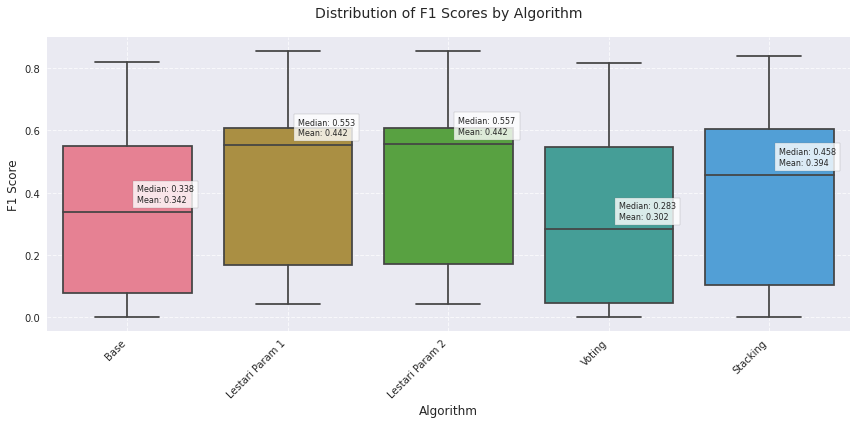


Detailed Statistics:
                 count      mean       std       min       25%       50%  \
algorithm                                                                  
Base              33.0  0.342205  0.234532  0.000000  0.079714  0.338164   
Lestari Param 1  165.0  0.441954  0.240475  0.043106  0.168495  0.552846   
Lestari Param 2  165.0  0.442148  0.240891  0.043094  0.170431  0.557078   
Stacking         165.0  0.394372  0.256367  0.000000  0.105419  0.457652   
Voting           165.0  0.301703  0.236079  0.000000  0.046138  0.283429   

                      75%       max  
algorithm                            
Base             0.550459  0.821293  
Lestari Param 1  0.606848  0.855019  
Lestari Param 2  0.606838  0.856115  
Stacking         0.604265  0.840149  
Voting           0.546405  0.816794  


In [35]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set style for better visualization
plt.style.use('seaborn')
sns.set_palette("husl")

# Create figure with larger size
plt.figure(figsize=(12, 6))

# Create box plot
bp = sns.boxplot(x='algorithm', y='f1_score', data=df_raw_filtered)

# Customize the plot
plt.title('Distribution of F1 Scores by Algorithm', pad=20, fontsize=14)
plt.xlabel('Algorithm', fontsize=12)
plt.ylabel('F1 Score', fontsize=12)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Add grid for better readability
plt.grid(True, linestyle='--', alpha=0.7)

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Add statistics annotations
for i, algorithm in enumerate(df_raw_filtered['algorithm'].unique()):
    # Get statistics for each algorithm
    stats = df_raw_filtered[df_raw_filtered['algorithm'] == algorithm]['f1_score']
    
    # Calculate statistics
    median = stats.median()
    mean = stats.mean()
    
    # Add annotations
    plt.annotate(f'Median: {median:.3f}\nMean: {mean:.3f}', 
                xy=(i, median),
                xytext=(10, 10),
                textcoords='offset points',
                fontsize=8,
                bbox=dict(facecolor='white', edgecolor='gray', alpha=0.8))

# Show plot
plt.show()

# Print detailed statistics
print("\nDetailed Statistics:")
print(df_raw_filtered.groupby('algorithm')['f1_score'].describe())

In [38]:
# https://claude.ai/chat/3e57af14-7211-4303-b83b-c7aed5491009

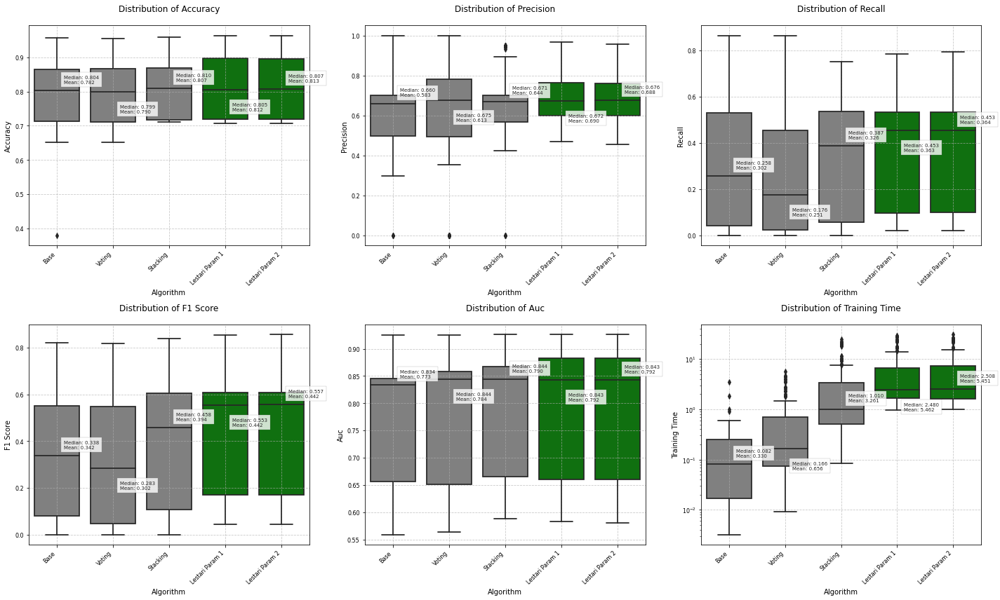

In [4]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Define metrics to plot
metrics = ['accuracy', 'precision', 'recall', 'f1_score', 'auc', 'training_time']

# Define order
algorithm_order = ['Base', 'Voting', 'Stacking', 'Lestari Param 1', 'Lestari Param 2']

# Define colors
colors = ['gray', 'gray', 'gray', 'green', 'green']

# Create subplot grid (2x3)
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.ravel()

# Set style
plt.style.use('seaborn')

# Create box plots for each metric
for idx, metric in enumerate(metrics):
    # Create box plot with specified order
    bp = sns.boxplot(x='algorithm', y=metric, data=df_raw_filtered, 
                    order=algorithm_order, 
                    ax=axes[idx],
                    palette=colors)
    
    # Customize each subplot
    axes[idx].set_title(f'Distribution of {metric.replace("_", " ").title()}', pad=20, fontsize=12)
    axes[idx].set_xlabel('Algorithm', fontsize=10)
    axes[idx].set_ylabel(metric.replace("_", " ").title(), fontsize=10)
    
    # Set rotation for x-axis labels
    axes[idx].set_xticklabels(axes[idx].get_xticklabels(), rotation=45, ha='right')
    
    # Set tick parameters
    axes[idx].tick_params(axis='x', labelsize=8)
    axes[idx].tick_params(axis='y', labelsize=8)
    
    # Add grid
    axes[idx].grid(True, linestyle='--', alpha=0.7)
    
    # Add statistics annotations
    for i, algorithm in enumerate(algorithm_order):
        stats = df_raw_filtered[df_raw_filtered['algorithm'] == algorithm][metric]
        if not stats.empty:  # Only add annotation if there's data
            median = stats.median()
            mean = stats.mean()
            
            # Position annotations alternately above and below to avoid overlap
            if i % 2 == 0:
                xytext = (10, 10)
            else:
                xytext = (10, -30)
                
            axes[idx].annotate(f'Median: {median:.3f}\nMean: {mean:.3f}', 
                              xy=(i, median),
                              xytext=xytext,
                              textcoords='offset points',
                              fontsize=7,
                              bbox=dict(facecolor='white', edgecolor='gray', alpha=0.8))

    # Set y-scale to log for training_time
    if metric == 'training_time':
        axes[idx].set_yscale('log')

# Adjust layout
plt.tight_layout()
plt.show()

# # Print detailed statistics for each metric
# print("\nDetailed Statistics:")
# for metric in metrics:
#     print(f"\n{metric.upper()} Statistics:")
#     stats_df = df_raw_filtered.groupby('algorithm')[metric].describe()
#     # Reorder the index according to algorithm_order
#     stats_df = stats_df.reindex(algorithm_order)
#     print(stats_df)

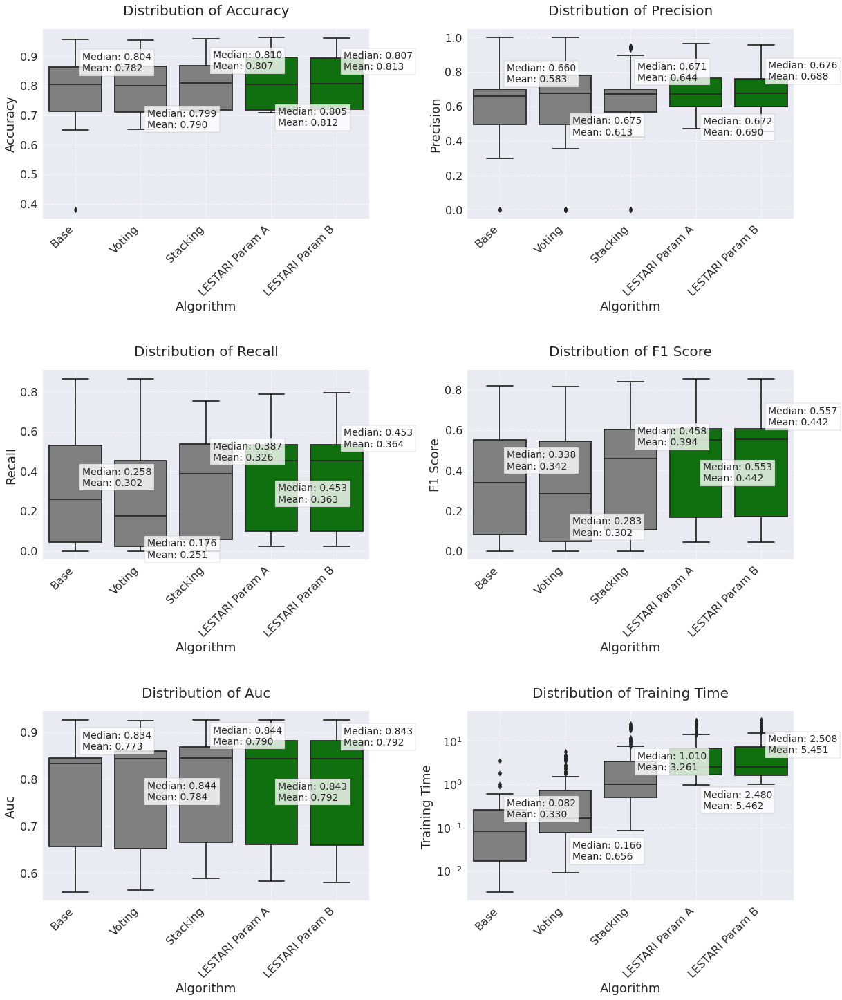

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Define metrics to plot
metrics = ['accuracy', 'precision', 'recall', 'f1_score', 'auc', 'training_time']

# Define order dengan nama yang diperbarui (LESTARI Param A dan LESTARI Param B)
algorithm_order = ['Base', 'Voting', 'Stacking', 'LESTARI Param A', 'LESTARI Param B']

# Define colors
colors = ['gray', 'gray', 'gray', 'green', 'green']

# Create subplot grid (3x2)
fig, axes = plt.subplots(3, 2, figsize=(18, 21))
axes = axes.ravel()

# Set style
plt.style.use('seaborn')

# Create box plots for each metric
for idx, metric in enumerate(metrics):
    # Create box plot with specified order
    # Mapping nama lama ke nama baru untuk filter data
    df_plot = df_raw_filtered.copy()
    df_plot['algorithm'] = df_plot['algorithm'].replace({
        'Lestari Param 1': 'LESTARI Param A', 
        'Lestari Param 2': 'LESTARI Param B'
    })
    
    bp = sns.boxplot(x='algorithm', y=metric, data=df_plot, 
                    order=algorithm_order, 
                    ax=axes[idx],
                    palette=colors)
    
    # Customize each subplot - font size diperbesar
    axes[idx].set_title(f'Distribution of {metric.replace("_", " ").title()}', pad=20, fontsize=20)
    axes[idx].set_xlabel('Algorithm', fontsize=18)
    axes[idx].set_ylabel(metric.replace("_", " ").title(), fontsize=18)
    
    # Set rotation for x-axis labels dan perbesar font
    axes[idx].set_xticklabels(axes[idx].get_xticklabels(), rotation=45, ha='right', fontsize=16)
    
    # Set tick parameters - ukuran font diperbesar
    axes[idx].tick_params(axis='x', labelsize=16)
    axes[idx].tick_params(axis='y', labelsize=16)
    
    # Add grid
    axes[idx].grid(True, linestyle='--', alpha=0.7)
    
    # Add statistics annotations with larger font
    for i, algorithm in enumerate(algorithm_order):
        # Mapping nama baru ke nama lama untuk filter data
        algo_filter = algorithm
        if algorithm == 'LESTARI Param A':
            algo_filter = 'Lestari Param 1'
        elif algorithm == 'LESTARI Param B':
            algo_filter = 'Lestari Param 2'
            
        stats = df_raw_filtered[df_raw_filtered['algorithm'] == algo_filter][metric]
        if not stats.empty:  # Only add annotation if there's data
            median = stats.median()
            mean = stats.mean()
            
            # Position annotations alternately above and below to avoid overlap
            if i % 2 == 0:
                xytext = (10, 20)
            else:
                xytext = (10, -60)  # Diperbesar jaraknya ke bawah
                
            axes[idx].annotate(f'Median: {median:.3f}\nMean: {mean:.3f}', 
                              xy=(i, median),
                              xytext=xytext,
                              textcoords='offset points',
                              fontsize=14,  # Ukuran font anotasi diperbesar
                              bbox=dict(facecolor='white', edgecolor='gray', alpha=0.8))
    
    # Set y-scale to log for training_time
    if metric == 'training_time':
        axes[idx].set_yscale('log')

# Adjust layout dengan spacing yang lebih besar
plt.tight_layout(pad=4.0)
plt.subplots_adjust(hspace=0.8, wspace=0.3)  # Memperbesar jarak antar subplot

# Save figure with high resolution
plt.savefig('boxplot_metrics.png', dpi=300, bbox_inches='tight')

plt.show()

In [7]:
import pandas as pd
import numpy as np
from tabulate import tabulate

# Define metrics to process
metrics = ['accuracy', 'precision', 'recall', 'f1_score', 'auc', 'training_time']

# Define algorithm mapping (original names to display names)
algorithm_mapping = {
    'Base': 'Base Learner',
    'Voting': 'Voting',
    'Stacking': 'Stacking',
    'Lestari Param 1': 'LESTARI Param A',
    'Lestari Param 2': 'LESTARI Param B'
}

# Initialize an empty list to store results
results = []

# Process each metric directly without dataset grouping
for metric in metrics:
    # Initialize a row dict - no dataset column
    row = {
        'Metric Name': metric.replace('_', ' ').title()
    }
    
    # Calculate mean and variance for each algorithm
    max_mean = -float('inf')
    best_algo = None
    
    for orig_algo, display_algo in algorithm_mapping.items():
        algo_data = df_raw_filtered[df_raw_filtered['algorithm'] == orig_algo][metric]
        if not algo_data.empty:
            mean = algo_data.mean()
            var = algo_data.var()
            row[display_algo] = f"{mean:.4f} ± {var:.4f}"
            
            # Track the algorithm with highest mean (except for training_time where lower is better)
            if metric != 'training_time' and mean > max_mean:
                max_mean = mean
                best_algo = display_algo
            elif metric == 'training_time' and (max_mean == -float('inf') or mean < max_mean):
                max_mean = mean
                best_algo = display_algo
    
    results.append(row)

# Create results dataframe
results_df = pd.DataFrame(results)

# Create a styled version of the table using HTML instead of pandas styling
html_output = '<table border="1" class="dataframe">\n'
html_output += '  <thead>\n    <tr>\n'
for col in results_df.columns:
    html_output += f'      <th>{col}</th>\n'
html_output += '    </tr>\n  </thead>\n  <tbody>\n'

# Process each row
for _, row in results_df.iterrows():
    html_output += '    <tr>\n'
    
    # Find the best algorithm for this row
    best_value = None
    best_algo = None
    metric = row['Metric Name'].lower().replace(' ', '_')
    
    # Identify the best algorithm
    for orig_algo, display_algo in algorithm_mapping.items():
        if display_algo not in row:
            continue
            
        value_str = row[display_algo]
        if not pd.isna(value_str) and value_str:
            try:
                # Extract mean from "mean ± var" format
                mean_value = float(value_str.split('±')[0].strip())
                
                # For training time, lower is better
                if metric == 'training_time':
                    if best_value is None or mean_value < best_value:
                        best_value = mean_value
                        best_algo = display_algo
                else:
                    if best_value is None or mean_value > best_value:
                        best_value = mean_value
                        best_algo = display_algo
            except:
                pass
    
    # Add each cell to the row
    for col in results_df.columns:
        cell_value = row[col]
        if col == best_algo:
            # Highlight the best algorithm
            html_output += f'      <td><b style="color:green">{cell_value}</b></td>\n'
        else:
            html_output += f'      <td>{cell_value}</td>\n'
            
    html_output += '    </tr>\n'

html_output += '  </tbody>\n</table>'

# Display HTML table in Jupyter notebook
from IPython.display import HTML, display
display(HTML(html_output))

# Also create a plain version for console output
print("\nMetrics Comparison Table:")
print(tabulate(results_df, headers='keys', tablefmt='pretty', showindex=False))

# Save results to CSV
results_df.to_csv('metrics_comparison_no_dataset.csv', index=False)
print("\nResults saved to 'metrics_comparison_no_dataset.csv'")

Metric Name,Base Learner,Voting,Stacking,LESTARI Param A,LESTARI Param B
Accuracy,0.7819 ± 0.0113,0.7897 ± 0.0061,0.8071 ± 0.0062,0.8125 ± 0.0070,0.8126 ± 0.0069
Precision,0.5827 ± 0.0578,0.6127 ± 0.0636,0.6435 ± 0.0262,0.6899 ± 0.0150,0.6884 ± 0.0150
Recall,0.3024 ± 0.0658,0.2508 ± 0.0566,0.3255 ± 0.0562,0.3630 ± 0.0515,0.3636 ± 0.0518
F1 Score,0.3422 ± 0.0550,0.3017 ± 0.0557,0.3944 ± 0.0657,0.4420 ± 0.0578,0.4421 ± 0.0580
Auc,0.7732 ± 0.0130,0.7842 ± 0.0137,0.7898 ± 0.0127,0.7923 ± 0.0130,0.7921 ± 0.0131
Training Time,0.3299 ± 0.4636,0.6565 ± 1.1895,3.2612 ± 26.1249,5.4617 ± 41.2166,5.4512 ± 40.0988



Metrics Comparison Table:
+---------------+-----------------+-----------------+------------------+------------------+------------------+
|  Metric Name  |  Base Learner   |     Voting      |     Stacking     | LESTARI Param A  | LESTARI Param B  |
+---------------+-----------------+-----------------+------------------+------------------+------------------+
|   Accuracy    | 0.7819 ± 0.0113 | 0.7897 ± 0.0061 | 0.8071 ± 0.0062  | 0.8125 ± 0.0070  | 0.8126 ± 0.0069  |
|   Precision   | 0.5827 ± 0.0578 | 0.6127 ± 0.0636 | 0.6435 ± 0.0262  | 0.6899 ± 0.0150  | 0.6884 ± 0.0150  |
|    Recall     | 0.3024 ± 0.0658 | 0.2508 ± 0.0566 | 0.3255 ± 0.0562  | 0.3630 ± 0.0515  | 0.3636 ± 0.0518  |
|   F1 Score    | 0.3422 ± 0.0550 | 0.3017 ± 0.0557 | 0.3944 ± 0.0657  | 0.4420 ± 0.0578  | 0.4421 ± 0.0580  |
|      Auc      | 0.7732 ± 0.0130 | 0.7842 ± 0.0137 | 0.7898 ± 0.0127  | 0.7923 ± 0.0130  | 0.7921 ± 0.0131  |
| Training Time | 0.3299 ± 0.4636 | 0.6565 ± 1.1895 | 3.2612 ± 26.1249 | 5.4617 ± 41.

In [6]:
import pandas as pd
import numpy as np
from tabulate import tabulate

# Define metrics to process
metrics = ['accuracy', 'precision', 'recall', 'f1_score', 'auc', 'training_time']

# Define algorithm mapping (original names to display names)
algorithm_mapping = {
    'Base': 'Base Learner',
    'Voting': 'Voting',
    'Stacking': 'Stacking',
    'Lestari Param 1': 'LESTARI Param A',
    'Lestari Param 2': 'LESTARI Param B'
}

# Check if dataset name is in the dataframe
if 'dataset' in df_raw_filtered.columns:
    # Get unique dataset names
    datasets = df_raw_filtered['dataset'].unique()
else:
    # If no dataset column, create a default name
    datasets = ['Dataset']
    df_raw_filtered['dataset'] = 'Dataset'

# Initialize an empty list to store results
results = []

# Process each dataset
for dataset in datasets:
    df_dataset = df_raw_filtered[df_raw_filtered['dataset'] == dataset]
    
    # Process each metric
    for metric in metrics:
        # Initialize a row dict
        row = {
            'Dataset Name': dataset,
            'Metric Name': metric.replace('_', ' ').title()
        }
        
        # Calculate mean and variance for each algorithm
        max_mean = -float('inf')
        best_algo = None
        
        for orig_algo, display_algo in algorithm_mapping.items():
            algo_data = df_dataset[df_dataset['algorithm'] == orig_algo][metric]
            if not algo_data.empty:
                mean = algo_data.mean()
                var = algo_data.var()
                row[display_algo] = f"{mean:.4f} ± {var:.4f}"
                
                # Track the algorithm with highest mean (except for training_time where lower is better)
                if metric != 'training_time' and mean > max_mean:
                    max_mean = mean
                    best_algo = display_algo
                elif metric == 'training_time' and (max_mean == -float('inf') or mean < max_mean):
                    max_mean = mean
                    best_algo = display_algo
        
        results.append(row)

# Create results dataframe
results_df = pd.DataFrame(results)

# Create a styled version of the table using HTML instead of pandas styling
html_output = '<table border="1" class="dataframe">\n'
html_output += '  <thead>\n    <tr>\n'
for col in results_df.columns:
    html_output += f'      <th>{col}</th>\n'
html_output += '    </tr>\n  </thead>\n  <tbody>\n'

# Process each row
for _, row in results_df.iterrows():
    html_output += '    <tr>\n'
    
    # Find the best algorithm for this row
    best_value = None
    best_algo = None
    metric = row['Metric Name'].lower().replace(' ', '_')
    
    # Identify the best algorithm
    for orig_algo, display_algo in algorithm_mapping.items():
        if display_algo not in row:
            continue
            
        value_str = row[display_algo]
        if not pd.isna(value_str) and value_str:
            try:
                # Extract mean from "mean ± var" format
                mean_value = float(value_str.split('±')[0].strip())
                
                # For training time, lower is better
                if metric == 'training_time':
                    if best_value is None or mean_value < best_value:
                        best_value = mean_value
                        best_algo = display_algo
                else:
                    if best_value is None or mean_value > best_value:
                        best_value = mean_value
                        best_algo = display_algo
            except:
                pass
    
    # Add each cell to the row
    for col in results_df.columns:
        cell_value = row[col]
        if col == best_algo:
            # Highlight the best algorithm
            html_output += f'      <td><b style="color:green">{cell_value}</b></td>\n'
        else:
            html_output += f'      <td>{cell_value}</td>\n'
            
    html_output += '    </tr>\n'

html_output += '  </tbody>\n</table>'

# Display HTML table in Jupyter notebook
from IPython.display import HTML, display
display(HTML(html_output))

# Also create a plain version for console output
print("\nMetrics Comparison Table:")
print(tabulate(results_df, headers='keys', tablefmt='pretty', showindex=False))

# Save results to CSV
results_df.to_csv('metrics_comparison.csv', index=False)
print("\nResults saved to 'metrics_comparison.csv'")

Dataset Name,Metric Name,Base Learner,Voting,Stacking,LESTARI Param A,LESTARI Param B
kaggle,Accuracy,0.8828 ± 0.0008,0.8820 ± 0.0006,0.8998 ± 0.0013,0.9159 ± 0.0008,0.9155 ± 0.0008
kaggle,Precision,0.6574 ± 0.0743,0.7284 ± 0.0659,0.7318 ± 0.0256,0.8216 ± 0.0109,0.8180 ± 0.0112
kaggle,Recall,0.3085 ± 0.0423,0.2652 ± 0.0411,0.4388 ± 0.0374,0.5050 ± 0.0275,0.5040 ± 0.0281
kaggle,F1 Score,0.3941 ± 0.0448,0.3489 ± 0.0457,0.5356 ± 0.0370,0.6159 ± 0.0239,0.6140 ± 0.0246
kaggle,Auc,0.8614 ± 0.0014,0.8841 ± 0.0007,0.8885 ± 0.0009,0.8971 ± 0.0006,0.8970 ± 0.0006
kaggle,Training Time,0.0585 ± 0.0064,0.1132 ± 0.0105,0.7564 ± 0.4791,2.0412 ± 1.5111,1.8905 ± 0.8376
ibm,Accuracy,0.7853 ± 0.0020,0.7811 ± 0.0018,0.8068 ± 0.0002,0.8049 ± 0.0000,0.8056 ± 0.0000
ibm,Precision,0.6811 ± 0.0091,0.6951 ± 0.0110,0.6810 ± 0.0093,0.6779 ± 0.0003,0.6792 ± 0.0004
ibm,Recall,0.4730 ± 0.0389,0.4432 ± 0.0438,0.4930 ± 0.0105,0.5066 ± 0.0029,0.5090 ± 0.0027
ibm,F1 Score,0.5197 ± 0.0163,0.4930 ± 0.0177,0.5665 ± 0.0098,0.5776 ± 0.0013,0.5798 ± 0.0012



Metrics Comparison Table:
+--------------+---------------+-----------------+-----------------+------------------+-------------------+-------------------+
| Dataset Name |  Metric Name  |  Base Learner   |     Voting      |     Stacking     |  LESTARI Param A  |  LESTARI Param B  |
+--------------+---------------+-----------------+-----------------+------------------+-------------------+-------------------+
|    kaggle    |   Accuracy    | 0.8828 ± 0.0008 | 0.8820 ± 0.0006 | 0.8998 ± 0.0013  |  0.9159 ± 0.0008  |  0.9155 ± 0.0008  |
|    kaggle    |   Precision   | 0.6574 ± 0.0743 | 0.7284 ± 0.0659 | 0.7318 ± 0.0256  |  0.8216 ± 0.0109  |  0.8180 ± 0.0112  |
|    kaggle    |    Recall     | 0.3085 ± 0.0423 | 0.2652 ± 0.0411 | 0.4388 ± 0.0374  |  0.5050 ± 0.0275  |  0.5040 ± 0.0281  |
|    kaggle    |   F1 Score    | 0.3941 ± 0.0448 | 0.3489 ± 0.0457 | 0.5356 ± 0.0370  |  0.6159 ± 0.0239  |  0.6140 ± 0.0246  |
|    kaggle    |      Auc      | 0.8614 ± 0.0014 | 0.8841 ± 0.0007 | 0.8885 ±

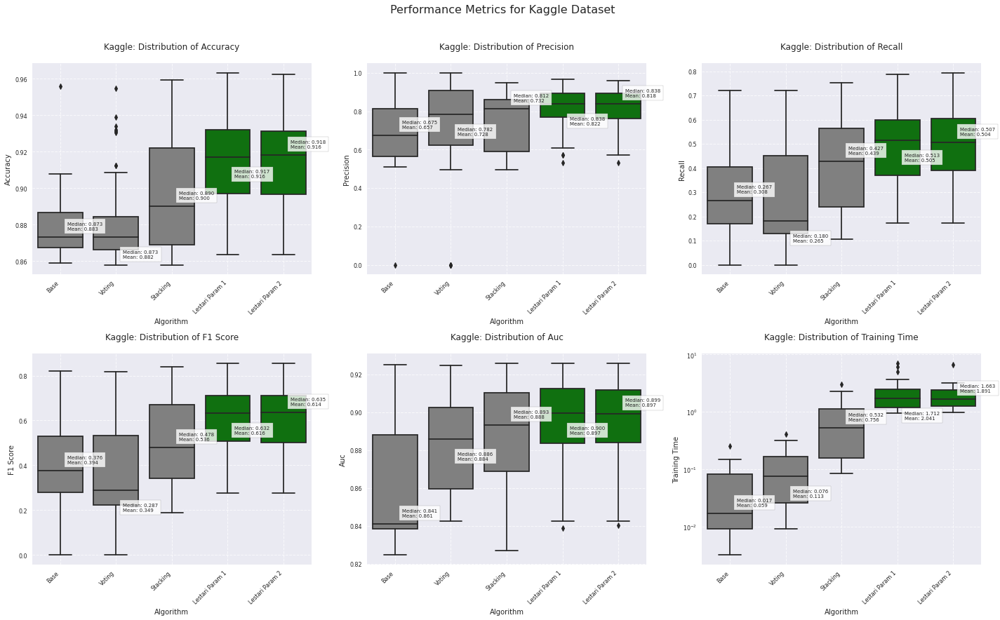

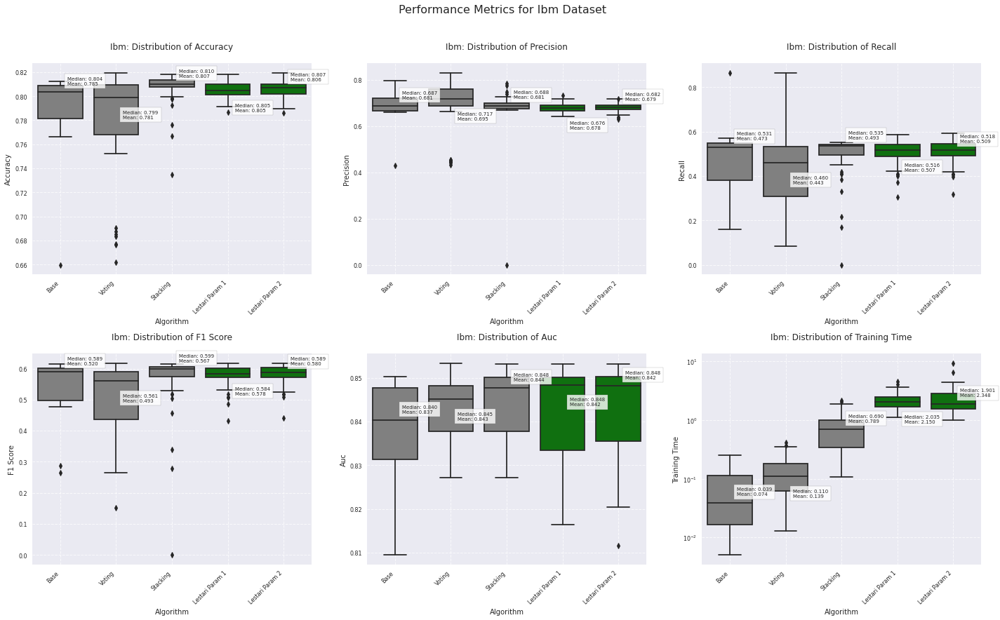

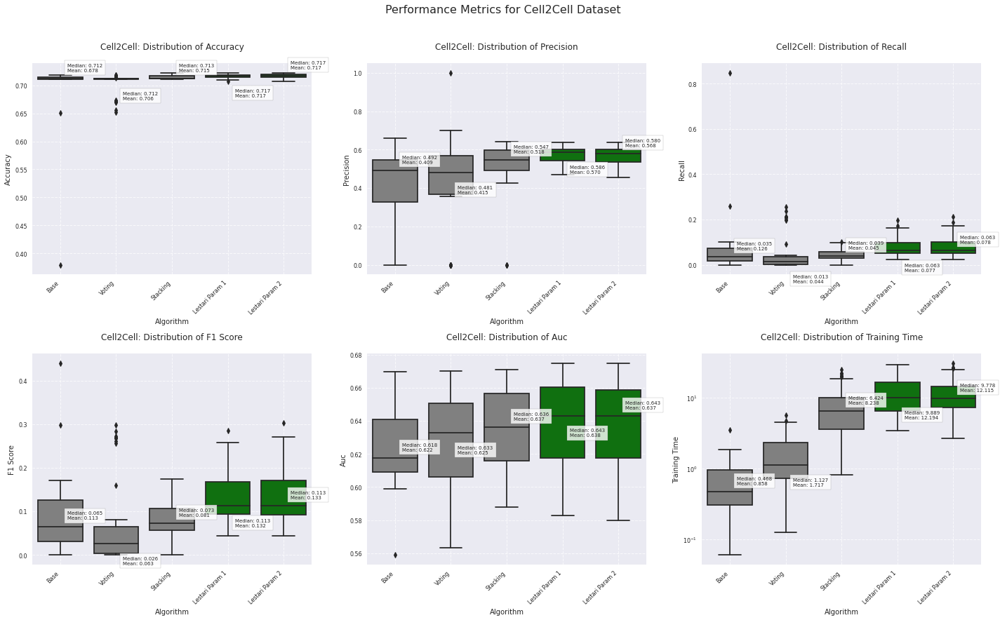

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Define metrics to plot
metrics = ['accuracy', 'precision', 'recall', 'f1_score', 'auc', 'training_time']

# Define order and colors
algorithm_order = ['Base', 'Voting', 'Stacking', 'Lestari Param 1', 'Lestari Param 2']
colors = ['gray', 'gray', 'gray', 'green', 'green']

# Get unique datasets
datasets = df_raw_filtered['dataset'].unique()

# Create subplots for each dataset
for dataset_name in datasets:
    # Filter data for current dataset
    dataset_df = df_raw_filtered[df_raw_filtered['dataset'] == dataset_name]
    
    # Create subplot grid (2x3)
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    axes = axes.ravel()
    
    # Set style
    plt.style.use('seaborn')
    
    # Create box plots for each metric
    for idx, metric in enumerate(metrics):
        # Create box plot with specified order
        bp = sns.boxplot(x='algorithm', y=metric, data=dataset_df, 
                        order=algorithm_order, 
                        ax=axes[idx],
                        palette=colors)
        
        # Customize each subplot
        axes[idx].set_title(f'{dataset_name.title()}: Distribution of {metric.replace("_", " ").title()}', 
                          pad=20, fontsize=12)
        axes[idx].set_xlabel('Algorithm', fontsize=10)
        axes[idx].set_ylabel(metric.replace("_", " ").title(), fontsize=10)
        
        # Set rotation for x-axis labels
        axes[idx].set_xticklabels(axes[idx].get_xticklabels(), rotation=45, ha='right')
        
        # Set tick parameters
        axes[idx].tick_params(axis='x', labelsize=8)
        axes[idx].tick_params(axis='y', labelsize=8)
        
        # Add grid
        axes[idx].grid(True, linestyle='--', alpha=0.7)
        
        # Add statistics annotations
        for i, algorithm in enumerate(algorithm_order):
            stats = dataset_df[dataset_df['algorithm'] == algorithm][metric]
            if not stats.empty:  # Only add annotation if there's data
                median = stats.median()
                mean = stats.mean()
                
                # Position annotations alternately above and below to avoid overlap
                if i % 2 == 0:
                    xytext = (10, 10)
                else:
                    xytext = (10, -30)
                    
                axes[idx].annotate(f'Median: {median:.3f}\nMean: {mean:.3f}', 
                                  xy=(i, median),
                                  xytext=xytext,
                                  textcoords='offset points',
                                  fontsize=7,
                                  bbox=dict(facecolor='white', edgecolor='gray', alpha=0.8))

        # Set y-scale to log for training_time
        if metric == 'training_time':
            axes[idx].set_yscale('log')

    # Add main title for the dataset
    plt.suptitle(f'Performance Metrics for {dataset_name.title()} Dataset', 
                fontsize=16, y=1.02)
    
    # Adjust layout
    plt.tight_layout()
    plt.show()